In [1]:
import numpy as np
np.__version__

'1.19.5'

In [2]:
import pandas as pd
pd.__version__

'1.1.5'

In [3]:
import matplotlib
matplotlib.__version__

'3.3.4'

In [4]:
import matplotlib.pyplot as plt

In [5]:
# Adjust plot size
#options(repr.plot.width=16, repr.plot.height=6)

# For some reason, if this is in the same cell as the import command, it doesn't work.
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [6]:
import scipy
scipy.__version__

'1.5.4'

In [7]:
from scipy import stats

In [8]:
import seaborn as sns

In [9]:
default_max_columns=pd.get_option('display.max_columns')

In [10]:
default_max_rows=pd.get_option('display.max_rows')

In [11]:
default_precision=pd.get_option('display.precision')

In [12]:
pd.set_option('display.precision', 2)

In [13]:
default_threshold=np.get_printoptions()['threshold']

In [14]:
#np.set_printoptions(threshold=10000000)

# Read meta data

In [15]:
meta = pd.read_csv('20210428-EV/metadata.csv')

In [16]:
meta.head()

,Rand 2 Batch_order,D-plex Sequencing ID,Lexogen Sequencing ID,Diagnosis
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,"
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,"
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,"
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,"


In [17]:
meta.rename(columns={"Rand 2 Batch_order": "subject"},inplace=True)
meta.rename(columns={"D-plex Sequencing ID": "dplex"},inplace=True)
meta.rename(columns={"Lexogen Sequencing ID": "lexogen"},inplace=True)
meta.rename(columns={"Diagnosis": "diag"},inplace=True)
#meta.set_index('subject',inplace=True)

In [18]:
meta

,subject,dplex,lexogen,diag
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,"
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,"
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,"
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,"
5,1_6,SFHH005f,SFHH006f,"Diffuse Astrocytoma, IDH-mutant,"
6,1_7,SFHH005g,SFHH006g,"Oligodendroglioma, IDH-mutant, 1p19q codeleted"
7,1_8,SFHH005h,SFHH006h,"GBM, IDH1R132H WT,"
8,1_9,SFHH005i,SFHH006i,"GBM, IDH-mutant,"
9,1_10,SFHH005j,SFHH006j,"Diffuse Astrocytoma, IDH-mutant,"


In [19]:
meta[['disease','idh','x1p19q']] = meta['diag'].str.split(",", 2, expand=True)
#meta.drop('diag',axis='columns',inplace=True)

In [20]:
meta.head()

,subject,dplex,lexogen,diag,disease,idh,x1p19q
0,1_1,SFHH005a,SFHH006a,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,
1,1_2,SFHH005b,SFHH006b,"Oligodendroglioma, IDH-mutant, 1p19q codeleted",Oligodendroglioma,IDH-mutant,1p19q codeleted
2,1_3,SFHH005c,SFHH006c,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,1_4,SFHH005d,SFHH006d,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,1_5,SFHH005e,SFHH006e,"GBM, IDH1R132H WT,",GBM,IDH1R132H WT,


# Read raw matrix

In [21]:
df = pd.read_csv('20210428-EV/report.csv',index_col=0,header=None)

In [22]:
df.shape

(309, 528)

In [23]:
df.head(12)

,1,2,3,4,5,6,7,8,9,10,...,519,520,521,522,523,524,525,526,527,528
0,,,,,,,,,,,,,,,,,,,,,
,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005ab,SFHH005ab,SFHH005ab,SFHH005ab,...,SFHH006y,SFHH006y,SFHH006y,SFHH006y,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z
---,---,---,---,---,---,---,---,---,---,---,...,---,---,---,---,---,---,---,---,---,---
Subject,3_5,3_5,3_5,3_5,3_5,3_5,3_6,3_6,3_6,3_6,...,3_3,3_3,3_3,3_3,3_4,3_4,3_4,3_4,3_4,3_4
Lab kit,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,...,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen
Trimmer,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,...,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3
Raw Read Count,7706323,7706323,7706323,7706323,7706323,7706323,10555114,10555114,10555114,10555114,...,10323625,10323625,10323625,10323625,13959130,13959130,13959130,13959130,13959130,13959130
Raw Read Length,201,201,201,201,201,201,201,201,201,201,...,201,201,201,201,201,201,201,201,201,201
Trimmed Read Count,4578177,7054912,7067406,4879448,4877655,4877495,8524196,10205171,10212051,8828603,...,3781877,3796529,3738351,3735601,4571854,4941457,4965205,5007069,4953640,4951125
Trimmed Ave Read Length,57.8849,60.3426,60.5684,132.375,131.86,131.853,57.5903,67.8537,67.9501,152.468,...,35.3093,40.5618,36.6429,35.0324,30.66,35.8833,36.3939,42.7485,39.1607,37.2782


In [24]:
df.drop("---",inplace=True)

In [25]:
df.shape

(308, 528)

In [26]:
df.rename({'  ':'sample'},axis='rows',inplace=True)

In [27]:
df

,1,2,3,4,5,6,7,8,9,10,...,519,520,521,522,523,524,525,526,527,528
0,,,,,,,,,,,,,,,,,,,,,
sample,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005aa,SFHH005ab,SFHH005ab,SFHH005ab,SFHH005ab,...,SFHH006y,SFHH006y,SFHH006y,SFHH006y,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z,SFHH006z
Subject,3_5,3_5,3_5,3_5,3_5,3_5,3_6,3_6,3_6,3_6,...,3_3,3_3,3_3,3_3,3_4,3_4,3_4,3_4,3_4,3_4
Lab kit,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,D-plex,...,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen,Lexogen
Trimmer,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,...,bbduk3,cutadapt1,cutadapt2,cutadapt3,bbduk1,bbduk2,bbduk3,cutadapt1,cutadapt2,cutadapt3
Raw Read Count,7706323,7706323,7706323,7706323,7706323,7706323,10555114,10555114,10555114,10555114,...,10323625,10323625,10323625,10323625,13959130,13959130,13959130,13959130,13959130,13959130
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
rnL1PA6,538,3529,3651,612,612,612,1527,4280,4335,2181,...,37,46,46,46,83,88,88,81,81,81
rnSSU-rRNA_Hsa,773,825,825,912,912,912,907,939,942,927,...,4645,4500,4558,4573,2894,2965,2957,2896,2954,2960
rnL1M2,297,3056,3268,524,524,524,1311,7635,7491,1546,...,43,NaN,NaN,NaN,NaN,7,8,1,1,1


In [28]:
df=df.T

In [29]:
df.head()

,sample,Subject,Lab kit,Trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,rnHY4,rnL1MA2,rnL1MA3,rnL1M1,rnL1MA4A,rnL1PA6,rnSSU-rRNA_Hsa,rnL1M2,rnL1MB7,rnA-rich
1,SFHH005aa,3_5,D-plex,bbduk1,7706323,201,4578177,57.8849,99328,2.16,...,33,425,559,389,87,538,773,297,306,87
2,SFHH005aa,3_5,D-plex,bbduk2,7706323,201,7054912,60.3426,140222,1.98,...,33,2756,1627,3296,2103,3529,825,3056,1883,5067
3,SFHH005aa,3_5,D-plex,bbduk3,7706323,201,7067406,60.5684,138584,1.96,...,33,2794,1668,3426,2236,3651,825,3268,2038,5298
4,SFHH005aa,3_5,D-plex,cutadapt1,7706323,201,4879448,132.375,105508,2.16,...,33,650,765,604,175,612,912,524,594,273
5,SFHH005aa,3_5,D-plex,cutadapt2,7706323,201,4877655,131.86,119834,2.45,...,33,650,765,604,175,612,912,524,594,273


In [30]:
df=df.merge(meta,left_on='Subject',right_on='subject')

In [31]:
df.head()

,sample,Subject,Lab kit,Trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,rnL1M2,rnL1MB7,rnA-rich,subject,dplex,lexogen,diag,disease,idh,x1p19q
0,SFHH005aa,3_5,D-plex,bbduk1,7706323,201,4578177,57.8849,99328,2.16,...,297,306,87,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
1,SFHH005aa,3_5,D-plex,bbduk2,7706323,201,7054912,60.3426,140222,1.98,...,3056,1883,5067,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
2,SFHH005aa,3_5,D-plex,bbduk3,7706323,201,7067406,60.5684,138584,1.96,...,3268,2038,5298,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,SFHH005aa,3_5,D-plex,cutadapt1,7706323,201,4879448,132.375,105508,2.16,...,524,594,273,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,SFHH005aa,3_5,D-plex,cutadapt2,7706323,201,4877655,131.86,119834,2.45,...,524,594,273,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,


In [32]:
df.columns

Index(['sample', 'Subject', 'Lab kit', 'Trimmer', 'Raw Read Count',
       'Raw Read Length', 'Trimmed Read Count', 'Trimmed Ave Read Length',
       'STAR Aligned to Transcriptome', 'STAR Aligned to Transcriptome %',
       ...
       'rnL1M2', 'rnL1MB7', 'rnA-rich', 'subject', 'dplex', 'lexogen', 'diag',
       'disease', 'idh', 'x1p19q'],
      dtype='object', length=315)


---
Subject
Lab kit
Trimmer
Raw Read Count
Raw Read Length
Trimmed Read Count
Trimmed Ave Read Length
STAR Aligned to Transcriptome
STAR Aligned to Transcriptome %
STAR Aligned to Genome
STAR Aligned to Genome %
STAR Unaligned
STAR Unaligned %
STAR Unmapped
STAR Unmapped %
Bowtie2 Aligned to hg38 (1)
Bowtie2 Aligned to hg38 (1) %
STAR Aligned to mirna
STAR Aligned to mirna %
Bowtie Aligned to mirna
Bowtie Aligned to mirna %
Bowtie2 Aligned to mirna
Bowtie2 Aligned to mirna %
Bowtie2 Aligned to phiX
Bowtie2 Aligned to phiX %
Bowtie2 Aligned to Salmonella
Bowtie2 Aligned to Salmonella %
Bowtie2 Aligned to Burkholderia
Bowtie2 Aligned to Burkholderia %
STAR Gene Counts
LOC102724859
RPH3A
PLCE1
ADGRG6
CCDC151
IGF2
P2RX6
PIGG
MAPT
MIR486-1
MIR486-2
RO60
RWDD2A
RARS2
LOC100335030
NAALADL2
HASPIN
NOL4L
GOLGA2P10
KCNN3
RNA45SN2
GREM2
RNA45SN3
RNA45SN4
RNA45SN1
RNA45SN5
PACS2
MECP2
CASP1P2
FGD2
KIF18B
MIRLET7BHG
FRMD4A
ZMYM2
GRB10
RNA28SN2
RNA28SN3
RNA28SN1
RNA28SN5
RNA28SN4
AHDC1
INS-IGF2
MICAL2
NOTCH2NLB
TTN
TTC21A
TUBGCP4
WSB1
EDEM3
NACC2
STAR miRNA Counts
hsa-mir-4329-hairpin
hsa-mir-5588-hairpin
hsa-mir-92b-hairpin
hsa-mir-4271-hairpin
hsa-mir-548u-hairpin
hsa-mir-1260a-hairpin
hsa-mir-944-hairpin
hsa-mir-10226-hairpin
hsa-mir-4538-hairpin
hsa-mir-4538-mature
hsa-mir-552-hairpin
hsa-mir-486-1-hairpin
hsa-mir-486-2-hairpin
hsa-mir-3908-hairpin
hsa-mir-3168-hairpin
hsa-mir-3168-mature
hsa-mir-4314-hairpin
hsa-mir-3613-hairpin
hsa-mir-6735-hairpin
hsa-mir-8086-hairpin
hsa-mir-137-hairpin
hsa-mir-552-3p-mature
hsa-mir-4668-hairpin
hsa-mir-4668-5p-mature
hsa-mir-484-hairpin
hsa-mir-486-5p-mature
hsa-mir-216b-hairpin
hsa-mir-3658-hairpin
hsa-mir-4283-2-hairpin
hsa-mir-4283-1-hairpin
hsa-mir-1273c-hairpin
hsa-mir-567-hairpin
hsa-mir-3183-hairpin
hsa-mir-1303-hairpin
hsa-mir-662-hairpin
hsa-mir-184-hairpin
hsa-mir-7110-hairpin
hsa-mir-8052-hairpin
hsa-mir-3613-5p-mature
hsa-mir-8052-mature
hsa-mir-509-1-hairpin
hsa-mir-892b-hairpin
hsa-mir-509-2-hairpin
hsa-mir-509-3-hairpin
hsa-mir-6787-hairpin
hsa-mir-6787-5p-mature
hsa-mir-1281-hairpin
hsa-mir-6887-hairpin
hsa-mir-6887-5p-mature
hsa-mir-3613-3p-mature

In [33]:
genes=df.columns[37:87]

In [34]:
genes

Index(['LOC102724859', 'RPH3A', 'PLCE1', 'ADGRG6', 'CCDC151', 'IGF2', 'P2RX6',
       'PIGG', 'MAPT', 'MIR486-1', 'MIR486-2', 'RO60', 'RWDD2A', 'RARS2',
       'LOC100335030', 'NAALADL2', 'HASPIN', 'NOL4L', 'GOLGA2P10', 'KCNN3',
       'RNA45SN2', 'GREM2', 'RNA45SN3', 'RNA45SN4', 'RNA45SN1', 'RNA45SN5',
       'PACS2', 'MECP2', 'CASP1P2', 'FGD2', 'KIF18B', 'MIRLET7BHG', 'FRMD4A',
       'ZMYM2', 'GRB10', 'RNA28SN2', 'RNA28SN3', 'RNA28SN1', 'RNA28SN5',
       'RNA28SN4', 'AHDC1', 'INS-IGF2', 'MICAL2', 'NOTCH2NLB', 'TTN', 'TTC21A',
       'TUBGCP4', 'WSB1', 'EDEM3', 'NACC2'],
      dtype='object')

In [35]:
mirnas=df.columns[88:138]

In [36]:
mirnas

Index(['hsa-mir-4329-hairpin', 'hsa-mir-5588-hairpin', 'hsa-mir-92b-hairpin',
       'hsa-mir-4271-hairpin', 'hsa-mir-548u-hairpin', 'hsa-mir-1260a-hairpin',
       'hsa-mir-944-hairpin', 'hsa-mir-10226-hairpin', 'hsa-mir-4538-hairpin',
       'hsa-mir-4538-mature', 'hsa-mir-552-hairpin', 'hsa-mir-486-1-hairpin',
       'hsa-mir-486-2-hairpin', 'hsa-mir-3908-hairpin', 'hsa-mir-3168-hairpin',
       'hsa-mir-3168-mature', 'hsa-mir-4314-hairpin', 'hsa-mir-3613-hairpin',
       'hsa-mir-6735-hairpin', 'hsa-mir-8086-hairpin', 'hsa-mir-137-hairpin',
       'hsa-mir-552-3p-mature', 'hsa-mir-4668-hairpin',
       'hsa-mir-4668-5p-mature', 'hsa-mir-484-hairpin',
       'hsa-mir-486-5p-mature', 'hsa-mir-216b-hairpin', 'hsa-mir-3658-hairpin',
       'hsa-mir-4283-2-hairpin', 'hsa-mir-4283-1-hairpin',
       'hsa-mir-1273c-hairpin', 'hsa-mir-567-hairpin', 'hsa-mir-3183-hairpin',
       'hsa-mir-1303-hairpin', 'hsa-mir-662-hairpin', 'hsa-mir-184-hairpin',
       'hsa-mir-7110-hairpin', 'hsa-mir-80

In [37]:
families=df.columns[139:189]

In [38]:
families

Index(['Burkholderiaceae', 'no family', 'Enterobacteriaceae', 'Vibrionaceae',
       'Fabaceae', 'Morganellaceae', 'Neisseriaceae', 'Hominidae',
       'Mycobacteriaceae', 'Alcaligenaceae', 'Nocardiaceae', 'Cercopithecidae',
       'Bacillaceae', 'Microcystaceae', 'Lactobacillaceae', 'Pseudomonadaceae',
       'Corynebacteriaceae', 'Peptostreptococcaceae', 'Chromobacteriaceae',
       'Comamonadaceae', 'Streptococcaceae', 'Sutterellaceae', 'Moraxellaceae',
       'Chlamydiaceae', 'Staphylococcaceae', 'Enterococcaceae',
       'Actinomycetaceae', 'Pasteurellaceae', 'Paenibacillaceae',
       'Onchocercidae', 'Hylobatidae', 'Methylophilaceae', 'Chromatiaceae',
       'Xanthomonadaceae', 'Rhodobacteraceae', 'Legionellaceae',
       'Chenopodiaceae', 'Streptomycetaceae', 'Desulfobacteraceae',
       'Lachnospiraceae', 'Listeriaceae', 'Clostridiaceae', 'Oscillospiraceae',
       'Daphniidae', 'Poaceae', 'Rhodospirillaceae', 'Brucellaceae',
       'Erwiniaceae', 'Microviridae', 'Shewanellace

In [39]:
df[families].head()

,Burkholderiaceae,no family,Enterobacteriaceae,Vibrionaceae,Fabaceae,Morganellaceae,Neisseriaceae,Hominidae,Mycobacteriaceae,Alcaligenaceae,...,Listeriaceae,Clostridiaceae,Oscillospiraceae,Daphniidae,Poaceae,Rhodospirillaceae,Brucellaceae,Erwiniaceae,Microviridae,Shewanellaceae
0,56888,37401,16455,8072,15694,2899,5471,8824,3127,13513,...,1490,2261,1876,2126,1449,2942,1630,2106,1546,963
1,82044,62657,26585,12432,21878,4597,27294,16532,4906,20499,...,2910,3181,2425,2649,1696,3992,1921,3326,2139,15309
2,82026,62032,26595,12422,21879,4595,25366,16533,4905,20578,...,2917,3186,2421,2648,1698,3992,1921,3326,2140,14248
3,93215,77742,35032,15143,22929,5091,27191,20578,6847,28961,...,4063,3729,3410,2814,1795,4784,2117,4018,3313,15031
4,93226,66299,35029,15159,22946,5095,12985,20584,6846,20519,...,4067,3732,3410,2815,1796,4782,2116,4024,3312,2272


In [40]:
df['diag'].unique()

array(['GBM, IDH-mutant,', 'Diffuse Astrocytoma, IDH-mutant,',
       'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
       'V01 control (S1),,', 'GBM, IDH1R132H WT,', 'blank 2 (C1),,',
       'blank1 (C1),,'], dtype=object)

In [41]:
all_diags=df['diag'].unique()
diags=all_diags[0:3]
diags=np.append(diags,all_diags[4])

In [42]:
diags

array(['GBM, IDH-mutant,', 'Diffuse Astrocytoma, IDH-mutant,',
       'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
       'GBM, IDH1R132H WT,'], dtype=object)

In [43]:
diags=diags.tolist()

In [44]:
diags

['GBM, IDH-mutant,',
 'Diffuse Astrocytoma, IDH-mutant,',
 'Oligodendroglioma, IDH-mutant, 1p19q codeleted',
 'GBM, IDH1R132H WT,']

In [45]:
#pd.set_option('display.max_rows',None)

In [46]:
df[['subject','sample','Raw Read Count']].drop_duplicates().sort_values(by='Raw Read Count')

,subject,sample,Raw Read Count
6,3_5,SFHH006aa,10023215
126,4_4,SFHH006ak,10050672
144,4_6,SFHH005am,10062593
270,1_5,SFHH006e,1008964
60,3_10,SFHH005af,10094714
...,...,...,...
156,4_7,SFHH005an,9517041
180,4_9,SFHH005ap,9538332
30,3_7,SFHH006ac,9652912
402,2_5,SFHH006p,9793448


In [47]:
df[['subject','sample','Trimmer','Trimmed Read Count']].drop_duplicates().sort_values(by='Trimmed Read Count')

,subject,sample,Trimmer,Trimmed Read Count
13,3_6,SFHH005ab,bbduk2,10205171
14,3_6,SFHH005ab,bbduk3,10212051
25,3_7,SFHH005ac,bbduk2,10228530
26,3_7,SFHH005ac,bbduk3,10251779
109,4_3,SFHH005aj,bbduk2,10273320
...,...,...,...,...
293,1_7,SFHH005g,cutadapt3,9767418
292,1_7,SFHH005g,cutadapt2,9767588
291,1_7,SFHH005g,cutadapt1,9768194
85,4_1,SFHH005ah,bbduk2,9833609


In [48]:
#pd.set_option('display.max_rows',default_max_rows)

In [49]:
df.head()

,sample,Subject,Lab kit,Trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,rnL1M2,rnL1MB7,rnA-rich,subject,dplex,lexogen,diag,disease,idh,x1p19q
0,SFHH005aa,3_5,D-plex,bbduk1,7706323,201,4578177,57.8849,99328,2.16,...,297,306,87,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
1,SFHH005aa,3_5,D-plex,bbduk2,7706323,201,7054912,60.3426,140222,1.98,...,3056,1883,5067,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
2,SFHH005aa,3_5,D-plex,bbduk3,7706323,201,7067406,60.5684,138584,1.96,...,3268,2038,5298,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,SFHH005aa,3_5,D-plex,cutadapt1,7706323,201,4879448,132.375,105508,2.16,...,524,594,273,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,SFHH005aa,3_5,D-plex,cutadapt2,7706323,201,4877655,131.86,119834,2.45,...,524,594,273,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,


In [50]:
# Needed to avoid boxplot warning?
#import warnings
#warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning) 

# Normalize by Raw Read Count

In [51]:
dfn=df.copy()

In [52]:
dfn.head()

,sample,Subject,Lab kit,Trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,rnL1M2,rnL1MB7,rnA-rich,subject,dplex,lexogen,diag,disease,idh,x1p19q
0,SFHH005aa,3_5,D-plex,bbduk1,7706323,201,4578177,57.8849,99328,2.16,...,297,306,87,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
1,SFHH005aa,3_5,D-plex,bbduk2,7706323,201,7054912,60.3426,140222,1.98,...,3056,1883,5067,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
2,SFHH005aa,3_5,D-plex,bbduk3,7706323,201,7067406,60.5684,138584,1.96,...,3268,2038,5298,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,SFHH005aa,3_5,D-plex,cutadapt1,7706323,201,4879448,132.375,105508,2.16,...,524,594,273,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,SFHH005aa,3_5,D-plex,cutadapt2,7706323,201,4877655,131.86,119834,2.45,...,524,594,273,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,


In [53]:
dfn[families].head()

,Burkholderiaceae,no family,Enterobacteriaceae,Vibrionaceae,Fabaceae,Morganellaceae,Neisseriaceae,Hominidae,Mycobacteriaceae,Alcaligenaceae,...,Listeriaceae,Clostridiaceae,Oscillospiraceae,Daphniidae,Poaceae,Rhodospirillaceae,Brucellaceae,Erwiniaceae,Microviridae,Shewanellaceae
0,56888,37401,16455,8072,15694,2899,5471,8824,3127,13513,...,1490,2261,1876,2126,1449,2942,1630,2106,1546,963
1,82044,62657,26585,12432,21878,4597,27294,16532,4906,20499,...,2910,3181,2425,2649,1696,3992,1921,3326,2139,15309
2,82026,62032,26595,12422,21879,4595,25366,16533,4905,20578,...,2917,3186,2421,2648,1698,3992,1921,3326,2140,14248
3,93215,77742,35032,15143,22929,5091,27191,20578,6847,28961,...,4063,3729,3410,2814,1795,4784,2117,4018,3313,15031
4,93226,66299,35029,15159,22946,5095,12985,20584,6846,20519,...,4067,3732,3410,2815,1796,4782,2116,4024,3312,2272


In [54]:
dfn[families]=dfn.apply(lambda row: 1e9*pd.to_numeric(row[families])/pd.to_numeric(row['Raw Read Count']), axis=1 )


In [55]:
dfn[families].head()

,Burkholderiaceae,no family,Enterobacteriaceae,Vibrionaceae,Fabaceae,Morganellaceae,Neisseriaceae,Hominidae,Mycobacteriaceae,Alcaligenaceae,...,Listeriaceae,Clostridiaceae,Oscillospiraceae,Daphniidae,Poaceae,Rhodospirillaceae,Brucellaceae,Erwiniaceae,Microviridae,Shewanellaceae
0,7.38e+06,4.85e+06,2.14e+06,1.05e+06,2.04e+06,376184.60,7.10e+05,1.15e+06,405770.69,1.75e+06,...,193347.72,293395.44,243436.46,275877.35,188027.42,381764.43,211514.62,273282.08,200614.48,1.25e+05
1,1.06e+07,8.13e+06,3.45e+06,1.61e+06,2.84e+06,596523.14,3.54e+06,2.15e+06,636620.08,2.66e+06,...,377611.99,412777.92,314676.66,343743.70,220079.02,518016.18,249275.82,431593.64,277564.28,1.99e+06
2,1.06e+07,8.05e+06,3.45e+06,1.61e+06,2.84e+06,596263.61,3.29e+06,2.15e+06,636490.32,2.67e+06,...,378520.34,413426.74,314157.61,343613.94,220338.55,518016.18,249275.82,431593.64,277694.04,1.85e+06
3,1.21e+07,1.01e+07,4.55e+06,1.97e+06,2.98e+06,660626.35,3.53e+06,2.67e+06,888491.18,3.76e+06,...,527229.39,483888.36,442493.78,365154.69,232925.61,620788.93,274709.48,521390.03,429906.71,1.95e+06
4,1.21e+07,8.60e+06,4.55e+06,1.97e+06,2.98e+06,661145.40,1.68e+06,2.67e+06,888361.41,2.66e+06,...,527748.45,484277.65,442493.78,365284.46,233055.38,620529.40,274579.72,522168.61,429776.95,2.95e+05


Enterobacteriaceae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.8197891916061089
	p = 0.08546348544196399
Enterobacteriaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.8197891916061089
	p = 0.08546348544196399


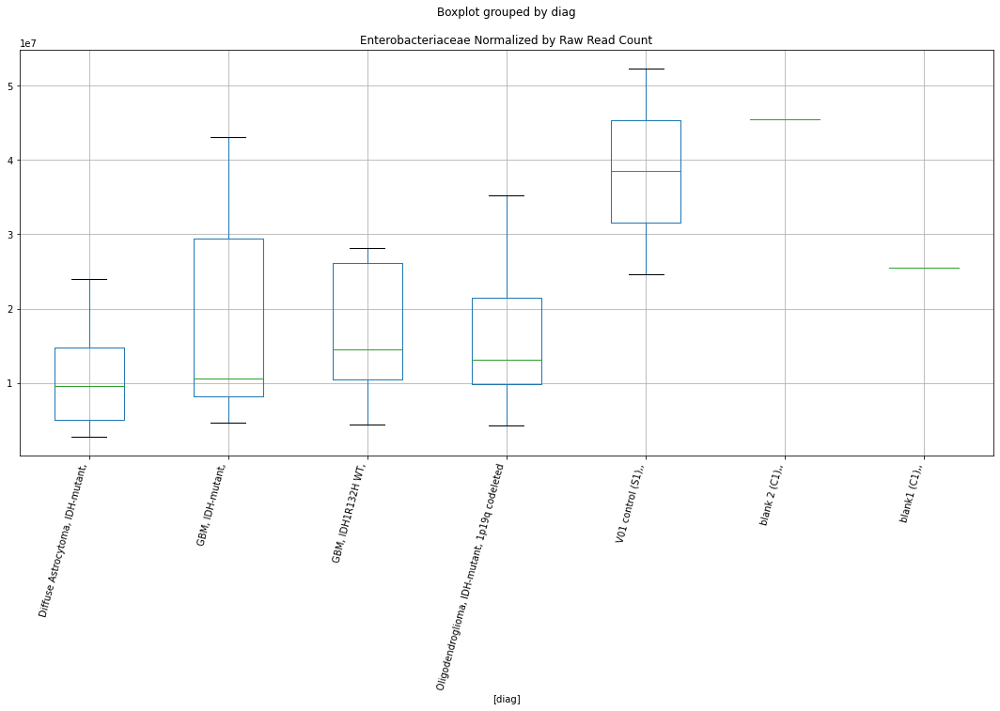

Neisseriaceae D-plex bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.13643452018683
	p = 0.0466289641829338
Neisseriaceae D-plex bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.13643452018683
	p = 0.0466289641829338


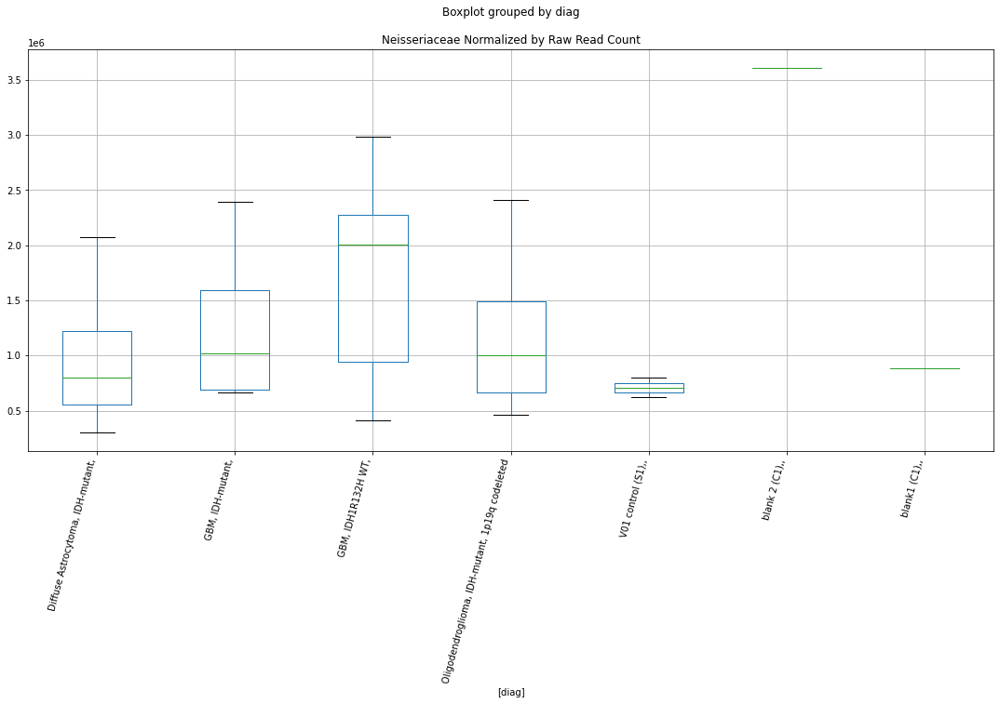

Neisseriaceae D-plex bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.091517351180691
	p = 0.050929121731524585
Neisseriaceae D-plex bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.091517351180691
	p = 0.050929121731524585


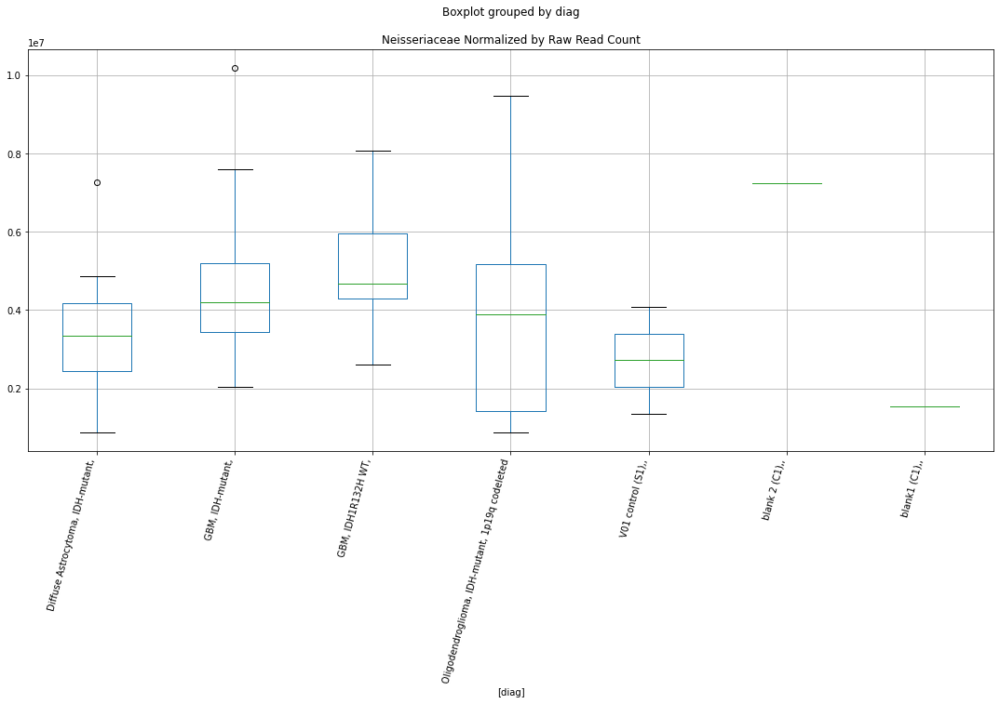

Neisseriaceae D-plex bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.528799367763541
	p = 0.021009624123518575
Neisseriaceae D-plex bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.528799367763541
	p = 0.021009624123518575


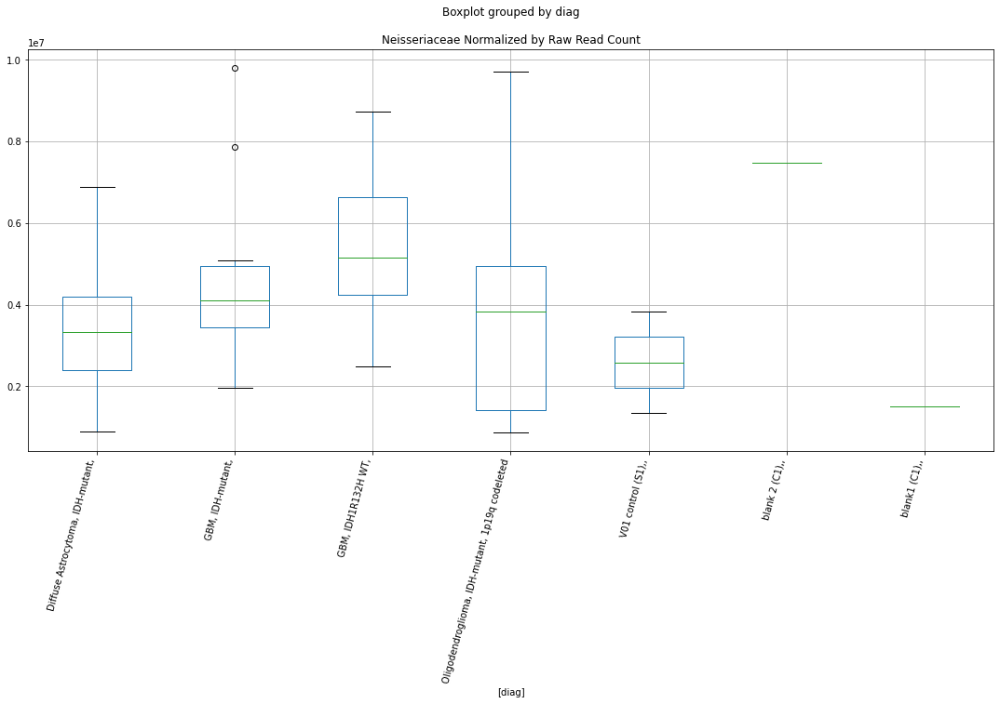

Neisseriaceae D-plex cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.9308229484741835
	p = 0.0694106740546681
Neisseriaceae D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.4204047518985687
	p = 0.026300443143453332
Neisseriaceae D-plex cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 1.9308229484741835
	p = 0.0694106740546681
Neisseriaceae D-plex cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.4204047518985687
	p = 0.026300443143453332


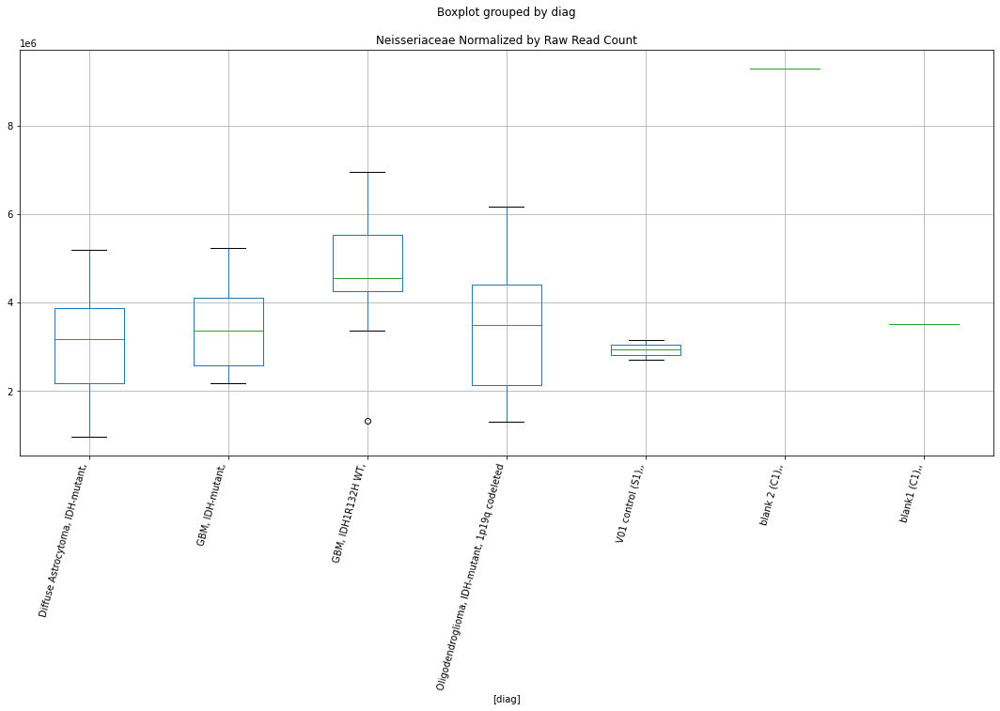

Neisseriaceae D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.7939889665733089
	p = 0.08963079536444114
Neisseriaceae D-plex cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.7939889665733089
	p = 0.08963079536444114


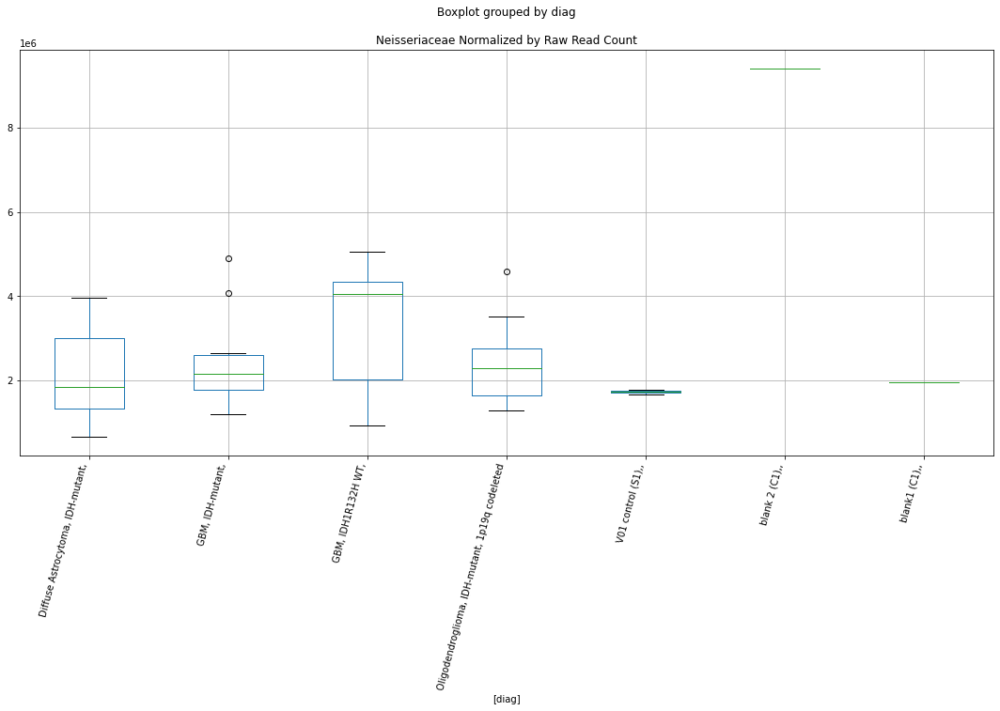

Neisseriaceae D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.787155960698457
	p = 0.09076378567950158
Neisseriaceae D-plex cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.787155960698457
	p = 0.09076378567950158


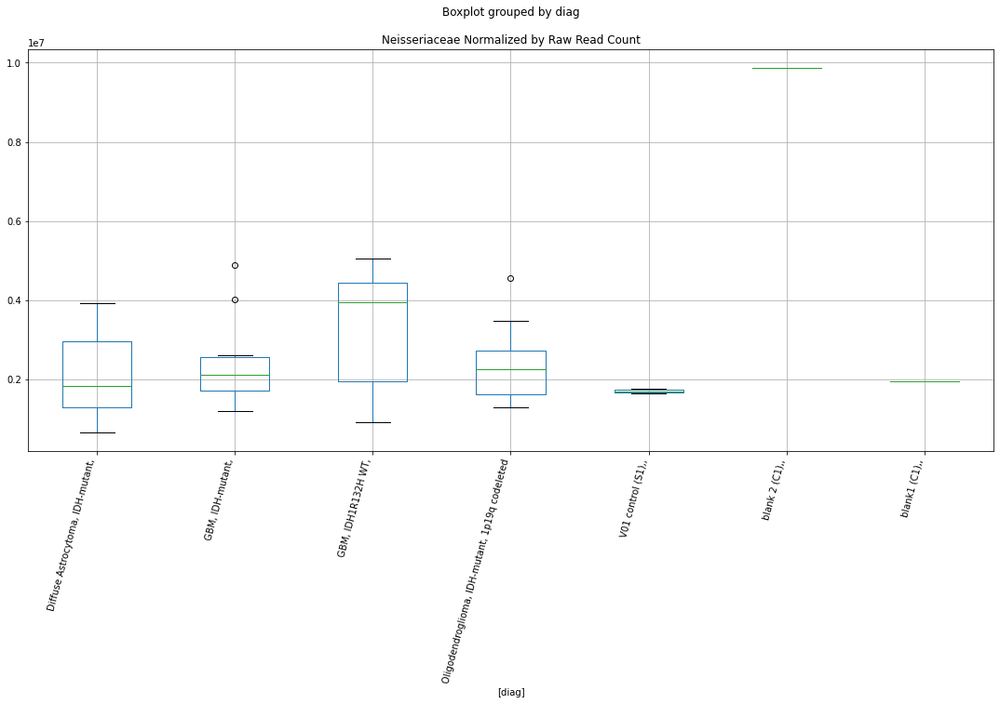

Neisseriaceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.000834358676463
	p = 0.06072396121252863
Neisseriaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.000834358676463
	p = 0.06072396121252863


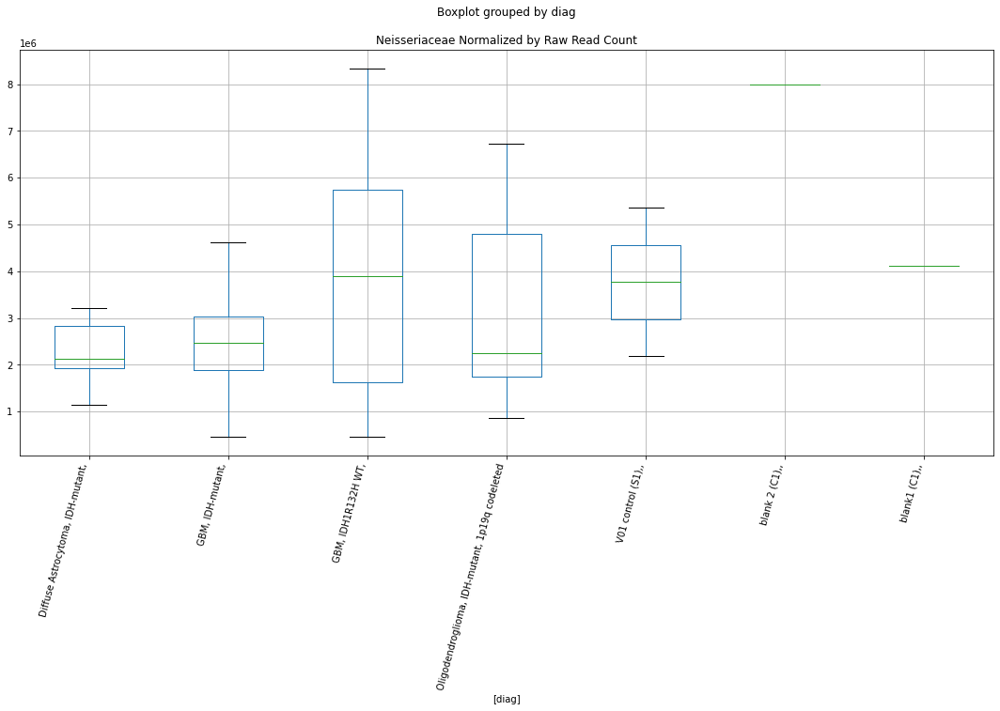

Neisseriaceae Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.7401842047651708
	p = 0.09889527132453821
Neisseriaceae Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.7401842047651708
	p = 0.09889527132453821


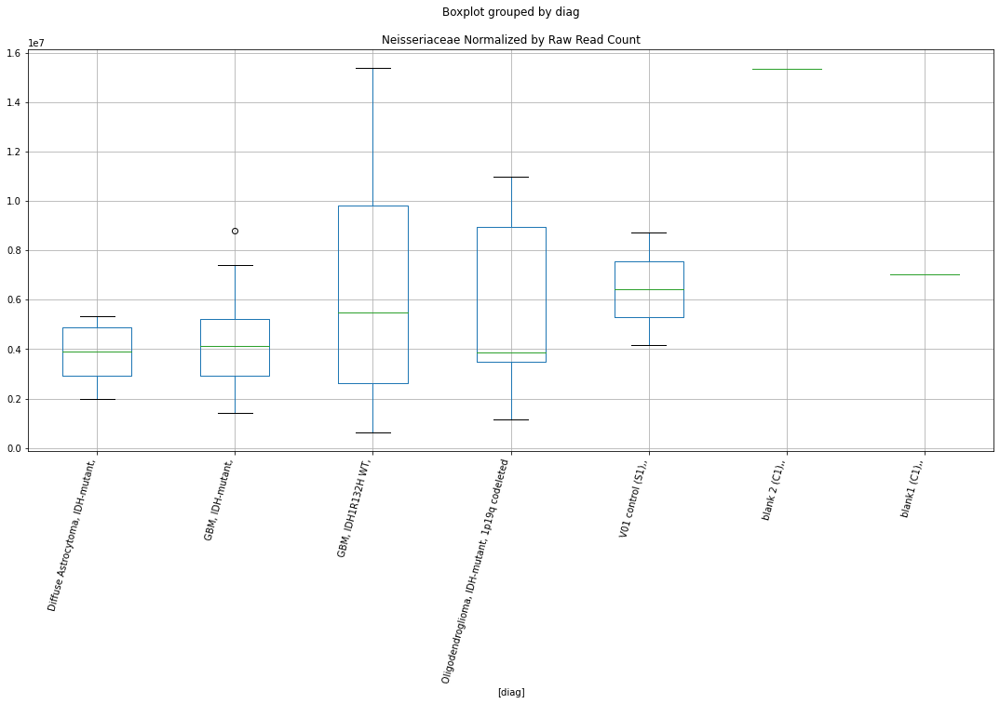

Neisseriaceae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.7372509291339389
	p = 0.09942338382684733
Neisseriaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.7372509291339389
	p = 0.09942338382684733


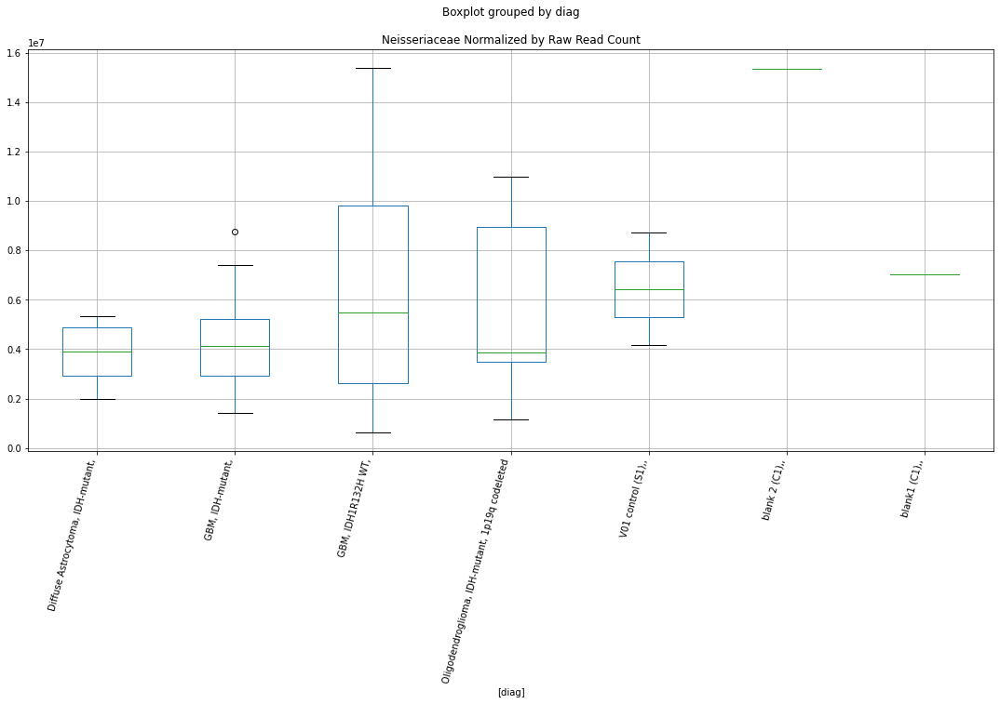

Hominidae Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.1862254952219735
	p = 0.042251313274459794
Hominidae Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.1862254952219735
	p = 0.042251313274459794


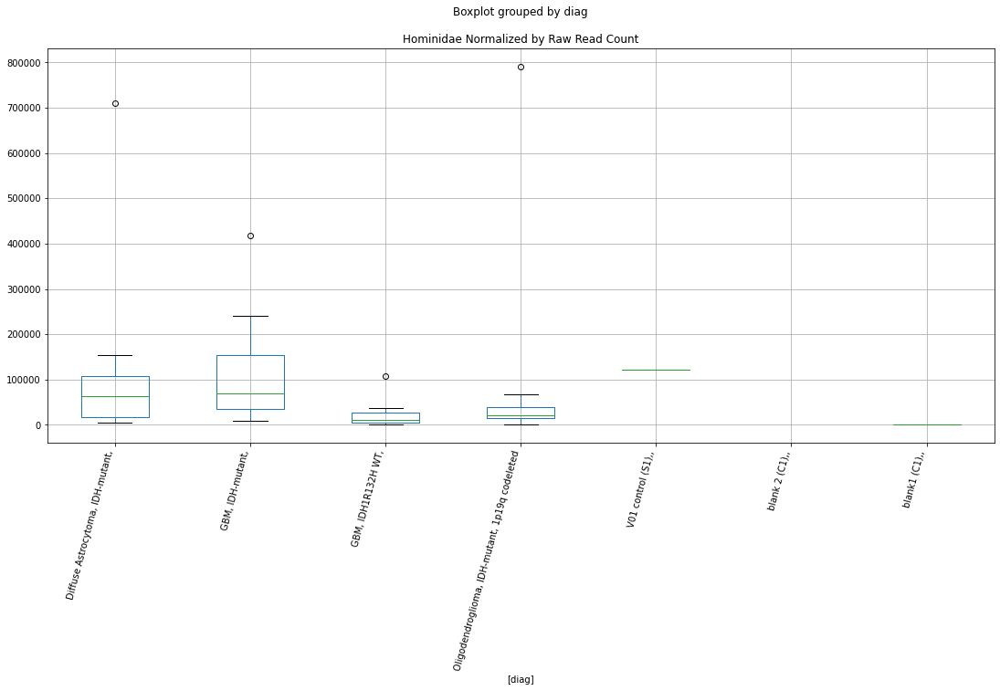

Alcaligenaceae D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8464057049348583
	p = 0.08134328741817454
Alcaligenaceae D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8464057049348583
	p = 0.08134328741817454


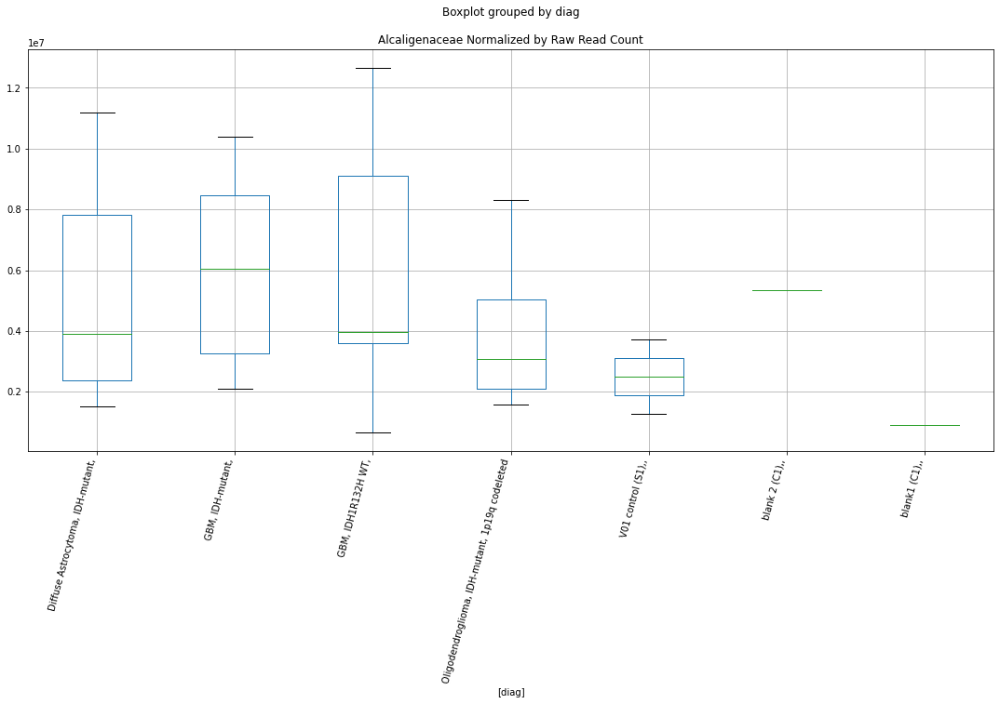

Alcaligenaceae D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8630038964425888
	p = 0.07886330048433846
Alcaligenaceae D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8630038964425888
	p = 0.07886330048433846


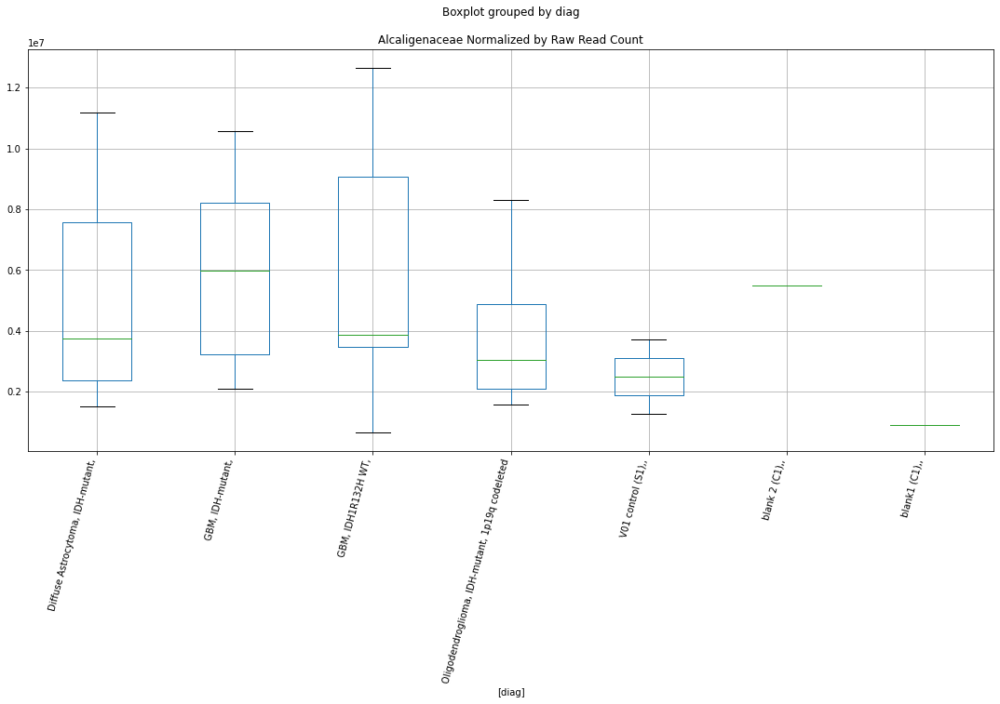

Pseudomonadaceae D-plex cutadapt1 : GBM, IDH-mutant, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.8775516633672222
	p = 0.07674476982186564
Pseudomonadaceae D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH-mutant,
	t = -1.8775516633672222
	p = 0.07674476982186564
Pseudomonadaceae D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.088696346765531
	p = 0.05121085973856067
Pseudomonadaceae D-plex cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.088696346765531
	p = 0.05121085973856067


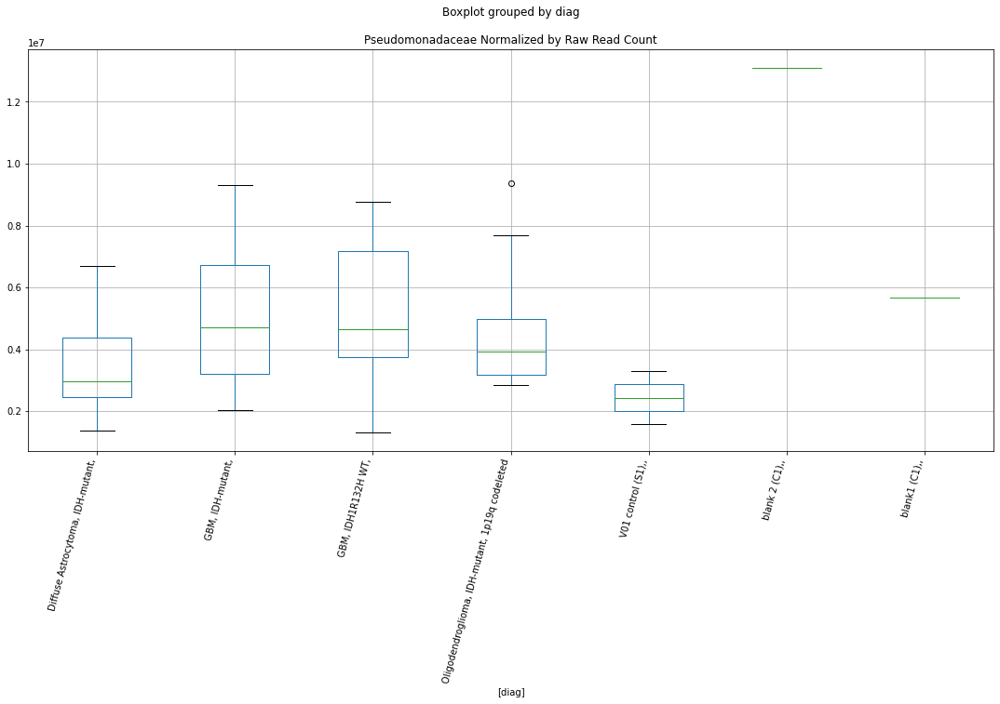

Corynebacteriaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.5612116275492096
	p = 0.01963379366221254
Corynebacteriaceae D-plex bbduk1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.5612116275492096
	p = 0.01963379366221254


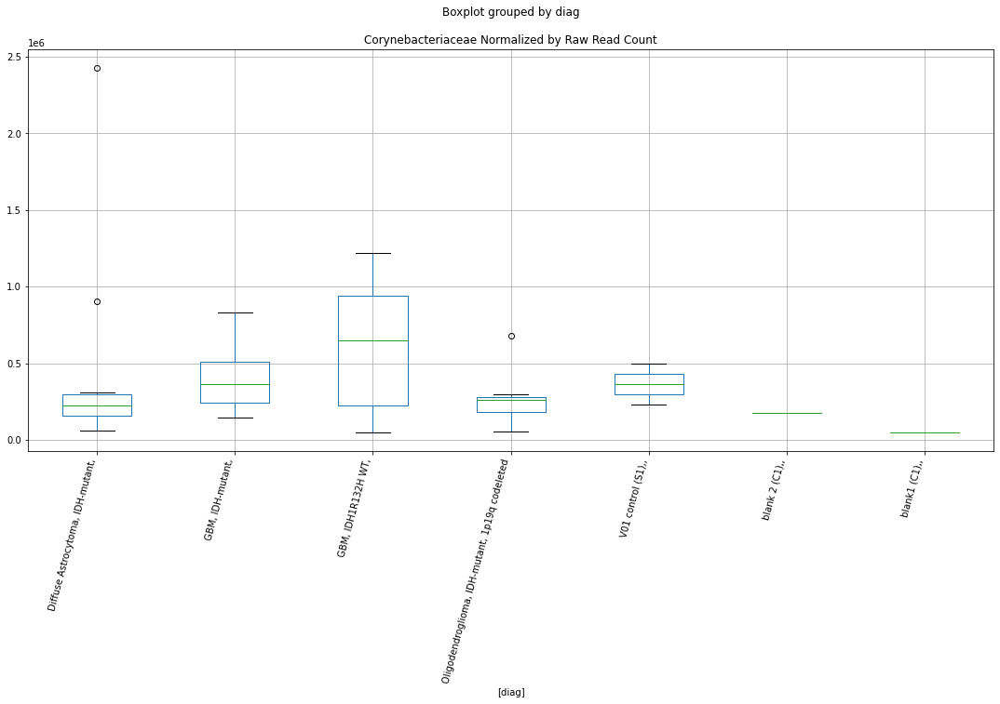

Corynebacteriaceae D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.7634420654773453
	p = 0.09479322773947481
Corynebacteriaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.7634420654773453
	p = 0.09479322773947481
Corynebacteriaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.165419396792817
	p = 0.044032688006354986
Corynebacteriaceae D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.165419396792817
	p = 0.044032688006354986


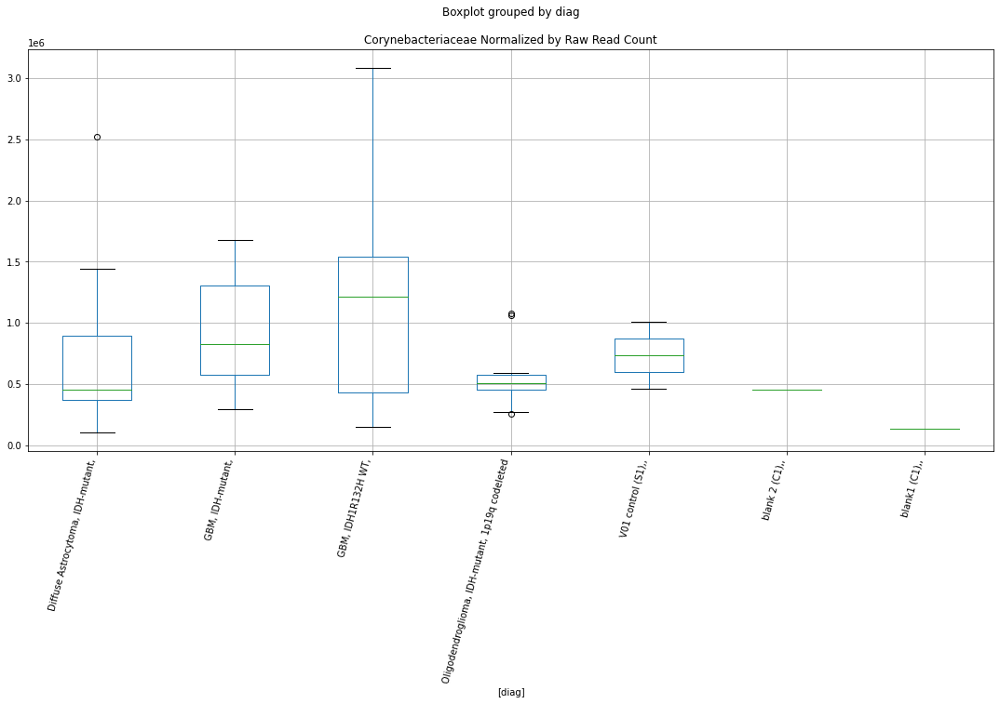

Corynebacteriaceae D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.7554149142912983
	p = 0.09619198727427479
Corynebacteriaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.7554149142912983
	p = 0.09619198727427479
Corynebacteriaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.115805556764898
	p = 0.0485610566867692
Corynebacteriaceae D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.115805556764898
	p = 0.0485610566867692


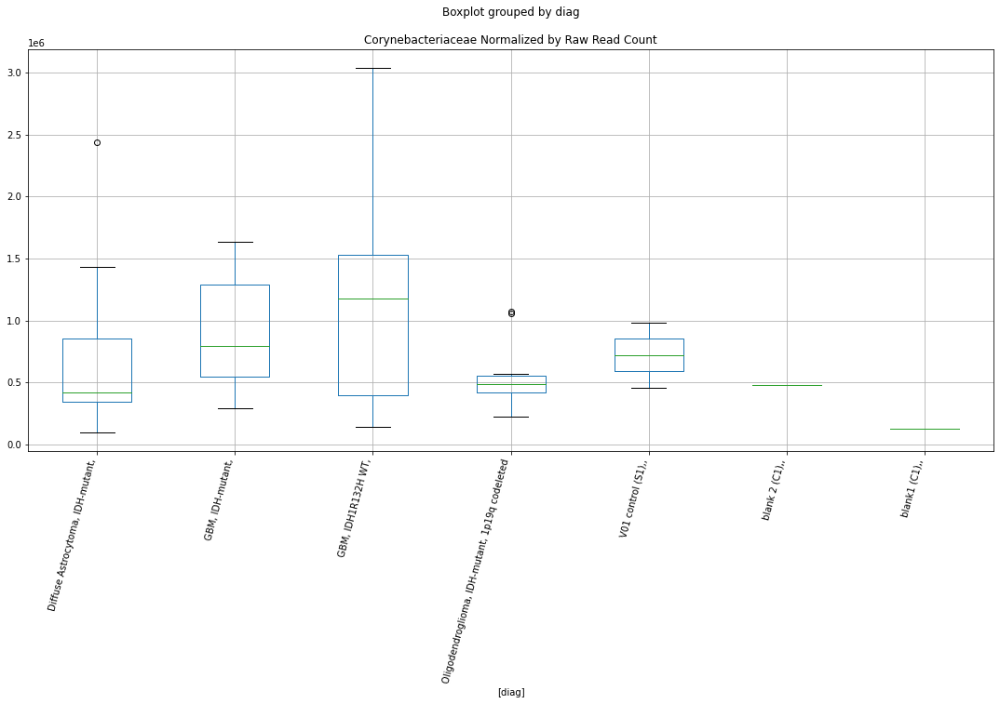

Corynebacteriaceae Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.9822388027673372
	p = 0.06293069080667954
Corynebacteriaceae Lexogen bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = 1.9822388027673372
	p = 0.06293069080667954


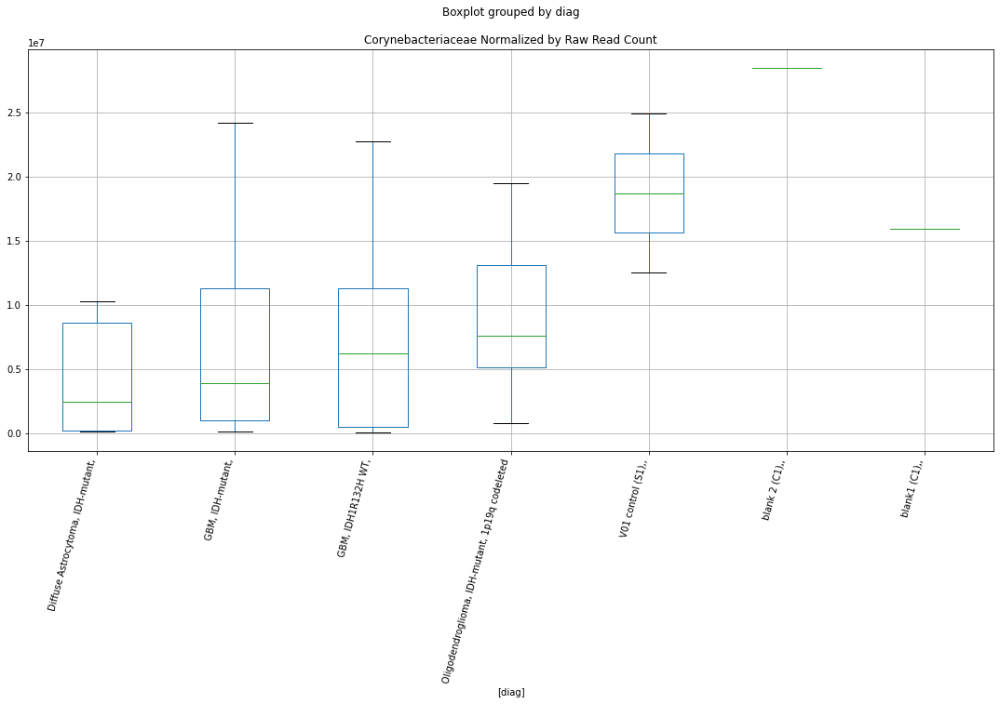

Peptostreptococcaceae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.85752763409353
	p = 0.07967405611906582
Peptostreptococcaceae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.2962414231844477
	p = 0.03388485687391258
Peptostreptococcaceae Lexogen bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = 1.85752763409353
	p = 0.07967405611906582
Peptostreptococcaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.2962414231844477
	p = 0.03388485687391258


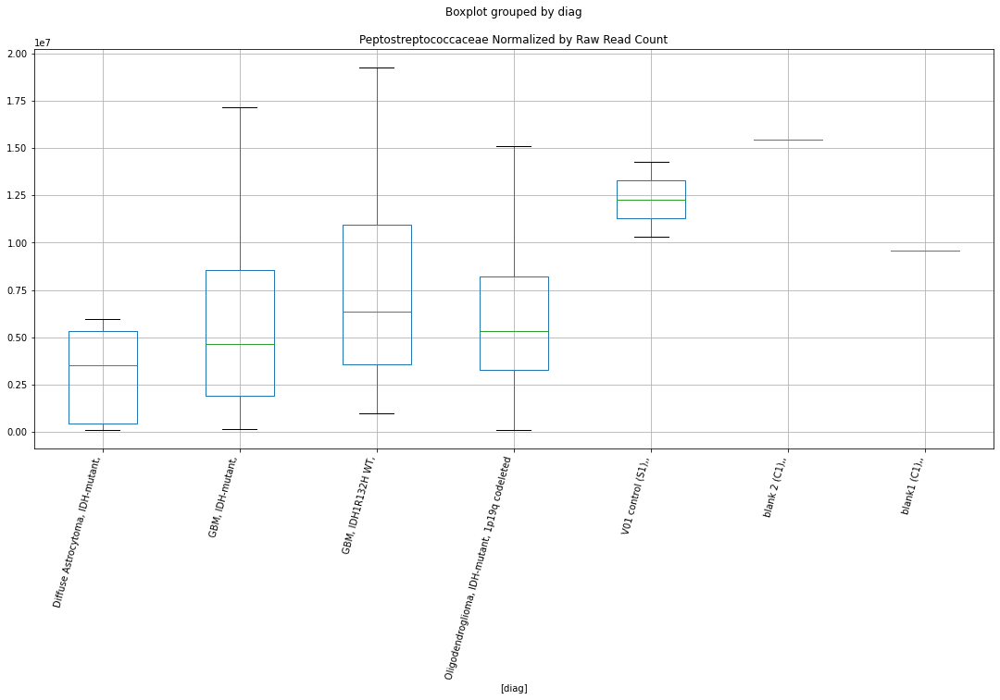

Chromobacteriaceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.9773931651174401
	p = 0.06351740780815324
Chromobacteriaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.9773931651174401
	p = 0.06351740780815324


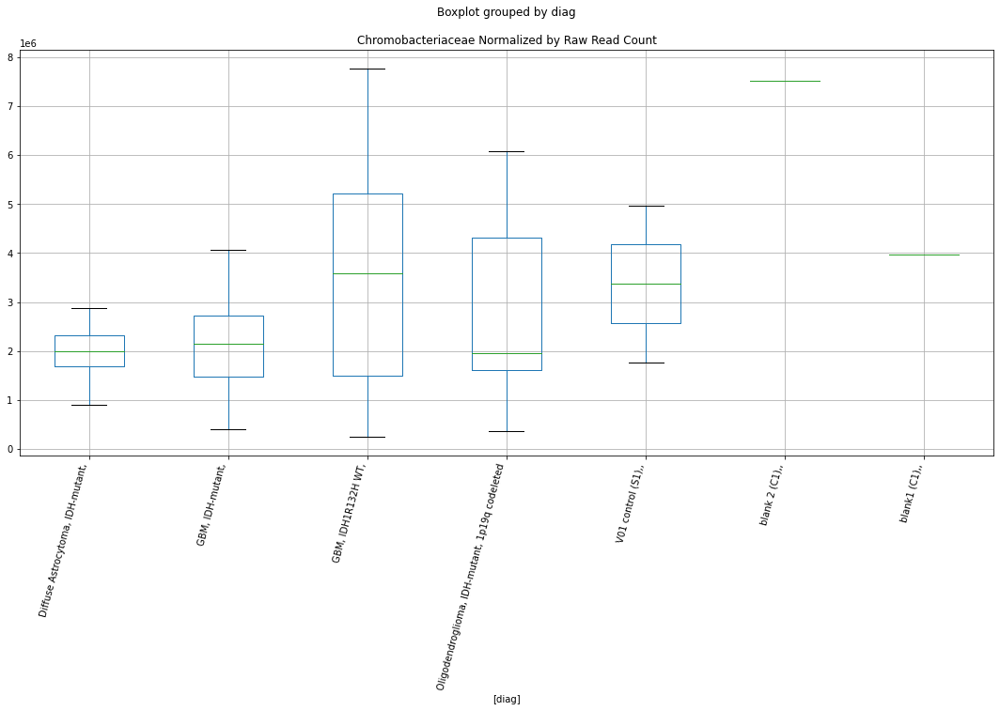

Chromobacteriaceae Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.7419643309629764
	p = 0.09857595943794106
Chromobacteriaceae Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.7419643309629764
	p = 0.09857595943794106


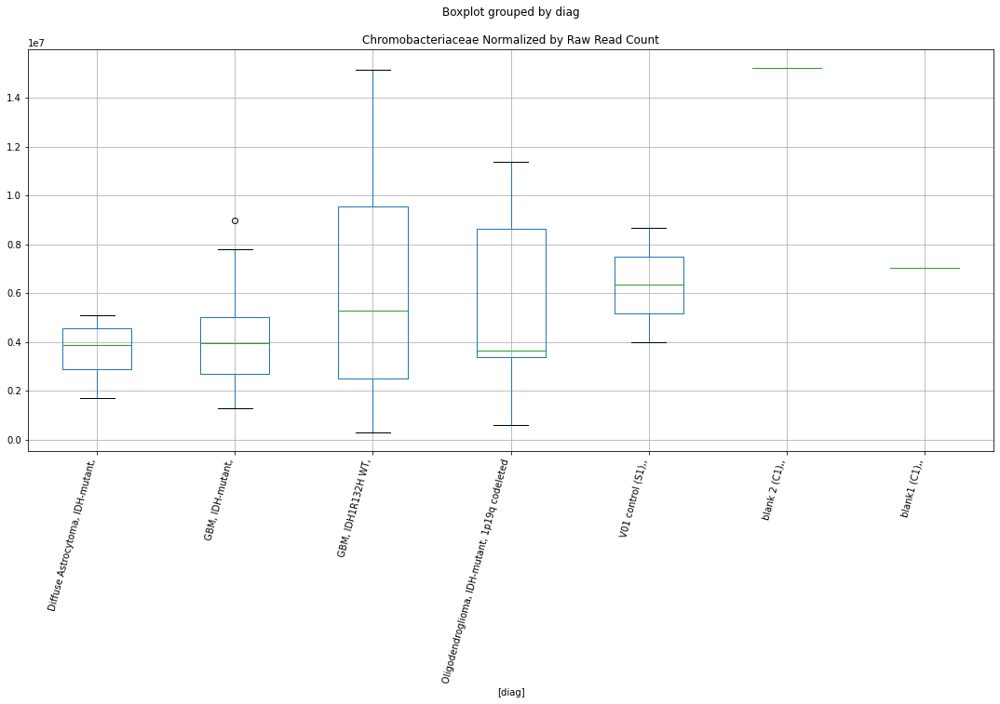

Chromobacteriaceae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.742795918355539
	p = 0.09842709881518386
Chromobacteriaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.742795918355539
	p = 0.09842709881518386


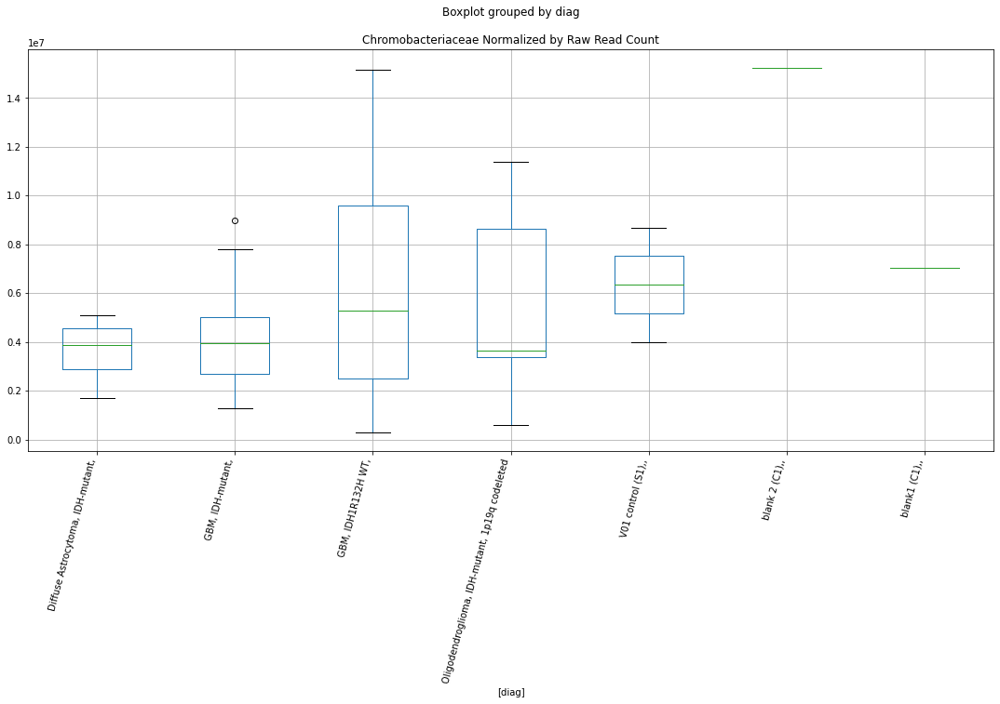

Comamonadaceae Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.921028956276962
	p = 0.07071039235903613
Comamonadaceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.2244176800205726
	p = 0.03915243100609148
Comamonadaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.921028956276962
	p = 0.07071039235903613
Comamonadaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.2244176800205726
	p = 0.03915243100609148


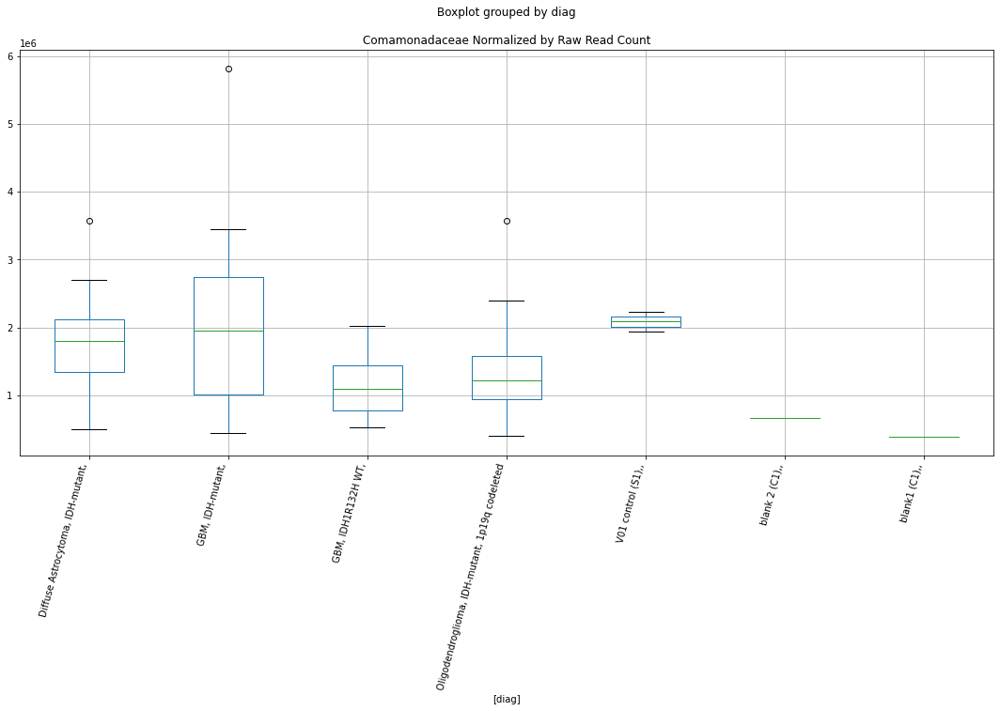

Moraxellaceae Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.2106488381436433
	p = 0.04024469347918169
Moraxellaceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.8807839900902914
	p = 0.07628094523346544
Moraxellaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.2106488381436433
	p = 0.04024469347918169
Moraxellaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8807839900902914
	p = 0.07628094523346544


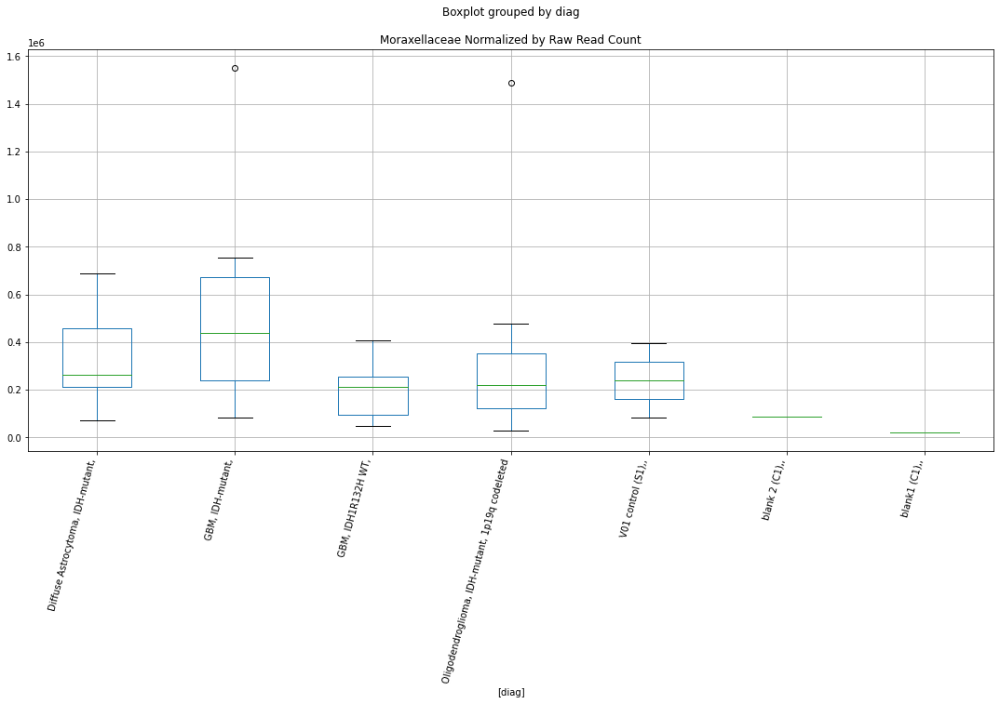

Moraxellaceae Lexogen bbduk2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.1955235442709555
	p = 0.041476801924127234
Moraxellaceae Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.8488942344356667
	p = 0.08096714652247866
Moraxellaceae Lexogen bbduk2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.1955235442709555
	p = 0.041476801924127234
Moraxellaceae Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8488942344356667
	p = 0.08096714652247866


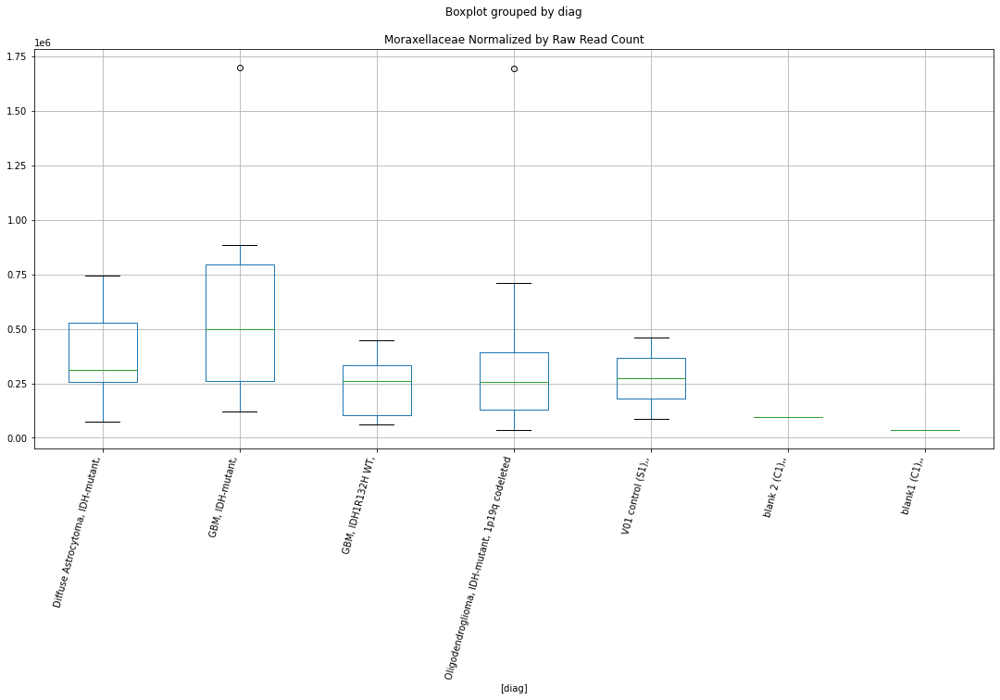

Moraxellaceae Lexogen bbduk3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.185246759256878
	p = 0.04233360735265398
Moraxellaceae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.8357160615429389
	p = 0.0829765671322544
Moraxellaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.185246759256878
	p = 0.04233360735265398
Moraxellaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8357160615429389
	p = 0.0829765671322544


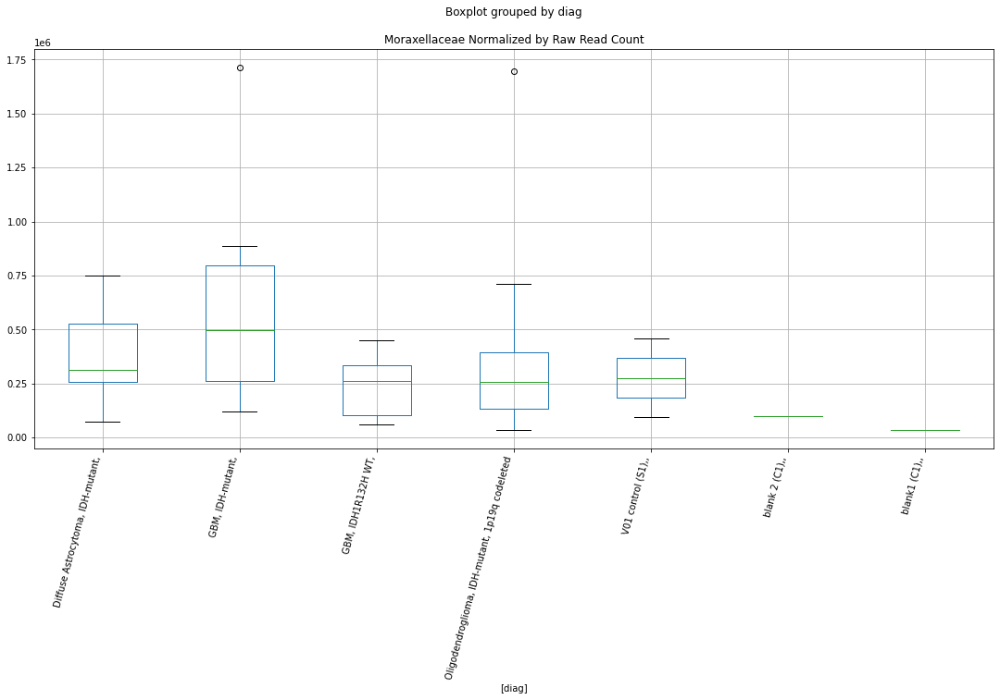

Moraxellaceae Lexogen cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.2995005112090823
	p = 0.033662156420382415
Moraxellaceae Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.8825616946377988
	p = 0.0760269105735731
Moraxellaceae Lexogen cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.2995005112090823
	p = 0.033662156420382415
Moraxellaceae Lexogen cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8825616946377988
	p = 0.0760269105735731


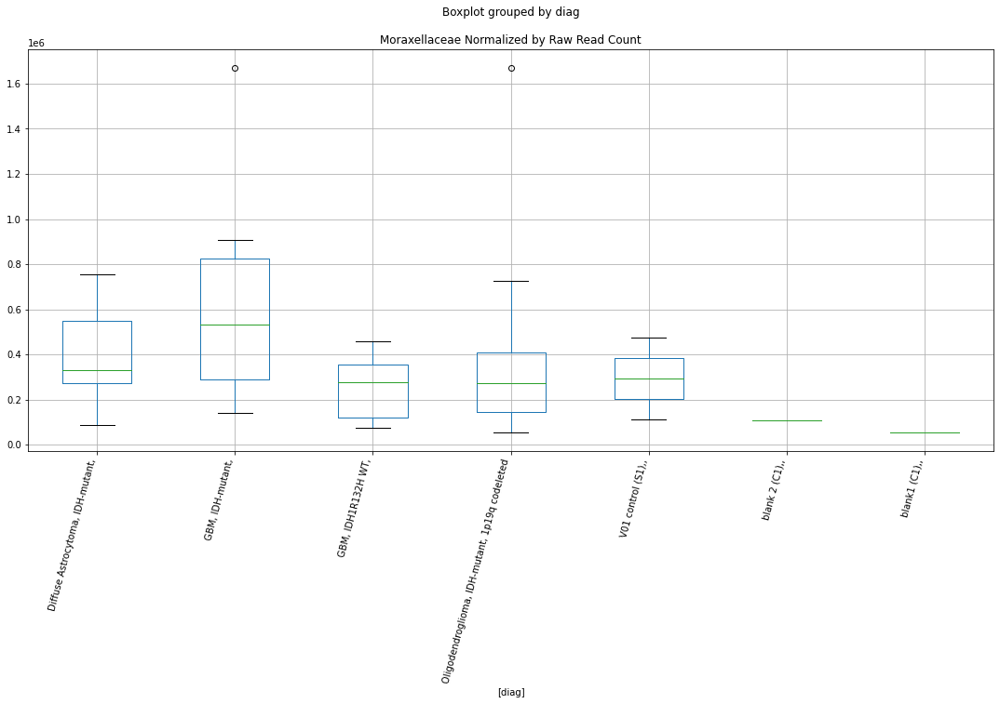

Moraxellaceae Lexogen cutadapt2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.2763964401374057
	p = 0.03527063190954932
Moraxellaceae Lexogen cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.8502311230555304
	p = 0.08076570892001608
Moraxellaceae Lexogen cutadapt2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.2763964401374057
	p = 0.03527063190954932
Moraxellaceae Lexogen cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8502311230555304
	p = 0.08076570892001608


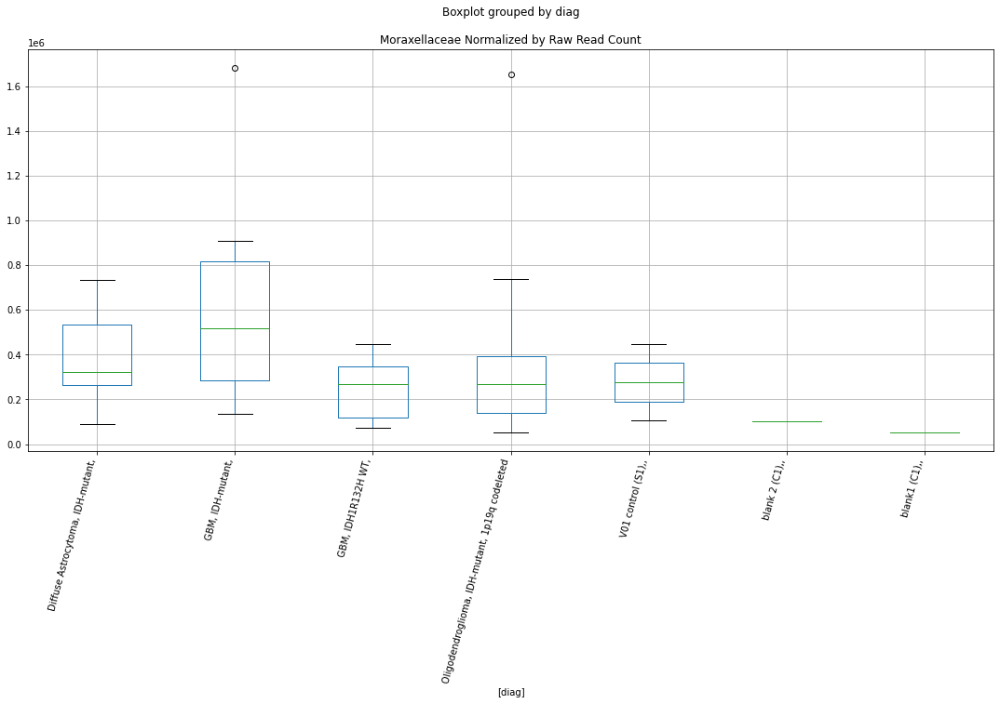

Moraxellaceae Lexogen cutadapt3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.267848596547075
	p = 0.03588353495390821
Moraxellaceae Lexogen cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.884849383873299
	p = 0.07570110029805432
Moraxellaceae Lexogen cutadapt3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.267848596547075
	p = 0.03588353495390821
Moraxellaceae Lexogen cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.884849383873299
	p = 0.07570110029805432


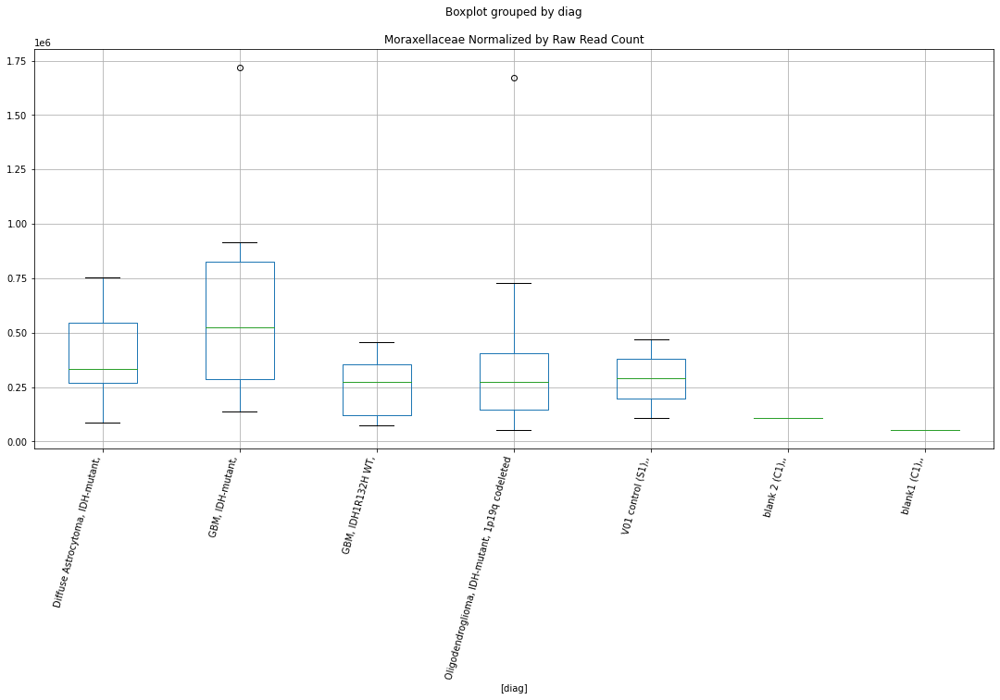

Enterococcaceae Lexogen cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9552384452261025
	p = 0.06626279405021485
Enterococcaceae Lexogen cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9552384452261025
	p = 0.06626279405021485


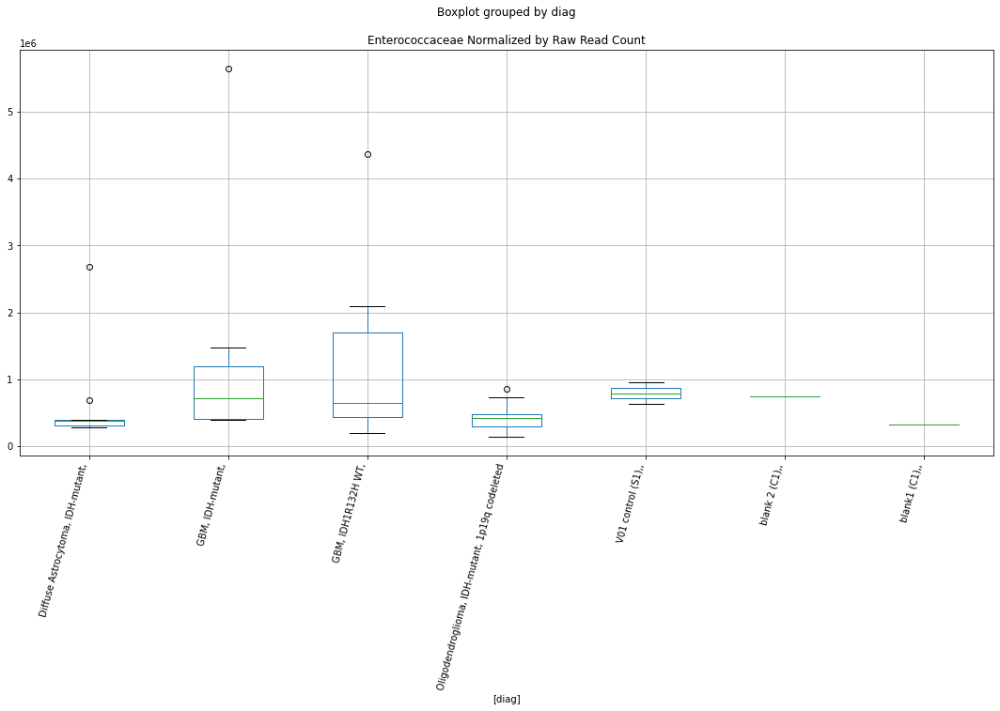

Enterococcaceae Lexogen cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.7571679516395302
	p = 0.09588499440932667
Enterococcaceae Lexogen cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.7571679516395302
	p = 0.09588499440932667


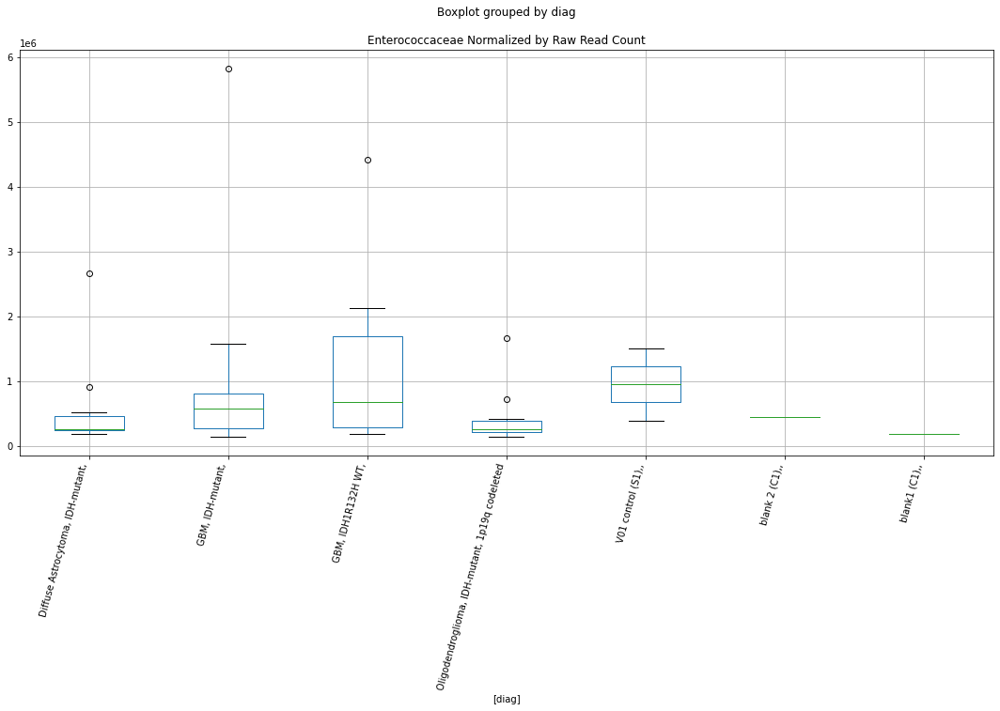

Methylophilaceae Lexogen bbduk1 : GBM, IDH-mutant, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.06276159779429
	p = 0.053868017945721276
Methylophilaceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH-mutant,
	t = -2.06276159779429
	p = 0.053868017945721276
Methylophilaceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.904881850780599
	p = 0.07290049573116364
Methylophilaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.904881850780599
	p = 0.07290049573116364


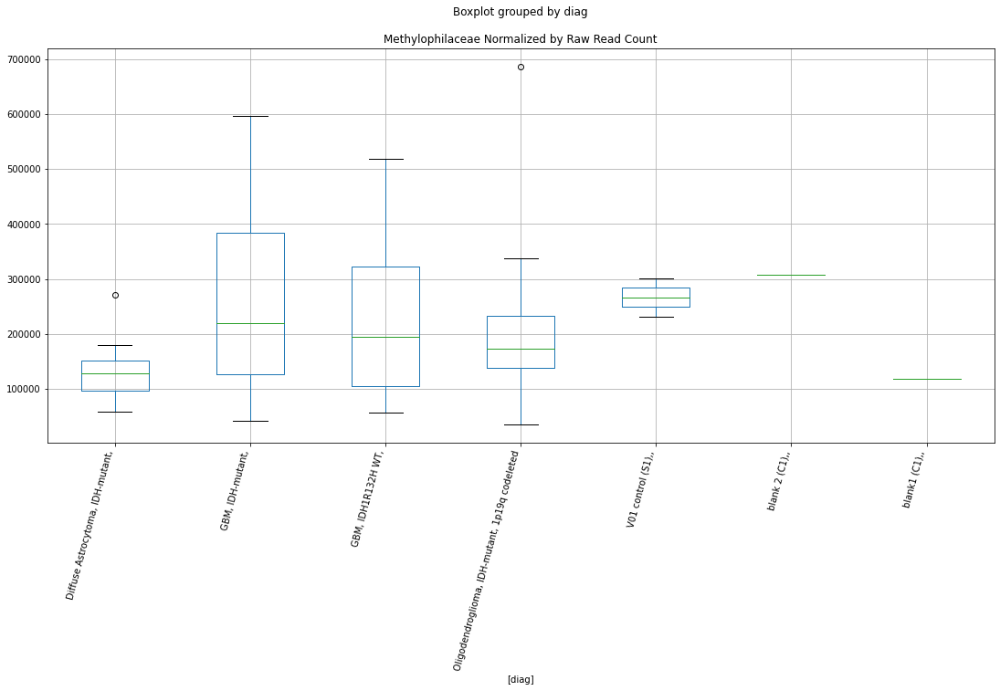

Methylophilaceae Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.7419197631477232
	p = 0.09858394292533337
Methylophilaceae Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.7419197631477232
	p = 0.09858394292533337


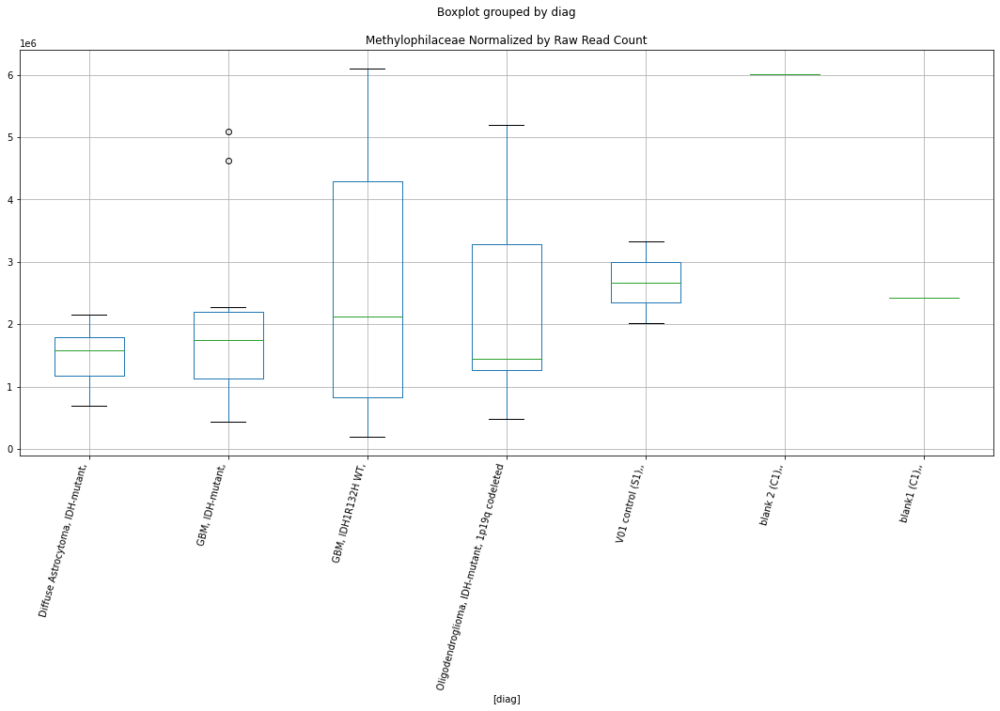

Methylophilaceae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.7529023778806196
	p = 0.09663347120464033
Methylophilaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.7529023778806196
	p = 0.09663347120464033


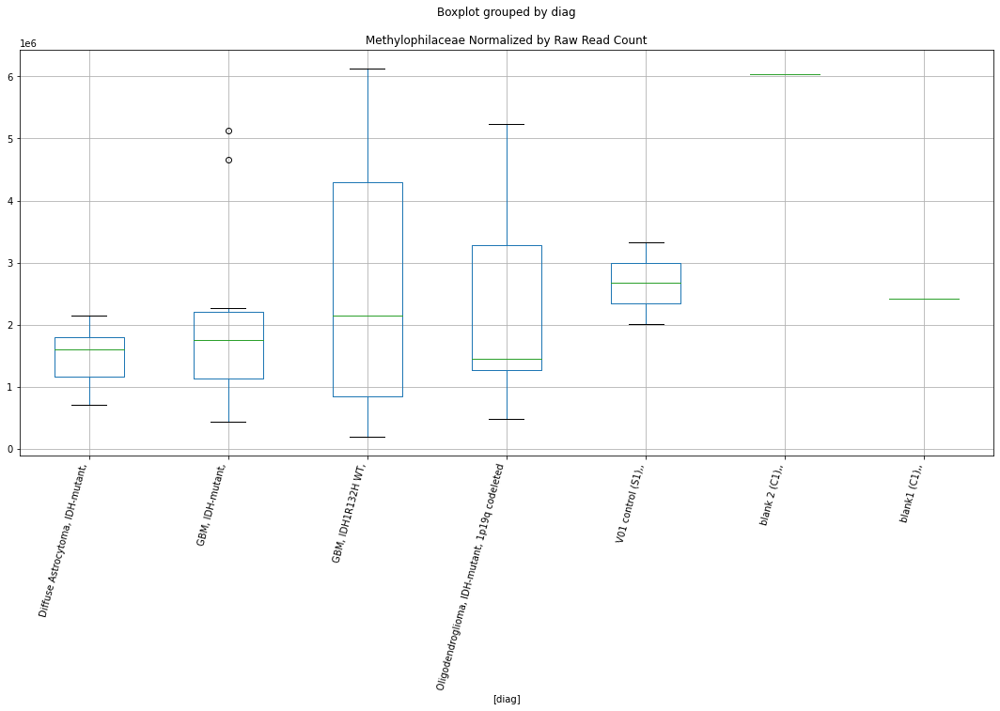

Chromatiaceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.8313772739172394
	p = 0.08364767389418953
Chromatiaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.8313772739172394
	p = 0.08364767389418953


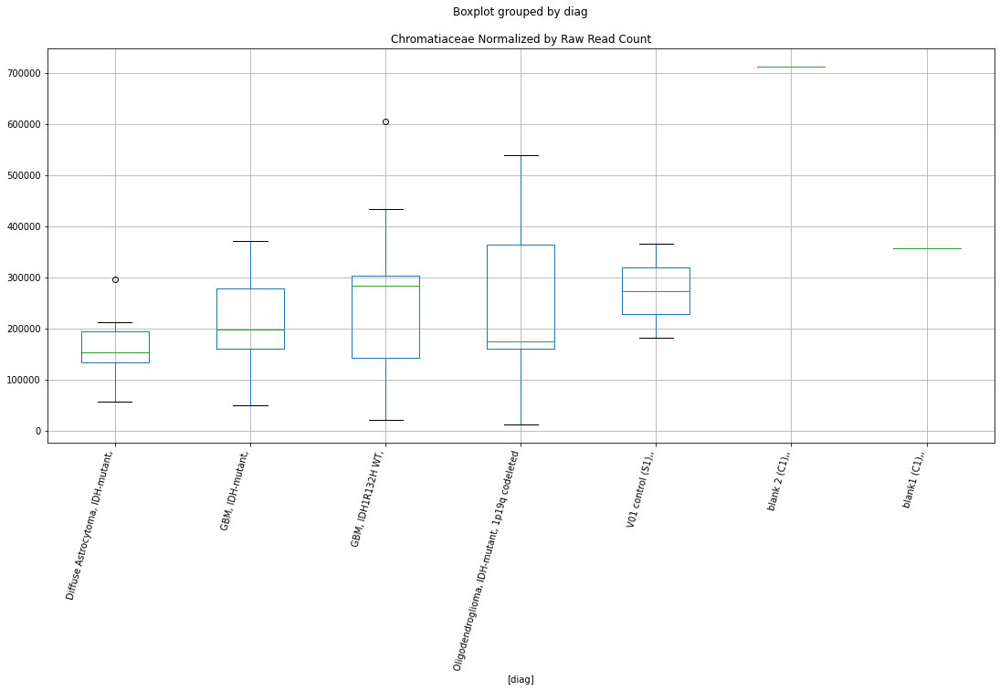

Chenopodiaceae Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.9809346442763691
	p = 0.06308812065113811
Chenopodiaceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.1411676824473007
	p = 0.04619566715200106
Chenopodiaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.9809346442763691
	p = 0.06308812065113811
Chenopodiaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.1411676824473007
	p = 0.04619566715200106


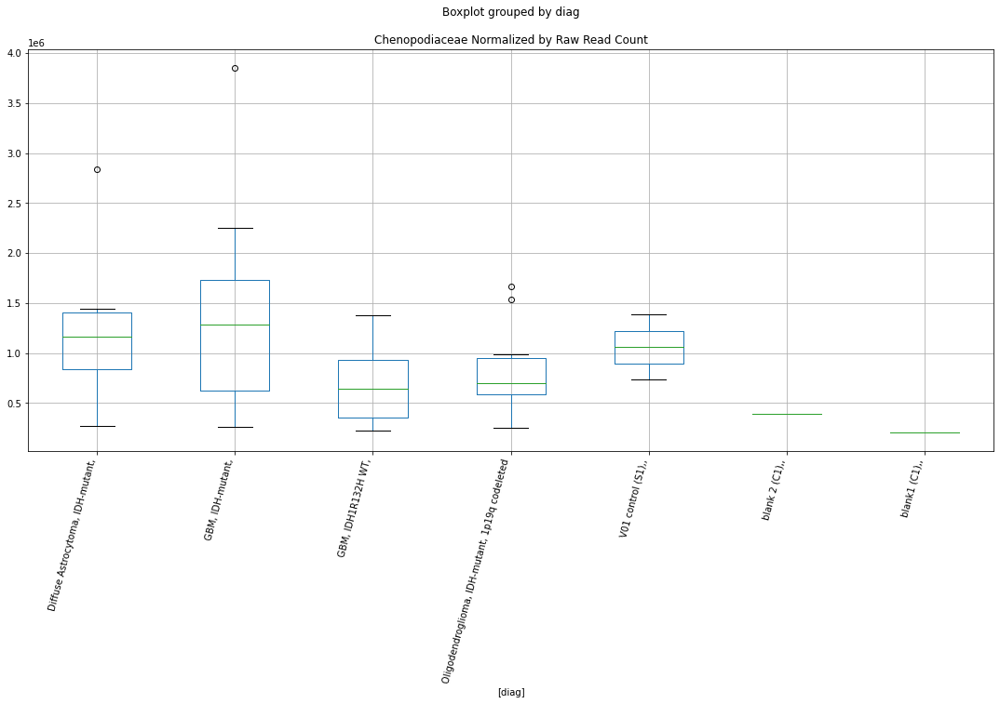

Chenopodiaceae Lexogen bbduk2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.03133218527816
	p = 0.057254999320376476
Chenopodiaceae Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.047713347191509
	p = 0.05546641698561315
Chenopodiaceae Lexogen bbduk2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.03133218527816
	p = 0.057254999320376476
Chenopodiaceae Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.047713347191509
	p = 0.05546641698561315


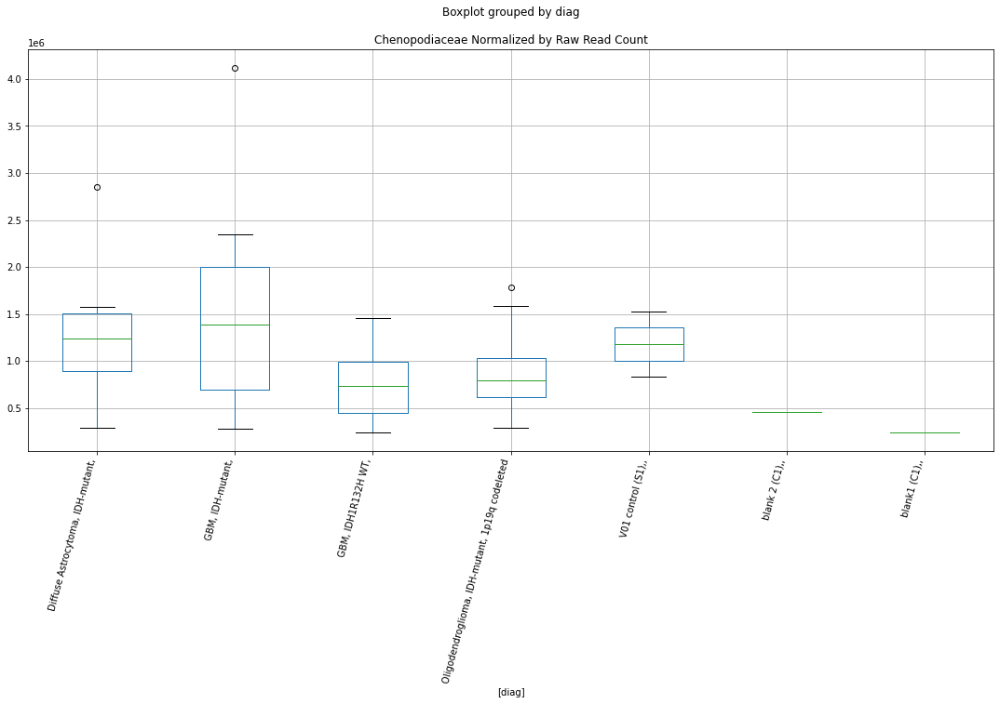

Chenopodiaceae Lexogen bbduk3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.0086420166809513
	p = 0.05981833060930474
Chenopodiaceae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.0008489877265245
	p = 0.06072225289231221
Chenopodiaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.0086420166809513
	p = 0.05981833060930474
Chenopodiaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.0008489877265245
	p = 0.06072225289231221


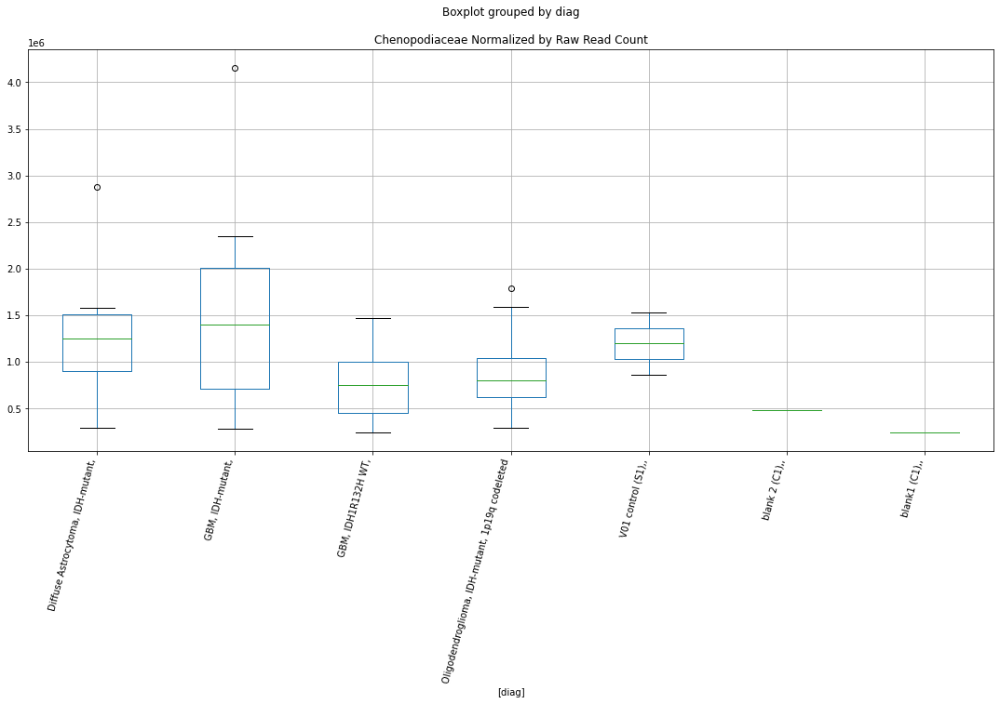

Chenopodiaceae Lexogen cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.134580293252855
	p = 0.04679971786043448
Chenopodiaceae Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.20781352974259
	p = 0.040473065006265865
Chenopodiaceae Lexogen cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.134580293252855
	p = 0.04679971786043448
Chenopodiaceae Lexogen cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.20781352974259
	p = 0.040473065006265865


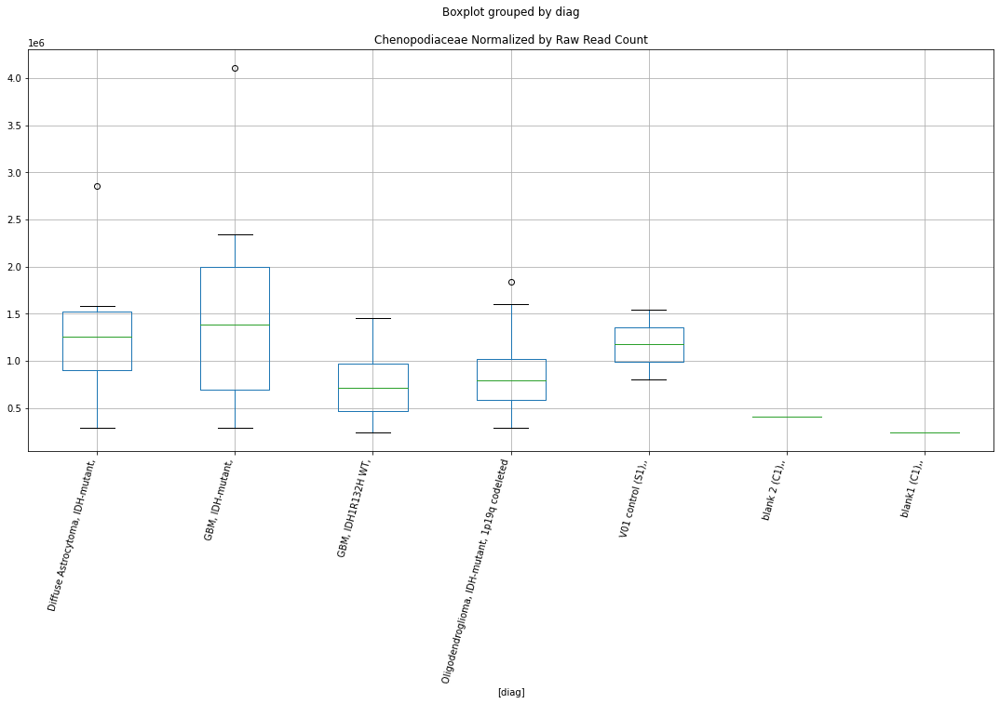

Chenopodiaceae Lexogen cutadapt2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.072798110654509
	p = 0.05282525110448486
Chenopodiaceae Lexogen cutadapt2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.072798110654509
	p = 0.05282525110448486


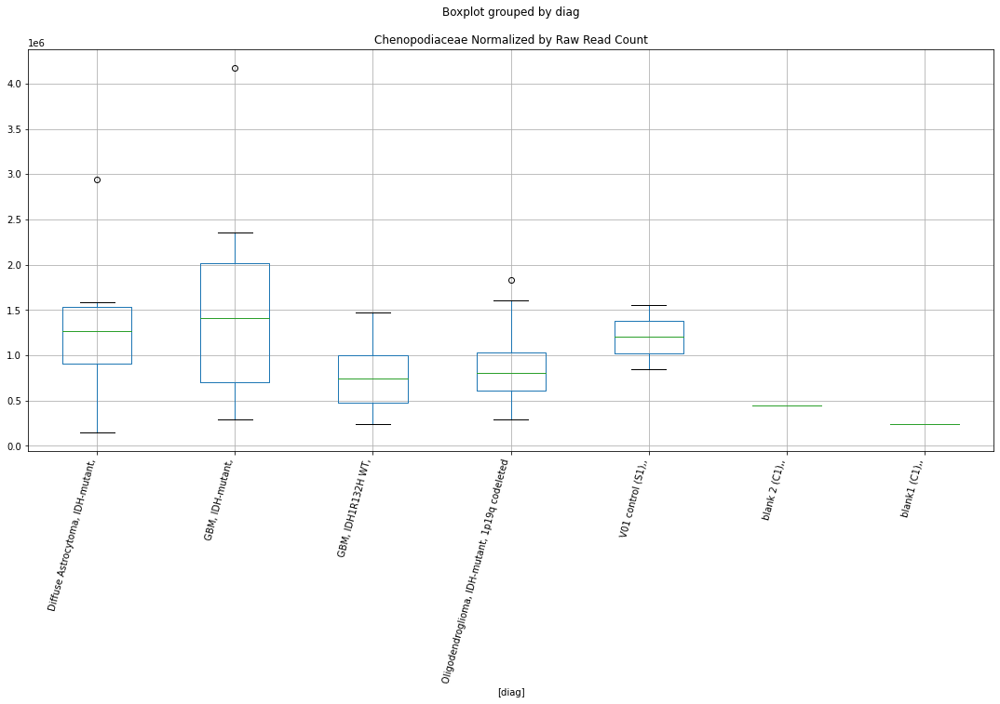

Chenopodiaceae Lexogen cutadapt3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.0415729591041325
	p = 0.05613086005057469
Chenopodiaceae Lexogen cutadapt3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.0415729591041325
	p = 0.05613086005057469


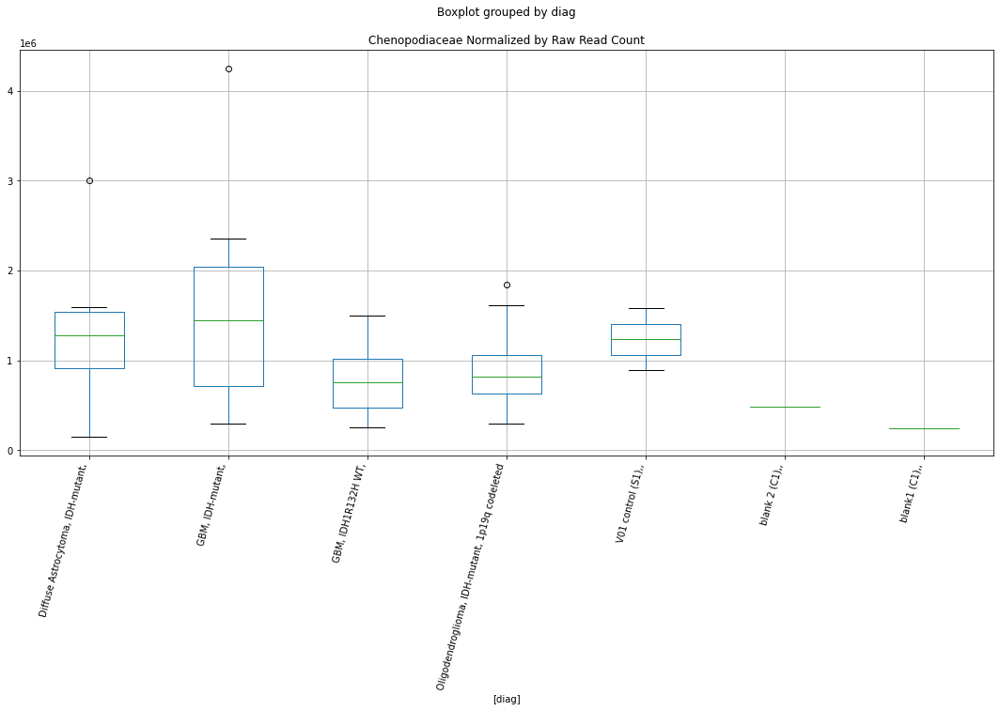

Streptomycetaceae D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.077776277252204
	p = 0.052314847836761304
Streptomycetaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.077776277252204
	p = 0.052314847836761304
Streptomycetaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.8150798283326457
	p = 0.08621124605489983
Streptomycetaceae D-plex bbduk1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8150798283326457
	p = 0.08621124605489983


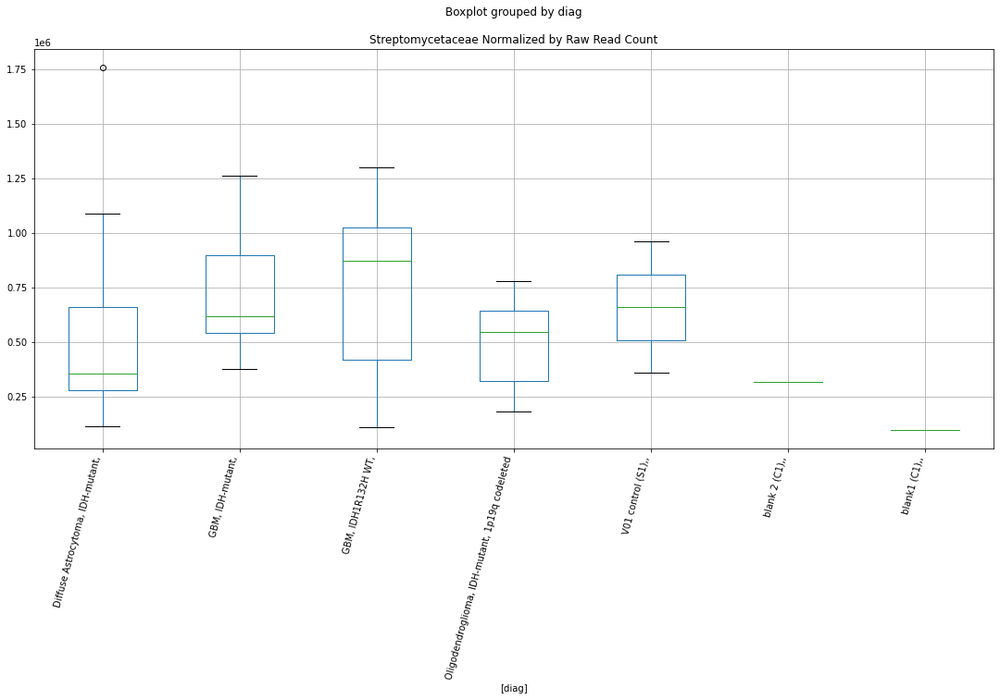

Streptomycetaceae D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.2619615976060707
	p = 0.004329767061285079
Streptomycetaceae D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.2619615976060707
	p = 0.004329767061285079
Streptomycetaceae D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.631893534112646
	p = 0.016923656689862253
Streptomycetaceae D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.631893534112646
	p = 0.016923656689862253


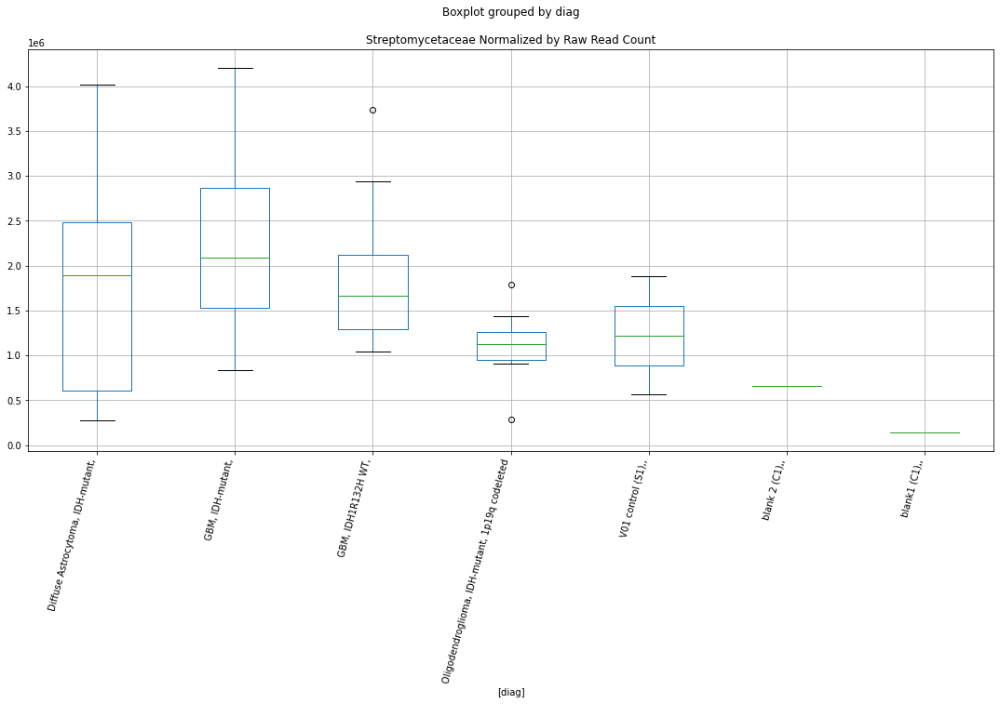

Streptomycetaceae D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.356659341145752
	p = 0.003512811211350816
Streptomycetaceae D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.356659341145752
	p = 0.003512811211350816
Streptomycetaceae D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -3.1711108597611144
	p = 0.005287640708697239
Streptomycetaceae D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.1711108597611144
	p = 0.005287640708697239


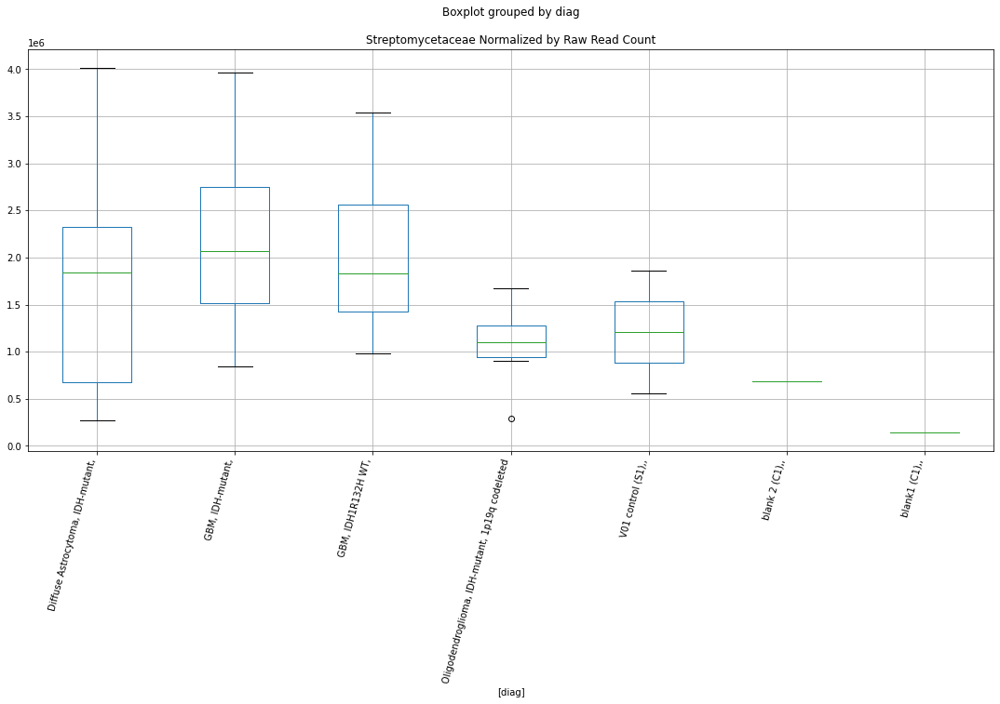

Streptomycetaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.325783738919871
	p = 0.031915167616677856
Streptomycetaceae D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.325783738919871
	p = 0.031915167616677856


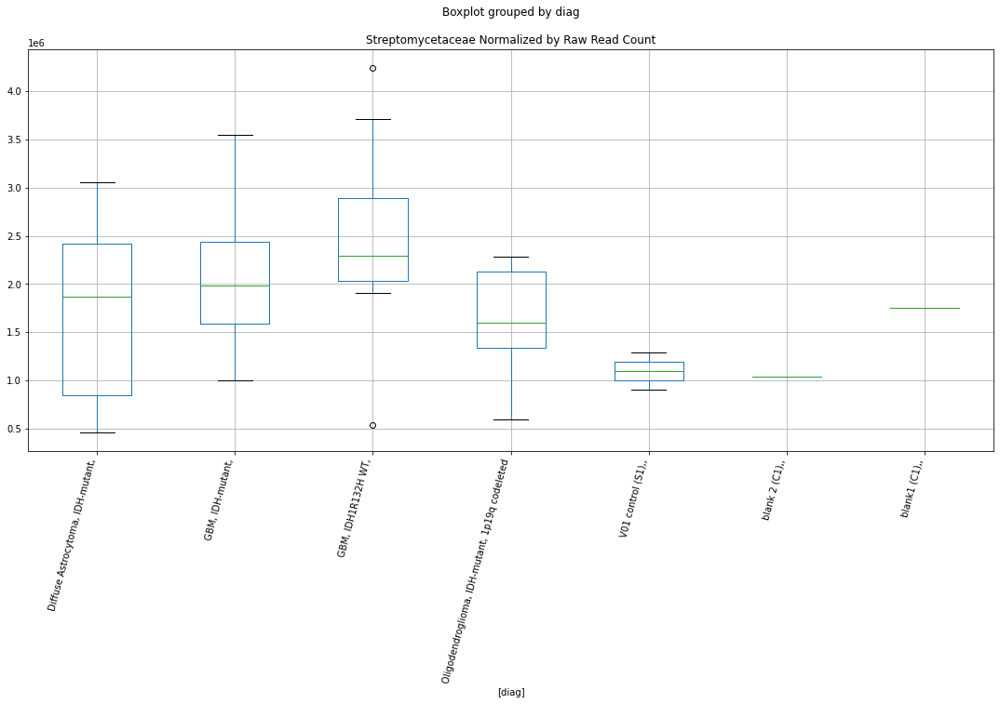

Streptomycetaceae D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2242003500288363
	p = 0.039169457473721
Streptomycetaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.2242003500288363
	p = 0.039169457473721
Streptomycetaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.7923324882861909
	p = 0.08990431868321994
Streptomycetaceae D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.7923324882861909
	p = 0.08990431868321994


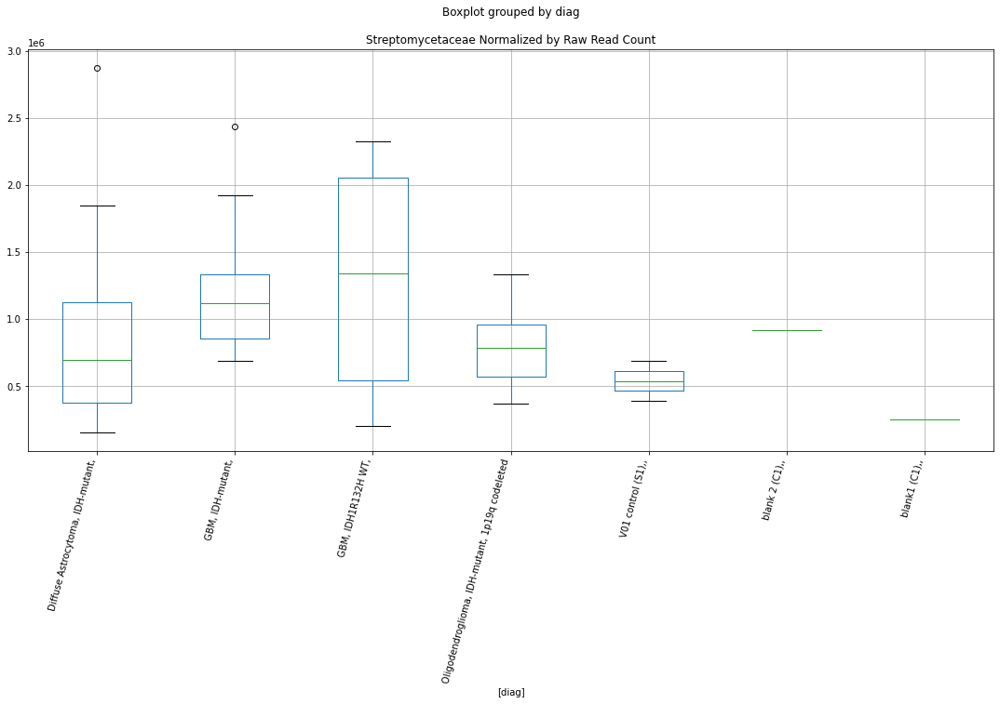

Streptomycetaceae D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.1947011977324085
	p = 0.04154477302422208
Streptomycetaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.1947011977324085
	p = 0.04154477302422208
Streptomycetaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.7378066412341617
	p = 0.09932314540102115
Streptomycetaceae D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.7378066412341617
	p = 0.09932314540102115


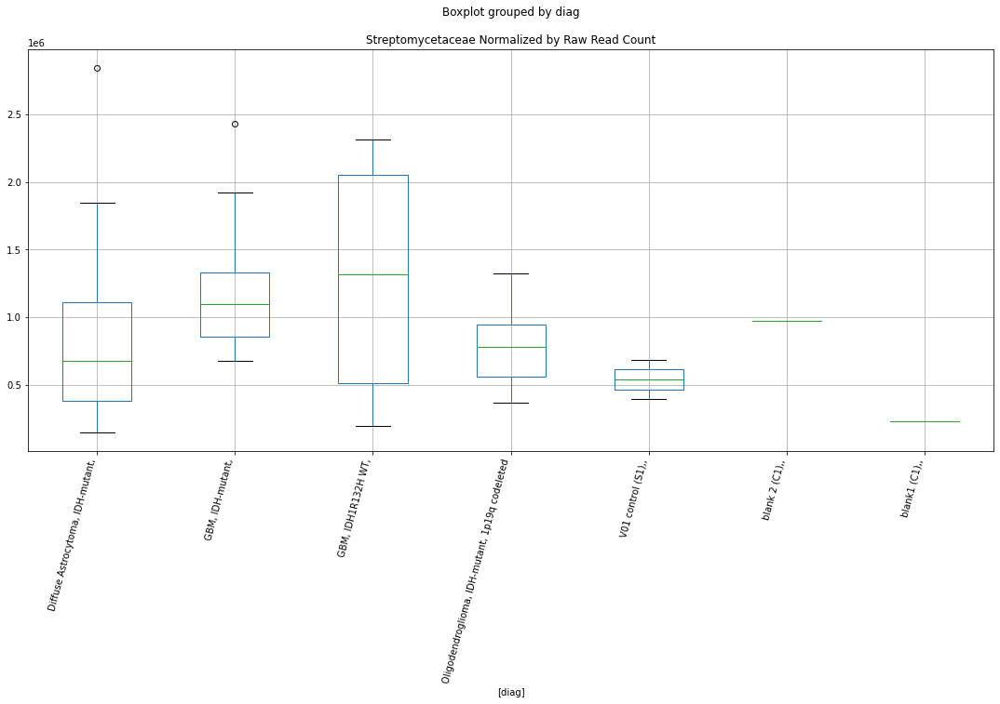

Desulfobacteraceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.0118100870452342
	p = 0.05945433478047475
Desulfobacteraceae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.0118100870452342
	p = 0.05945433478047475


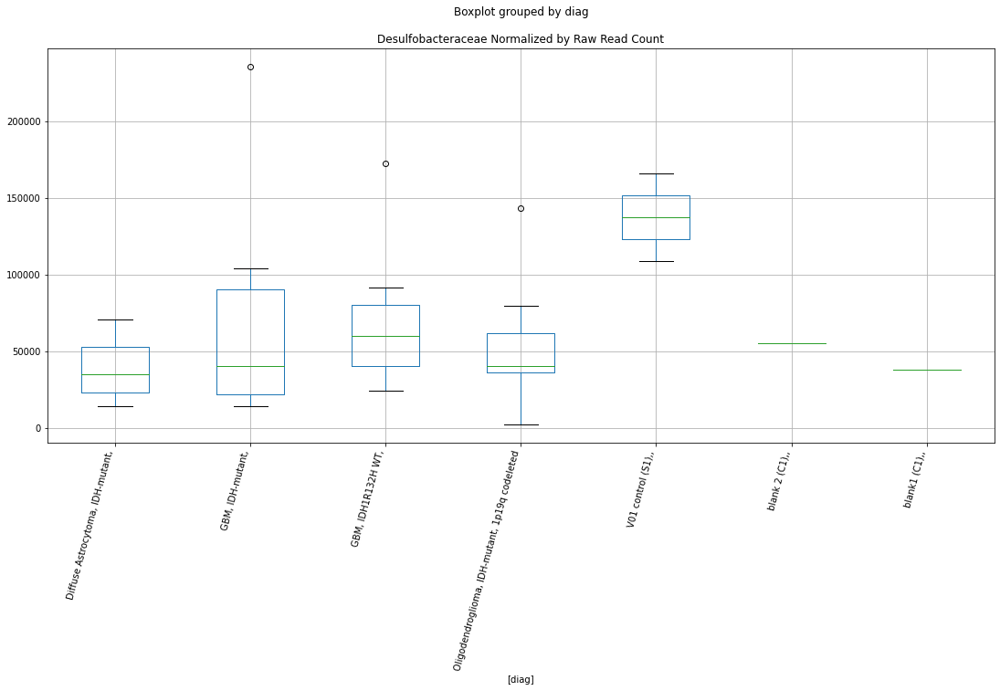

Desulfobacteraceae Lexogen bbduk2 : GBM, IDH-mutant, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.8319551235681089
	p = 0.08355802007892289
Desulfobacteraceae Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH-mutant,
	t = -1.8319551235681089
	p = 0.08355802007892289


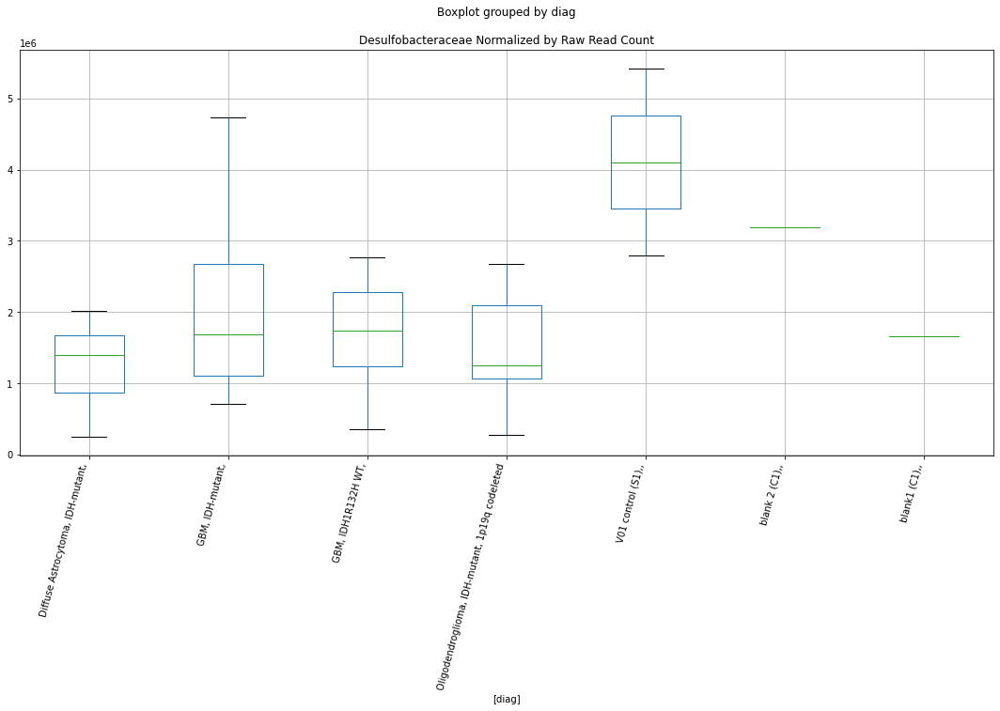

Desulfobacteraceae Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.0516187578959486
	p = 0.05504752305555834
Desulfobacteraceae Lexogen cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.0516187578959486
	p = 0.05504752305555834


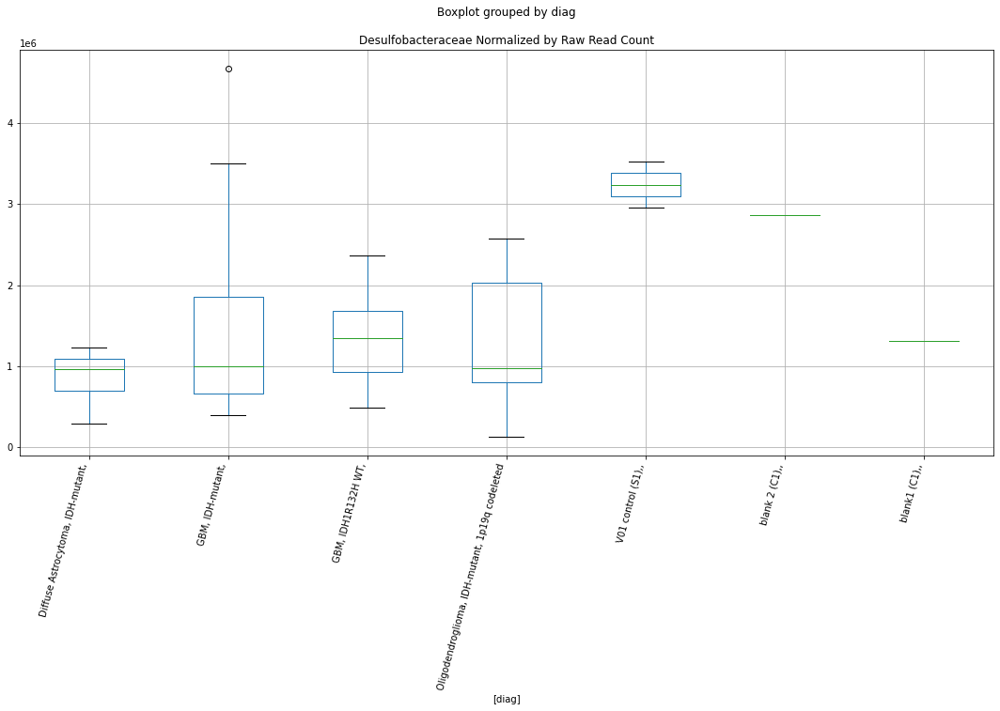

Daphniidae Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.9151327113152712
	p = 0.07150325453035603
Daphniidae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.323952984249202
	p = 0.03203407149442422
Daphniidae Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.9151327113152712
	p = 0.07150325453035603
Daphniidae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.323952984249202
	p = 0.03203407149442422


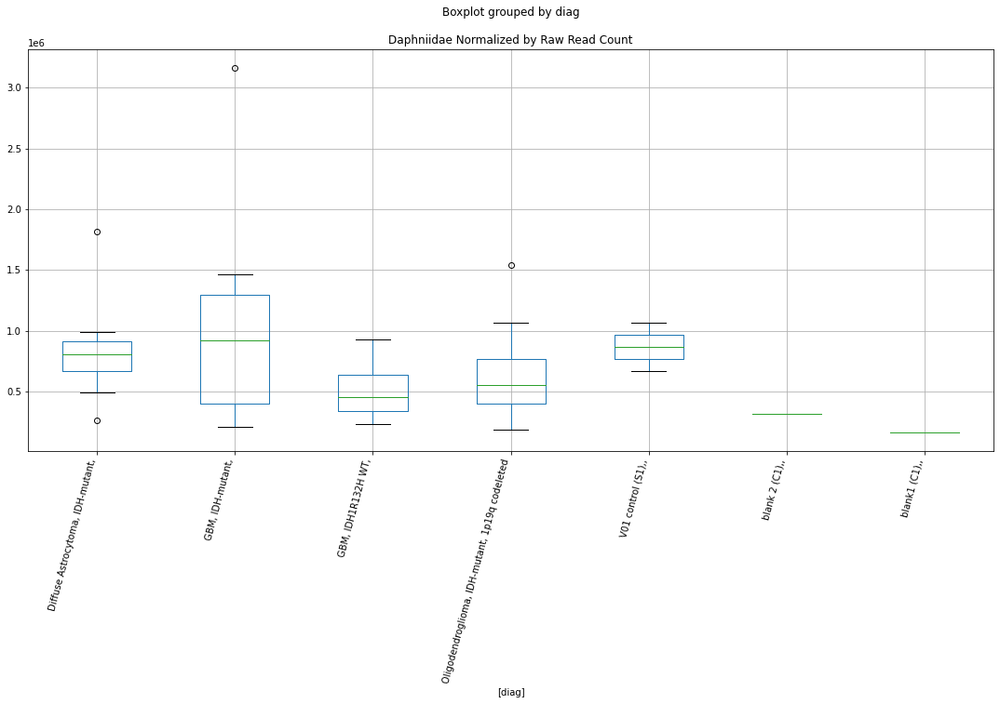

Daphniidae Lexogen bbduk2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.1499790930186107
	p = 0.04539880531851875
Daphniidae Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.4151287015951652
	p = 0.026587476889663782
Daphniidae Lexogen bbduk2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.1499790930186107
	p = 0.04539880531851875
Daphniidae Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.4151287015951652
	p = 0.026587476889663782


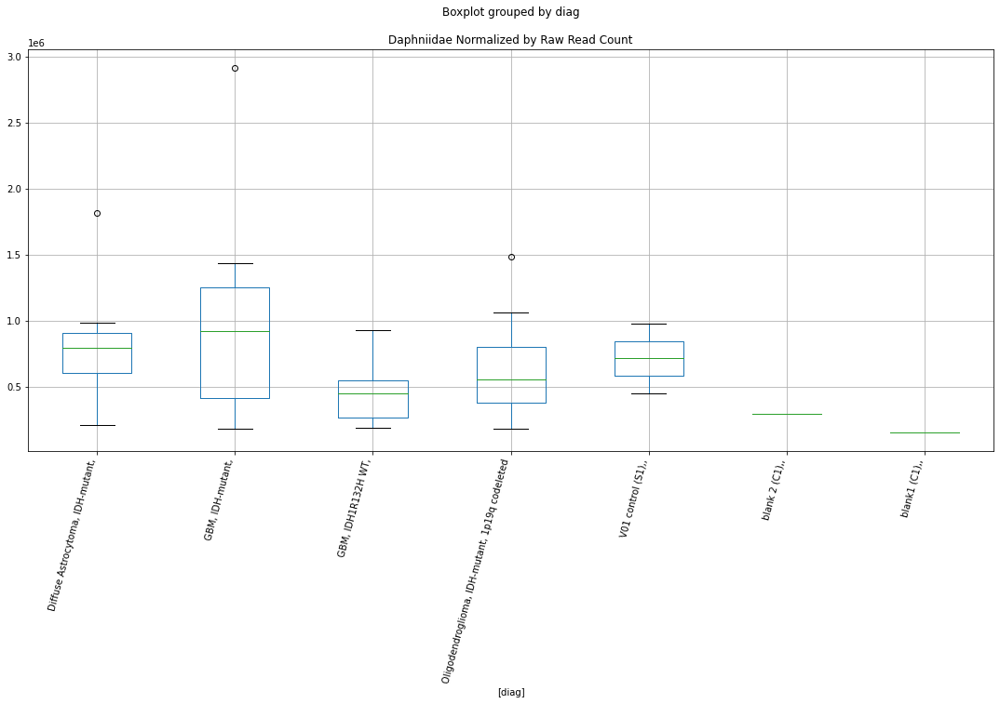

Daphniidae Lexogen bbduk3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.151786767603996
	p = 0.04523688836025769
Daphniidae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.4156592020378143
	p = 0.026558483912001888
Daphniidae Lexogen bbduk3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.151786767603996
	p = 0.04523688836025769
Daphniidae Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.4156592020378143
	p = 0.026558483912001888


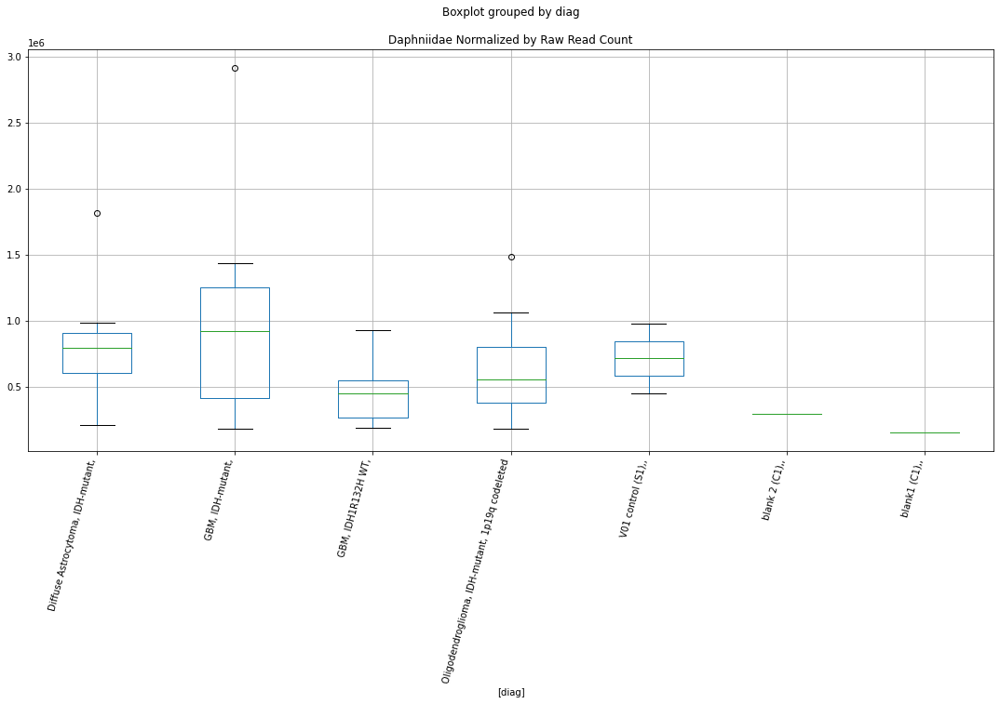

Daphniidae Lexogen cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.1848350232919236
	p = 0.042368270840337396
Daphniidae Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.394648511855167
	p = 0.027729673987916575
Daphniidae Lexogen cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.1848350232919236
	p = 0.042368270840337396
Daphniidae Lexogen cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.394648511855167
	p = 0.027729673987916575


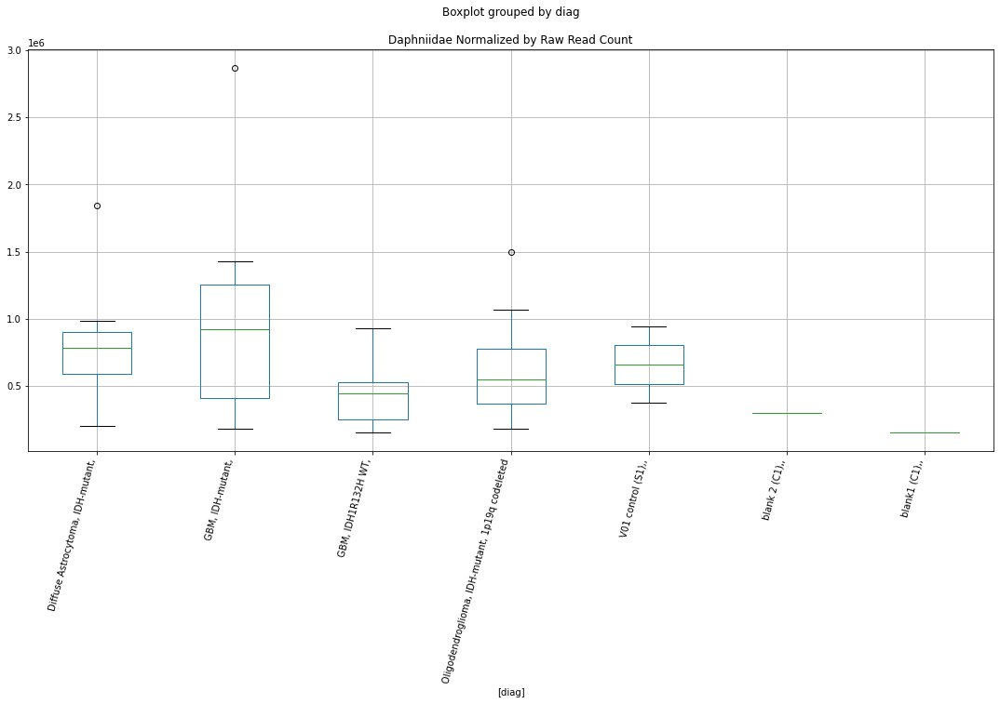

Daphniidae Lexogen cutadapt2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.1878665996605426
	p = 0.04211365512233353
Daphniidae Lexogen cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.405704304861637
	p = 0.02710750403159799
Daphniidae Lexogen cutadapt2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.1878665996605426
	p = 0.04211365512233353
Daphniidae Lexogen cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.405704304861637
	p = 0.02710750403159799


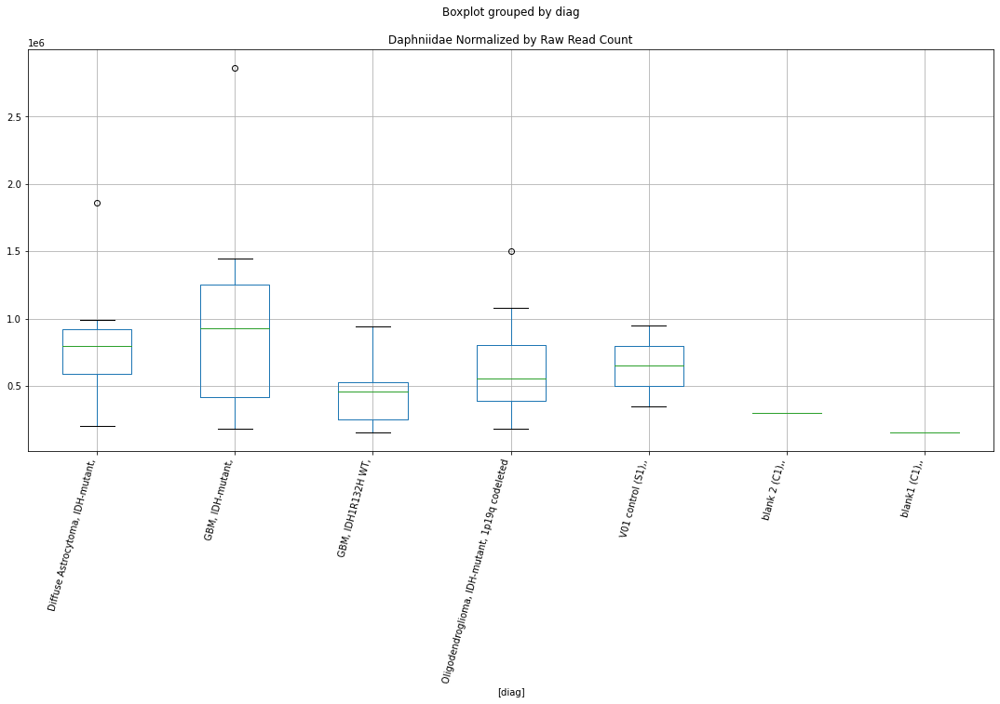

Daphniidae Lexogen cutadapt3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.1914436341233317
	p = 0.041815032988705196
Daphniidae Lexogen cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.409448869601943
	p = 0.026899754072131084
Daphniidae Lexogen cutadapt3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.1914436341233317
	p = 0.041815032988705196
Daphniidae Lexogen cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.409448869601943
	p = 0.026899754072131084


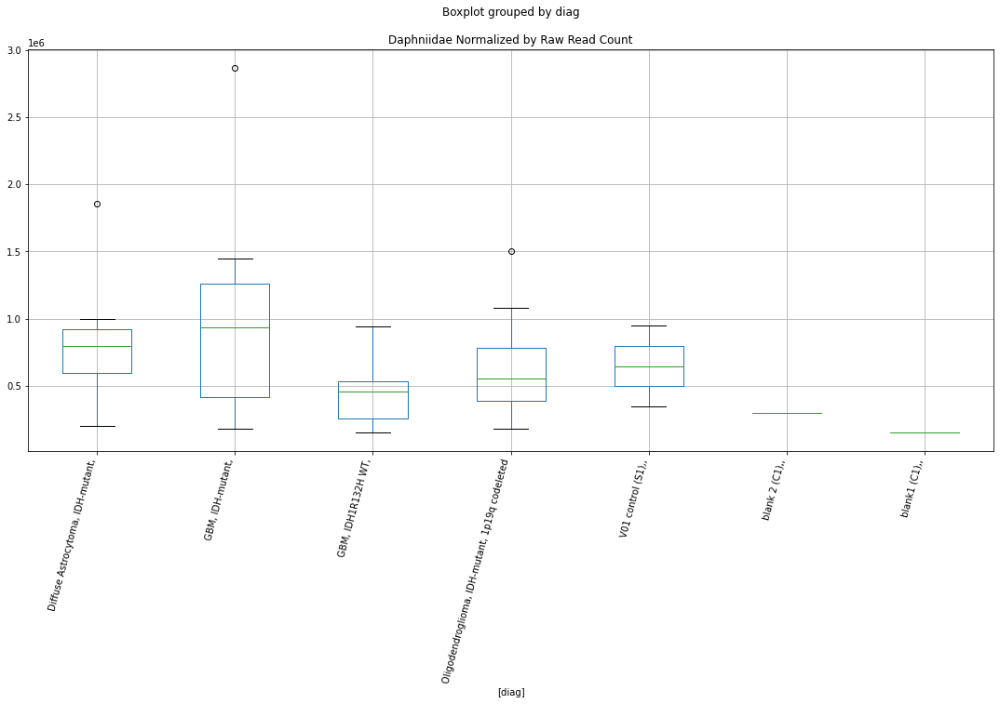

Shewanellaceae D-plex bbduk1 : GBM, IDH-mutant, - Diffuse Astrocytoma, IDH-mutant,
	t = 3.750930850166555
	p = 0.0014629065063885456
Shewanellaceae D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.7840889396576403
	p = 0.012246972998781993
Shewanellaceae D-plex bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH-mutant,
	t = -3.750930850166555
	p = 0.0014629065063885456
Shewanellaceae D-plex bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.0642169098897396
	p = 0.053715668719702465
Shewanellaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.7840889396576403
	p = 0.012246972998781993
Shewanellaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.0398426175684867
	p = 0.056319391505024186
Shewanellaceae D-plex bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.0642169098897396
	p = 0.053715668719702465
Shewanellaceae D-

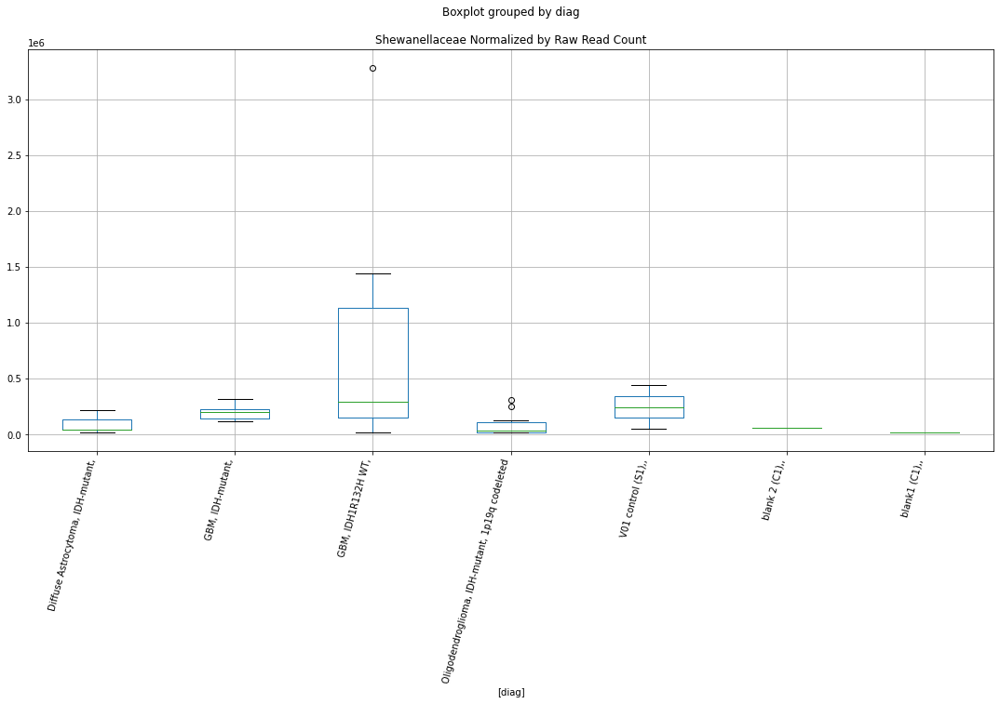

Shewanellaceae D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.1628769637710192
	p = 0.04425501772234118
Shewanellaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.0127516642418204
	p = 0.059346536905787686
Shewanellaceae D-plex cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.1628769637710192
	p = 0.04425501772234118
Shewanellaceae D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0127516642418204
	p = 0.059346536905787686


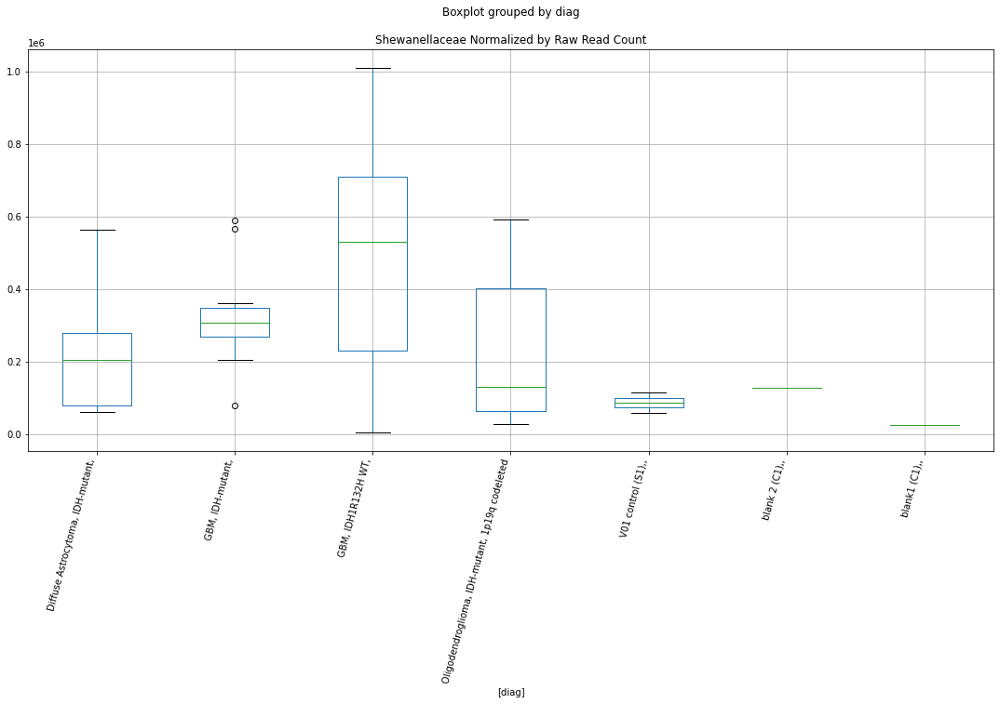

Shewanellaceae D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.1319425131797822
	p = 0.04704361105538284
Shewanellaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.023280770622451
	p = 0.05815302231595056
Shewanellaceae D-plex cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.1319425131797822
	p = 0.04704361105538284
Shewanellaceae D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.023280770622451
	p = 0.05815302231595056


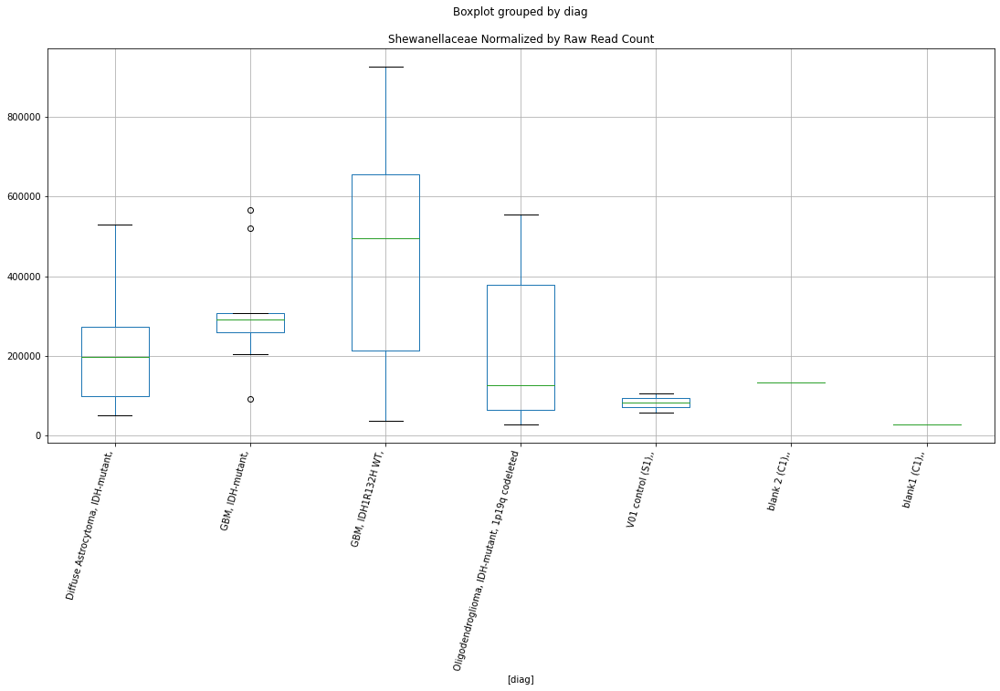

Shewanellaceae Lexogen cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.736844126107694
	p = 0.09949681776094416
Shewanellaceae Lexogen cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -1.736844126107694
	p = 0.09949681776094416


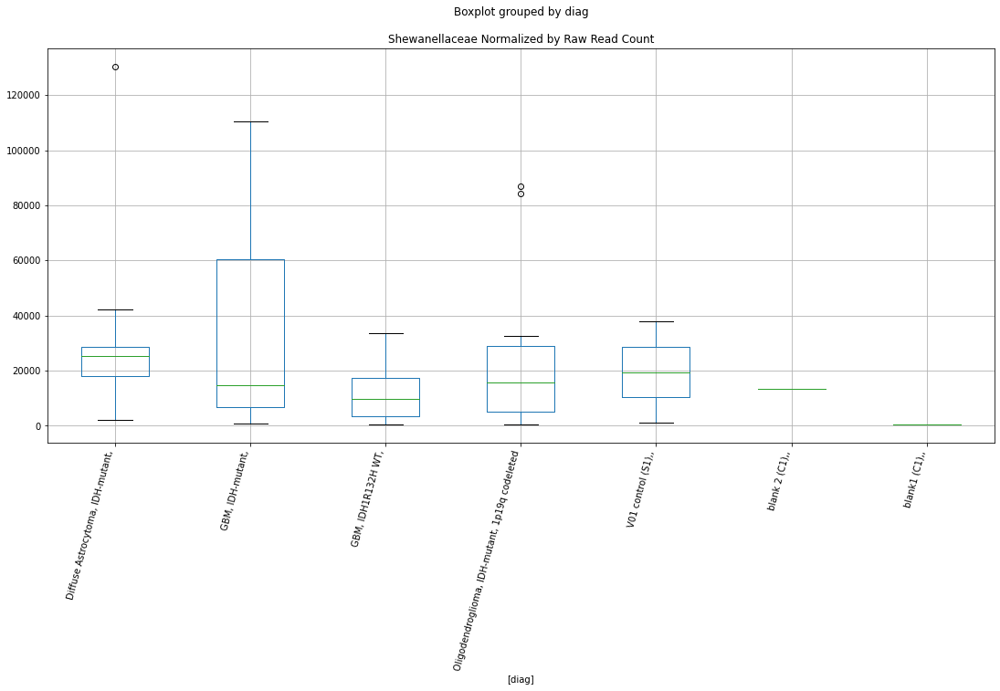

In [56]:
selected=['subject','sample','Lab kit','Trimmer','diag']
for col in families:
    for labkit in "D-plex","Lexogen":
        for trimmer in "bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
            ps=[]
            for diag in diags:
                others=diags.copy()
                others.remove(diag)
                for other in others:
                    t, p = stats.ttest_ind(
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==diag))][col],
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==other))][col])
                    if p < 0.10:
                        print(col+" "+labkit+" "+trimmer+" : "+diag+" - "+other)
                        print("\tt = " + str(t))
                        print("\tp = " + str(p))
                    ps=np.append(ps,p)
            if(any(p < 0.10 for p in ps)):
                selected=np.append(selected,col)
                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer))].boxplot(column=col,by=['diag'])
                plt.title(col + " Normalized by Raw Read Count")
                plt.xticks(rotation=75,ha='right')
                plt.show()
selected=np.unique(selected)


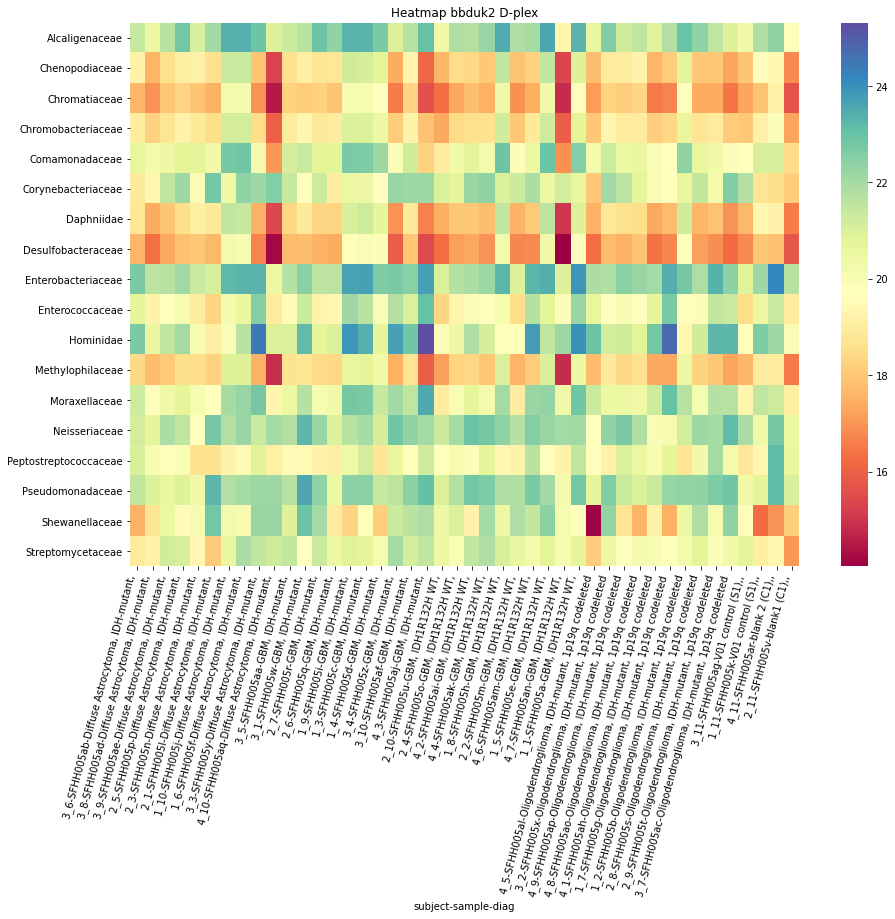

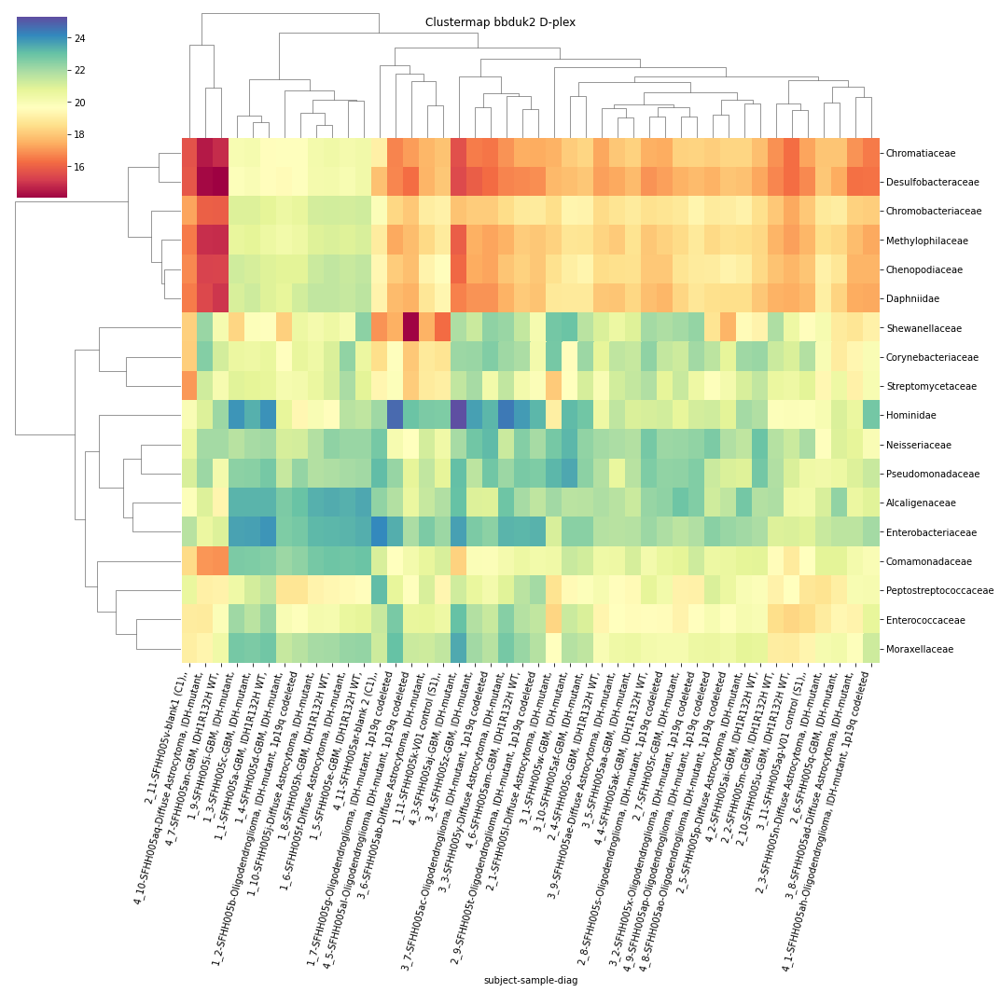

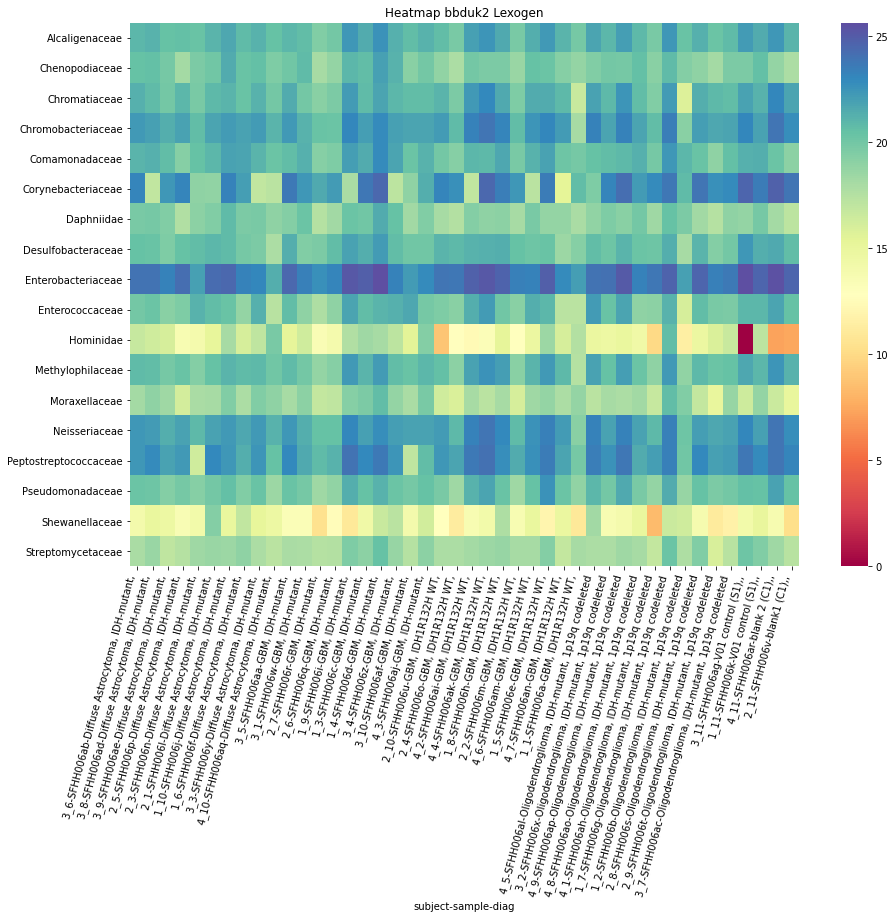

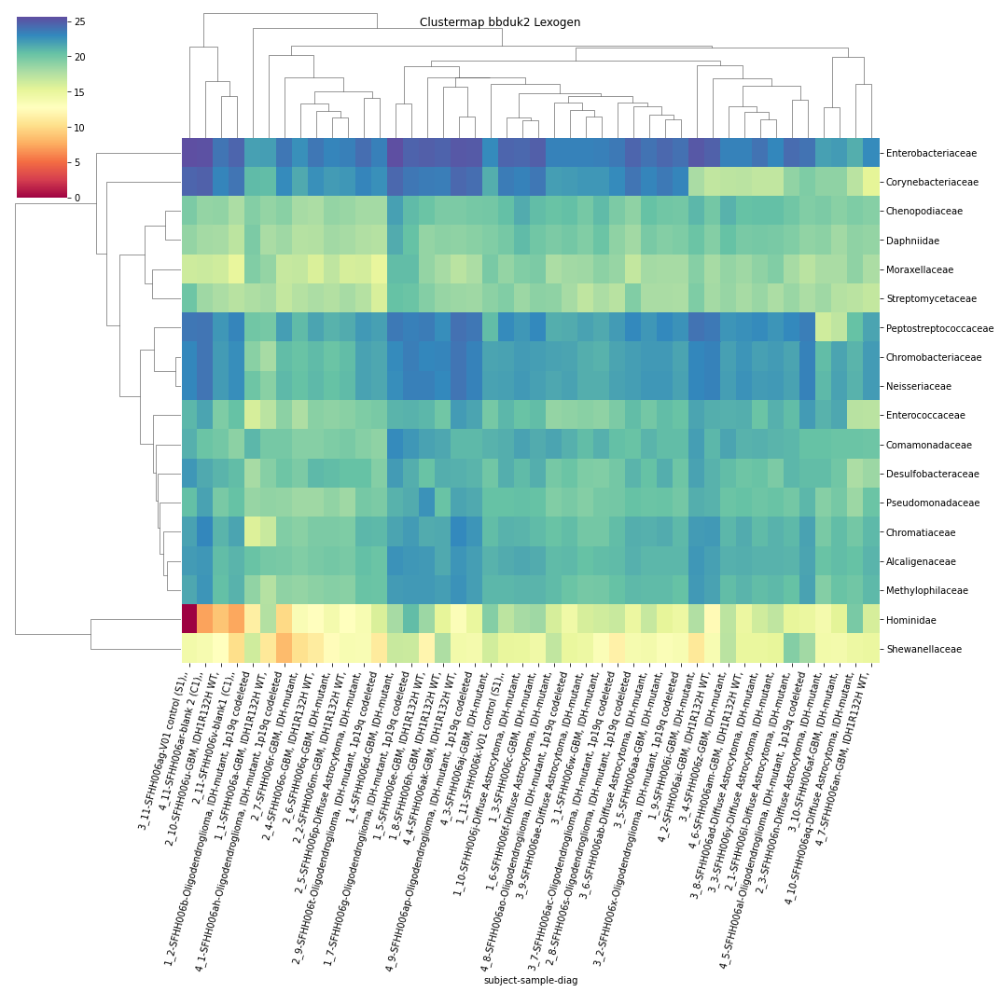

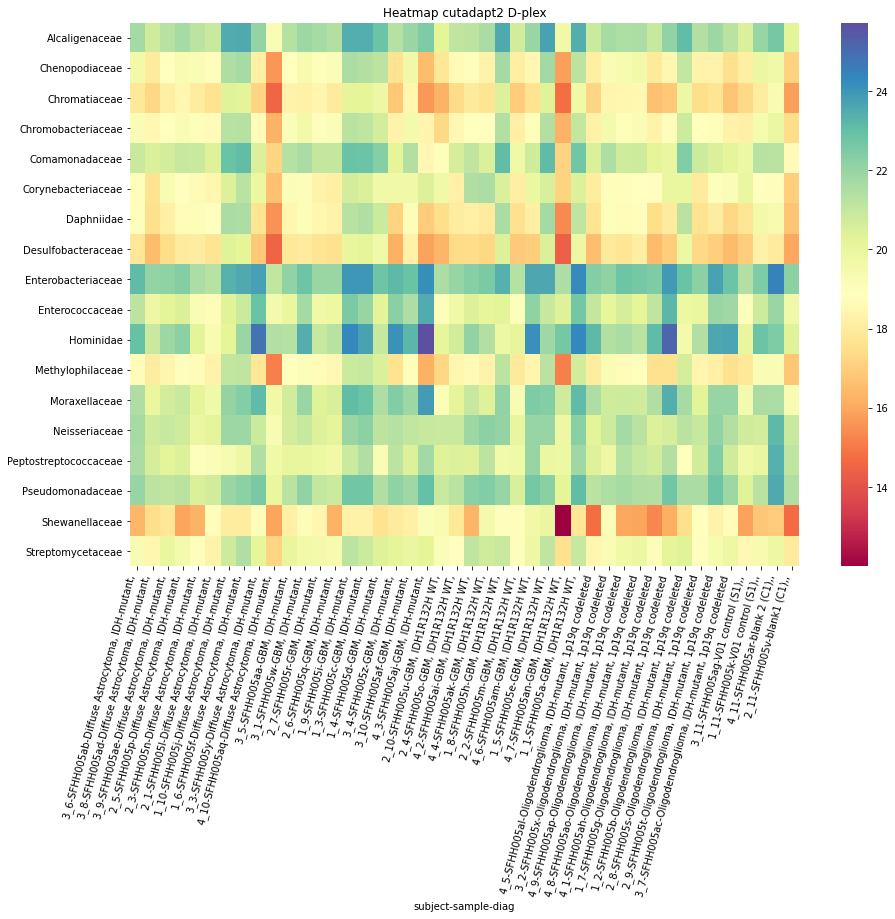

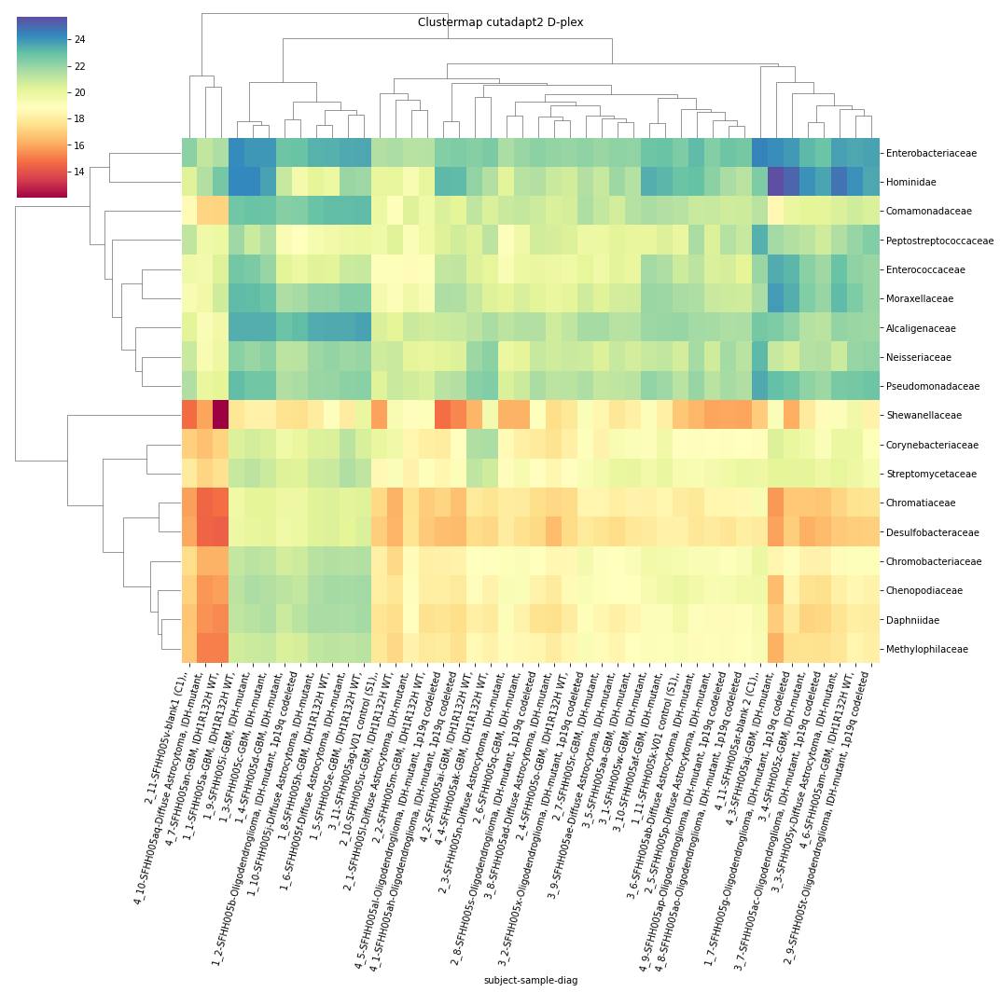

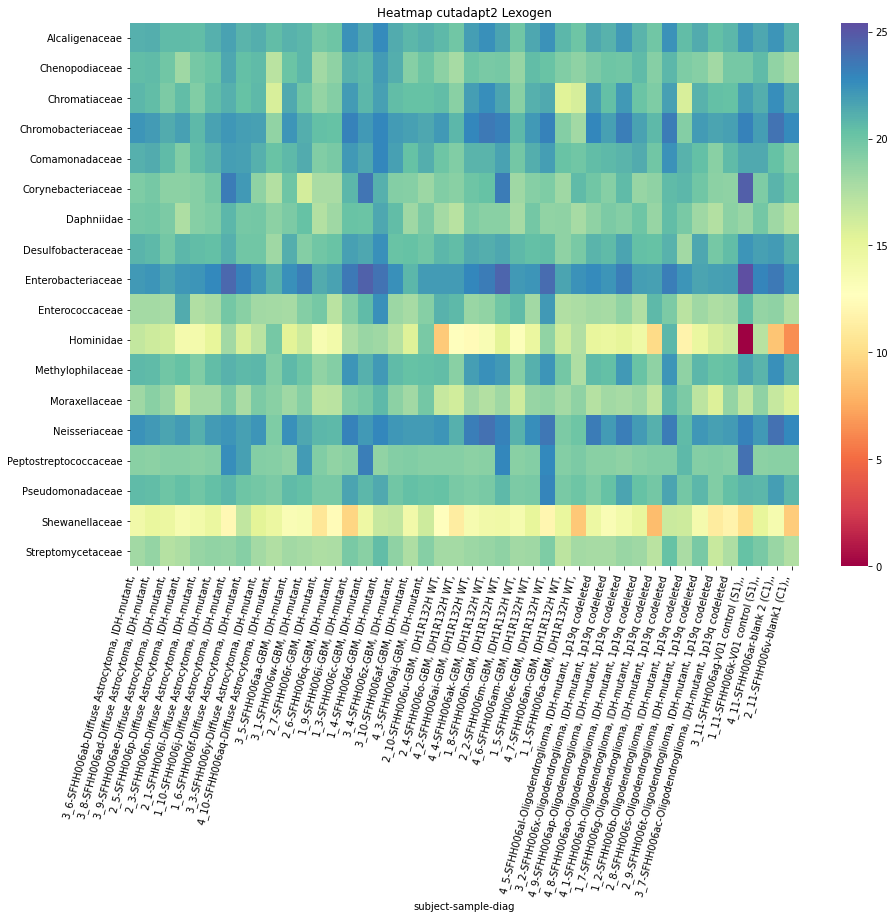

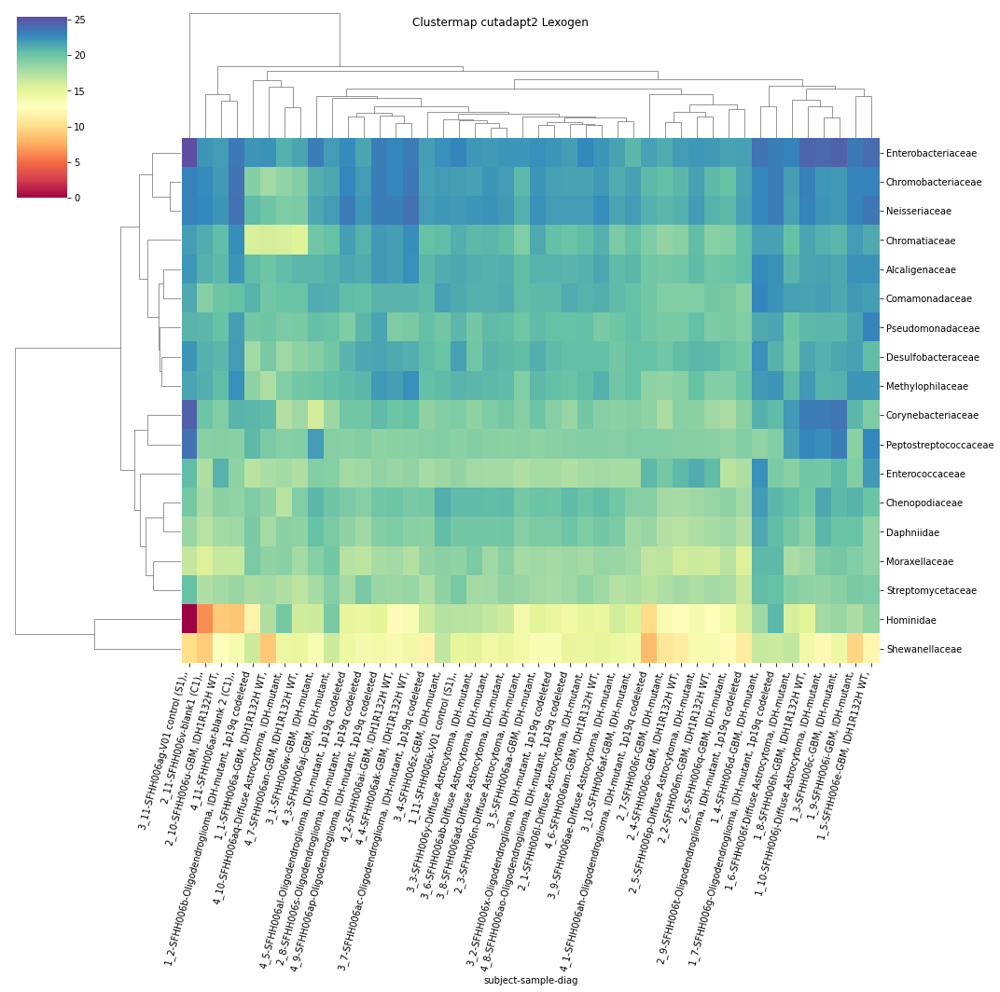

In [57]:
#for trimmer in dfn['Trimmer'].unique():
for trimmer in 'bbduk2','cutadapt2':
    for labkit in dfn['Lab kit'].unique():
        tmp=dfn[selected]
        tmp=tmp[(tmp['Trimmer']==trimmer) & (tmp['Lab kit']==labkit)]
        tmp=tmp.drop('Trimmer',axis='columns')
        tmp=tmp.drop('Lab kit',axis='columns')
        tmp.set_index(['subject','sample','diag'],inplace=True)
        tmp=tmp.transform(lambda x: np.log2(x))
        tmp=tmp.fillna(0).sort_values(['diag']).T
        plt.subplots(figsize=(15,10))
        sns.heatmap(tmp,cmap="Spectral")
        plt.xticks(rotation=75,ha='right')
        plt.title("Heatmap "+trimmer+" "+labkit)
        plt.show()
        g=sns.clustermap(tmp,mask=False,figsize=(15,15),cmap="Spectral")
        g.fig.suptitle("Clustermap "+trimmer+" "+labkit)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')
        plt.show()

# Normalize by Trimmed Read Count

In [58]:
dfn=df.copy()

In [59]:
dfn.head()

,sample,Subject,Lab kit,Trimmer,Raw Read Count,Raw Read Length,Trimmed Read Count,Trimmed Ave Read Length,STAR Aligned to Transcriptome,STAR Aligned to Transcriptome %,...,rnL1M2,rnL1MB7,rnA-rich,subject,dplex,lexogen,diag,disease,idh,x1p19q
0,SFHH005aa,3_5,D-plex,bbduk1,7706323,201,4578177,57.8849,99328,2.16,...,297,306,87,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
1,SFHH005aa,3_5,D-plex,bbduk2,7706323,201,7054912,60.3426,140222,1.98,...,3056,1883,5067,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
2,SFHH005aa,3_5,D-plex,bbduk3,7706323,201,7067406,60.5684,138584,1.96,...,3268,2038,5298,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
3,SFHH005aa,3_5,D-plex,cutadapt1,7706323,201,4879448,132.375,105508,2.16,...,524,594,273,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,
4,SFHH005aa,3_5,D-plex,cutadapt2,7706323,201,4877655,131.86,119834,2.45,...,524,594,273,3_5,SFHH005aa,SFHH006aa,"GBM, IDH-mutant,",GBM,IDH-mutant,


In [60]:
dfn[families].head()

,Burkholderiaceae,no family,Enterobacteriaceae,Vibrionaceae,Fabaceae,Morganellaceae,Neisseriaceae,Hominidae,Mycobacteriaceae,Alcaligenaceae,...,Listeriaceae,Clostridiaceae,Oscillospiraceae,Daphniidae,Poaceae,Rhodospirillaceae,Brucellaceae,Erwiniaceae,Microviridae,Shewanellaceae
0,56888,37401,16455,8072,15694,2899,5471,8824,3127,13513,...,1490,2261,1876,2126,1449,2942,1630,2106,1546,963
1,82044,62657,26585,12432,21878,4597,27294,16532,4906,20499,...,2910,3181,2425,2649,1696,3992,1921,3326,2139,15309
2,82026,62032,26595,12422,21879,4595,25366,16533,4905,20578,...,2917,3186,2421,2648,1698,3992,1921,3326,2140,14248
3,93215,77742,35032,15143,22929,5091,27191,20578,6847,28961,...,4063,3729,3410,2814,1795,4784,2117,4018,3313,15031
4,93226,66299,35029,15159,22946,5095,12985,20584,6846,20519,...,4067,3732,3410,2815,1796,4782,2116,4024,3312,2272


In [61]:
dfn[families]=dfn.apply(lambda row: 1e9*pd.to_numeric(row[families])/pd.to_numeric(row['Trimmed Read Count']), axis=1 )


In [62]:
dfn[families].head()

,Burkholderiaceae,no family,Enterobacteriaceae,Vibrionaceae,Fabaceae,Morganellaceae,Neisseriaceae,Hominidae,Mycobacteriaceae,Alcaligenaceae,...,Listeriaceae,Clostridiaceae,Oscillospiraceae,Daphniidae,Poaceae,Rhodospirillaceae,Brucellaceae,Erwiniaceae,Microviridae,Shewanellaceae
0,1.24e+07,8.17e+06,3.59e+06,1.76e+06,3.43e+06,6.33e+05,1.20e+06,1.93e+06,6.83e+05,2.95e+06,...,325457.05,493864.70,409770.09,464376.98,316501.52,642613.86,356036.91,460008.43,337689.00,2.10e+05
1,1.16e+07,8.88e+06,3.77e+06,1.76e+06,3.10e+06,6.52e+05,3.87e+06,2.34e+06,6.95e+05,2.91e+06,...,412478.57,450891.52,343732.14,375483.07,240399.88,565846.89,272292.55,471444.58,303193.01,2.17e+06
2,1.16e+07,8.78e+06,3.76e+06,1.76e+06,3.10e+06,6.50e+05,3.59e+06,2.34e+06,6.94e+05,2.91e+06,...,412739.84,450801.89,342558.50,374677.78,240257.88,564846.56,271811.19,470611.14,302798.51,2.02e+06
3,1.91e+07,1.59e+07,7.18e+06,3.10e+06,4.70e+06,1.04e+06,5.57e+06,4.22e+06,1.40e+06,5.94e+06,...,832676.16,764225.79,698849.54,576704.58,367869.48,980438.77,433860.55,823453.80,678970.24,3.08e+06
4,1.91e+07,1.36e+07,7.18e+06,3.11e+06,4.70e+06,1.04e+06,2.66e+06,4.22e+06,1.40e+06,4.21e+06,...,833802.31,765121.76,699106.44,577121.59,368209.72,980389.14,433815.02,824986.60,679014.81,4.66e+05


Burkholderiaceae D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8104461626216337
	p = 0.08695257465012543
Burkholderiaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8104461626216337
	p = 0.08695257465012543


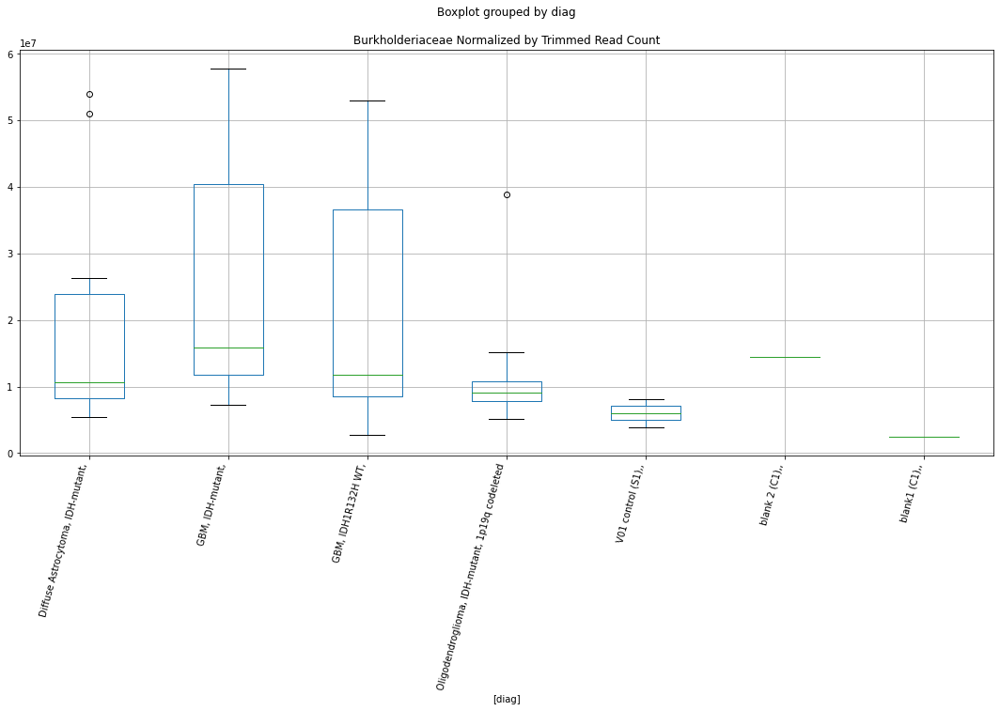

Burkholderiaceae D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9396052049244077
	p = 0.06826335337827297
Burkholderiaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9396052049244077
	p = 0.06826335337827297


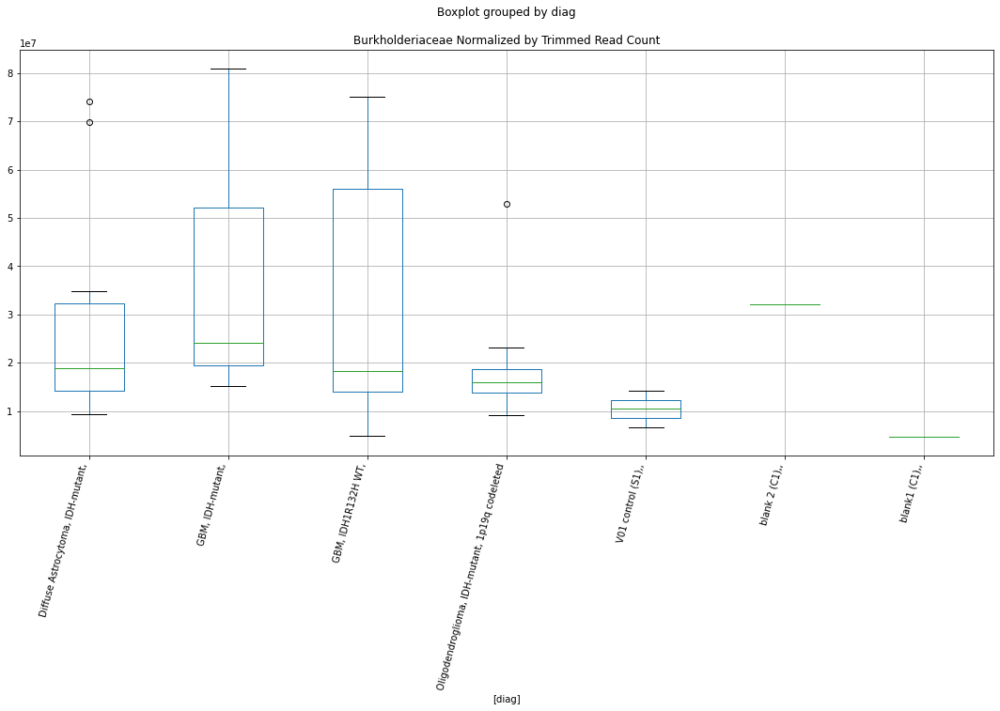

Burkholderiaceae D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9401923396377618
	p = 0.06818725588917204
Burkholderiaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9401923396377618
	p = 0.06818725588917204


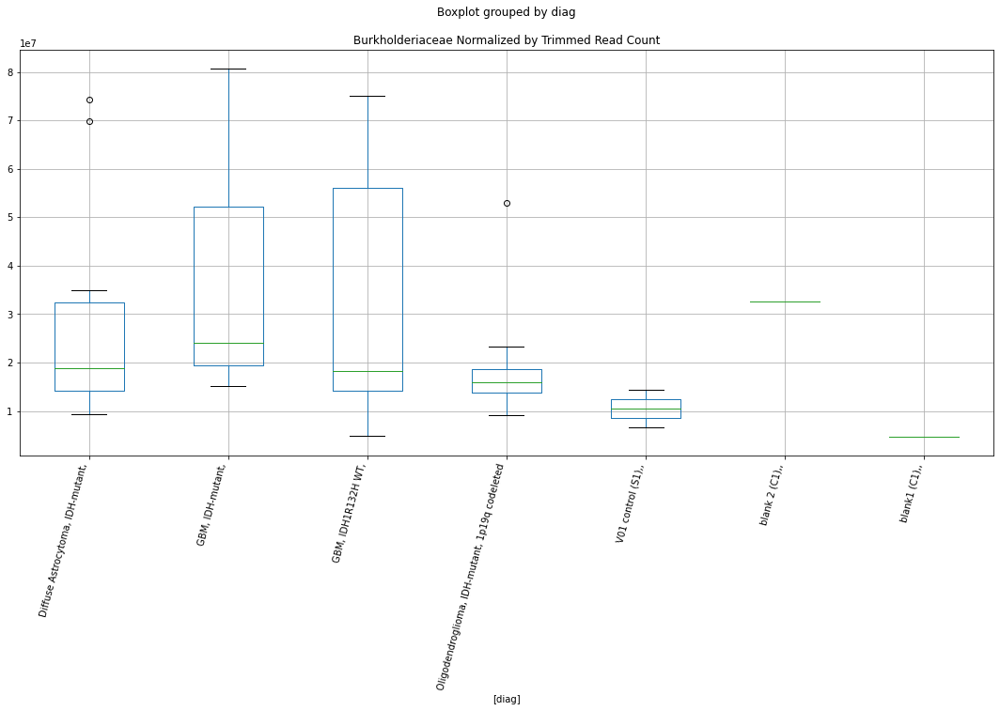

Burkholderiaceae D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9402022682887017
	p = 0.06818596970485319
Burkholderiaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9402022682887017
	p = 0.06818596970485319


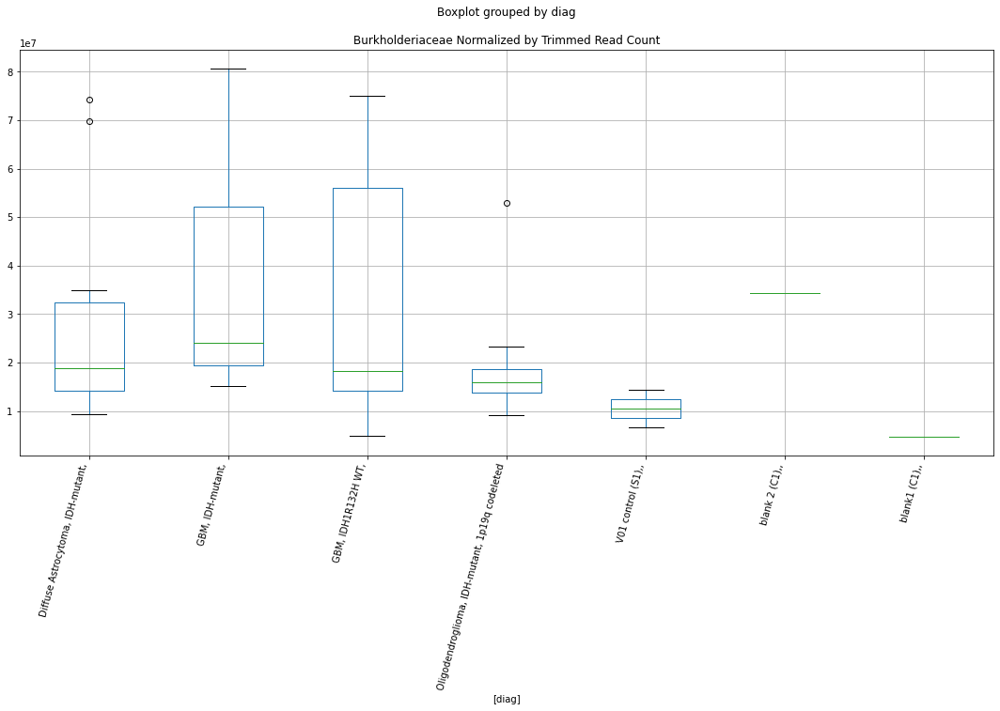

Burkholderiaceae Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.800294347876457
	p = 0.08859626632937853
Burkholderiaceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.16673122928066
	p = 0.04391837159086034
Burkholderiaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.800294347876457
	p = 0.08859626632937853
Burkholderiaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.16673122928066
	p = 0.04391837159086034


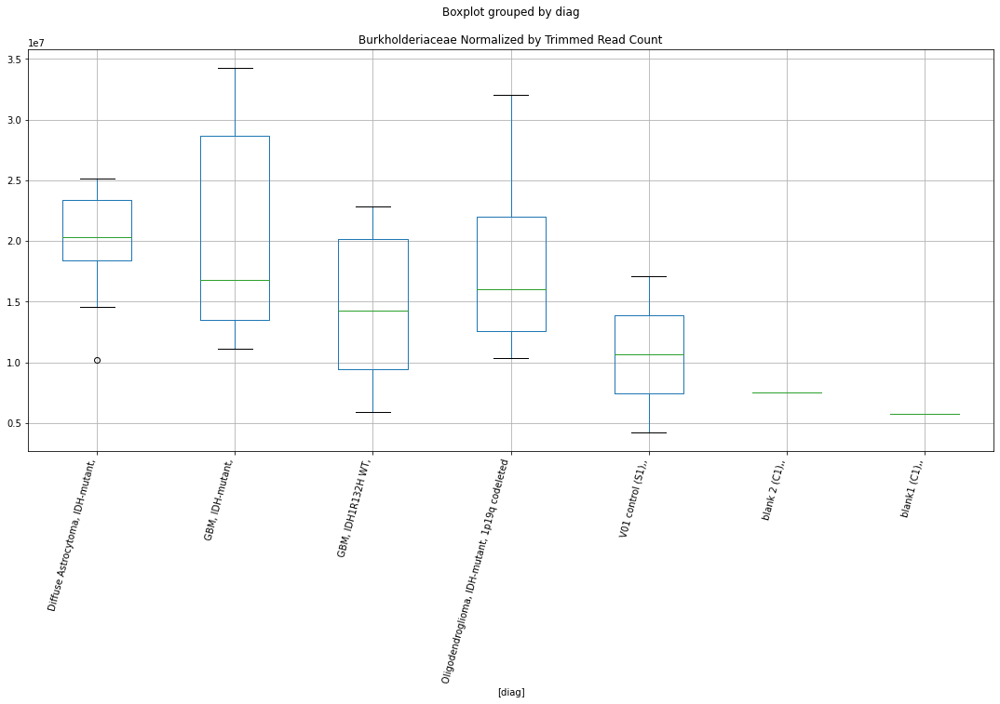

no family D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.926624678594295
	p = 0.06996518166001932
no family D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.926624678594295
	p = 0.06996518166001932


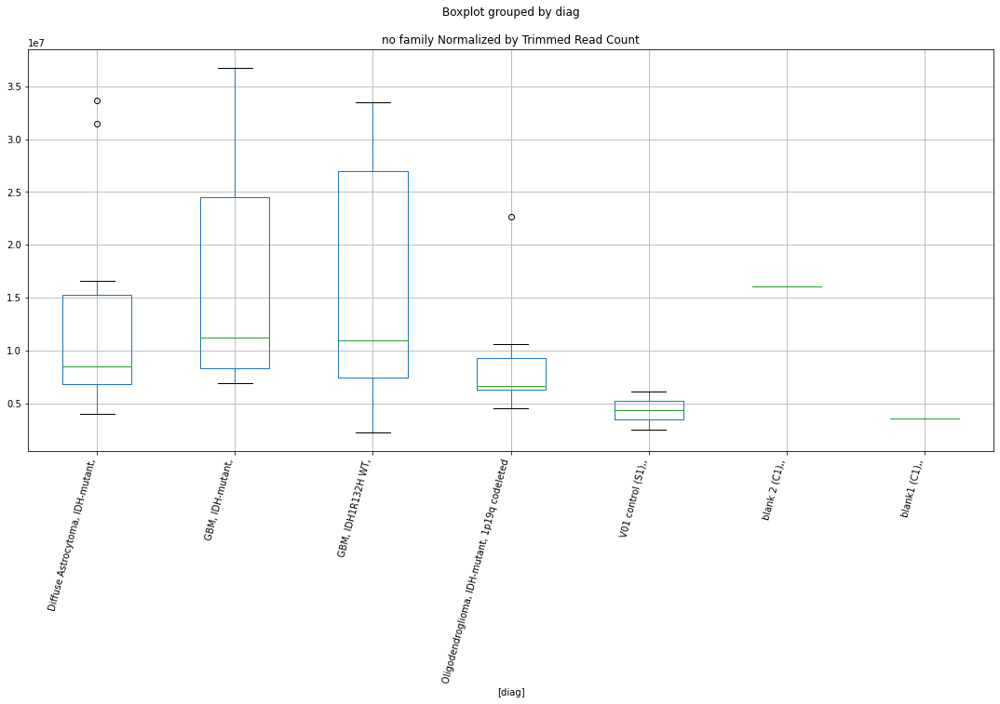

no family D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.144693980382869
	p = 0.04587524510364792
no family D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.144693980382869
	p = 0.04587524510364792
no family D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9604476072266666
	p = 0.06560791146895689
no family D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9604476072266666
	p = 0.06560791146895689


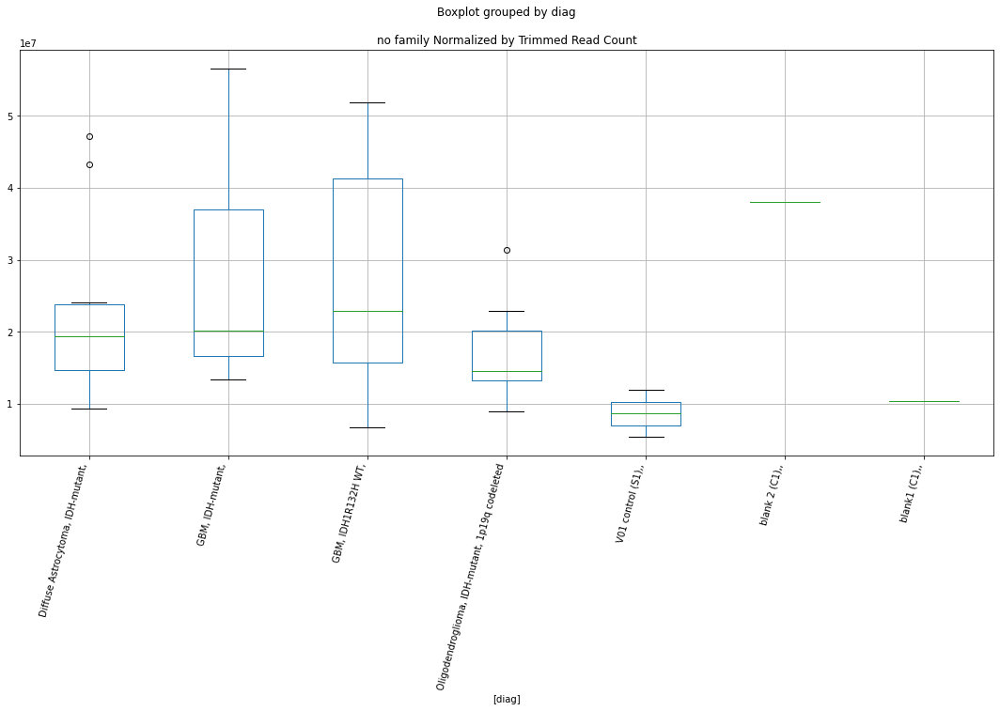

no family D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.071566004520779
	p = 0.05295227156708798
no family D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.071566004520779
	p = 0.05295227156708798


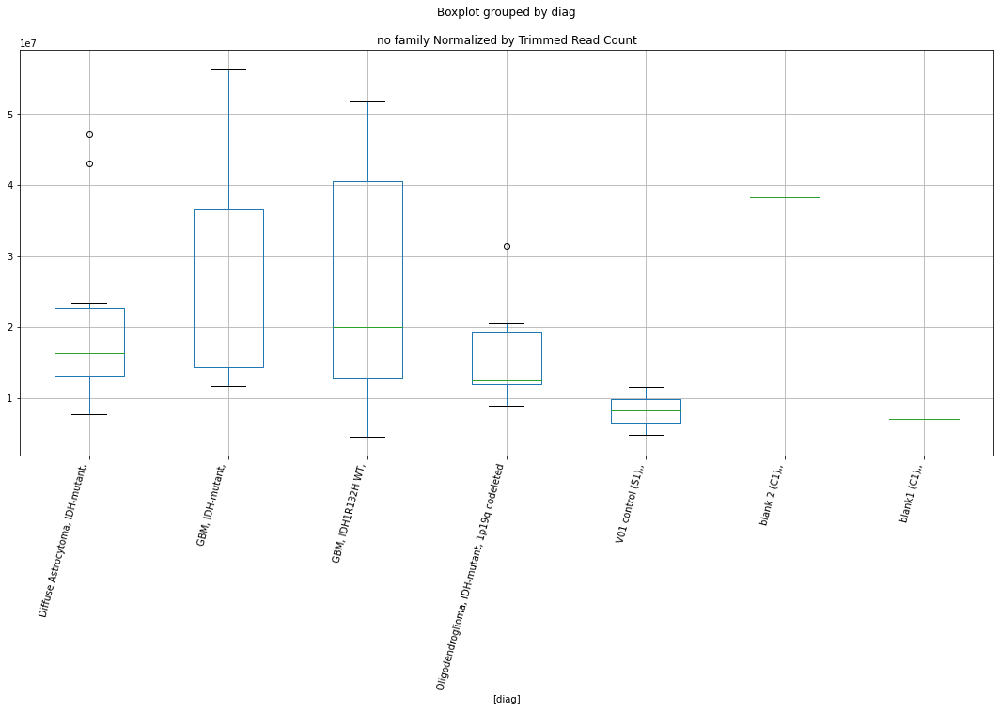

no family D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0698340566902855
	p = 0.053131289635959575
no family D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0698340566902855
	p = 0.053131289635959575


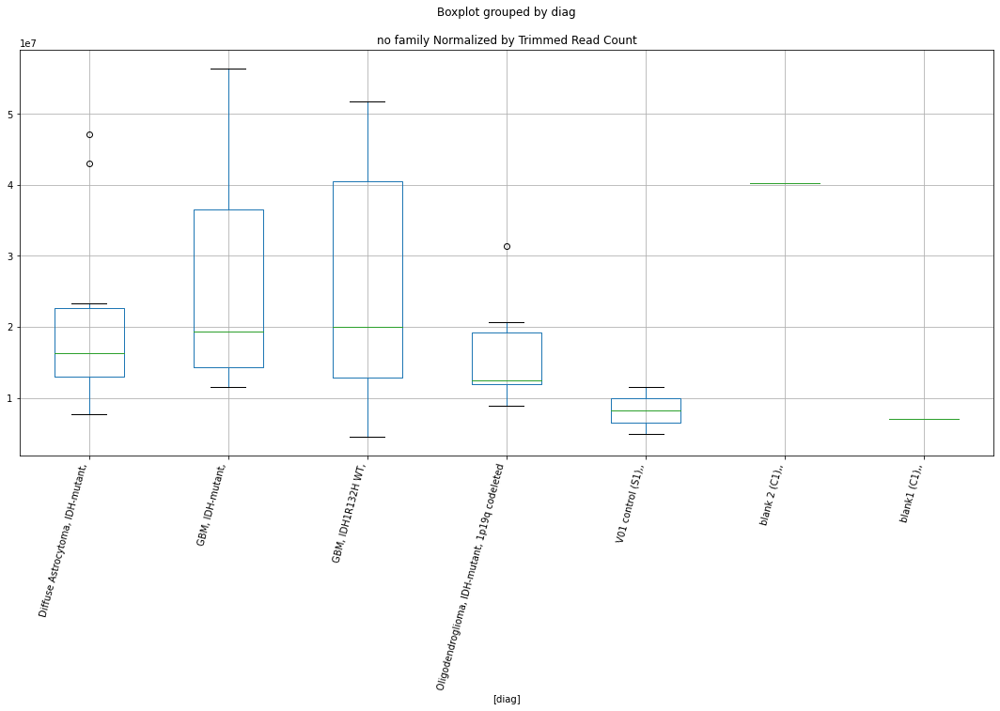

Enterobacteriaceae Lexogen cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.1175040097508337
	p = 0.048399268394686355
Enterobacteriaceae Lexogen cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.1175040097508337
	p = 0.048399268394686355


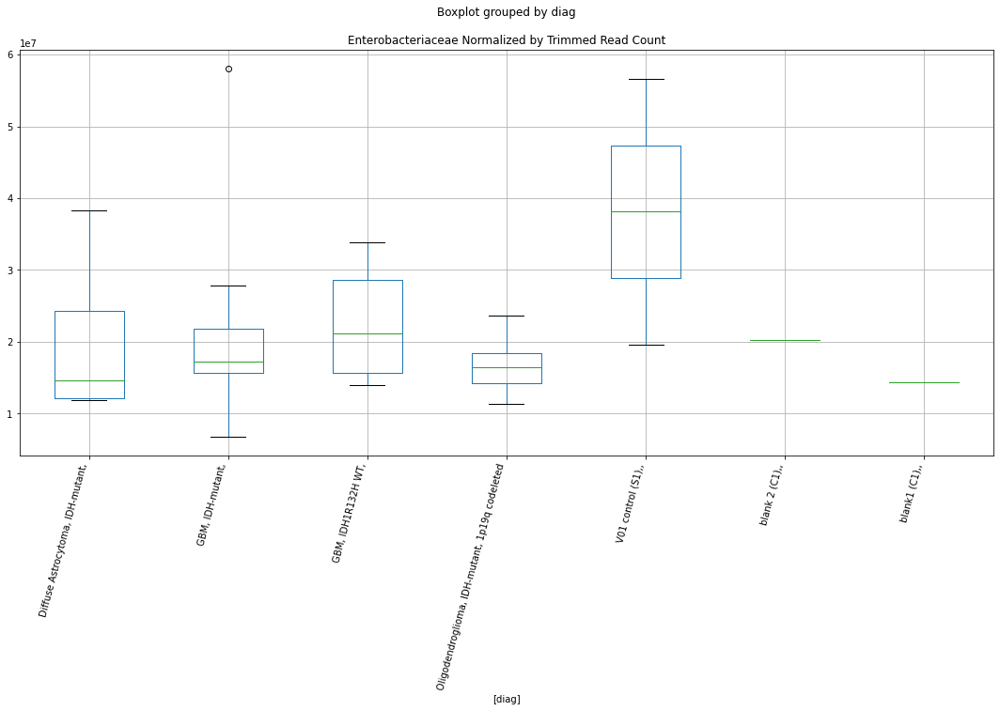

Enterobacteriaceae Lexogen cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.112709723107956
	p = 0.04885722139415151
Enterobacteriaceae Lexogen cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.112709723107956
	p = 0.04885722139415151


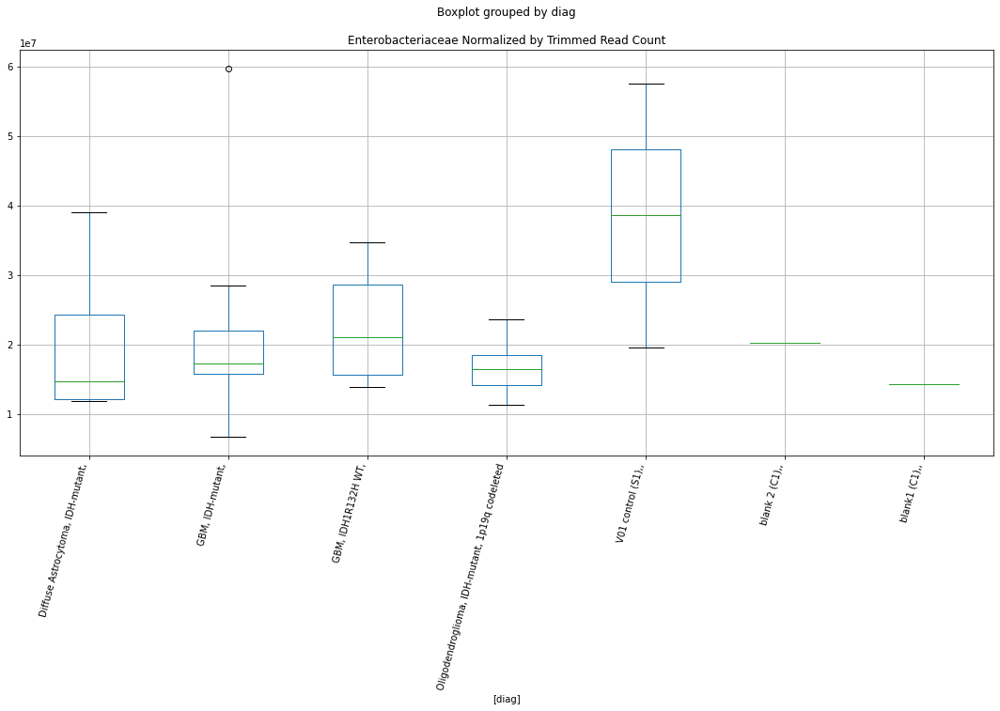

Fabaceae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.7736298821339886
	p = 0.0930434420701411
Fabaceae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.75495712738665
	p = 0.09627229549488599
Fabaceae Lexogen bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = 1.7736298821339886
	p = 0.0930434420701411
Fabaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.75495712738665
	p = 0.09627229549488599


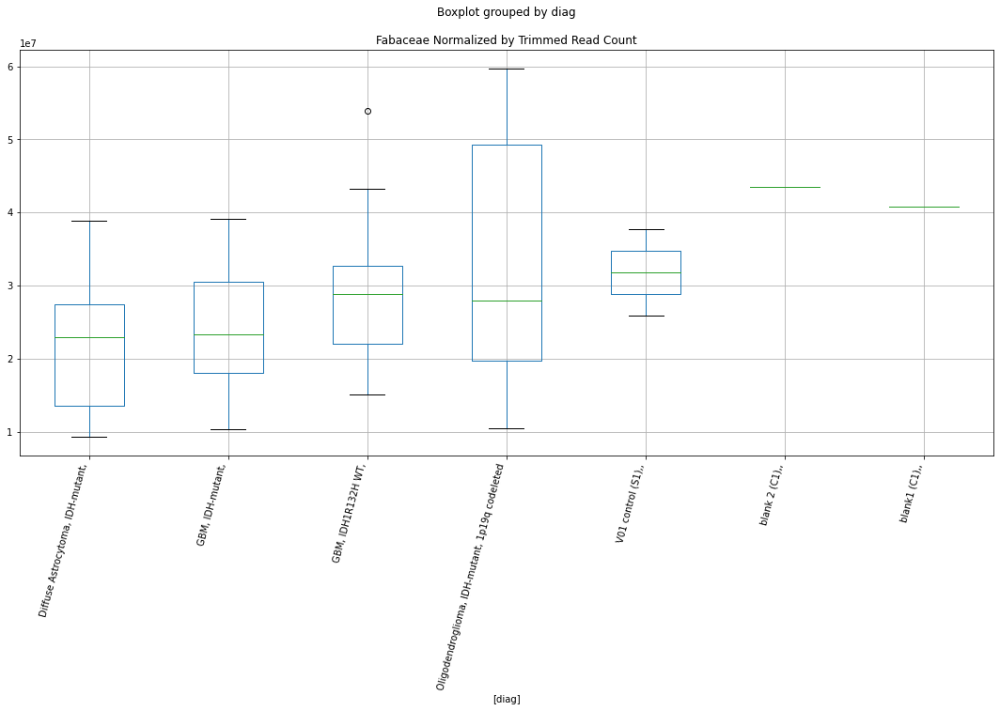

Neisseriaceae D-plex bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.280992956136337
	p = 0.034945067345798414
Neisseriaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -3.0255048963892426
	p = 0.0072704413533218595
Neisseriaceae D-plex bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.280992956136337
	p = 0.034945067345798414
Neisseriaceae D-plex bbduk1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.0255048963892426
	p = 0.0072704413533218595


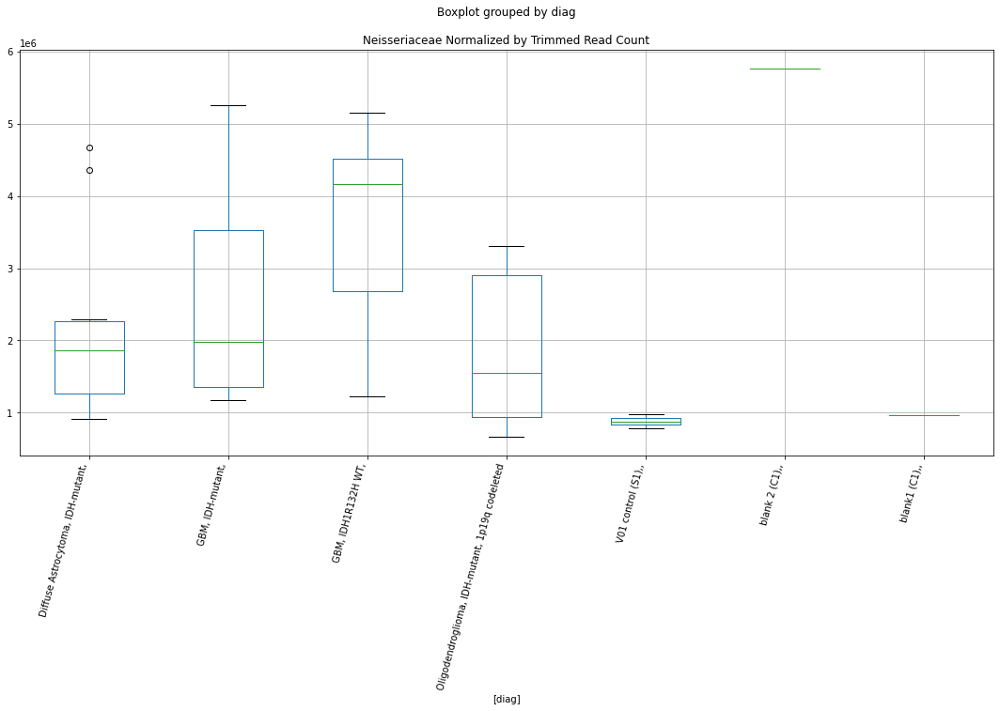

Neisseriaceae D-plex bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.133101028386303
	p = 0.046936350547962635
Neisseriaceae D-plex bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.133101028386303
	p = 0.046936350547962635


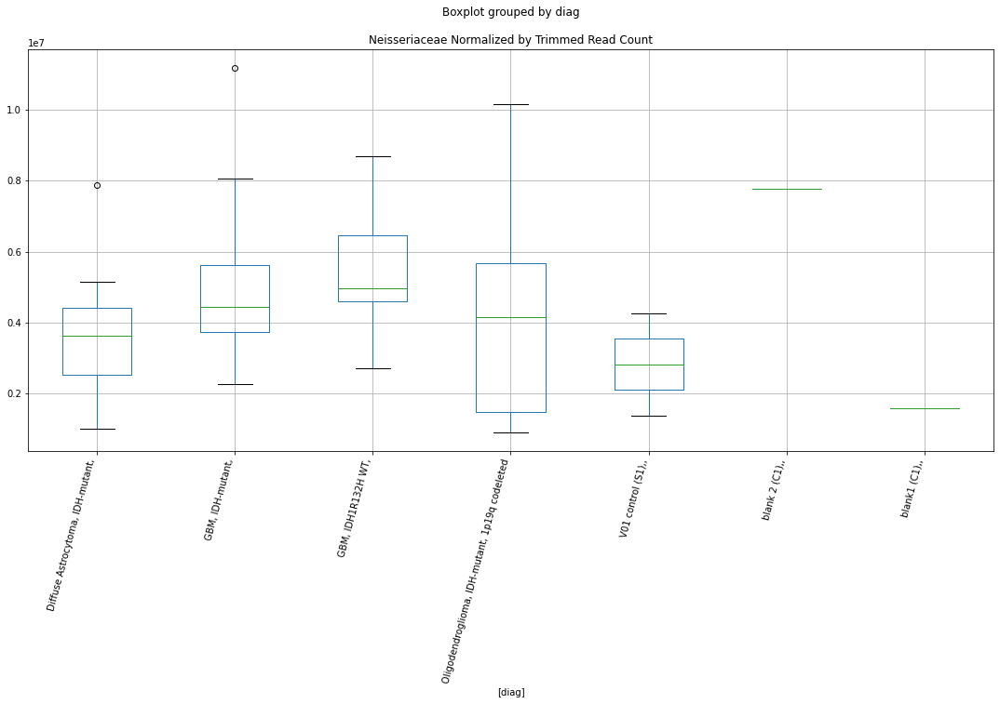

Neisseriaceae D-plex bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.5971521597246827
	p = 0.018208044440663682
Neisseriaceae D-plex bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.5971521597246827
	p = 0.018208044440663682


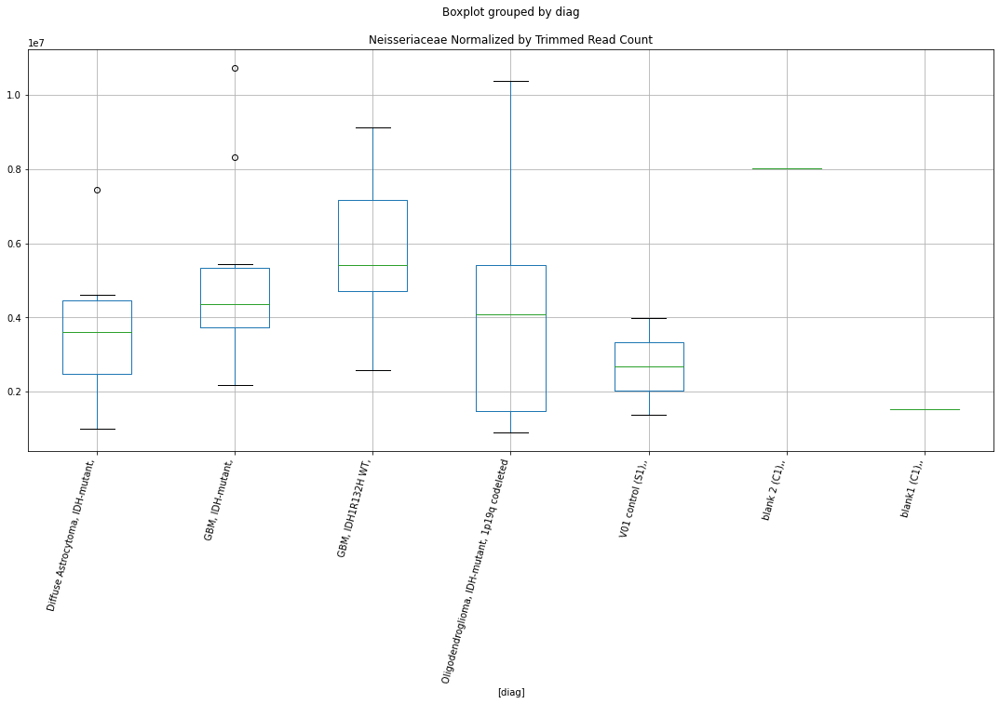

Neisseriaceae D-plex cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.866980724911839
	p = 0.010250074123229277
Neisseriaceae D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -4.4008199043712
	p = 0.0003448378209083402
Neisseriaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -4.061190738453509
	p = 0.0007328585077319905
Neisseriaceae D-plex cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 2.866980724911839
	p = 0.010250074123229277
Neisseriaceae D-plex cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 4.4008199043712
	p = 0.0003448378209083402
Neisseriaceae D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 4.061190738453509
	p = 0.0007328585077319905


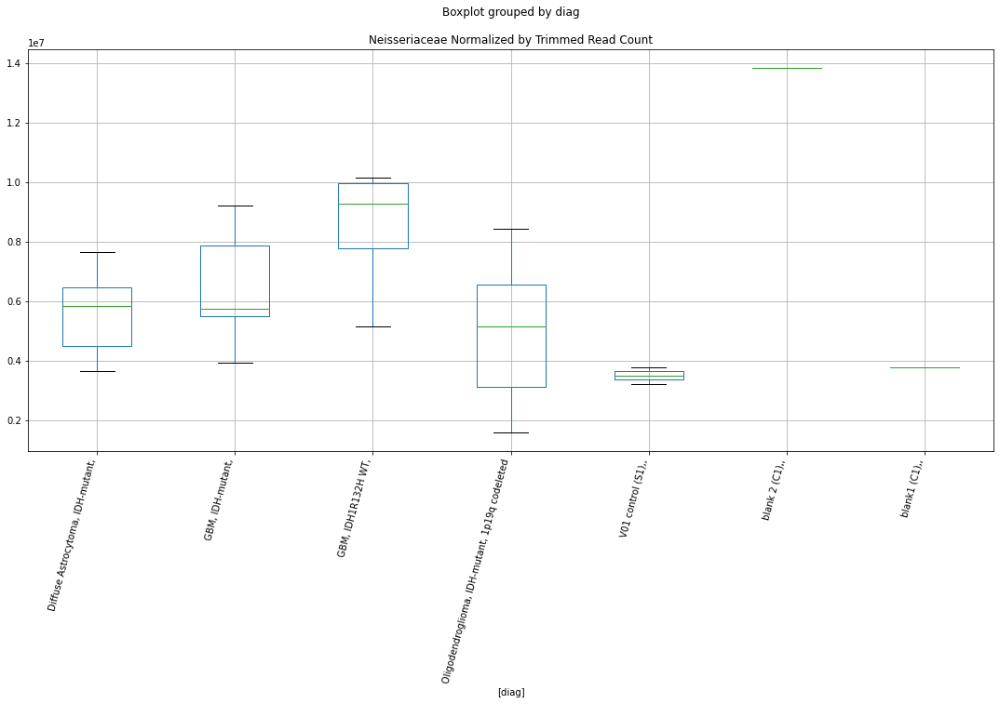

Neisseriaceae D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.1525975059265674
	p = 0.045164440507004404
Neisseriaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.9067680970652514
	p = 0.009406845672200211
Neisseriaceae D-plex cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.1525975059265674
	p = 0.045164440507004404
Neisseriaceae D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.9067680970652514
	p = 0.009406845672200211


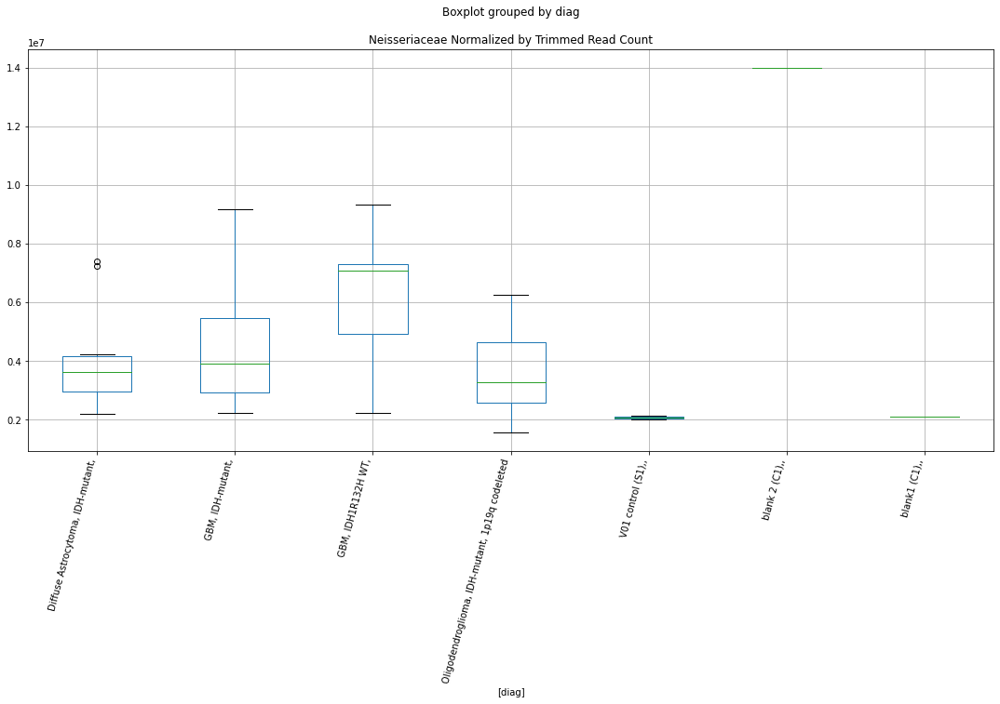

Neisseriaceae D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.1239578932444902
	p = 0.04778896215751377
Neisseriaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.8454324844787093
	p = 0.01073672319446423
Neisseriaceae D-plex cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.1239578932444902
	p = 0.04778896215751377
Neisseriaceae D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.8454324844787093
	p = 0.01073672319446423


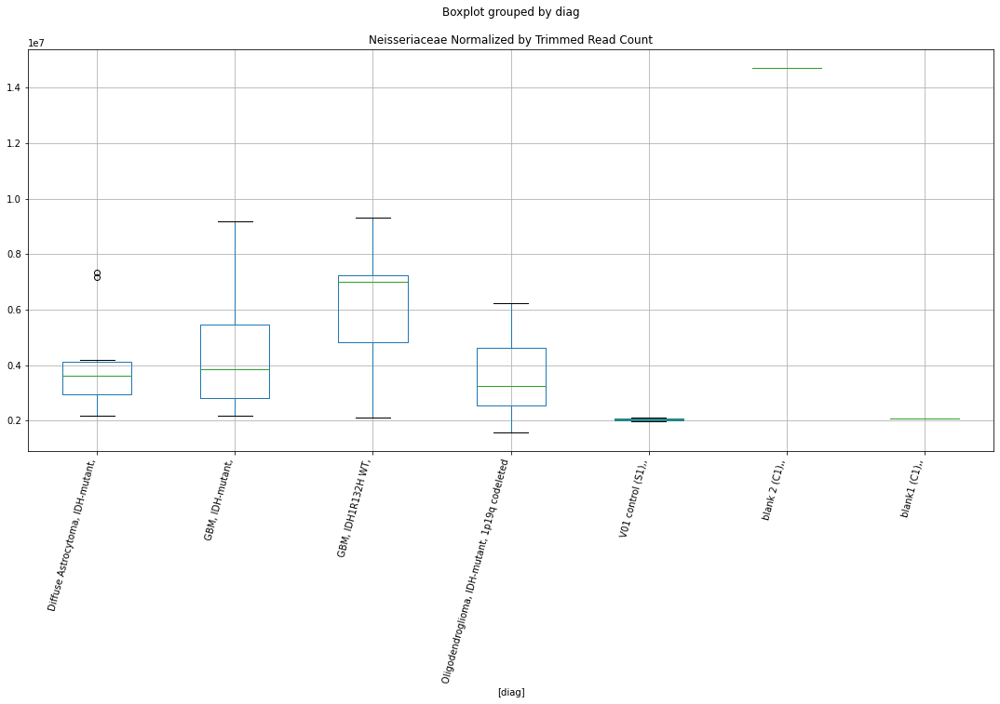

Neisseriaceae Lexogen bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.7848349032583102
	p = 0.09115147600977751
Neisseriaceae Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.2785202252414756
	p = 0.035119860074354324
Neisseriaceae Lexogen bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = 1.7848349032583102
	p = 0.09115147600977751
Neisseriaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 2.2785202252414756
	p = 0.035119860074354324


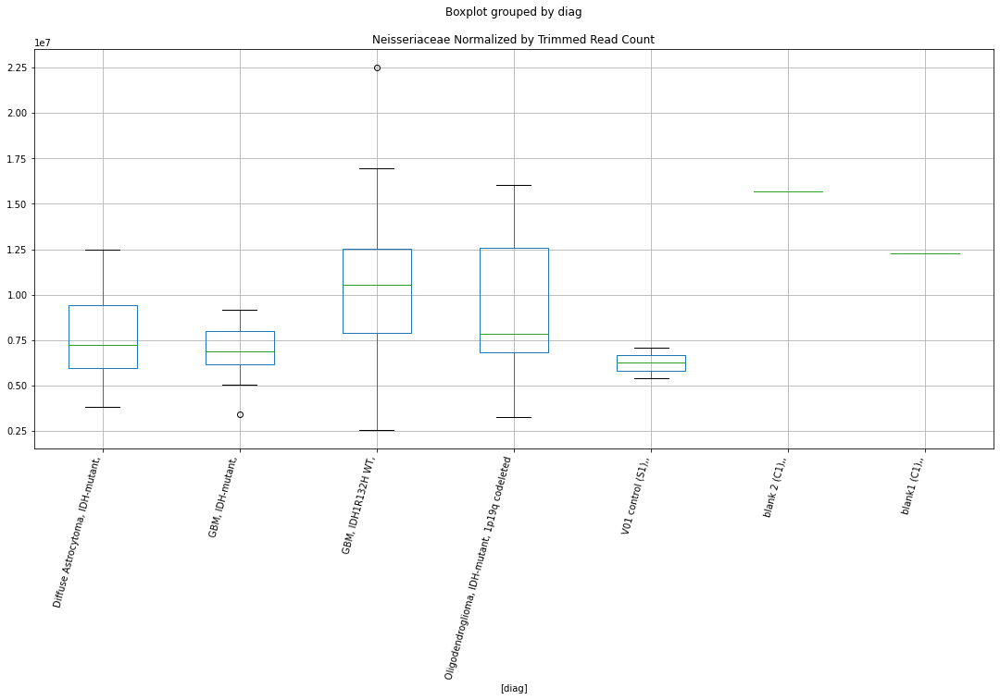

Neisseriaceae Lexogen bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.9174287233829863
	p = 0.07119357753062874
Neisseriaceae Lexogen bbduk2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.142982775413207
	p = 0.04603048185117189
Neisseriaceae Lexogen bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = 1.9174287233829863
	p = 0.07119357753062874
Neisseriaceae Lexogen bbduk2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 2.142982775413207
	p = 0.04603048185117189


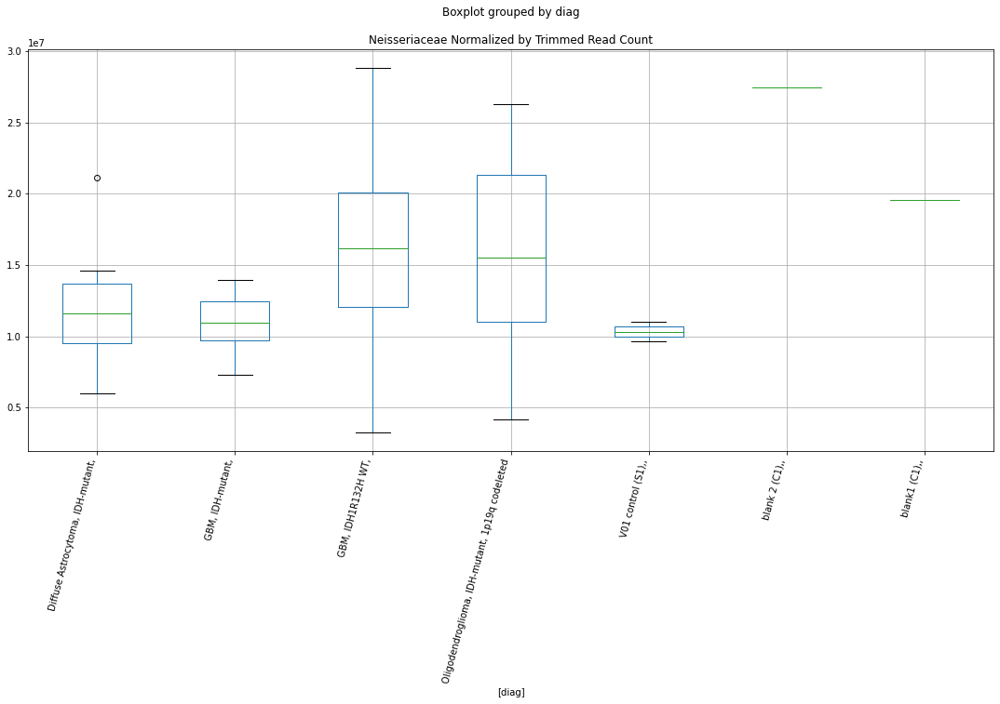

Neisseriaceae Lexogen bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.9382804058044332
	p = 0.06843533644044132
Neisseriaceae Lexogen bbduk3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.150241252856099
	p = 0.04537529036226876
Neisseriaceae Lexogen bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = 1.9382804058044332
	p = 0.06843533644044132
Neisseriaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 2.150241252856099
	p = 0.04537529036226876


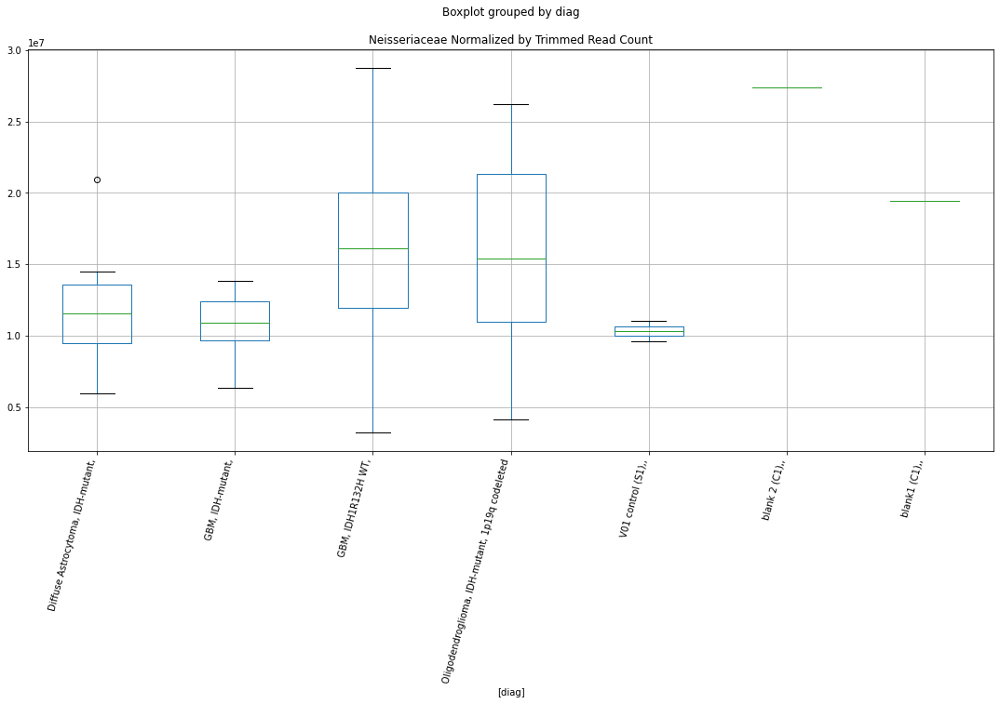

Neisseriaceae Lexogen cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.8266493647821935
	p = 0.08438439059933589
Neisseriaceae Lexogen cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = 1.8266493647821935
	p = 0.08438439059933589


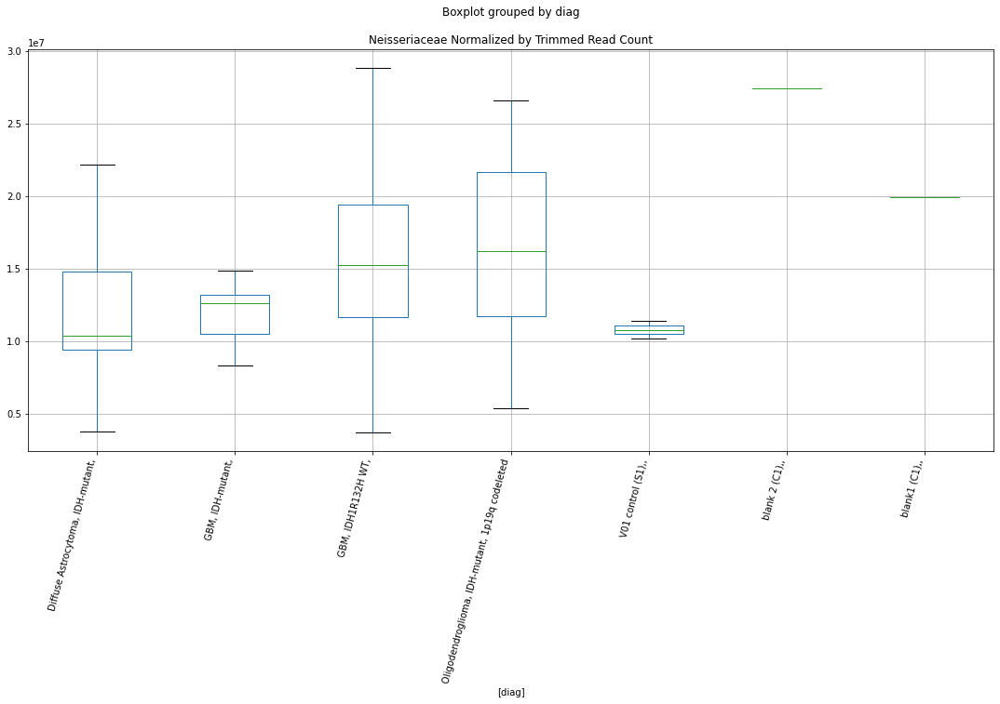

Neisseriaceae Lexogen cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.8337750754791786
	p = 0.0832762043542544
Neisseriaceae Lexogen cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = 1.8337750754791786
	p = 0.0832762043542544


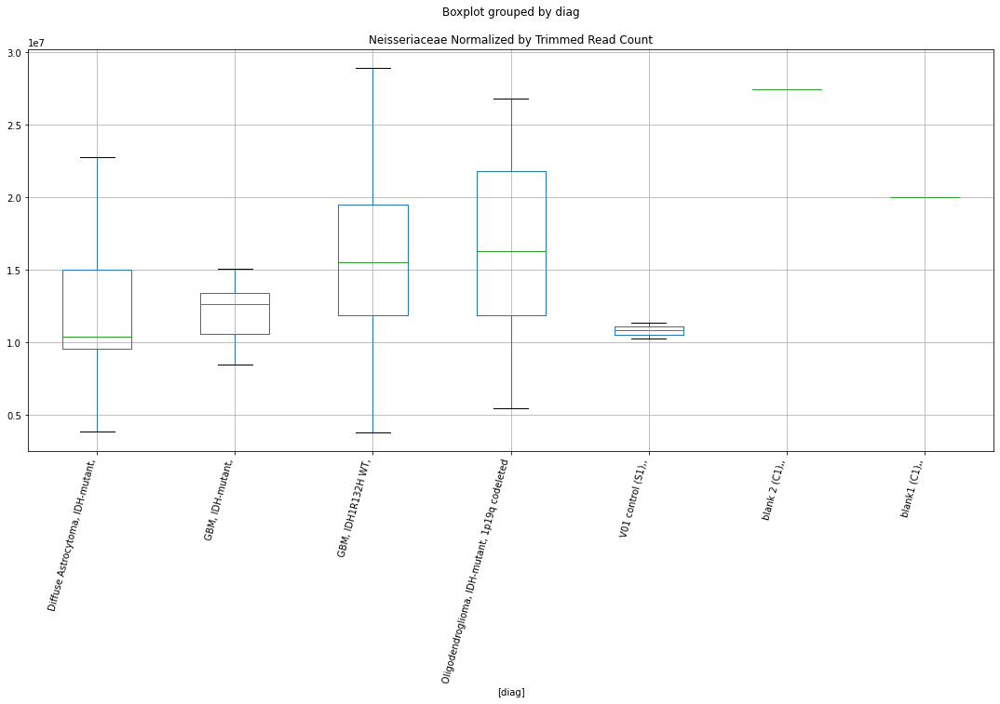

Neisseriaceae Lexogen cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.8234482854152925
	p = 0.08488641914834097
Neisseriaceae Lexogen cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = 1.8234482854152925
	p = 0.08488641914834097


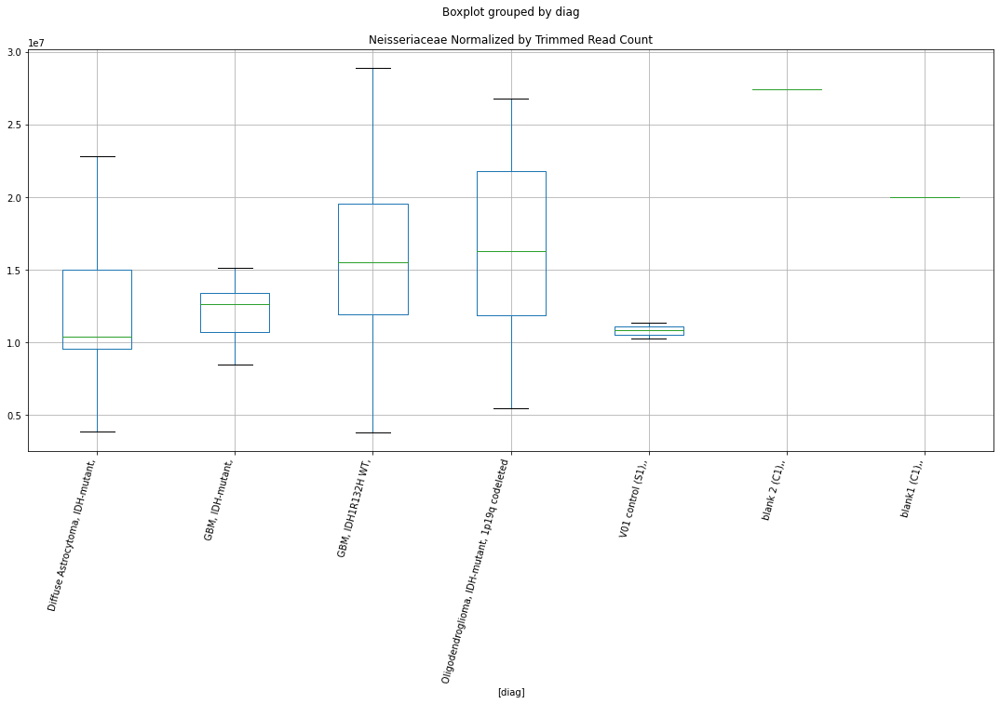

Alcaligenaceae D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8112094038248803
	p = 0.08683008299133825
Alcaligenaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8112094038248803
	p = 0.08683008299133825


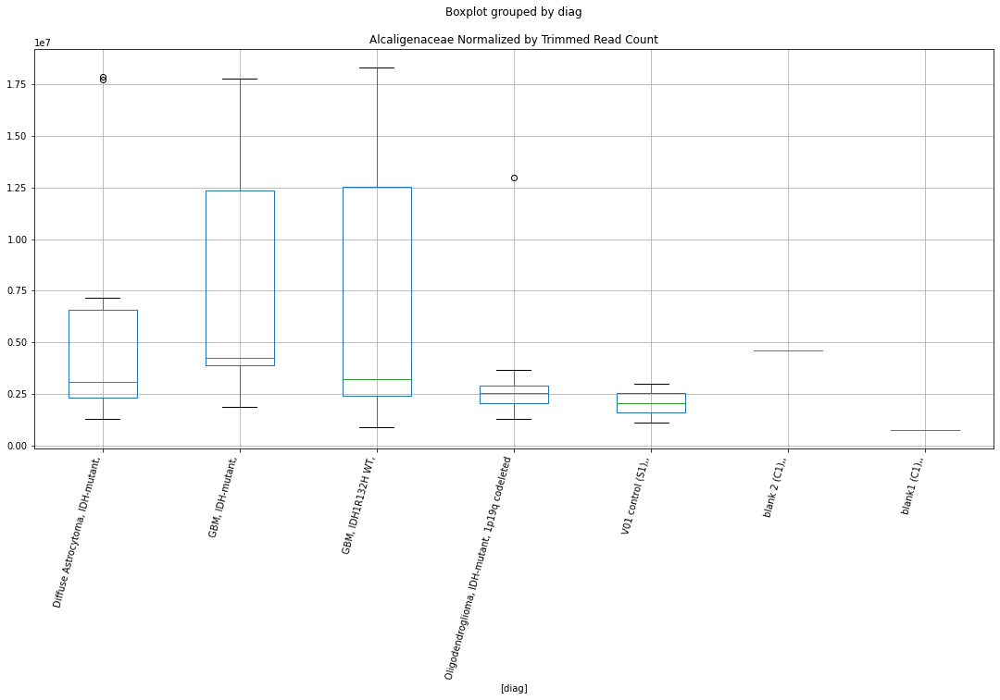

Alcaligenaceae D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9050830256049103
	p = 0.07287284315963405
Alcaligenaceae D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9050830256049103
	p = 0.07287284315963405


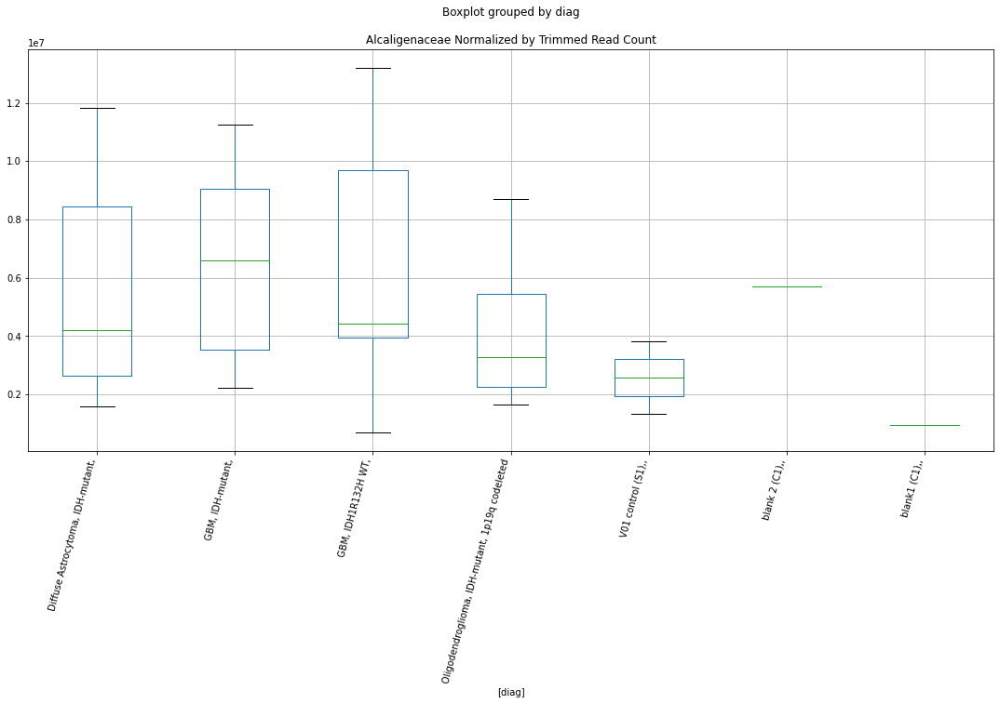

Alcaligenaceae D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.921416641319518
	p = 0.07065853567758669
Alcaligenaceae D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.921416641319518
	p = 0.07065853567758669


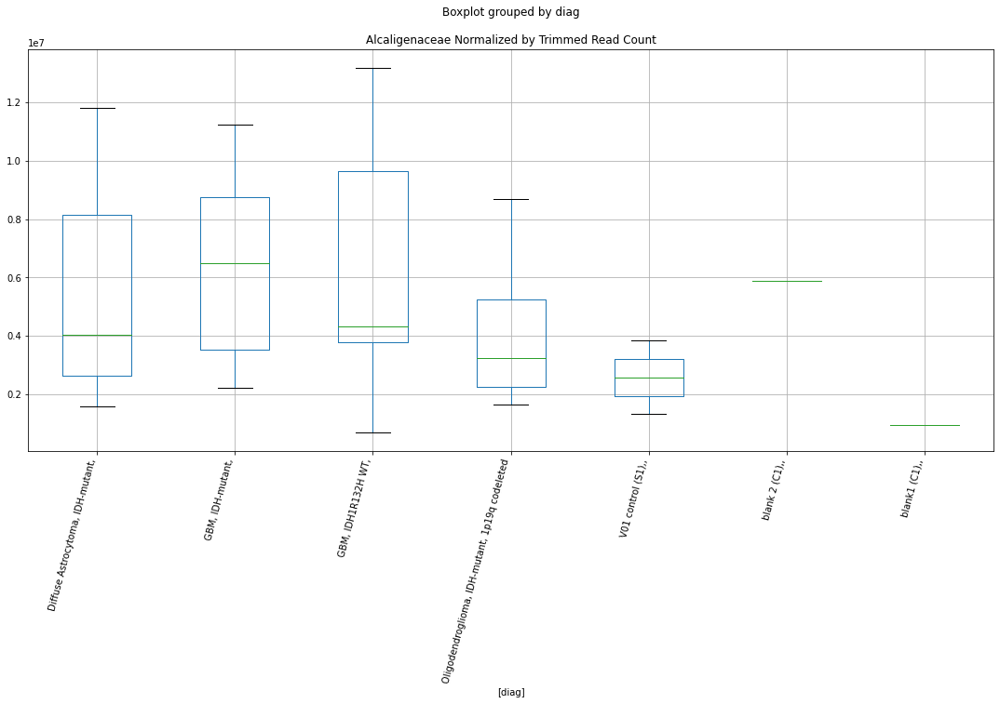

Alcaligenaceae D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0637913311227556
	p = 0.053760179999177
Alcaligenaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0637913311227556
	p = 0.053760179999177
Alcaligenaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.1053117711009426
	p = 0.04957161913535258
Alcaligenaceae D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.1053117711009426
	p = 0.04957161913535258


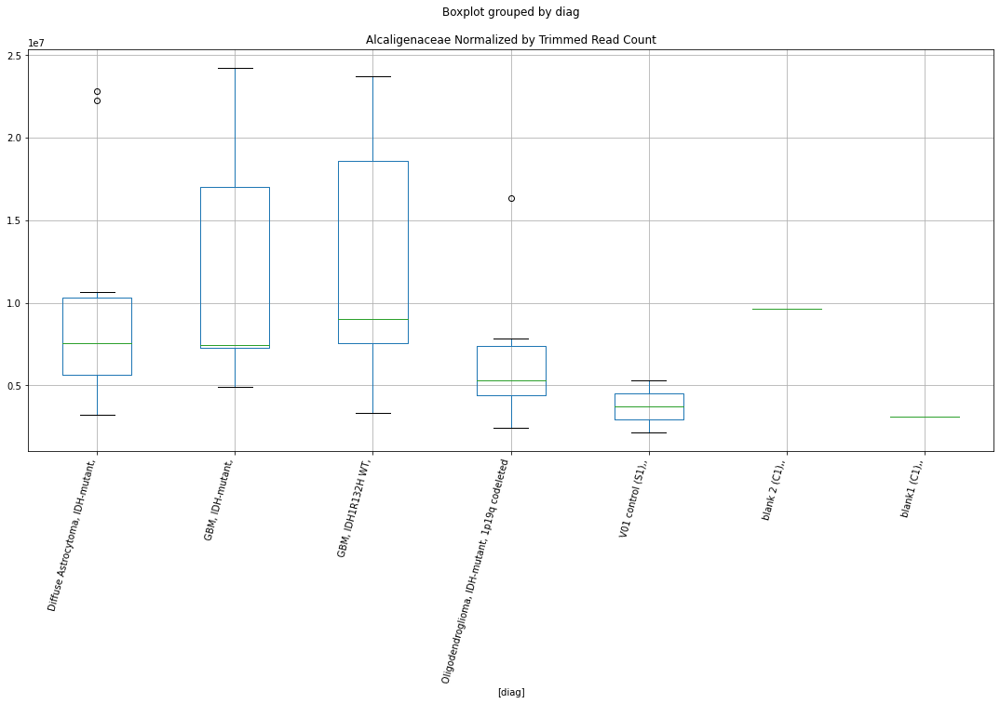

Alcaligenaceae D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9250281268162301
	p = 0.0701770868215265
Alcaligenaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9250281268162301
	p = 0.0701770868215265


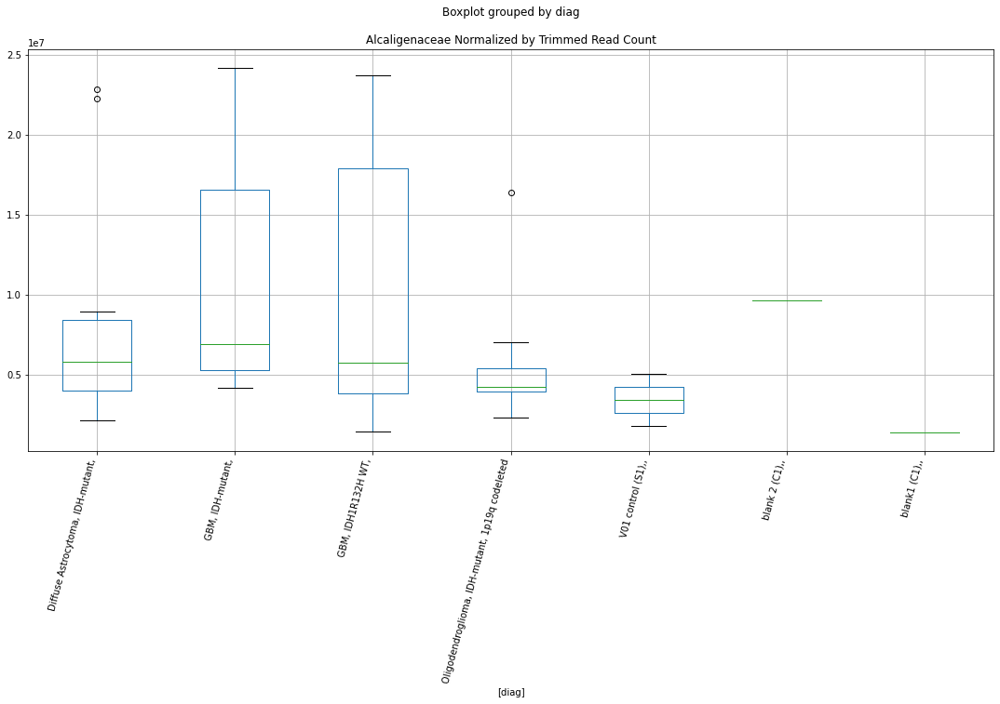

Alcaligenaceae D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.921592795353755
	p = 0.07063498452260558
Alcaligenaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.921592795353755
	p = 0.07063498452260558


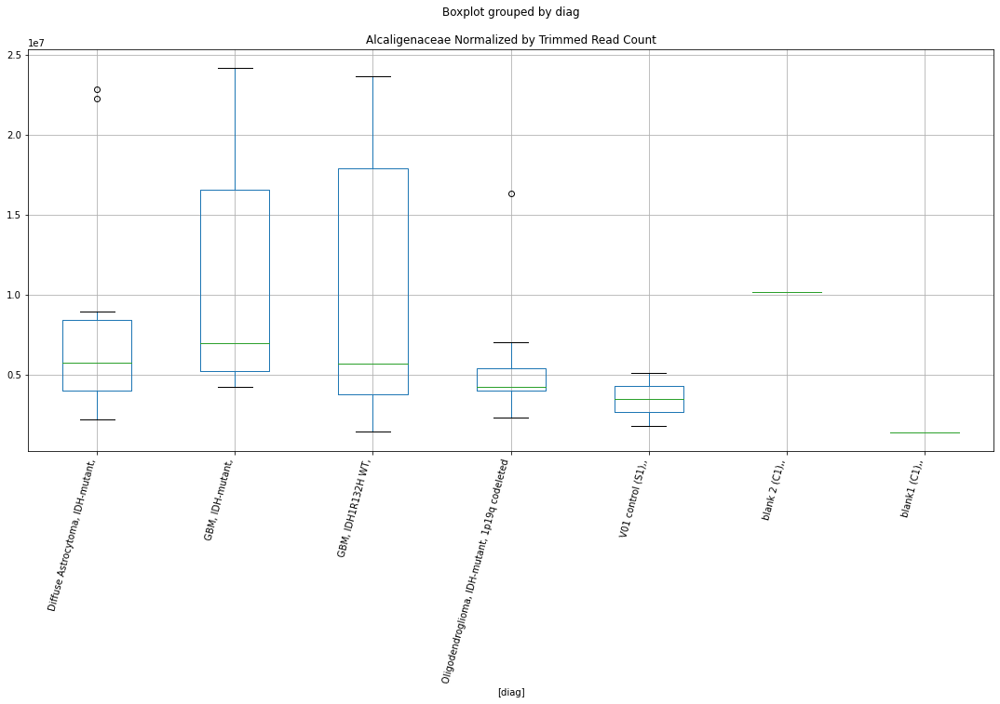

Nocardiaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.943808469316778
	p = 0.06772024096722944
Nocardiaceae D-plex bbduk1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.943808469316778
	p = 0.06772024096722944


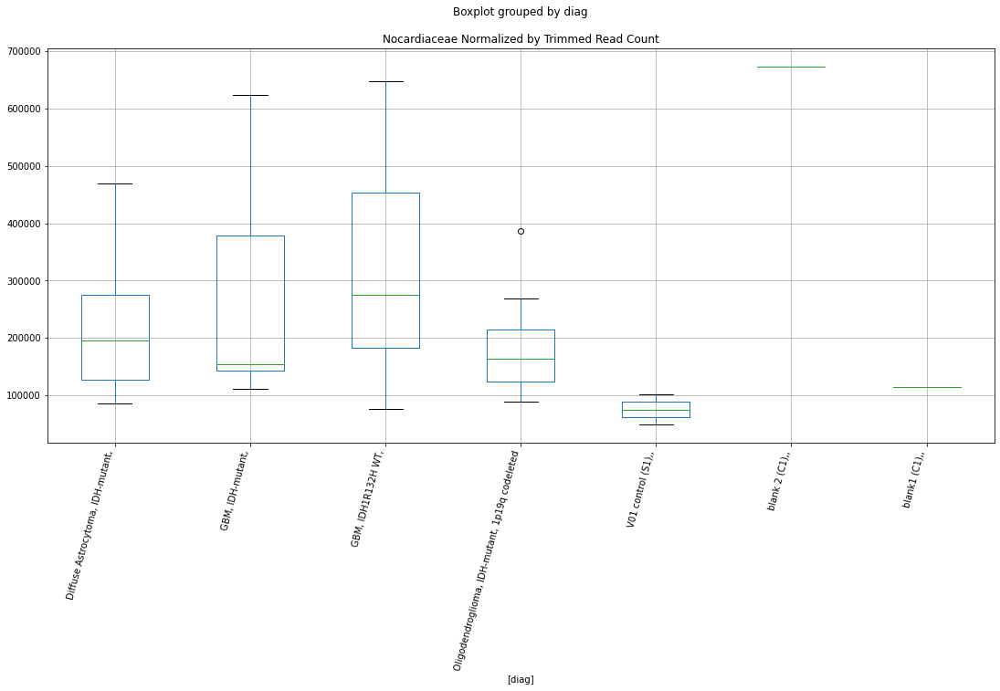

Bacillaceae D-plex bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.7417550618608768
	p = 0.09861345092651622
Bacillaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.765035717828372
	p = 0.09451764033269376
Bacillaceae D-plex bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.7417550618608768
	p = 0.09861345092651622
Bacillaceae D-plex bbduk1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.765035717828372
	p = 0.09451764033269376


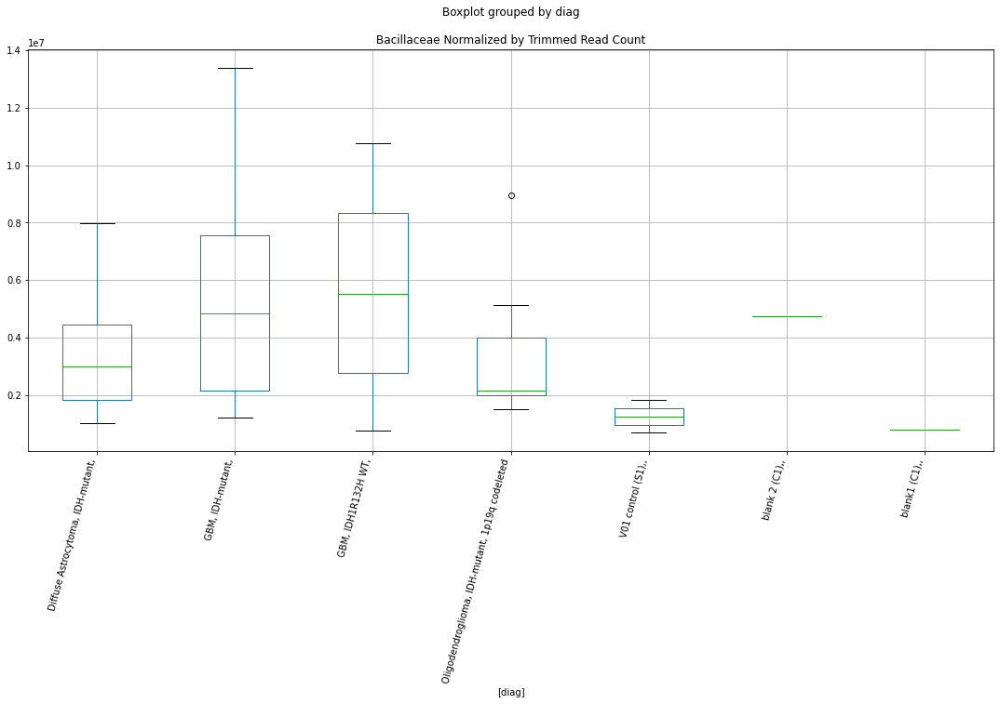

Microcystaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.8050299060328396
	p = 0.08782617604598282
Microcystaceae D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8050299060328396
	p = 0.08782617604598282


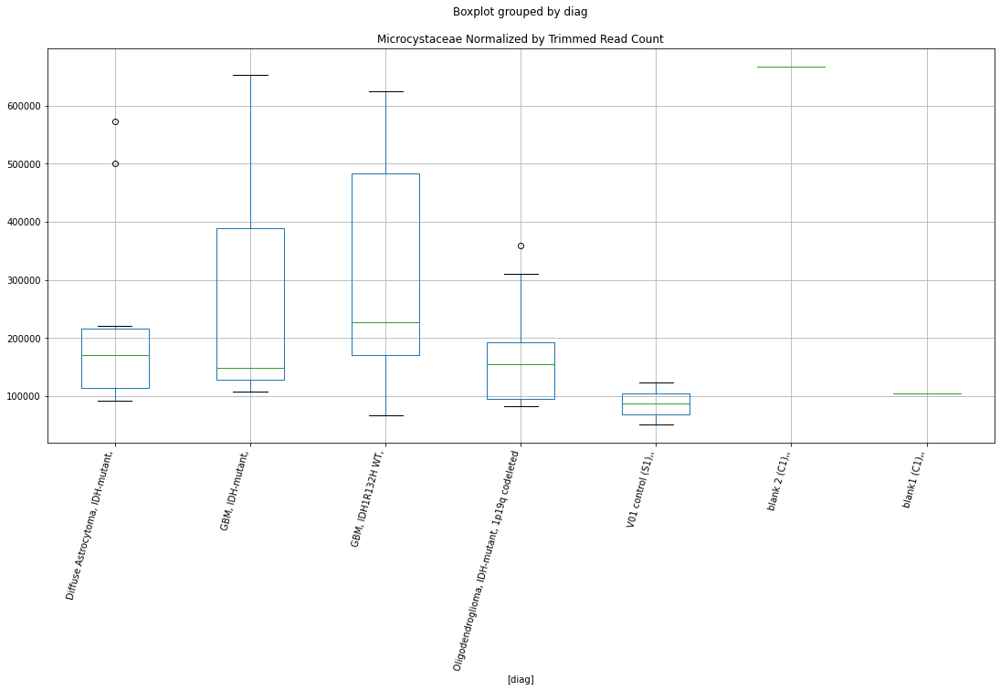

Microcystaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.80547257301072
	p = 0.08775449018551972
Microcystaceae D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.80547257301072
	p = 0.08775449018551972


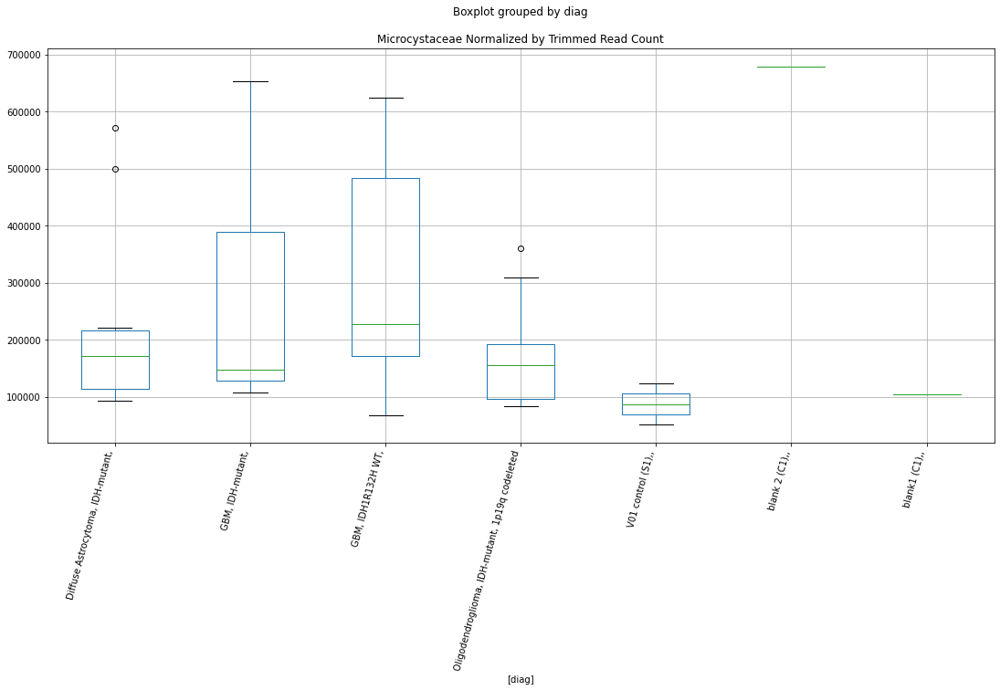

Microcystaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.8045464642657019
	p = 0.08790452351689522
Microcystaceae D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8045464642657019
	p = 0.08790452351689522


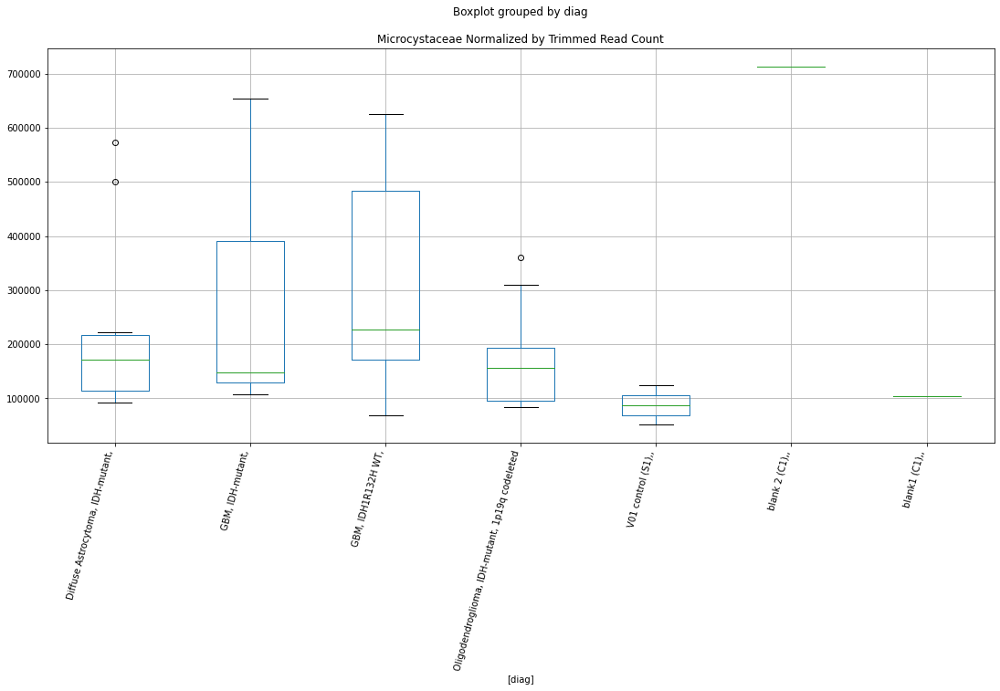

Lactobacillaceae Lexogen bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.915460590201515
	p = 0.07145895838898851
Lactobacillaceae Lexogen bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = 1.915460590201515
	p = 0.07145895838898851


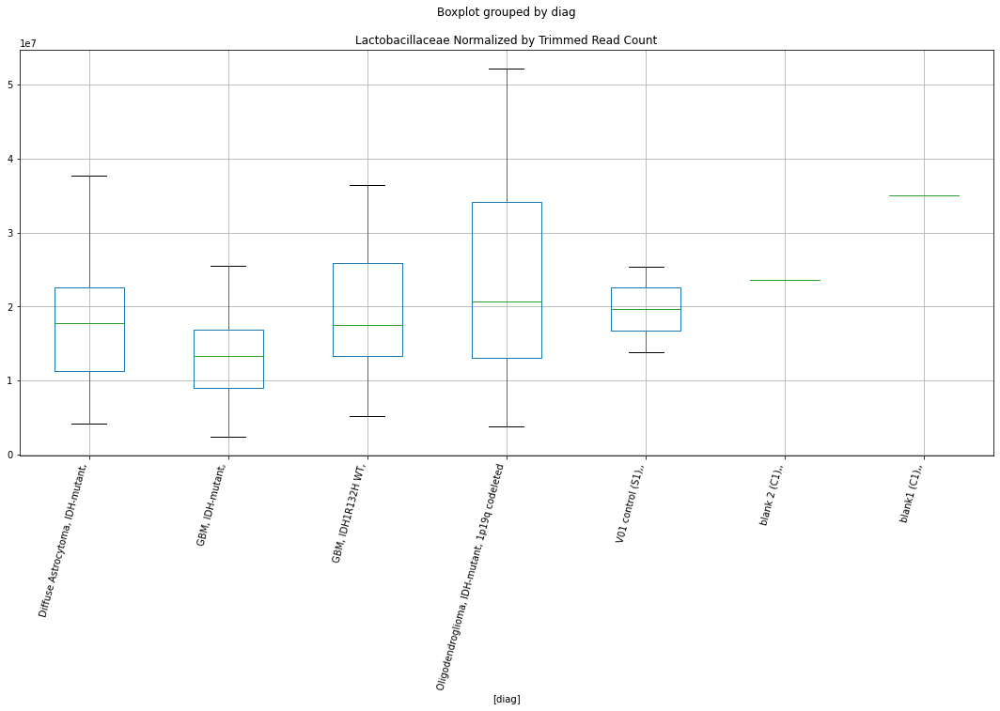

Pseudomonadaceae D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.046159133417337
	p = 0.05563392139757003
Pseudomonadaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.046159133417337
	p = 0.05563392139757003
Pseudomonadaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2385173768640168
	p = 0.03806226053409804
Pseudomonadaceae D-plex bbduk1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2385173768640168
	p = 0.03806226053409804


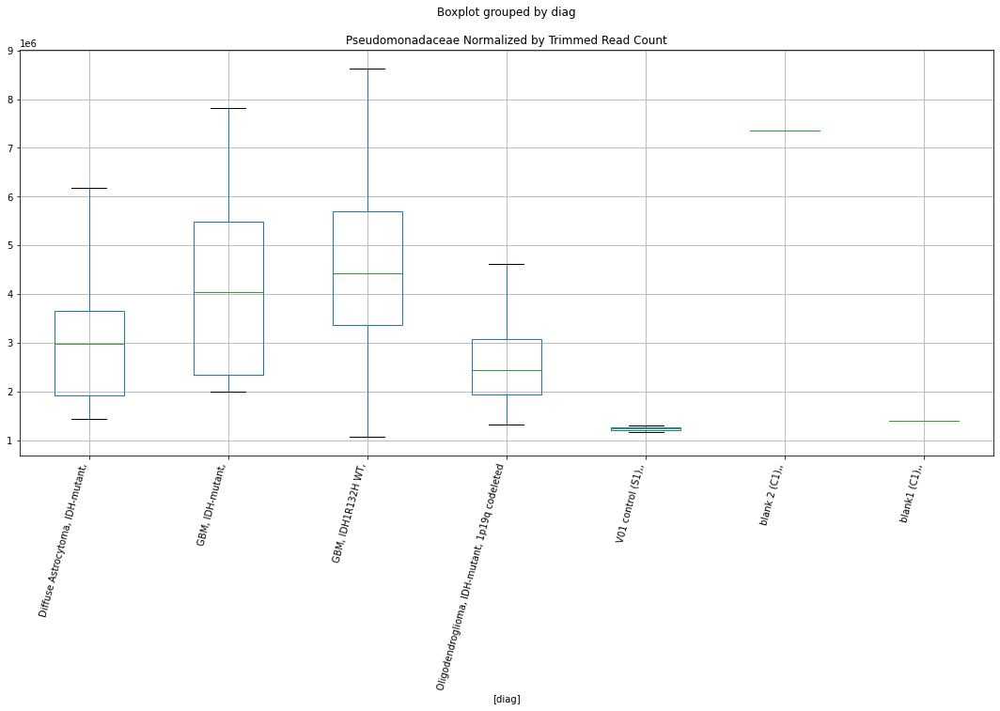

Pseudomonadaceae D-plex cutadapt1 : GBM, IDH-mutant, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.7539214419956566
	p = 0.09645419749372824
Pseudomonadaceae D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH-mutant,
	t = -1.7539214419956566
	p = 0.09645419749372824
Pseudomonadaceae D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.5800672292489595
	p = 0.018873104660169657
Pseudomonadaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9333511132287897
	p = 0.06907864484066704
Pseudomonadaceae D-plex cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.5800672292489595
	p = 0.018873104660169657
Pseudomonadaceae D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9333511132287897
	p = 0.06907864484066704


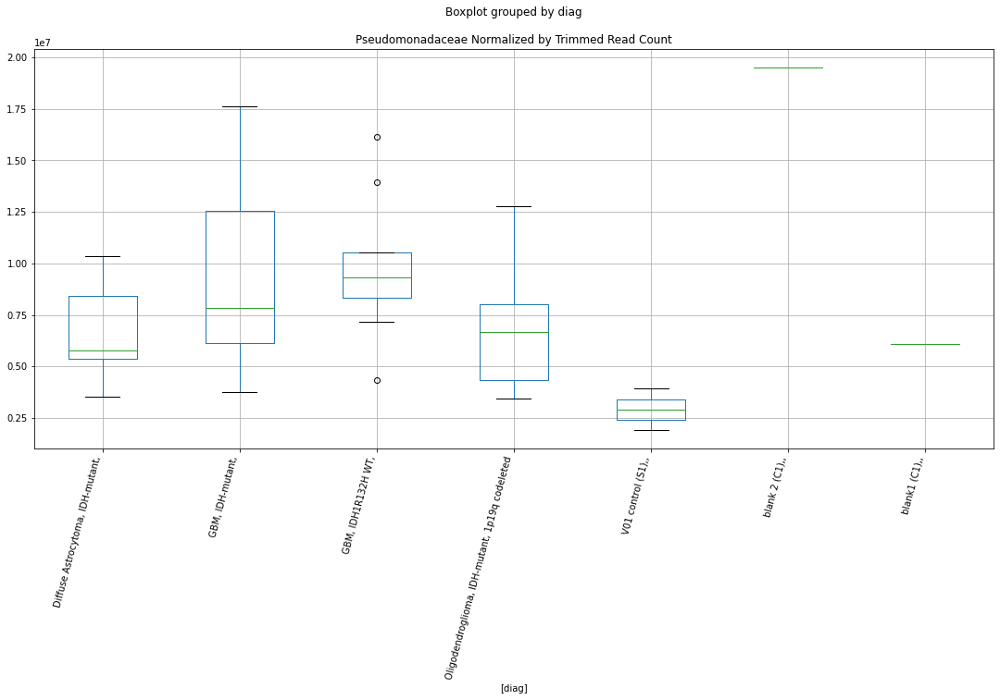

Corynebacteriaceae D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.960744970504081
	p = 0.06557070284803014
Corynebacteriaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.960744970504081
	p = 0.06557070284803014
Corynebacteriaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.8683984828723665
	p = 0.01021881199835878
Corynebacteriaceae D-plex bbduk1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.8683984828723665
	p = 0.01021881199835878


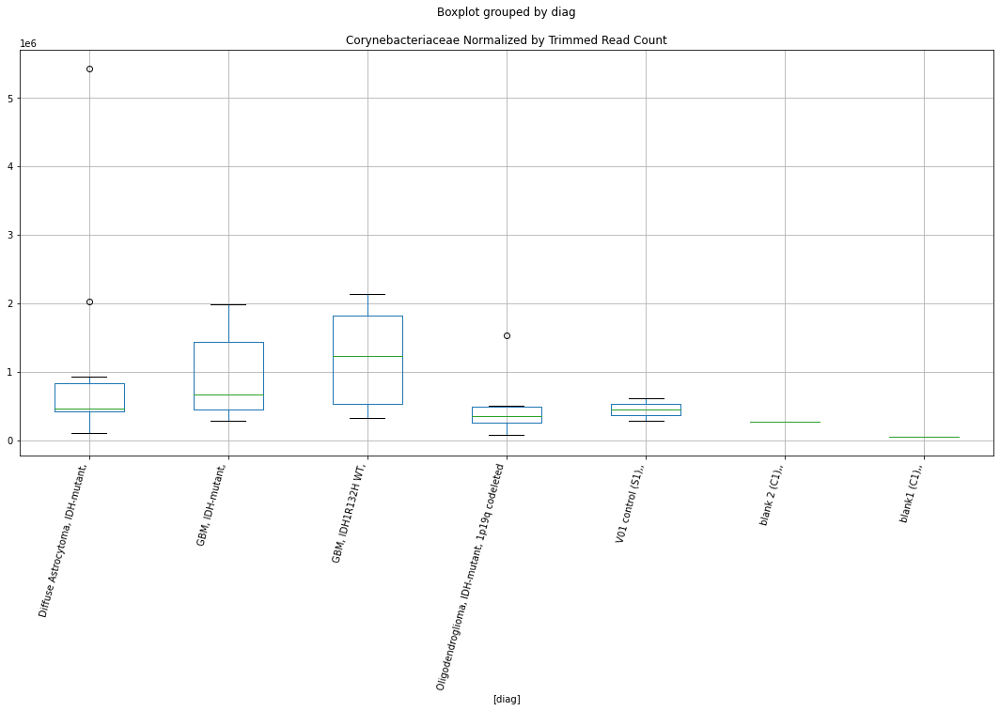

Corynebacteriaceae D-plex cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.8132615701017614
	p = 0.0865014821820508
Corynebacteriaceae D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8867091464521093
	p = 0.07543714597394381
Corynebacteriaceae D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.7554845392215916
	p = 0.09617977827070268
Corynebacteriaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -1.8867091464521093
	p = 0.07543714597394381
Corynebacteriaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -3.1597080779938556
	p = 0.005421639526887992
Corynebacteriaceae D-plex cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 1.8132615701017614
	p = 0.0865014821820508
Corynebacteriaceae D-plex cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.75548453922159

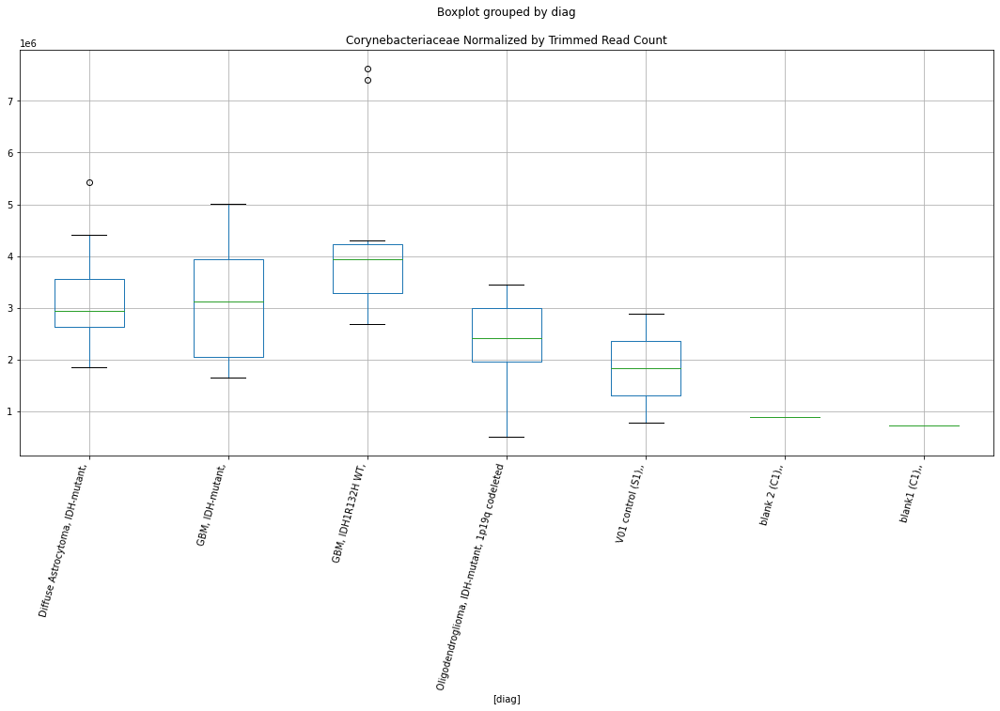

Corynebacteriaceae D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2015291638646066
	p = 0.04098349424713755
Corynebacteriaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.2015291638646066
	p = 0.04098349424713755
Corynebacteriaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.7784413211476364
	p = 0.012395846775593798
Corynebacteriaceae D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.7784413211476364
	p = 0.012395846775593798


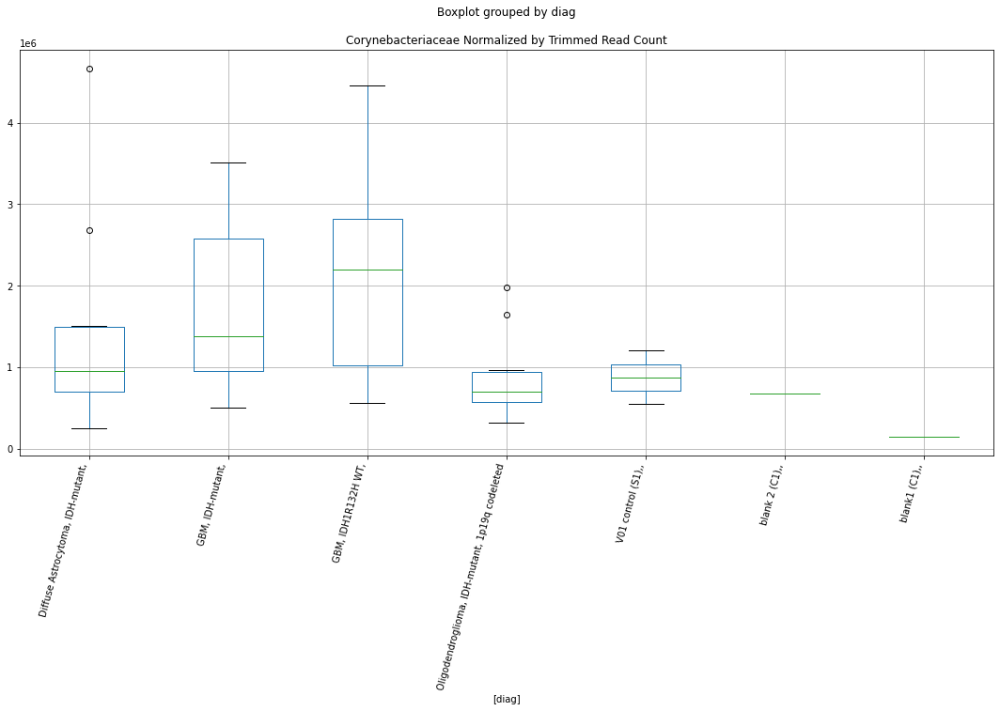

Corynebacteriaceae D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.185729586095748
	p = 0.042292991952696445
Corynebacteriaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.185729586095748
	p = 0.042292991952696445
Corynebacteriaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.6710652009336124
	p = 0.015578909066517588
Corynebacteriaceae D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6710652009336124
	p = 0.015578909066517588


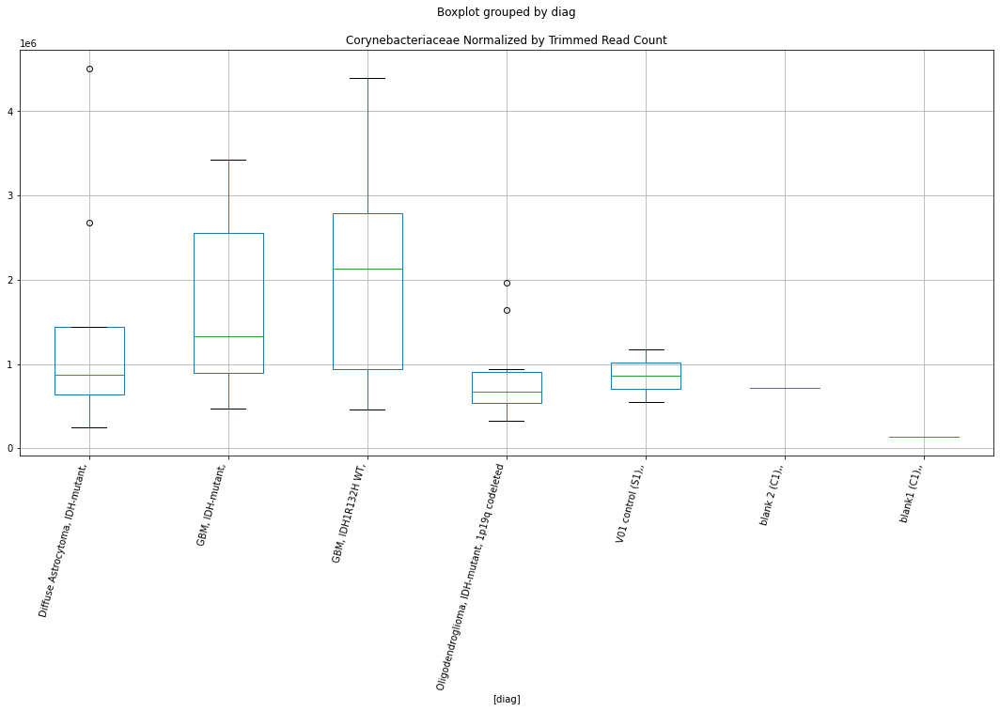

Corynebacteriaceae Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.8527586531492068
	p = 0.08038607528197098
Corynebacteriaceae Lexogen bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = 1.8527586531492068
	p = 0.08038607528197098


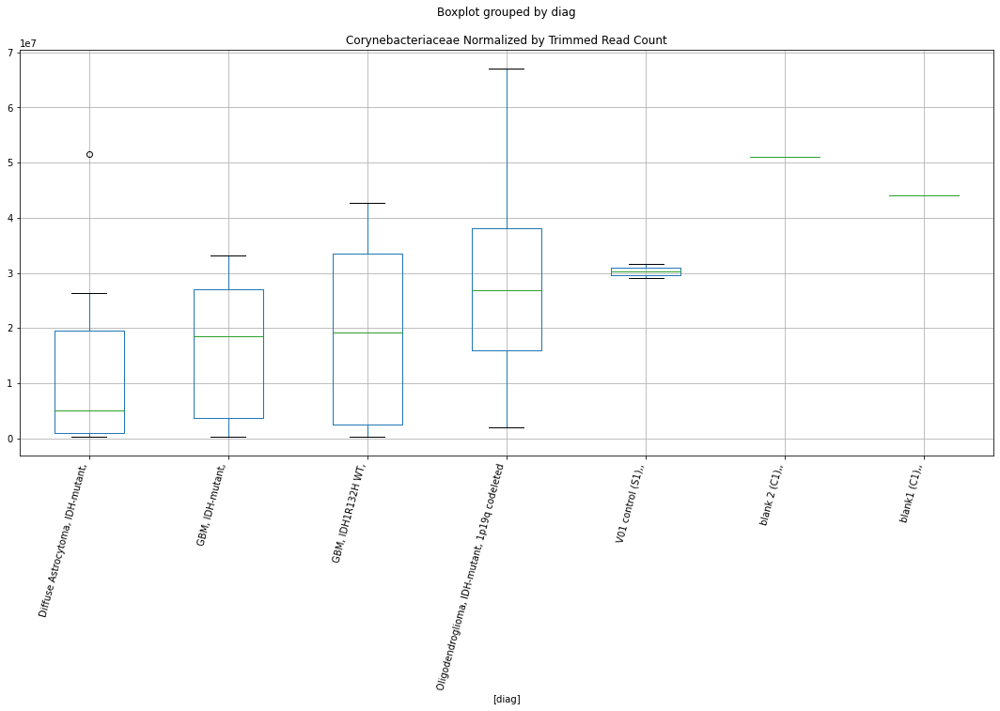

Peptostreptococcaceae Lexogen bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.8645836440638823
	p = 0.07863077675165984
Peptostreptococcaceae Lexogen bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = 1.8645836440638823
	p = 0.07863077675165984


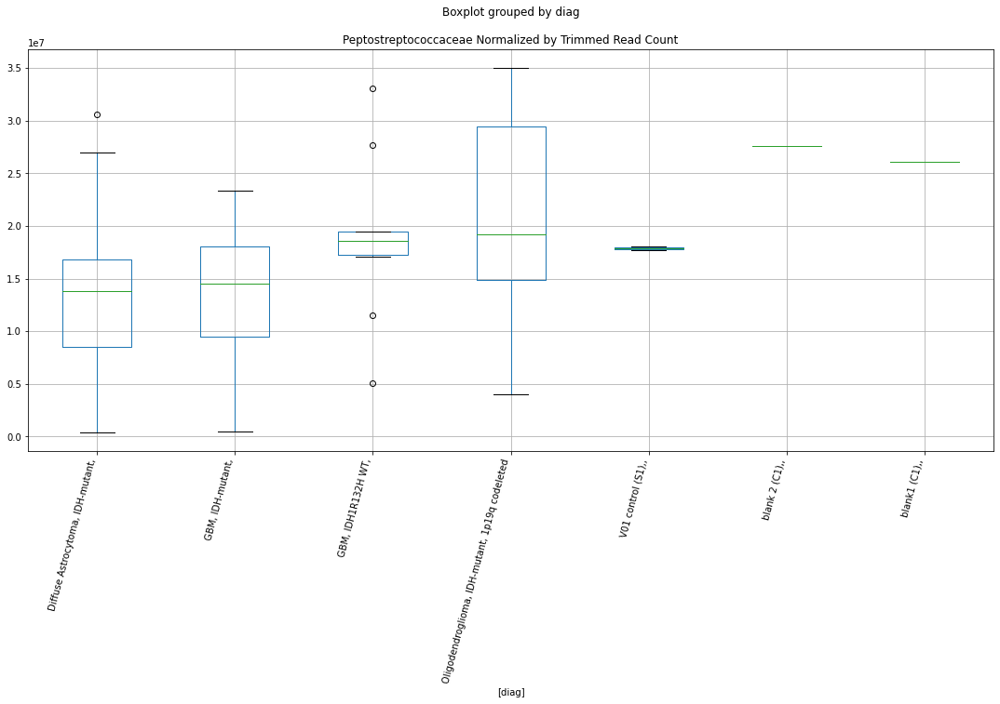

Peptostreptococcaceae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.9377413106341577
	p = 0.06850543129885794
Peptostreptococcaceae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.484878767192112
	p = 0.02301967098810704
Peptostreptococcaceae Lexogen bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = 1.9377413106341577
	p = 0.06850543129885794
Peptostreptococcaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.484878767192112
	p = 0.02301967098810704


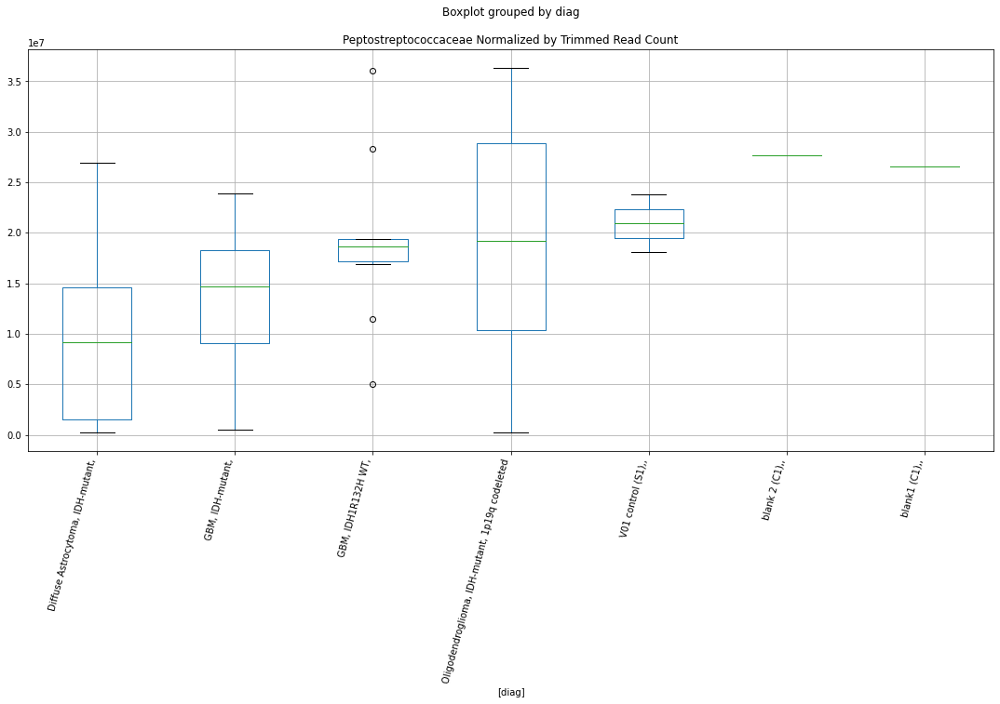

Chromobacteriaceae Lexogen bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.7464351087884578
	p = 0.09777794350341364
Chromobacteriaceae Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.202169371046641
	p = 0.040931226049472136
Chromobacteriaceae Lexogen bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = 1.7464351087884578
	p = 0.09777794350341364
Chromobacteriaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 2.202169371046641
	p = 0.040931226049472136


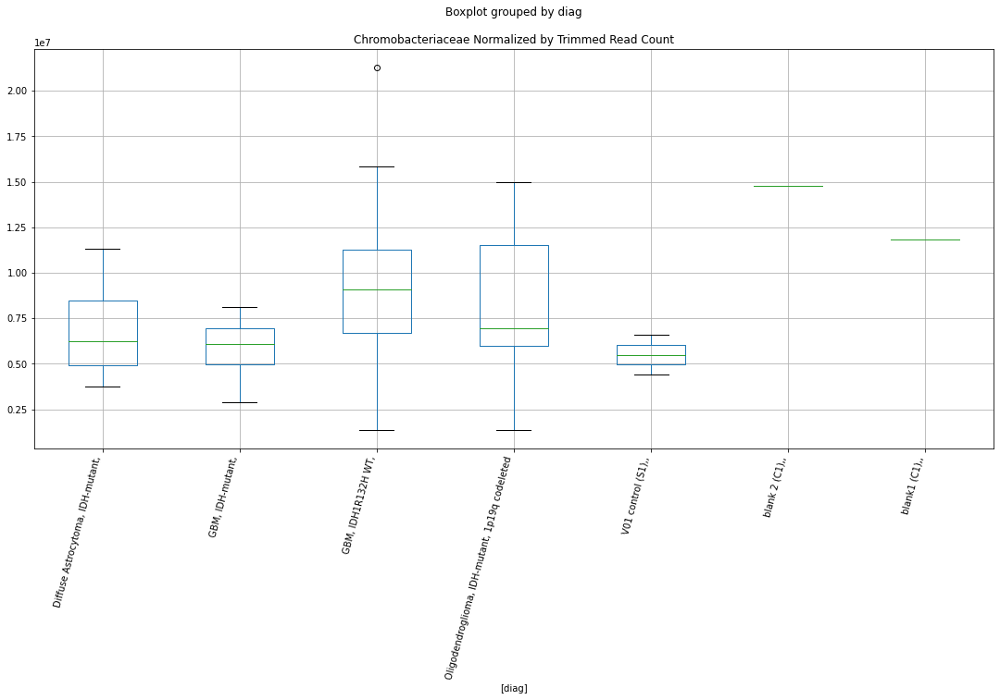

Chromobacteriaceae Lexogen bbduk2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.9959490142776275
	p = 0.06129687201380244
Chromobacteriaceae Lexogen bbduk2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 1.9959490142776275
	p = 0.06129687201380244


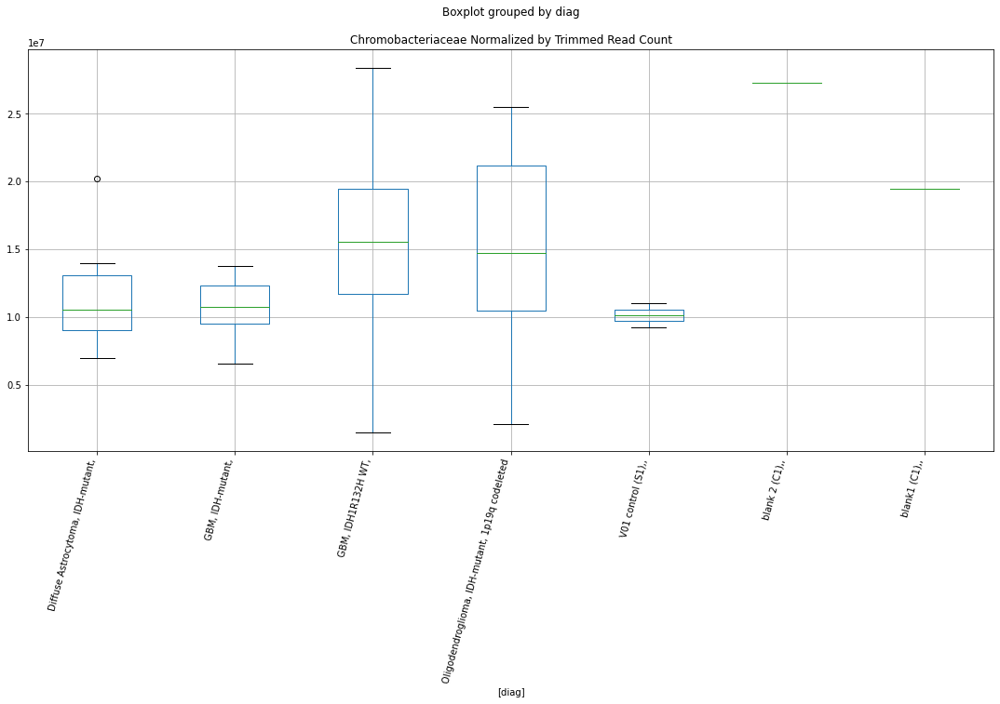

Chromobacteriaceae Lexogen bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.738701540812877
	p = 0.09916190870562033
Chromobacteriaceae Lexogen bbduk3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.00387788904432
	p = 0.06036947890236004
Chromobacteriaceae Lexogen bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = 1.738701540812877
	p = 0.09916190870562033
Chromobacteriaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 2.00387788904432
	p = 0.06036947890236004


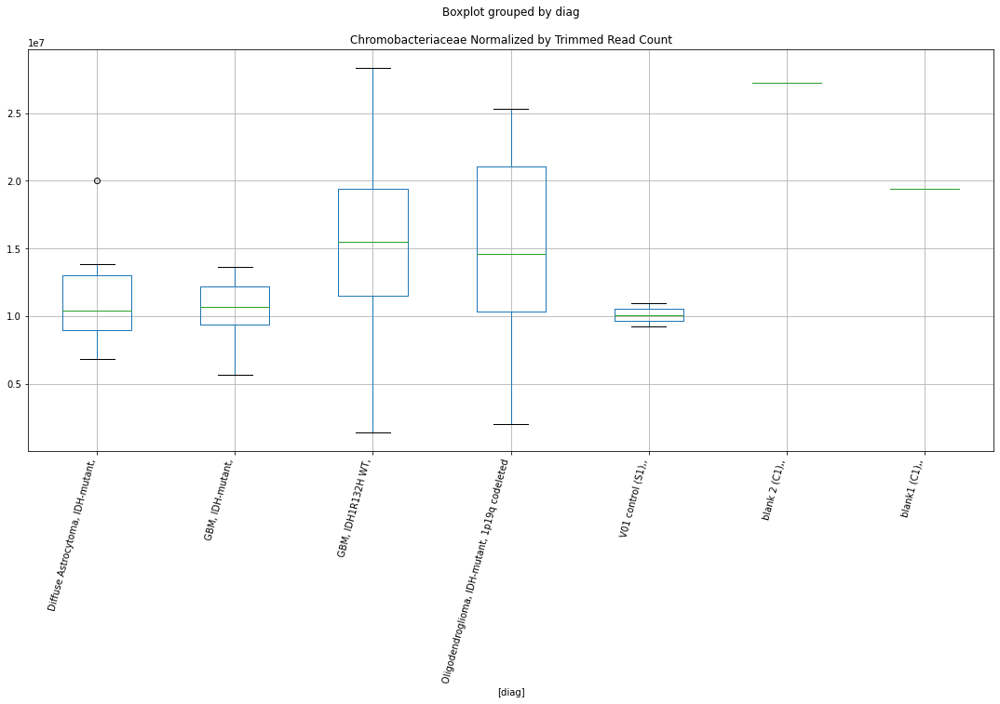

Comamonadaceae D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8629567228937844
	p = 0.07887025329712401
Comamonadaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8629567228937844
	p = 0.07887025329712401


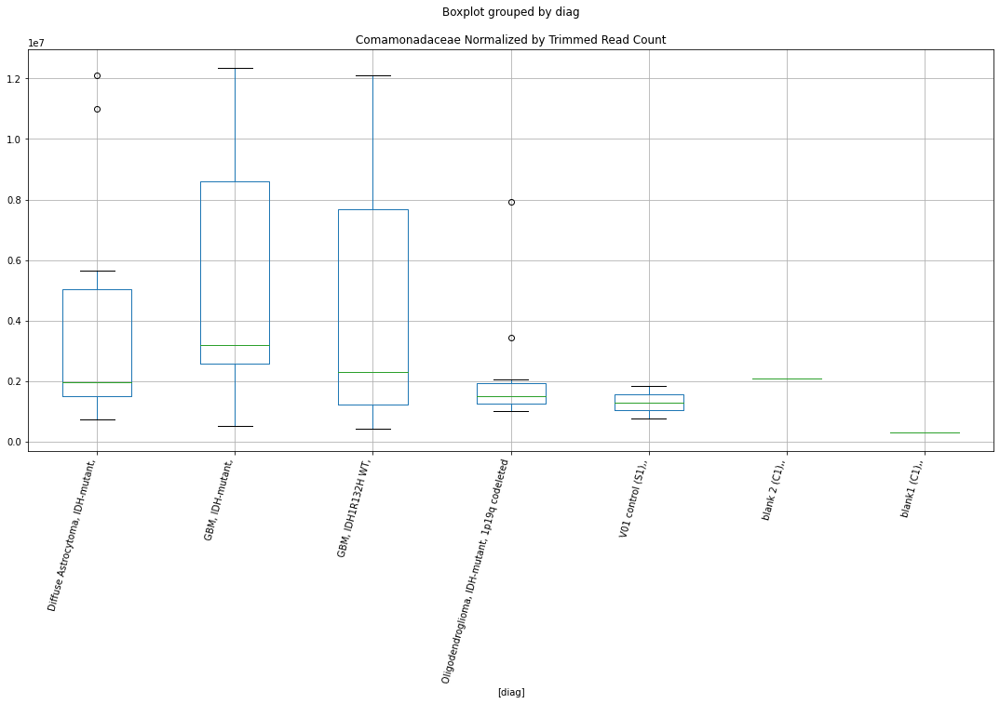

Comamonadaceae D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.86536778965649
	p = 0.07851558283904626
Comamonadaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.86536778965649
	p = 0.07851558283904626


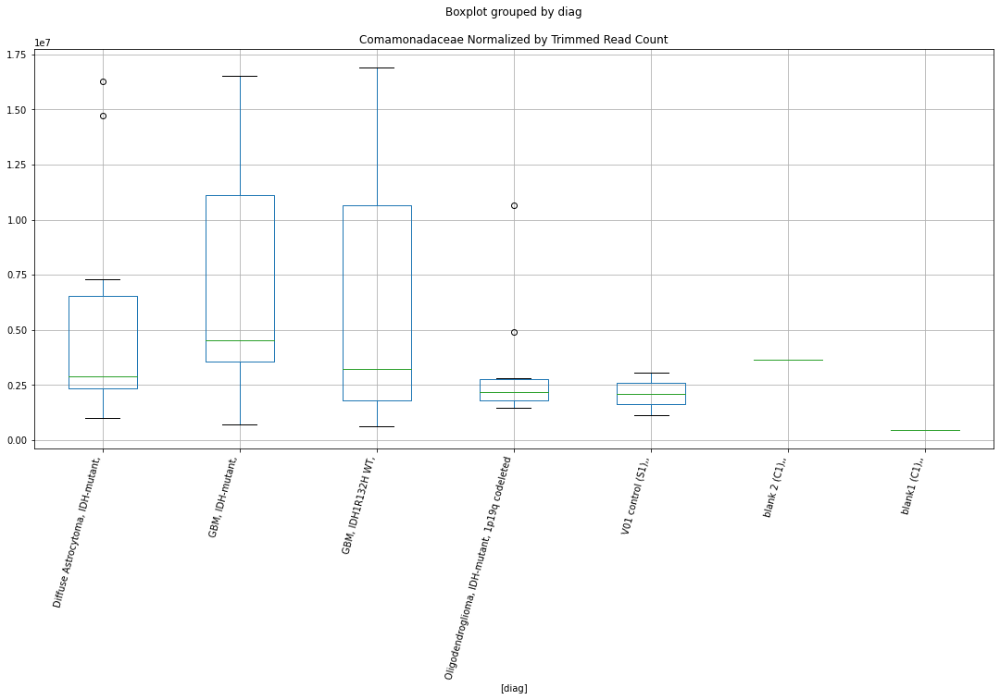

Comamonadaceae D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8654037682318014
	p = 0.0785103010271304
Comamonadaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8654037682318014
	p = 0.0785103010271304


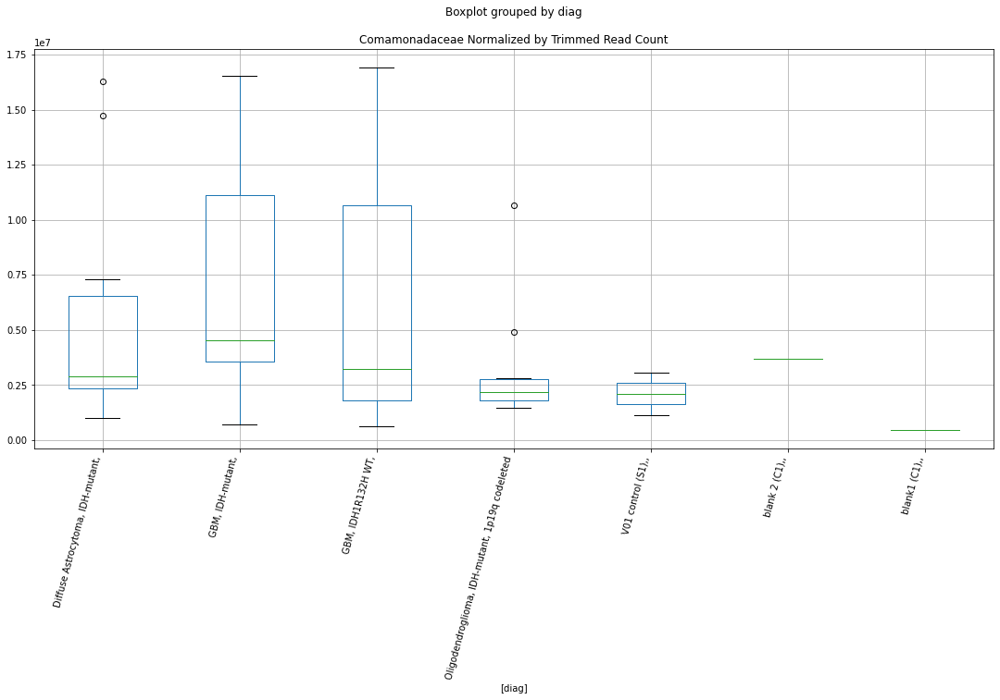

Comamonadaceae D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8652761828412254
	p = 0.07852903253506585
Comamonadaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8652761828412254
	p = 0.07852903253506585


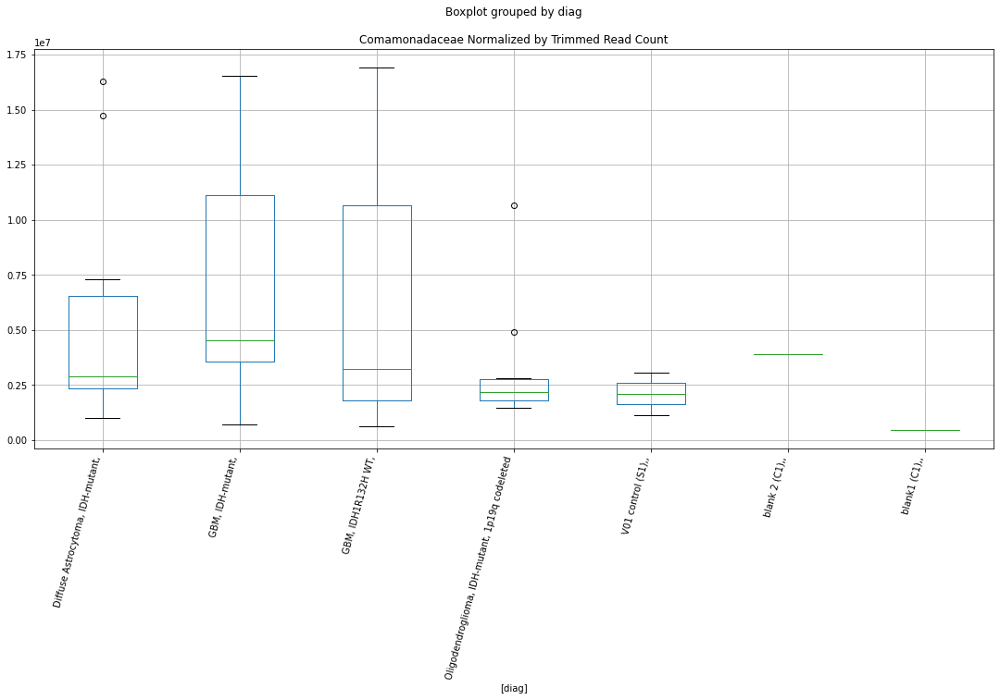

Comamonadaceae Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.129215904258793
	p = 0.047296935365145516
Comamonadaceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 3.163608830647776
	p = 0.005375430646222648
Comamonadaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.129215904258793
	p = 0.047296935365145516
Comamonadaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -3.163608830647776
	p = 0.005375430646222648


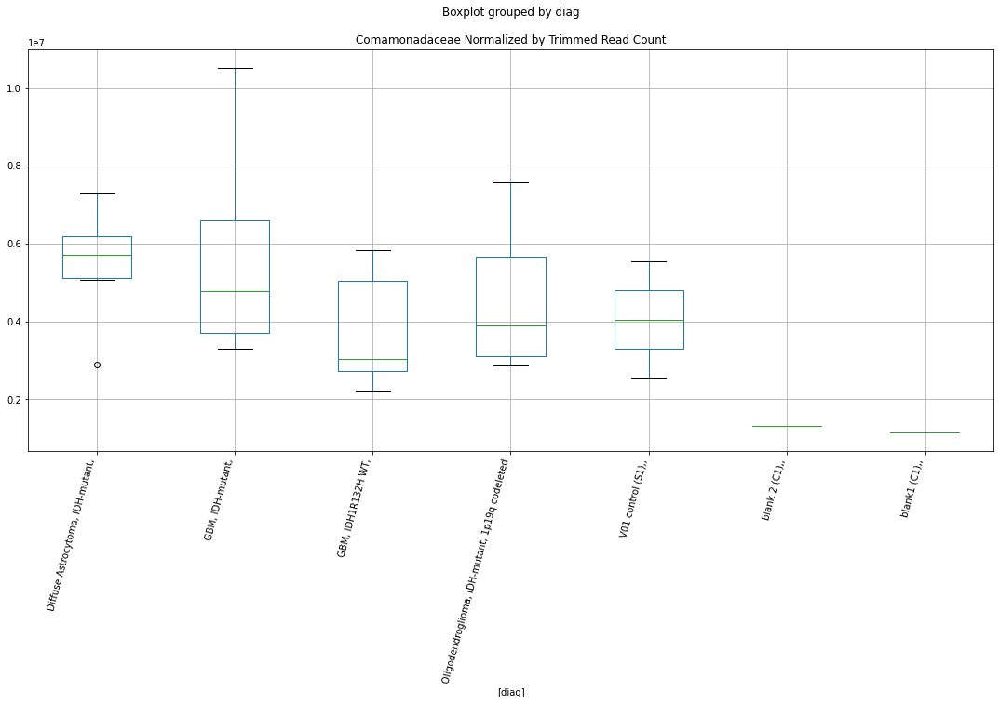

Comamonadaceae Lexogen bbduk2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.8785047723322663
	p = 0.07660774437095444
Comamonadaceae Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.205541513952834
	p = 0.040656924789335525
Comamonadaceae Lexogen bbduk2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.8785047723322663
	p = 0.07660774437095444
Comamonadaceae Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.205541513952834
	p = 0.040656924789335525


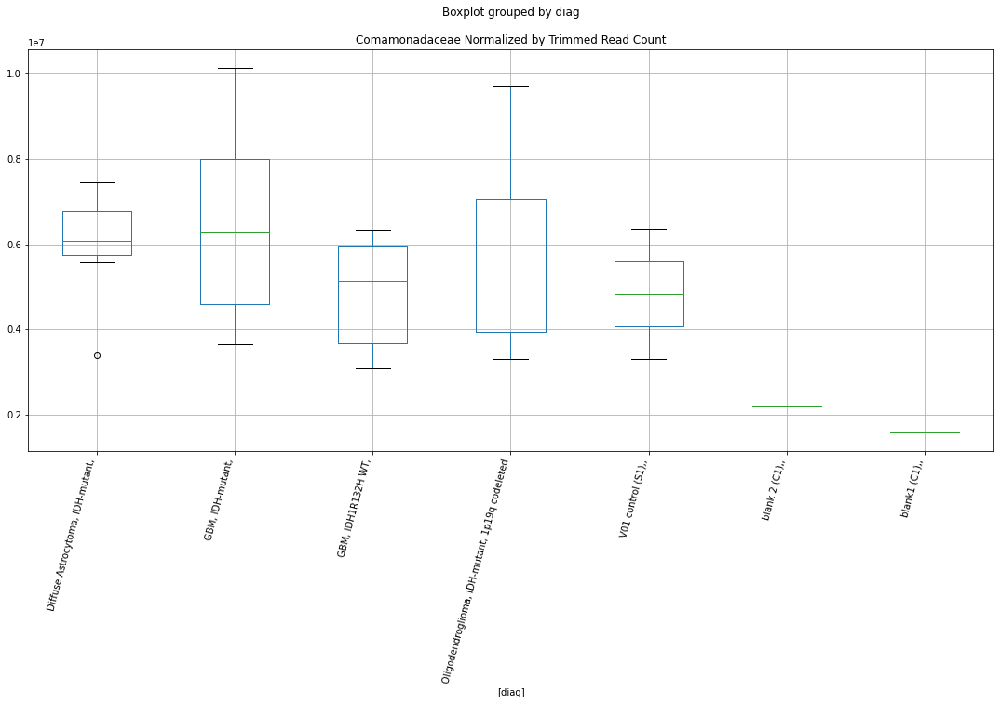

Comamonadaceae Lexogen bbduk3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.7969115537755944
	p = 0.08914997951246455
Comamonadaceae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.2180582546484544
	p = 0.03965348005768163
Comamonadaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.7969115537755944
	p = 0.08914997951246455
Comamonadaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.2180582546484544
	p = 0.03965348005768163


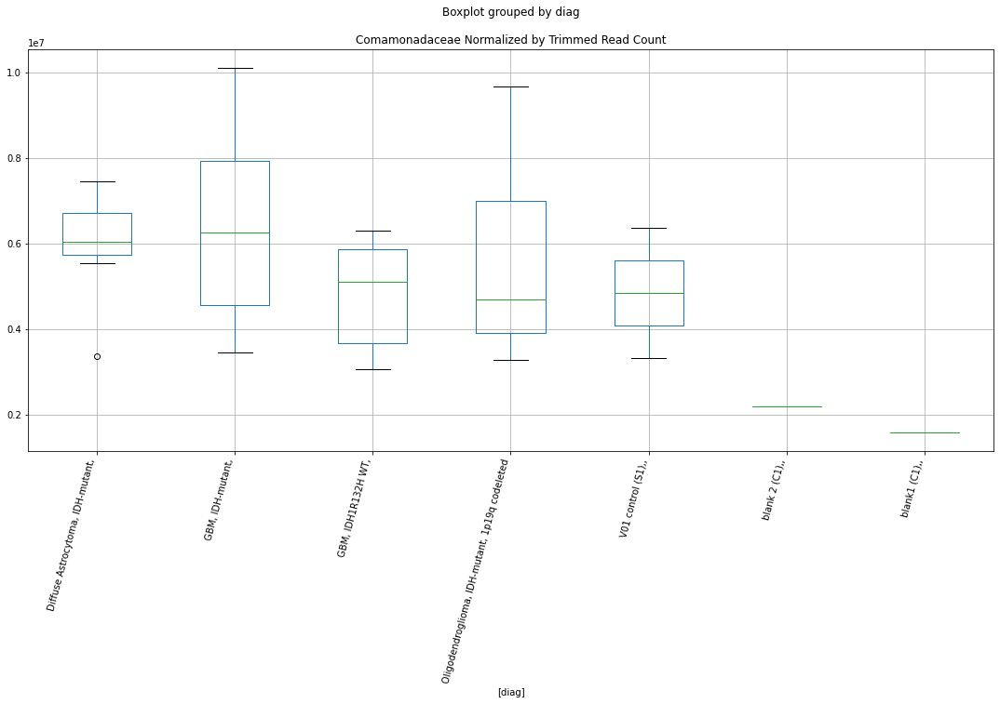

Comamonadaceae Lexogen cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.2455284782118694
	p = 0.03753064981483744
Comamonadaceae Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.3557641169946115
	p = 0.030025465919060374
Comamonadaceae Lexogen cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.2455284782118694
	p = 0.03753064981483744
Comamonadaceae Lexogen cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3557641169946115
	p = 0.030025465919060374


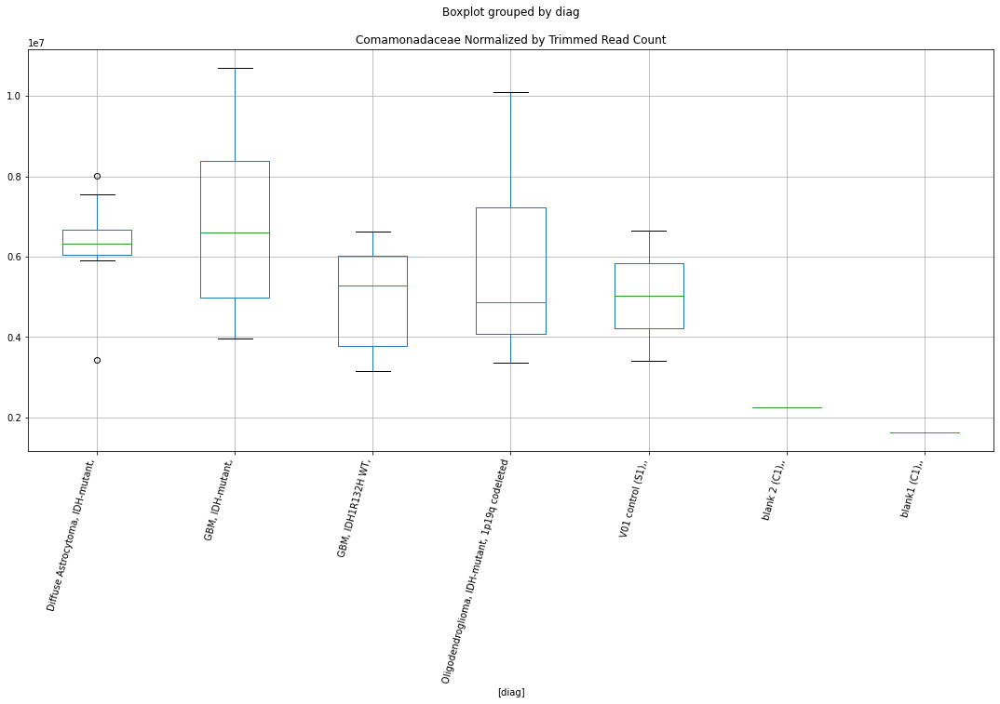

Comamonadaceae Lexogen cutadapt2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.2013915264161135
	p = 0.04099473933439682
Comamonadaceae Lexogen cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.189535737691875
	p = 0.041974067580683304
Comamonadaceae Lexogen cutadapt2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.2013915264161135
	p = 0.04099473933439682
Comamonadaceae Lexogen cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.189535737691875
	p = 0.041974067580683304


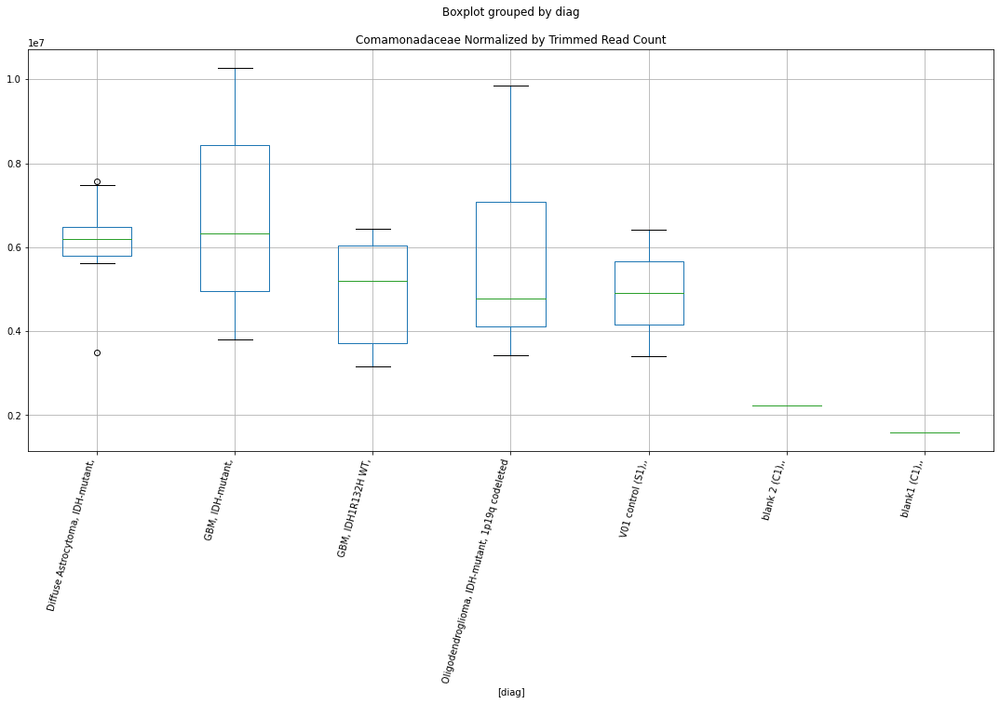

Comamonadaceae Lexogen cutadapt3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.2781862240080217
	p = 0.03514353191895834
Comamonadaceae Lexogen cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.3222515245348996
	p = 0.03214494679301287
Comamonadaceae Lexogen cutadapt3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.2781862240080217
	p = 0.03514353191895834
Comamonadaceae Lexogen cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3222515245348996
	p = 0.03214494679301287


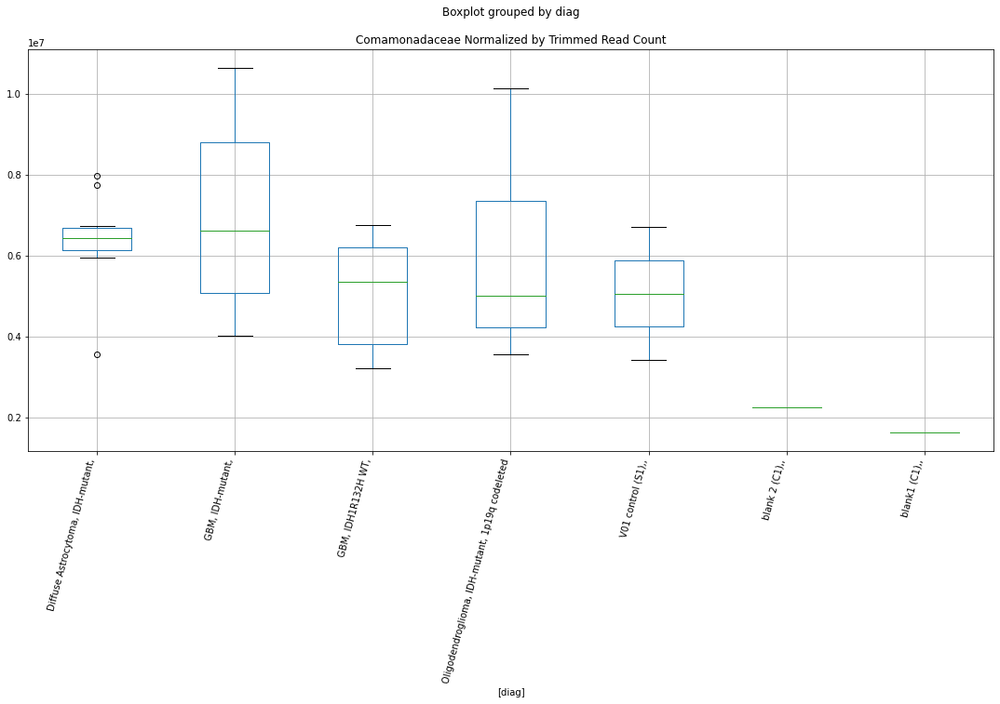

Moraxellaceae D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9690261072932211
	p = 0.06454204684887528
Moraxellaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9690261072932211
	p = 0.06454204684887528


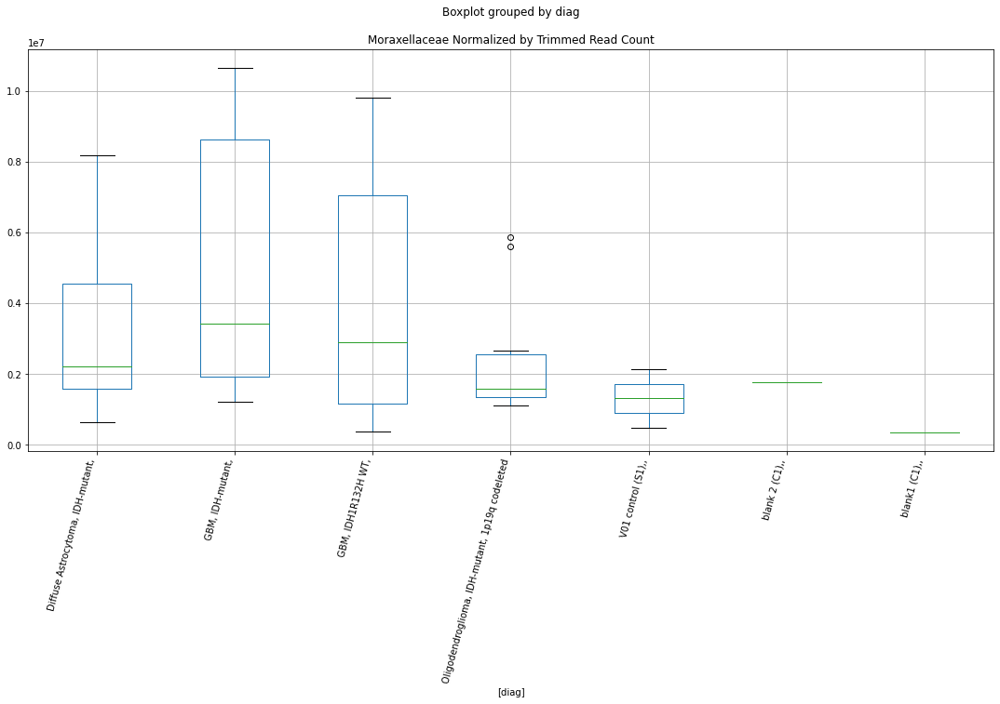

Moraxellaceae Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.0180867893986707
	p = 0.058739051898394005
Moraxellaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.0180867893986707
	p = 0.058739051898394005


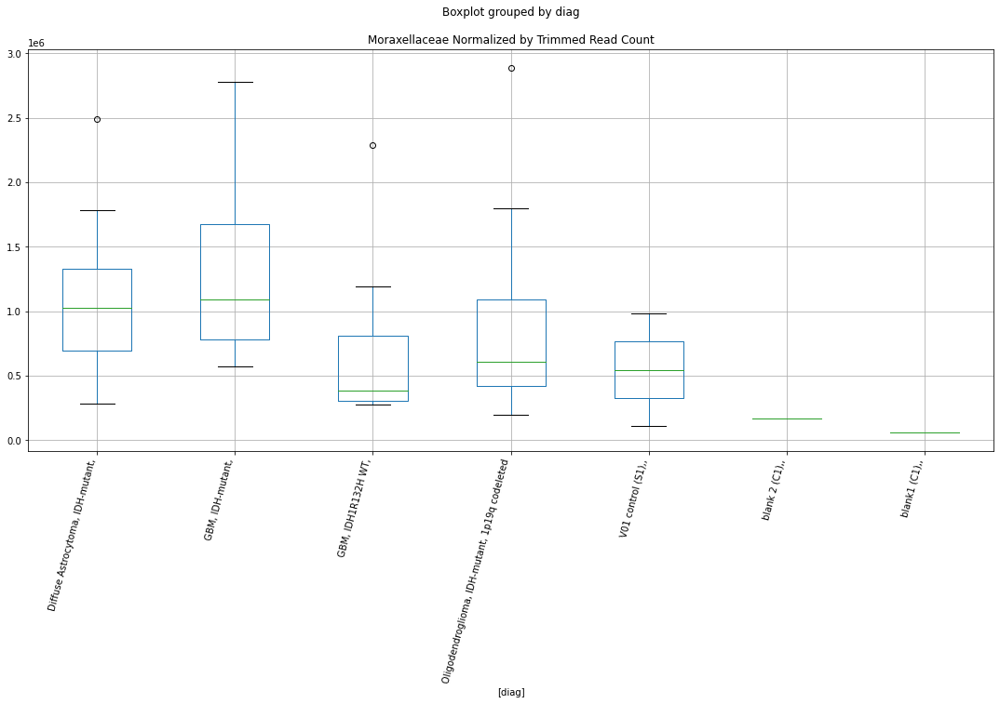

Moraxellaceae Lexogen bbduk2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.007006672867631
	p = 0.06000700680883768
Moraxellaceae Lexogen bbduk2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.007006672867631
	p = 0.06000700680883768


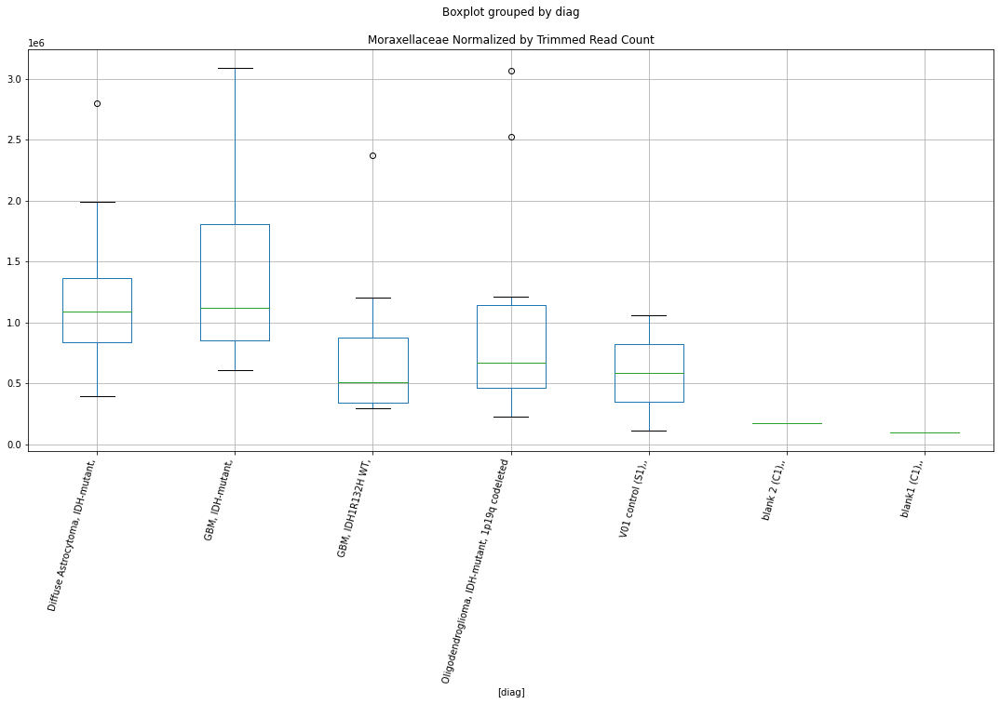

Moraxellaceae Lexogen bbduk3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 1.9703199795303754
	p = 0.06438263697626613
Moraxellaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -1.9703199795303754
	p = 0.06438263697626613


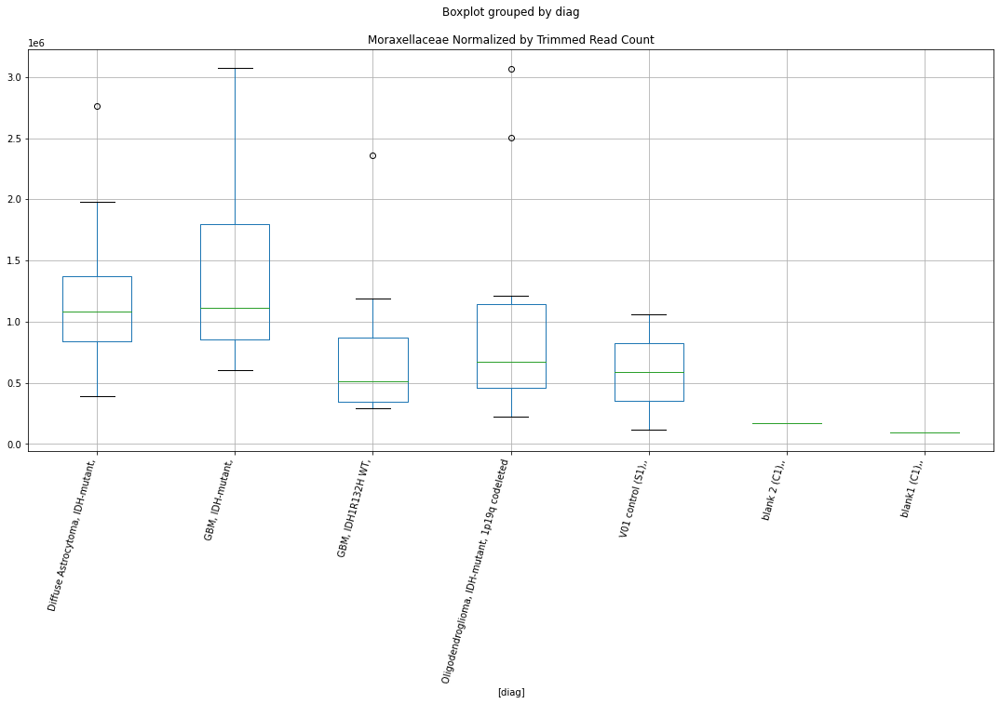

Moraxellaceae Lexogen cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.248346159562905
	p = 0.03731893738158321
Moraxellaceae Lexogen cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.248346159562905
	p = 0.03731893738158321


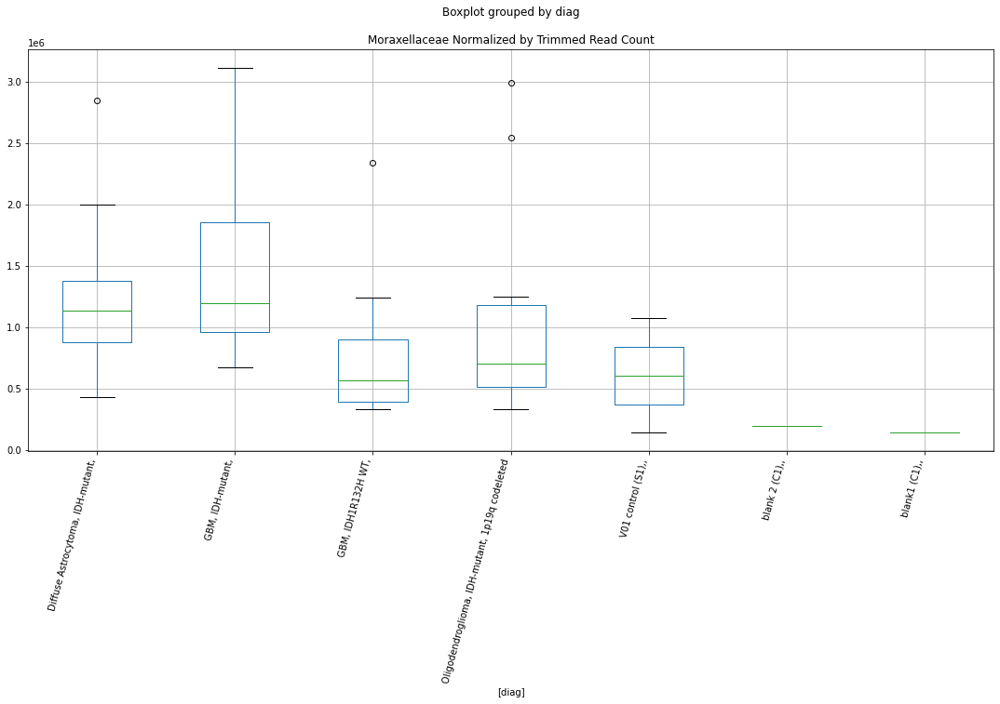

Moraxellaceae Lexogen cutadapt2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.1905953493273893
	p = 0.04188567422035713
Moraxellaceae Lexogen cutadapt2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.1905953493273893
	p = 0.04188567422035713


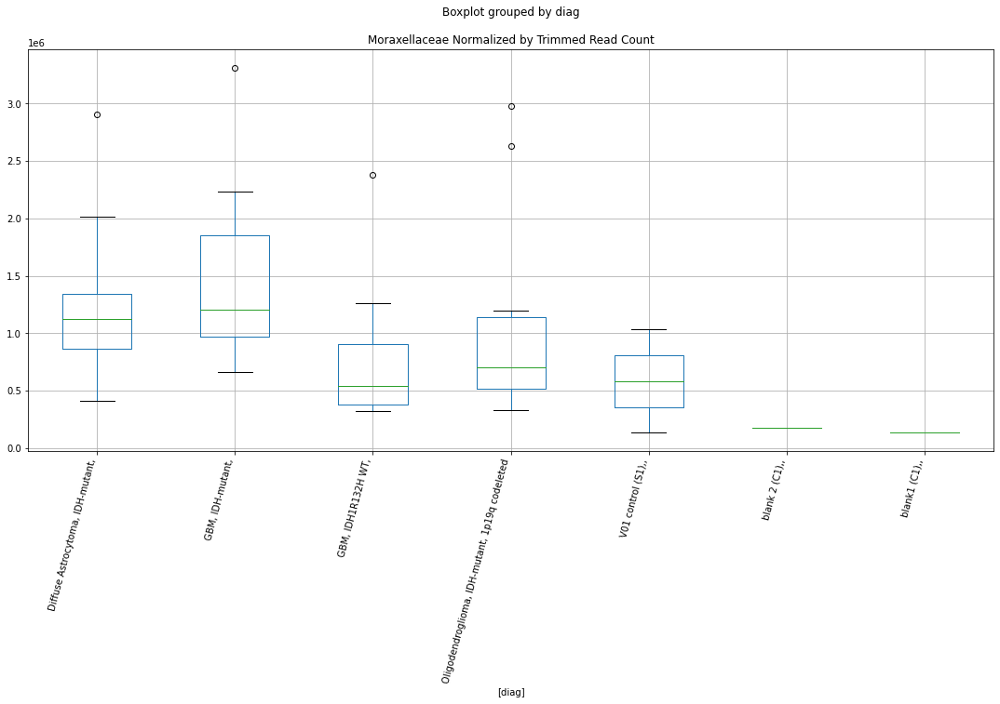

Moraxellaceae Lexogen cutadapt3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.1958968274229105
	p = 0.04144598188310069
Moraxellaceae Lexogen cutadapt3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.1958968274229105
	p = 0.04144598188310069


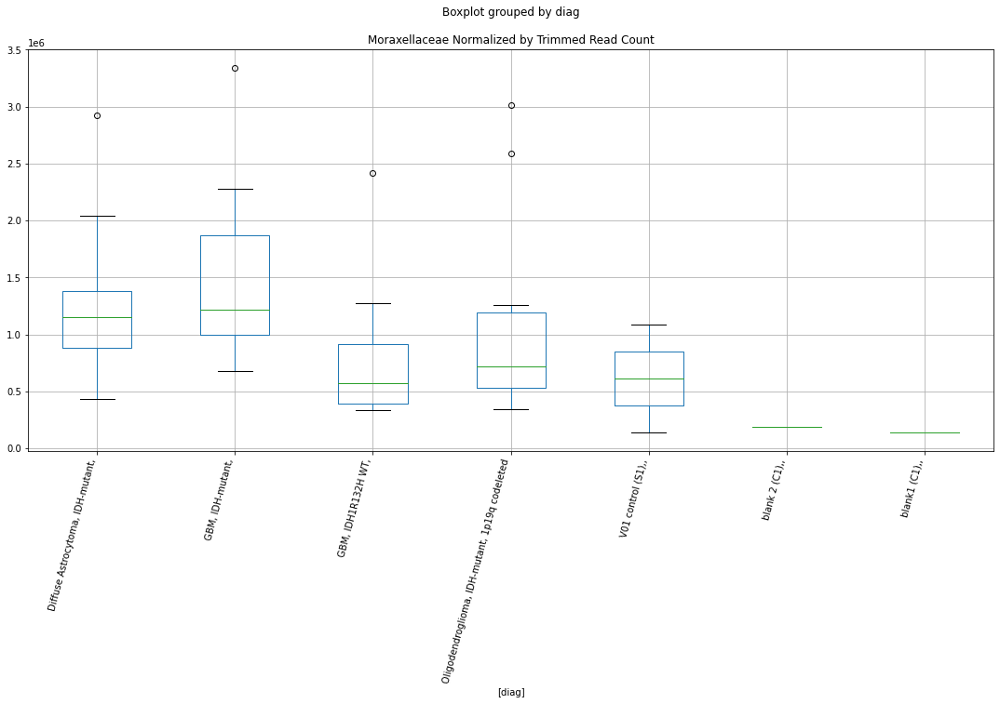

Enterococcaceae Lexogen cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.033572274543928
	p = 0.057007381732938275
Enterococcaceae Lexogen cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.033572274543928
	p = 0.057007381732938275
Enterococcaceae Lexogen cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.177008283654294
	p = 0.04303216187762109
Enterococcaceae Lexogen cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.177008283654294
	p = 0.04303216187762109


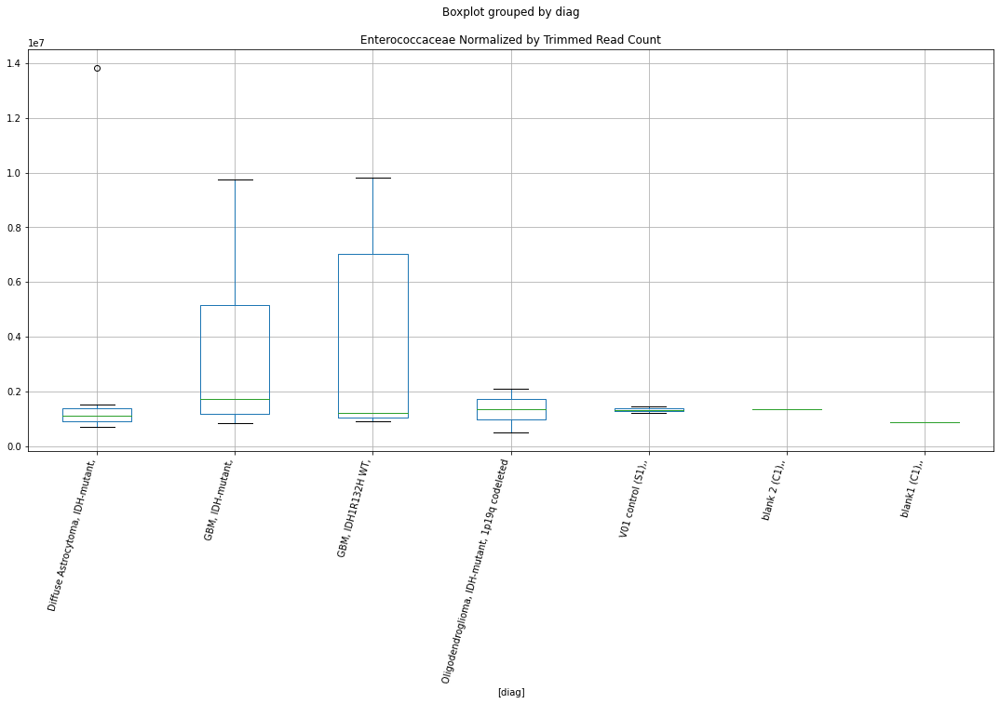

Enterococcaceae Lexogen cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.7350389743263201
	p = 0.09982324059442947
Enterococcaceae Lexogen cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.7350389743263201
	p = 0.09982324059442947


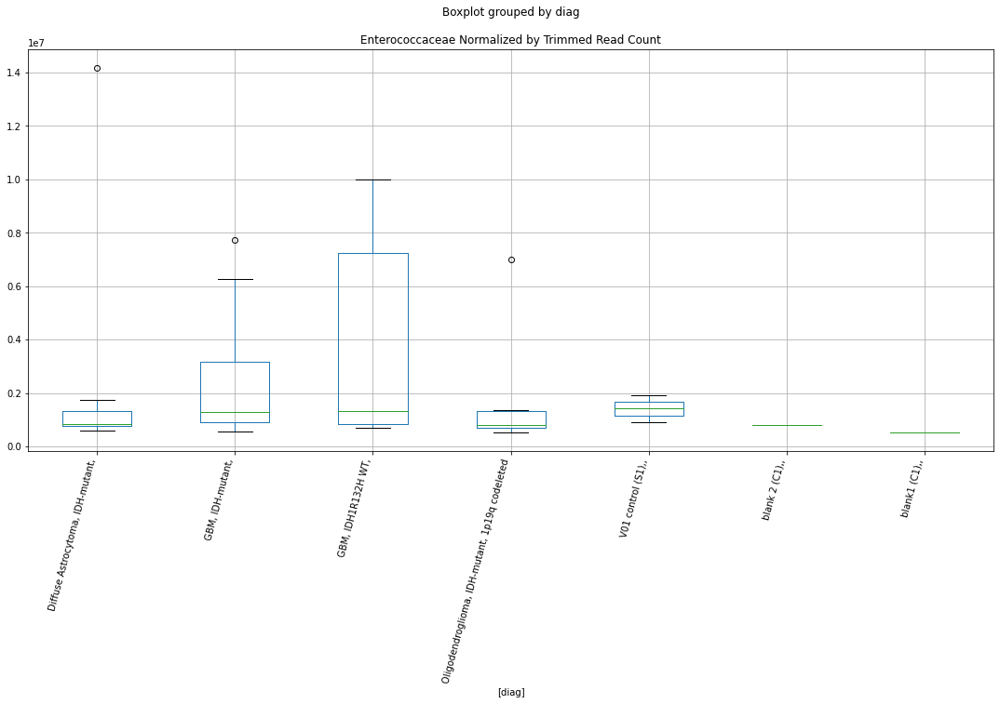

Pasteurellaceae D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8626714192835727
	p = 0.07891231513805072
Pasteurellaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8626714192835727
	p = 0.07891231513805072


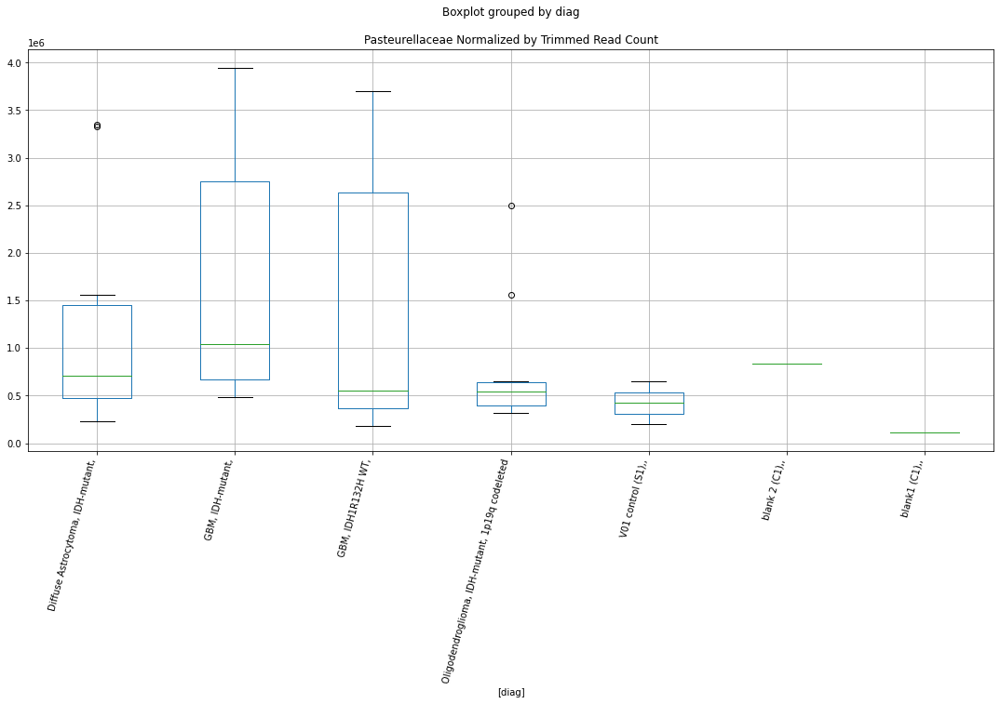

Pasteurellaceae D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8630464121785661
	p = 0.0788570346403111
Pasteurellaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8630464121785661
	p = 0.0788570346403111


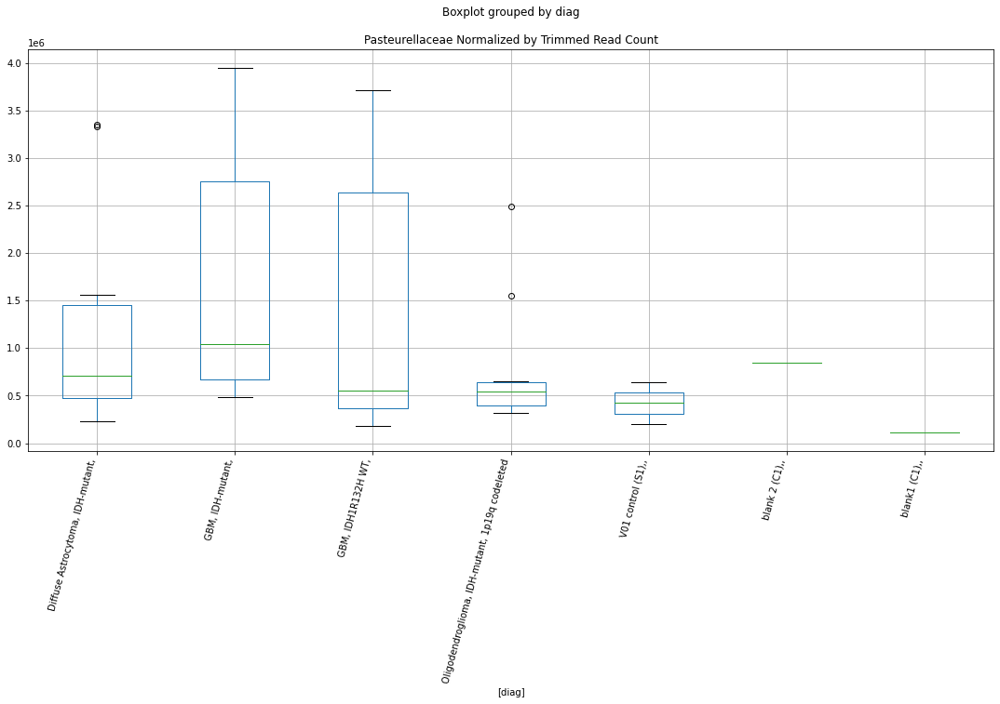

Pasteurellaceae D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.863512291680457
	p = 0.07878840345842565
Pasteurellaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.863512291680457
	p = 0.07878840345842565


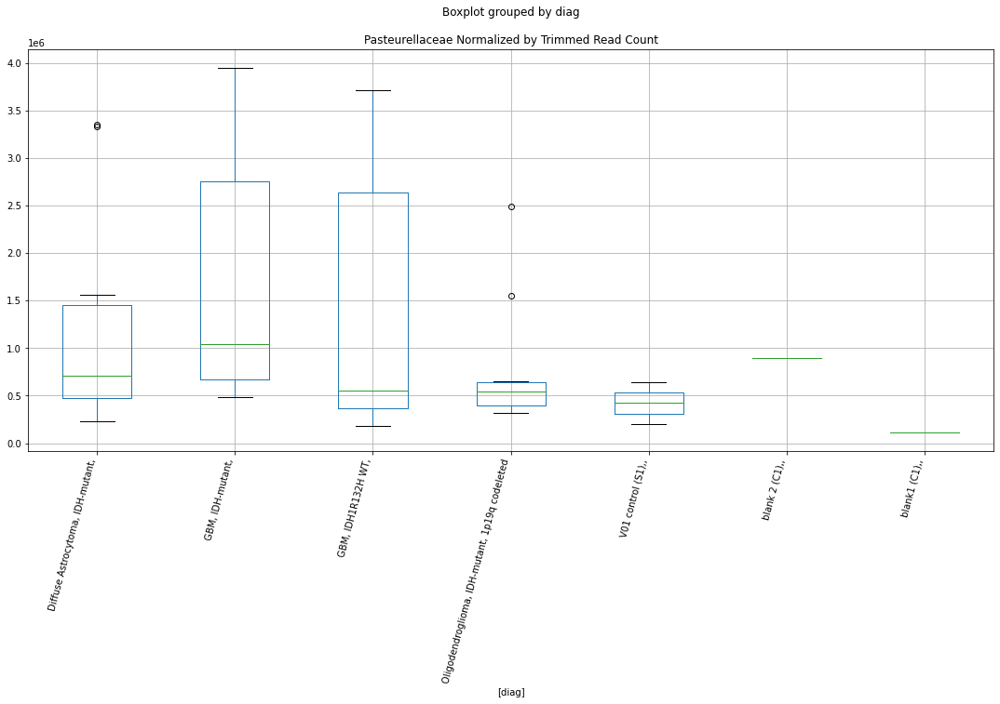

Paenibacillaceae D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8110824315381604
	p = 0.08685045013941695
Paenibacillaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8110824315381604
	p = 0.08685045013941695


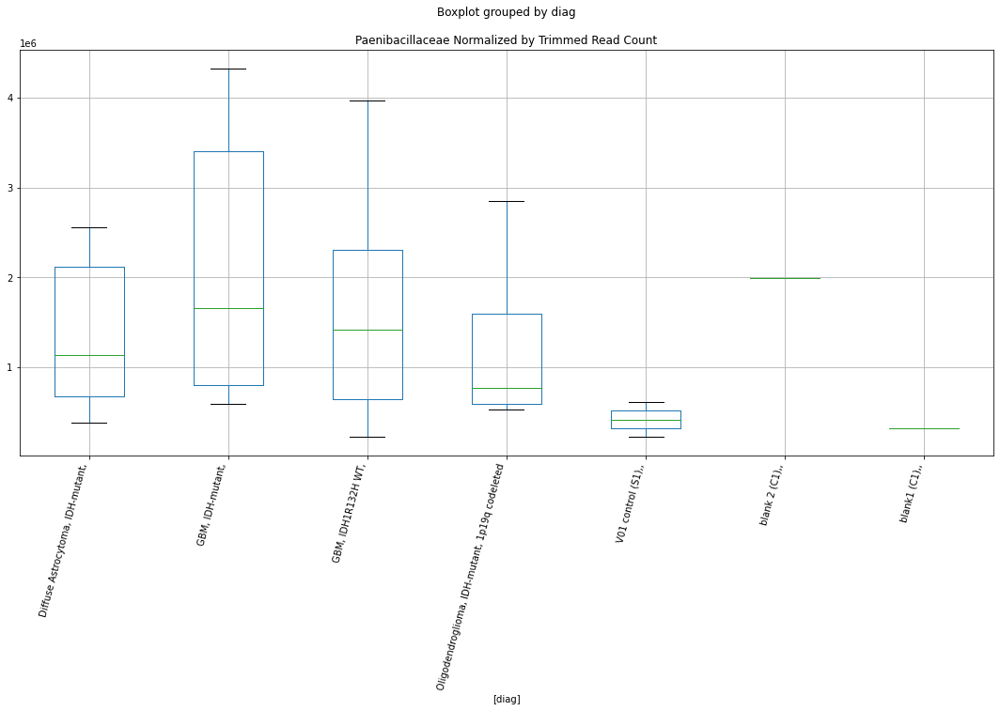

Methylophilaceae Lexogen bbduk1 : GBM, IDH-mutant, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.903874986917026
	p = 0.07303903459451111
Methylophilaceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH-mutant,
	t = -1.903874986917026
	p = 0.07303903459451111
Methylophilaceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.309722332277344
	p = 0.032972450080753994
Methylophilaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.309722332277344
	p = 0.032972450080753994


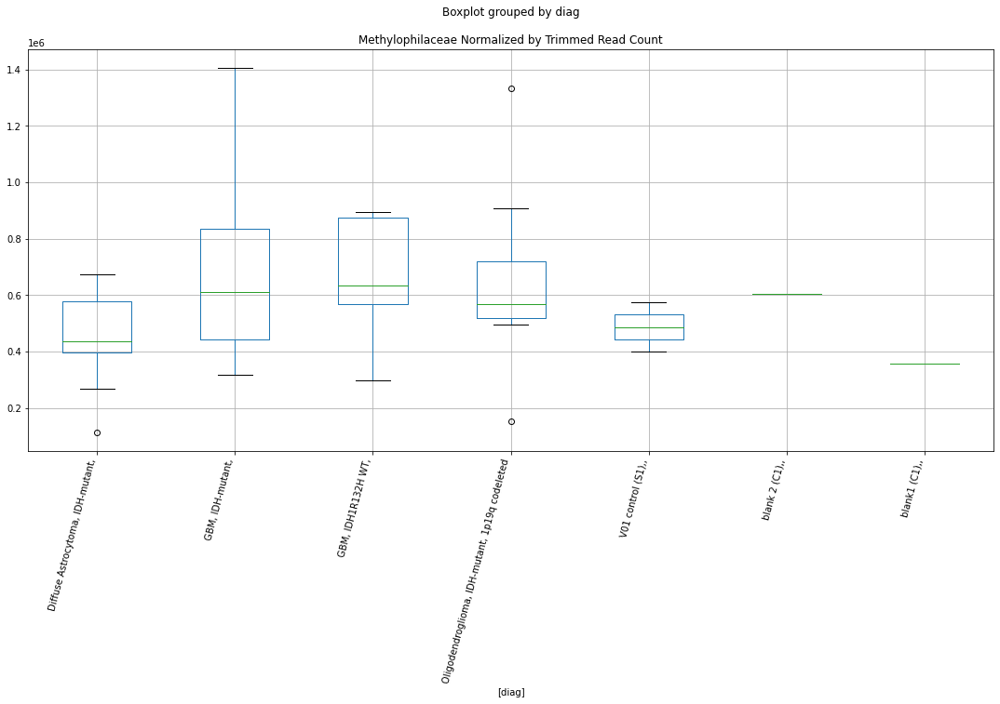

Chromatiaceae Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.7427302823882869
	p = 0.0984388410842763
Chromatiaceae Lexogen cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = 1.7427302823882869
	p = 0.0984388410842763


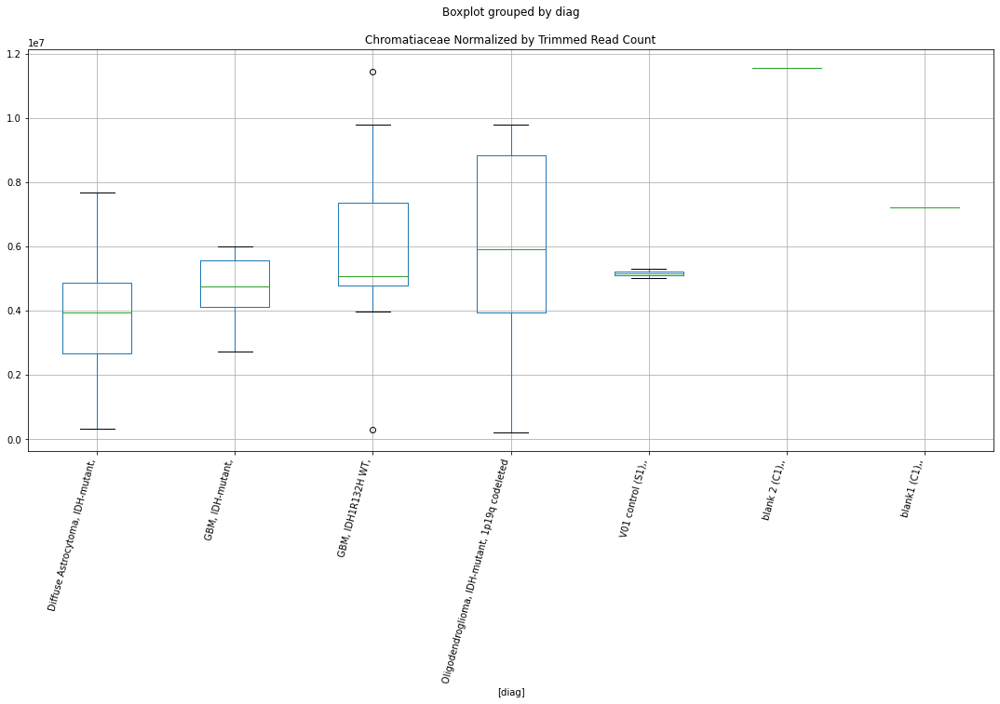

Xanthomonadaceae D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8155331304369517
	p = 0.08613902151335157
Xanthomonadaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8155331304369517
	p = 0.08613902151335157


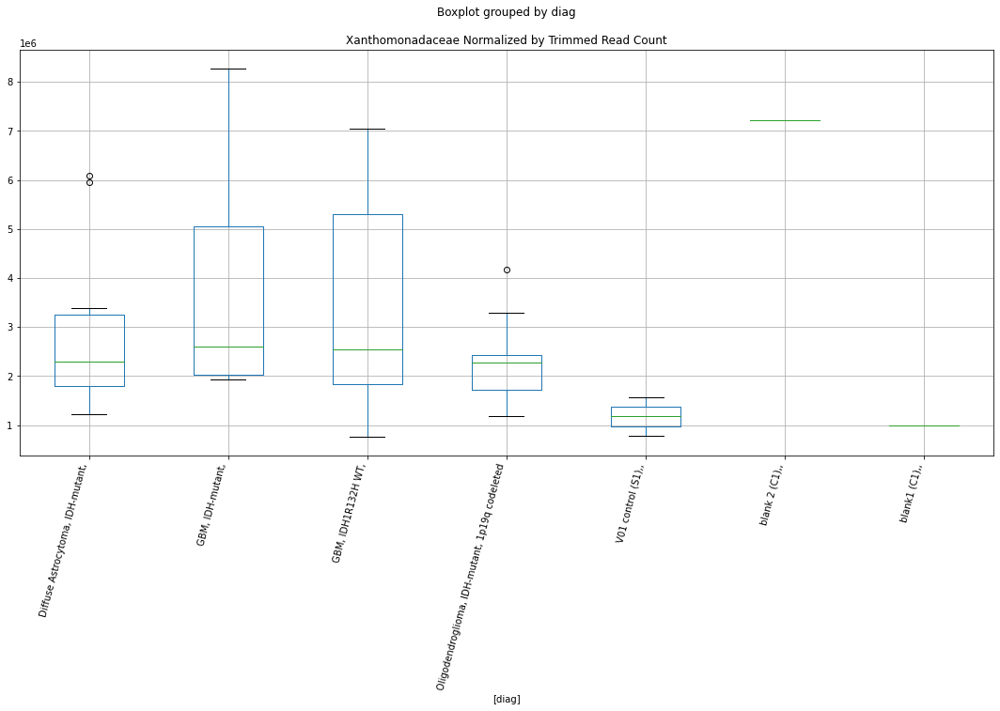

Xanthomonadaceae D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8166403743628958
	p = 0.08596282736710989
Xanthomonadaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8166403743628958
	p = 0.08596282736710989


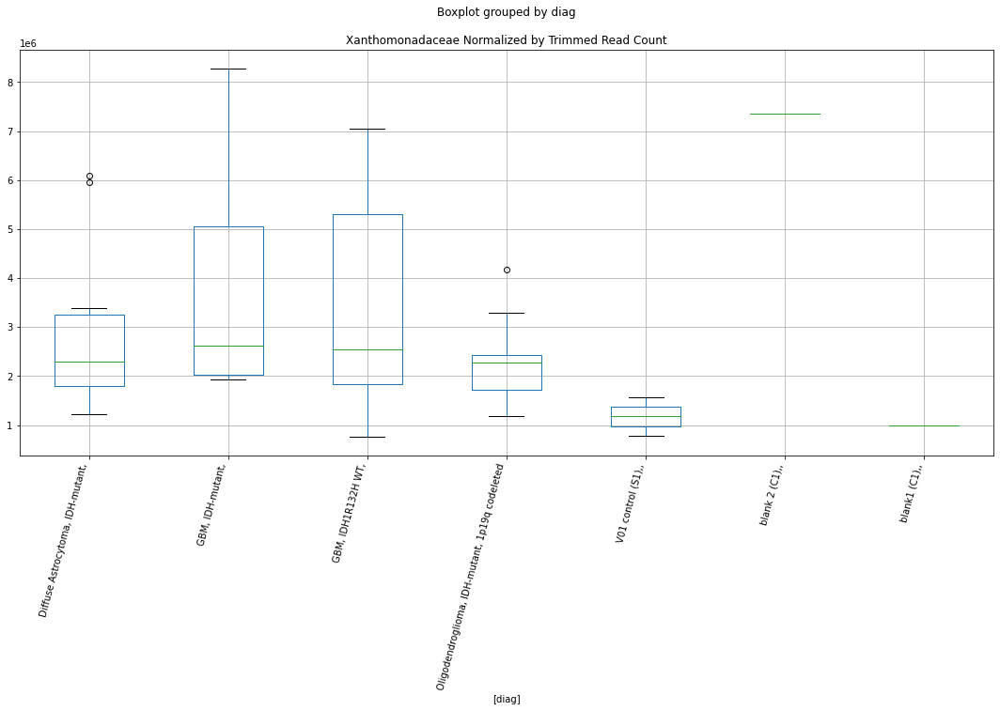

Xanthomonadaceae D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8164904345726947
	p = 0.08598666857249038
Xanthomonadaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8164904345726947
	p = 0.08598666857249038


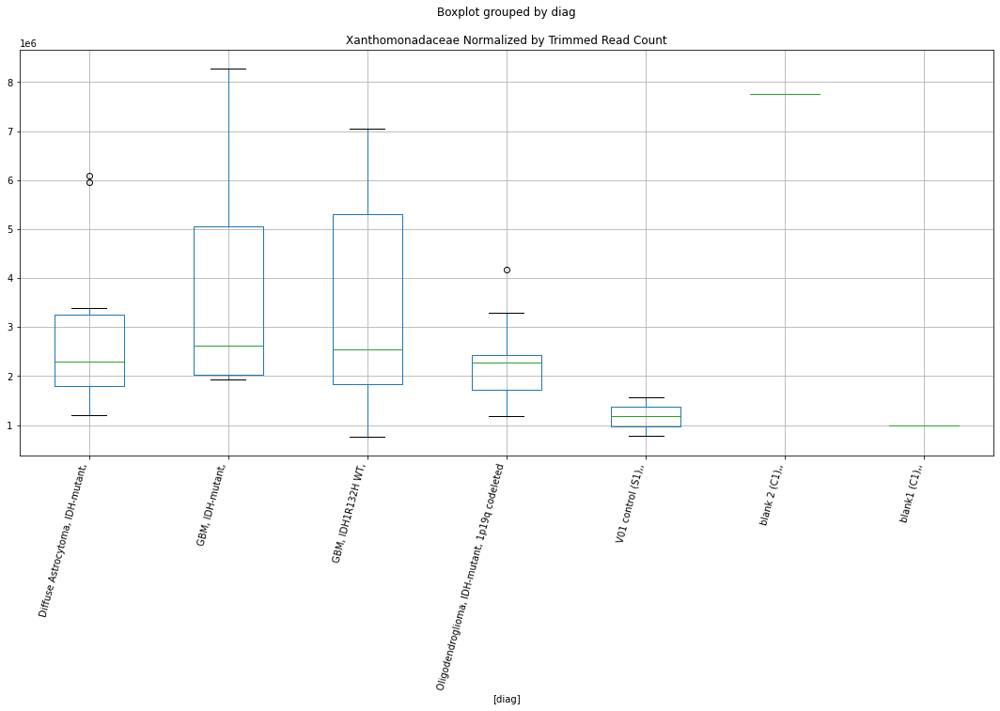

Rhodobacteraceae D-plex cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.7475651043637177
	p = 0.0975771322256619
Rhodobacteraceae D-plex cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 1.7475651043637177
	p = 0.0975771322256619


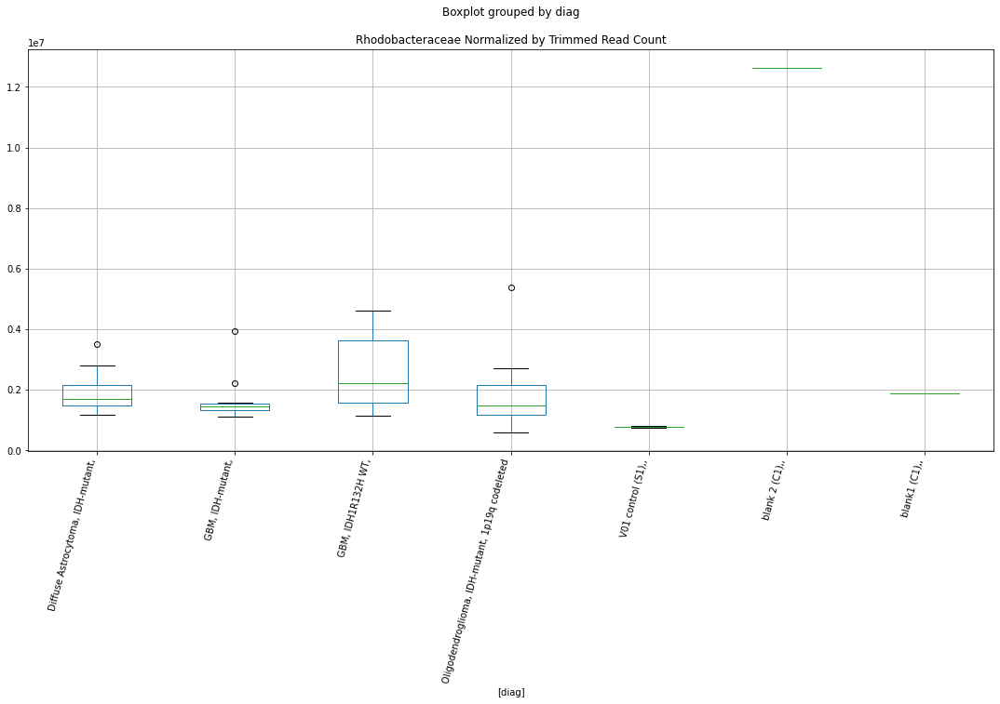

Rhodobacteraceae D-plex cutadapt2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.748767249252768
	p = 0.09736389181448689
Rhodobacteraceae D-plex cutadapt2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 1.748767249252768
	p = 0.09736389181448689


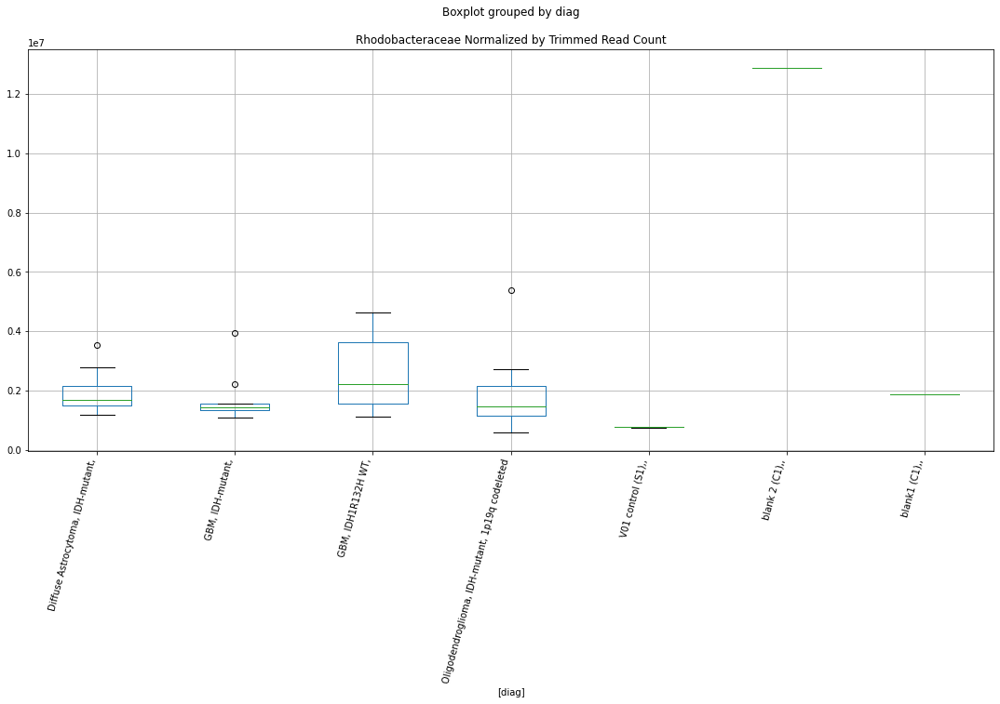

Rhodobacteraceae D-plex cutadapt3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.7483264316906544
	p = 0.09744203853140705
Rhodobacteraceae D-plex cutadapt3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 1.7483264316906544
	p = 0.09744203853140705


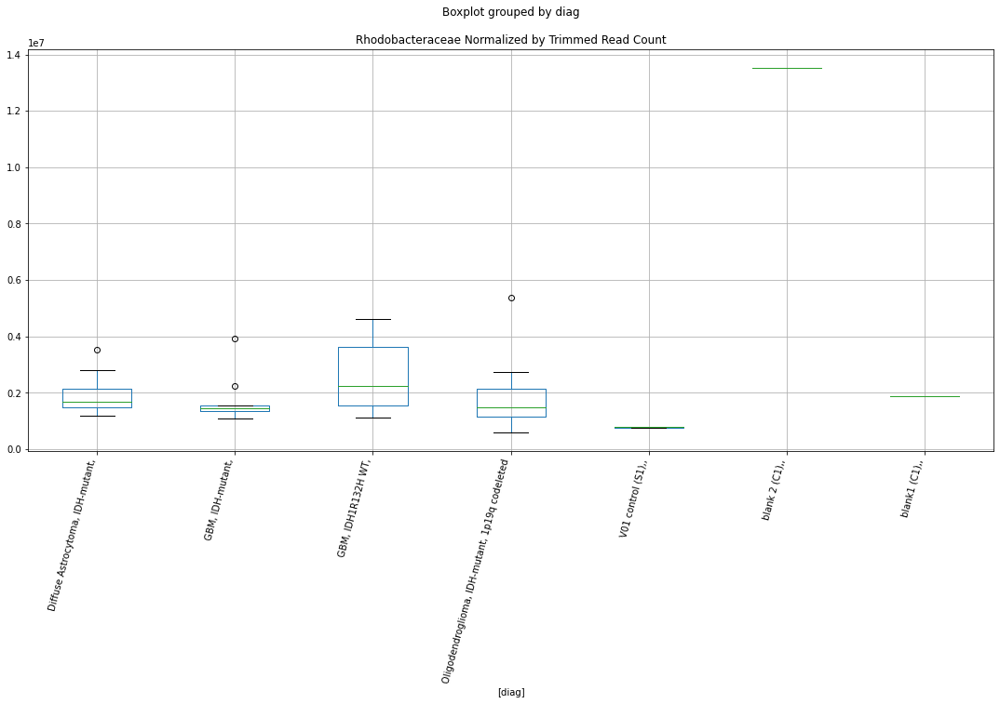

Chenopodiaceae Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.4786774041809667
	p = 0.023317660904074593
Chenopodiaceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.310125057845266
	p = 0.03294554693971282
Chenopodiaceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 3.525907073777933
	p = 0.002413767790485892
Chenopodiaceae Lexogen bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.310125057845266
	p = 0.03294554693971282
Chenopodiaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.4786774041809667
	p = 0.023317660904074593
Chenopodiaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -3.525907073777933
	p = 0.002413767790485892


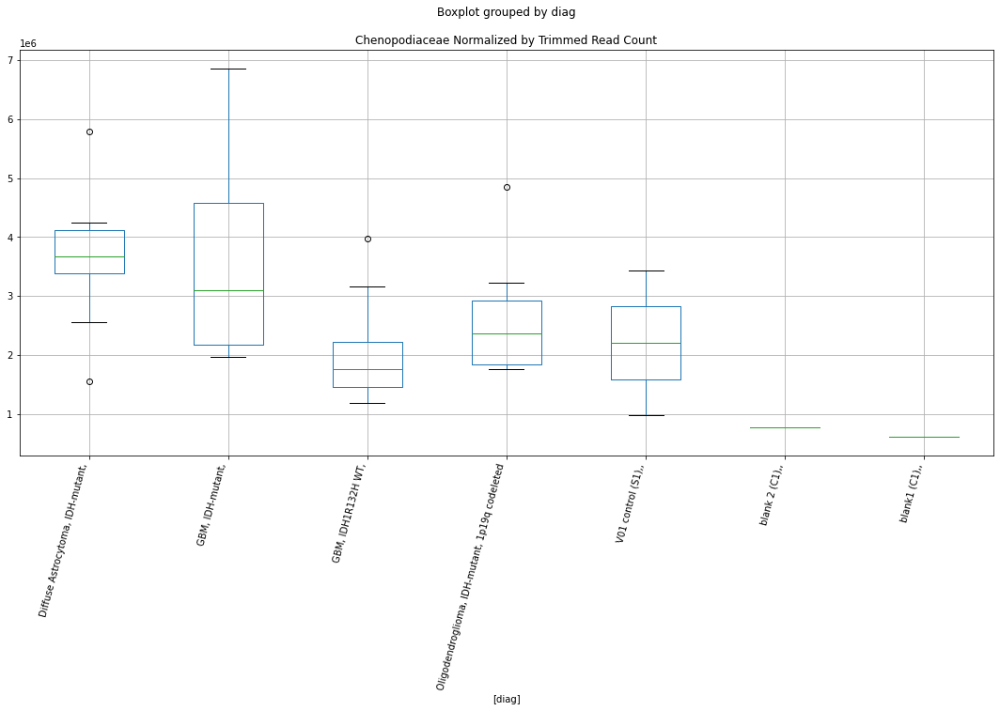

Chenopodiaceae Lexogen bbduk2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.4948645827573537
	p = 0.022547351621657483
Chenopodiaceae Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.3108763479775294
	p = 0.03289541319292872
Chenopodiaceae Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 3.3756628383734015
	p = 0.0033681830831857923
Chenopodiaceae Lexogen bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.3108763479775294
	p = 0.03289541319292872
Chenopodiaceae Lexogen bbduk2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.4948645827573537
	p = 0.022547351621657483
Chenopodiaceae Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -3.3756628383734015
	p = 0.0033681830831857923


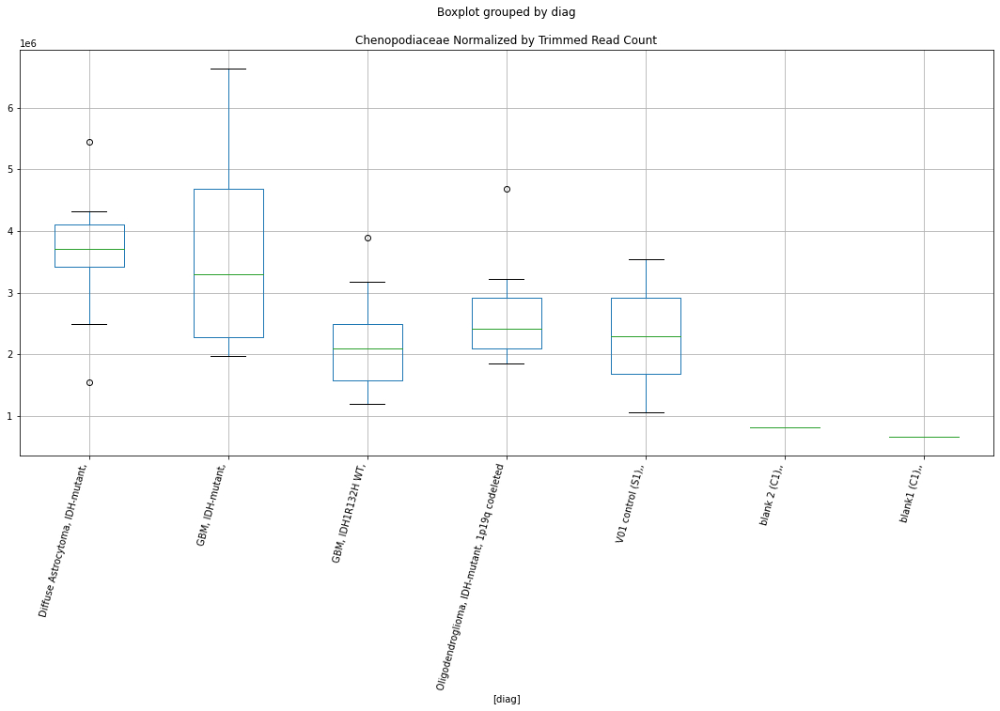

Chenopodiaceae Lexogen bbduk3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.414718234571284
	p = 0.02660993011577694
Chenopodiaceae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2984570421399604
	p = 0.033733310804141416
Chenopodiaceae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 3.3687244741263638
	p = 0.0034202949101205245
Chenopodiaceae Lexogen bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.2984570421399604
	p = 0.033733310804141416
Chenopodiaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.414718234571284
	p = 0.02660993011577694
Chenopodiaceae Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -3.3687244741263638
	p = 0.0034202949101205245


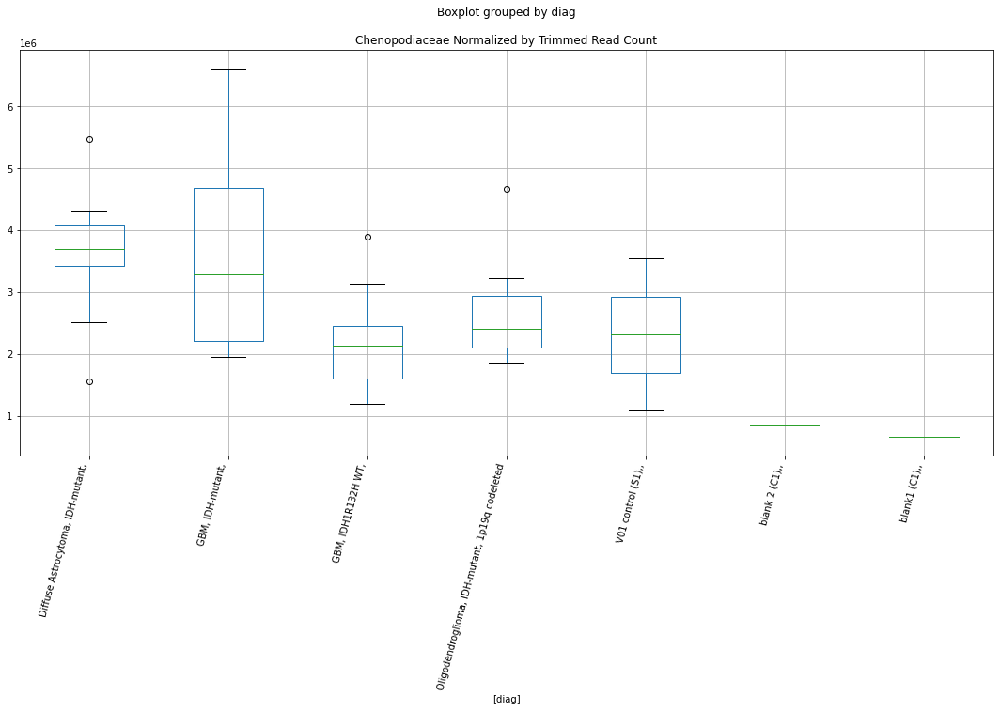

Chenopodiaceae Lexogen cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.912565923922549
	p = 0.07185086910948181
Chenopodiaceae Lexogen cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.7934186987283645
	p = 0.012004788963602703
Chenopodiaceae Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2870624287590577
	p = 0.0345194358501043
Chenopodiaceae Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 3.4371628373720284
	p = 0.002939226812085665
Chenopodiaceae Lexogen cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.912565923922549
	p = 0.07185086910948181
Chenopodiaceae Lexogen cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - Diffuse Astrocytoma, IDH-mutant,
	t = -2.2870624287590577
	p = 0.0345194358501043
Chenopodiaceae Lexogen cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.7934186987283645
	p = 0.012

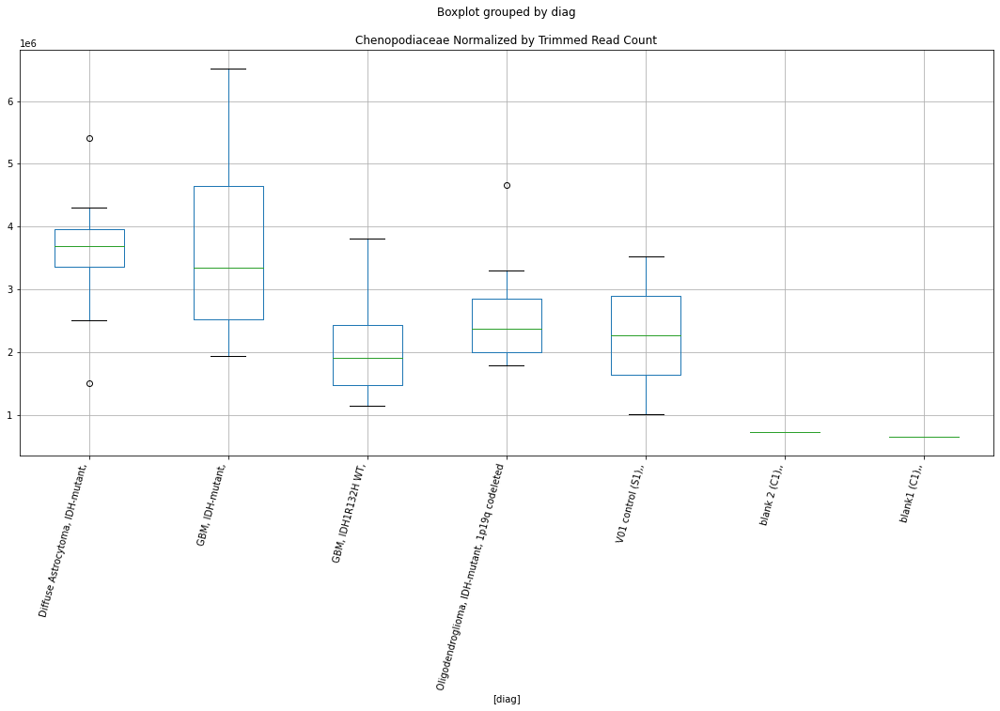

Chenopodiaceae Lexogen cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9193788518466377
	p = 0.0709314887987845
Chenopodiaceae Lexogen cutadapt2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.7741104720147445
	p = 0.012511184820761937
Chenopodiaceae Lexogen cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.1924900561153846
	p = 0.04172804241958439
Chenopodiaceae Lexogen cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9193788518466377
	p = 0.0709314887987845
Chenopodiaceae Lexogen cutadapt2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.7741104720147445
	p = 0.012511184820761937
Chenopodiaceae Lexogen cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.1924900561153846
	p = 0.04172804241958439


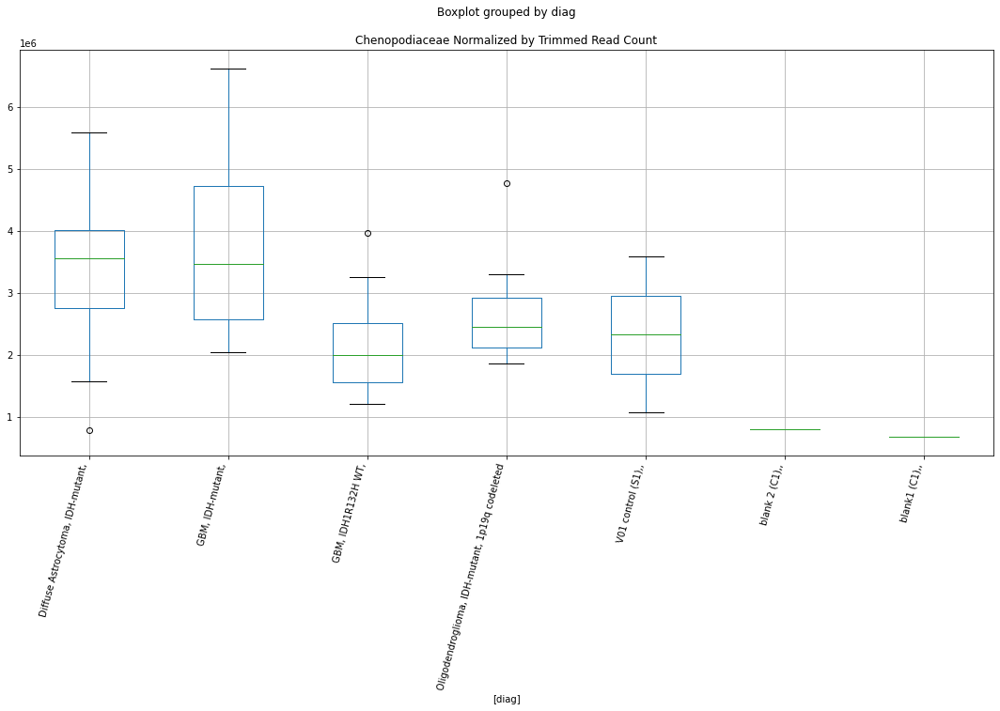

Chenopodiaceae Lexogen cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.9569456196165054
	p = 0.06604753188696809
Chenopodiaceae Lexogen cutadapt3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.8103429216351357
	p = 0.011577158588809883
Chenopodiaceae Lexogen cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.182640831302638
	p = 0.042553436169061105
Chenopodiaceae Lexogen cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.9569456196165054
	p = 0.06604753188696809
Chenopodiaceae Lexogen cutadapt3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.8103429216351357
	p = 0.011577158588809883
Chenopodiaceae Lexogen cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.182640831302638
	p = 0.042553436169061105


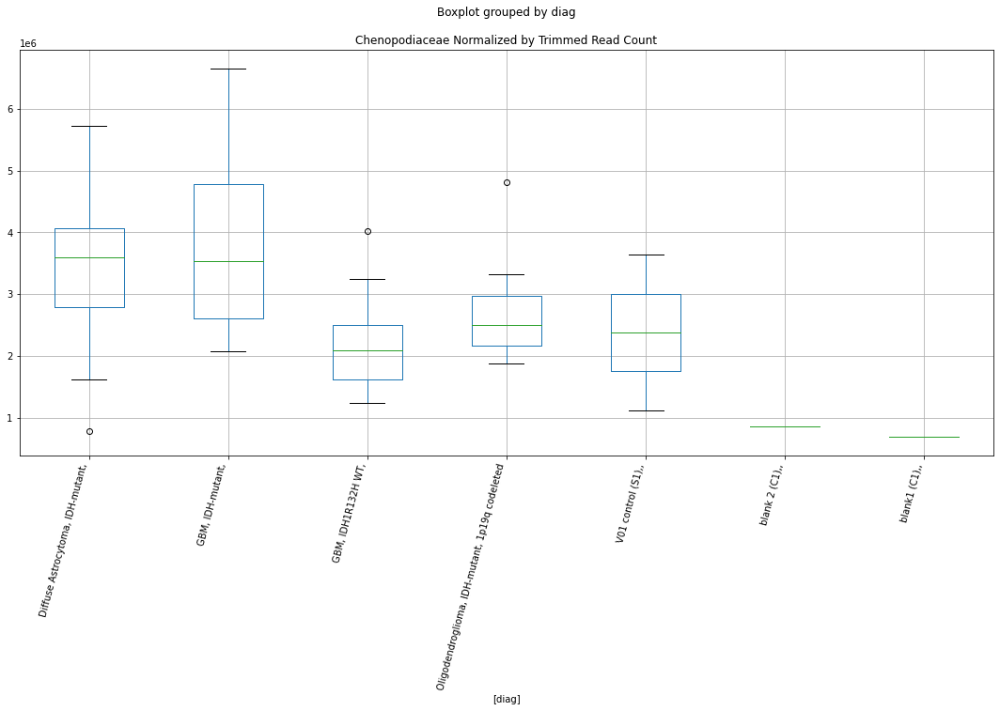

Streptomycetaceae D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.590364132332295
	p = 0.01846957420421161
Streptomycetaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.590364132332295
	p = 0.01846957420421161
Streptomycetaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.6142033828202265
	p = 0.017566507654515222
Streptomycetaceae D-plex bbduk1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6142033828202265
	p = 0.017566507654515222


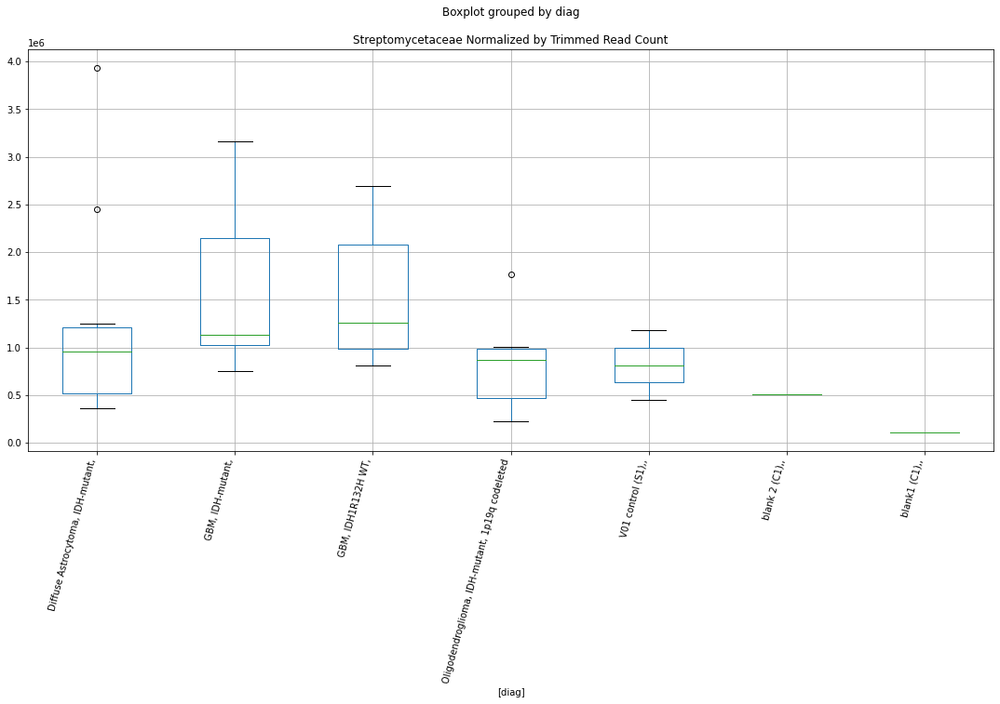

Streptomycetaceae D-plex bbduk2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.3382385694863794
	p = 0.003658838504694938
Streptomycetaceae D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.3382385694863794
	p = 0.003658838504694938
Streptomycetaceae D-plex bbduk2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.6746595567090297
	p = 0.015460750881916853
Streptomycetaceae D-plex bbduk2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.6746595567090297
	p = 0.015460750881916853


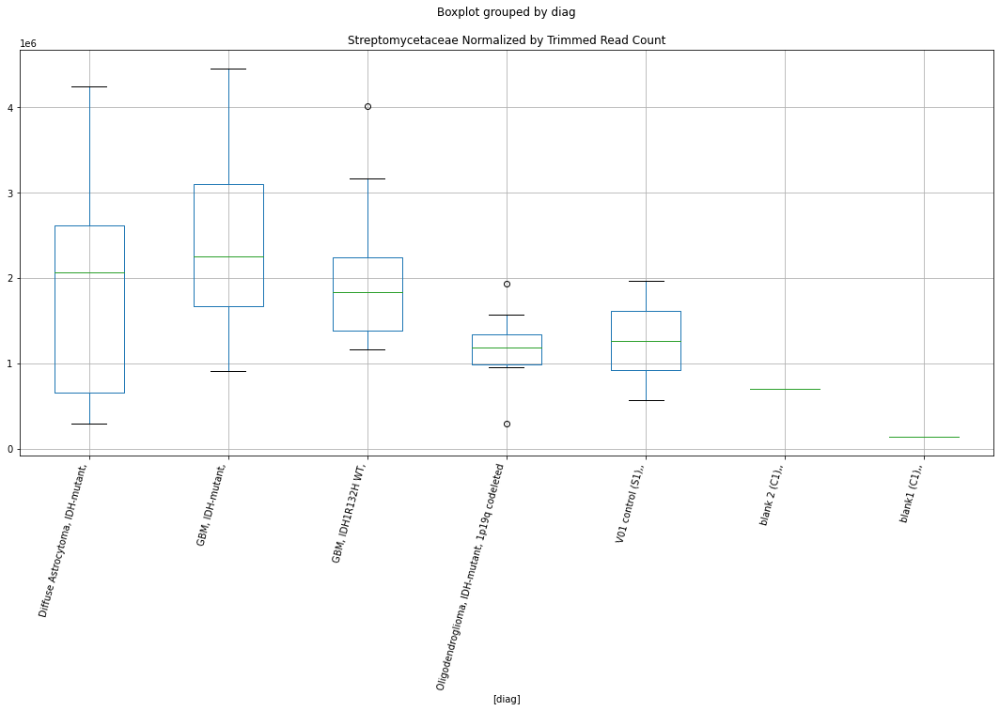

Streptomycetaceae D-plex bbduk3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.4375406365755143
	p = 0.002936766009038118
Streptomycetaceae D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.4375406365755143
	p = 0.002936766009038118
Streptomycetaceae D-plex bbduk3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -3.2316285290096567
	p = 0.004628949441183089
Streptomycetaceae D-plex bbduk3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.2316285290096567
	p = 0.004628949441183089


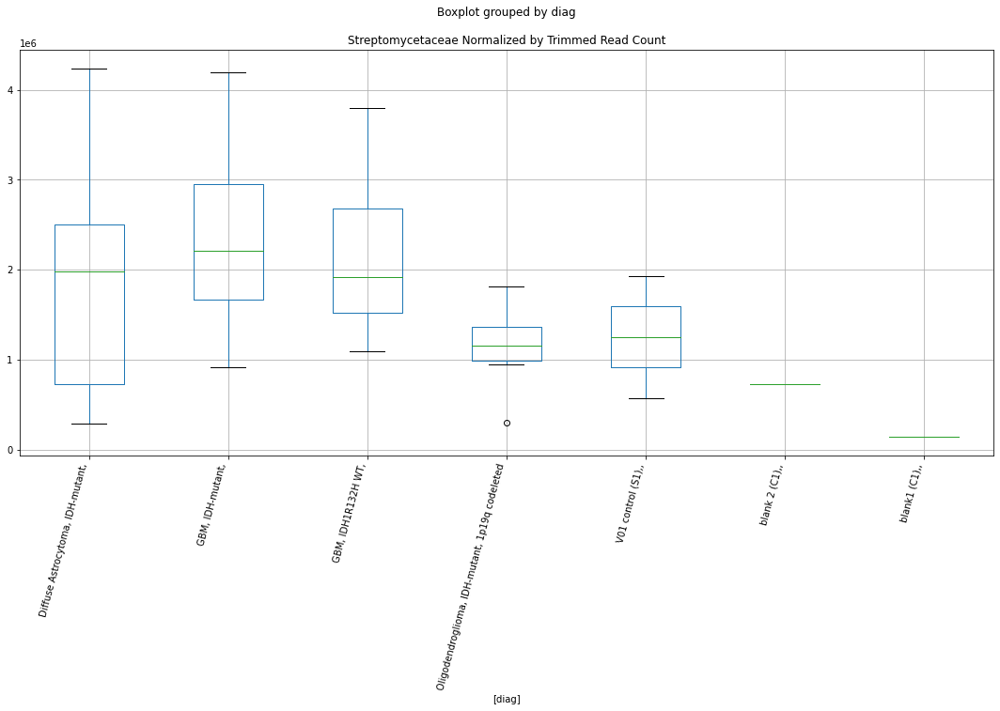

Streptomycetaceae D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.841161385980994
	p = 0.01083579105825292
Streptomycetaceae D-plex cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.4517008433553915
	p = 0.024656664791265926
Streptomycetaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.841161385980994
	p = 0.01083579105825292
Streptomycetaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -4.9186689342384025
	p = 0.00011074516162948476
Streptomycetaceae D-plex cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.4517008433553915
	p = 0.024656664791265926
Streptomycetaceae D-plex cutadapt1 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 4.9186689342384025
	p = 0.00011074516162948476


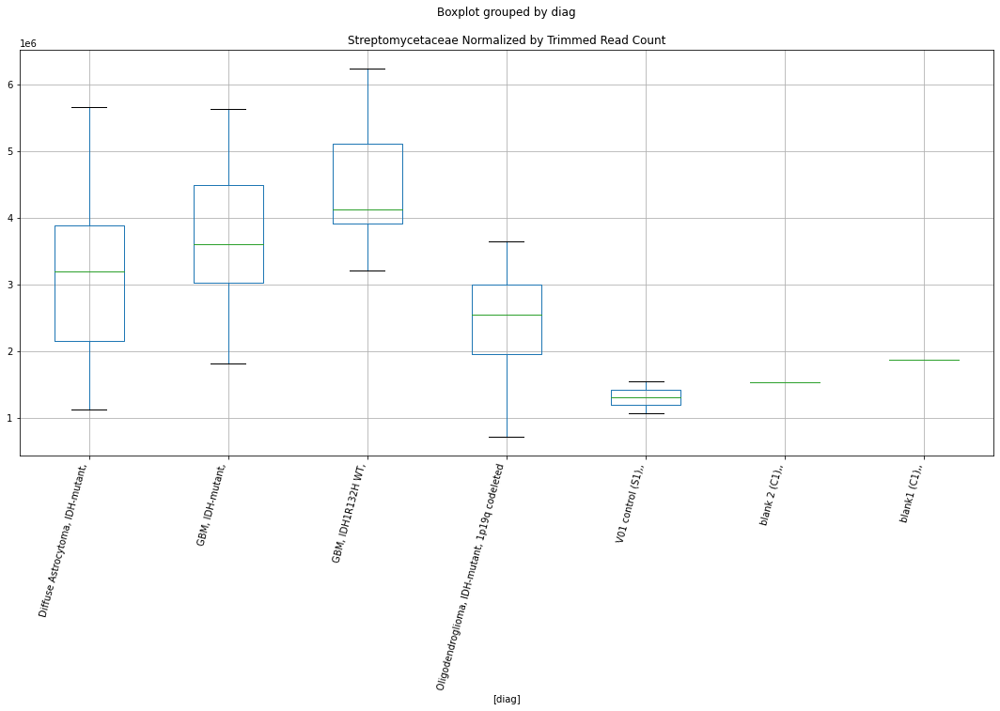

Streptomycetaceae D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.593468666354404
	p = 0.01834952330646611
Streptomycetaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.593468666354404
	p = 0.01834952330646611
Streptomycetaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.495625877699529
	p = 0.02251172009525796
Streptomycetaceae D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.495625877699529
	p = 0.02251172009525796


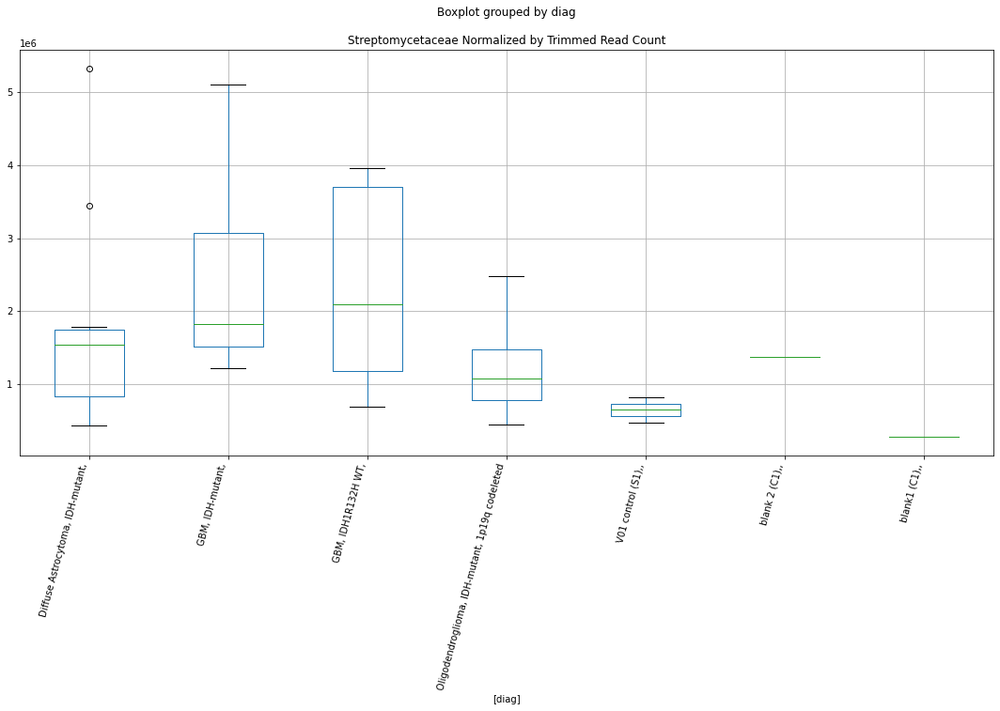

Streptomycetaceae D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.5660263473389238
	p = 0.019436840077565493
Streptomycetaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.5660263473389238
	p = 0.019436840077565493
Streptomycetaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.4111142478979475
	p = 0.02680783768373078
Streptomycetaceae D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.4111142478979475
	p = 0.02680783768373078


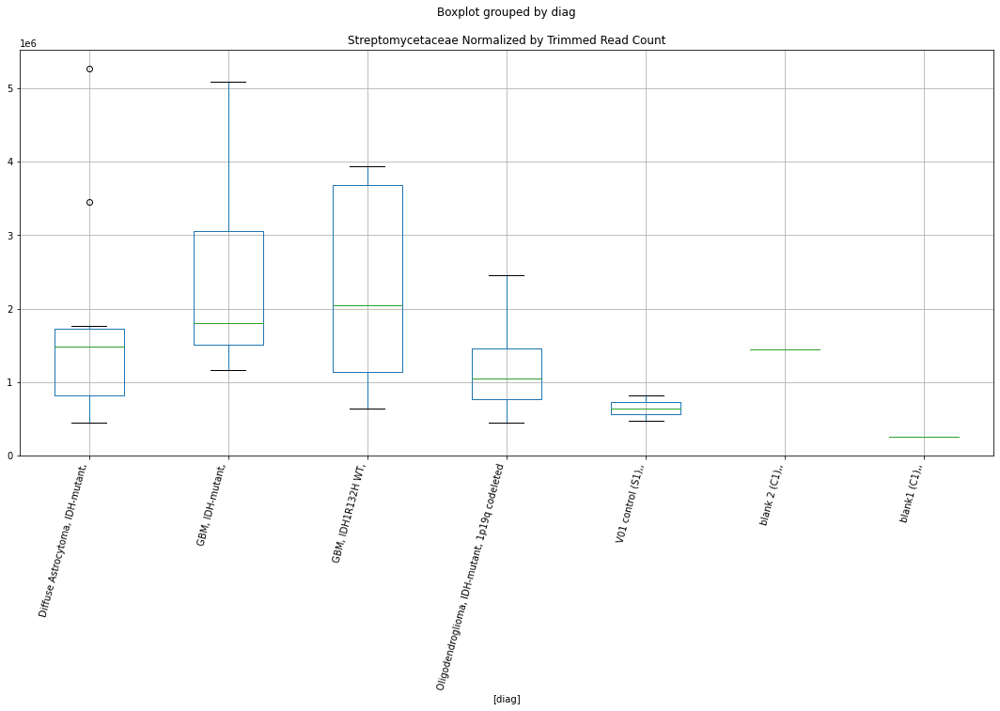

Desulfobacteraceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.7862670664302291
	p = 0.09091208901776057
Desulfobacteraceae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.7862670664302291
	p = 0.09091208901776057


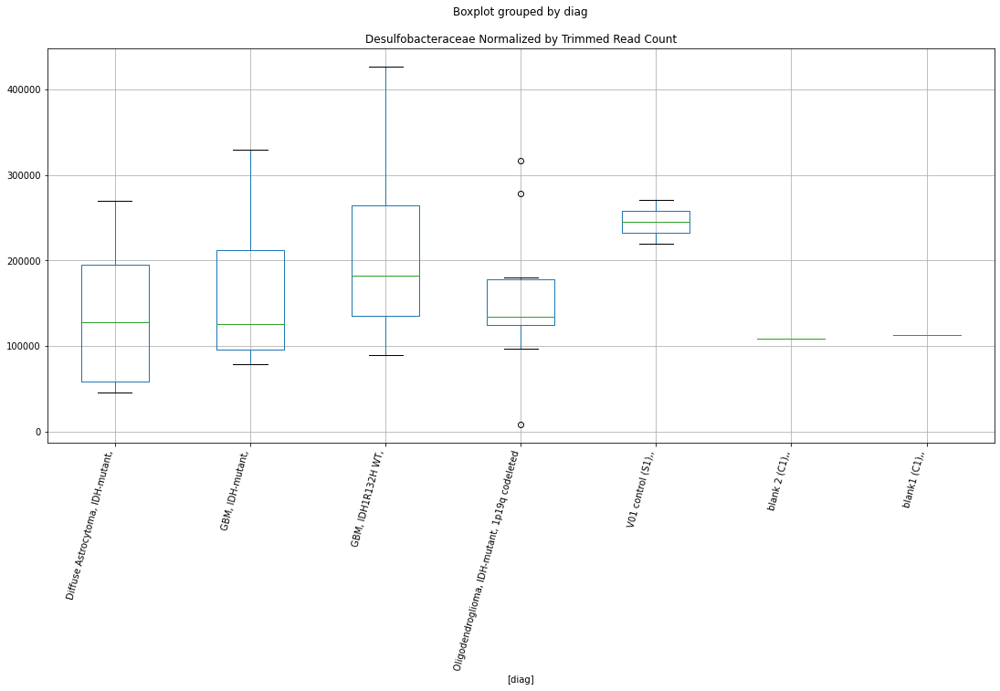

Listeriaceae D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8156450952948493
	p = 0.08612119033806137
Listeriaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8156450952948493
	p = 0.08612119033806137


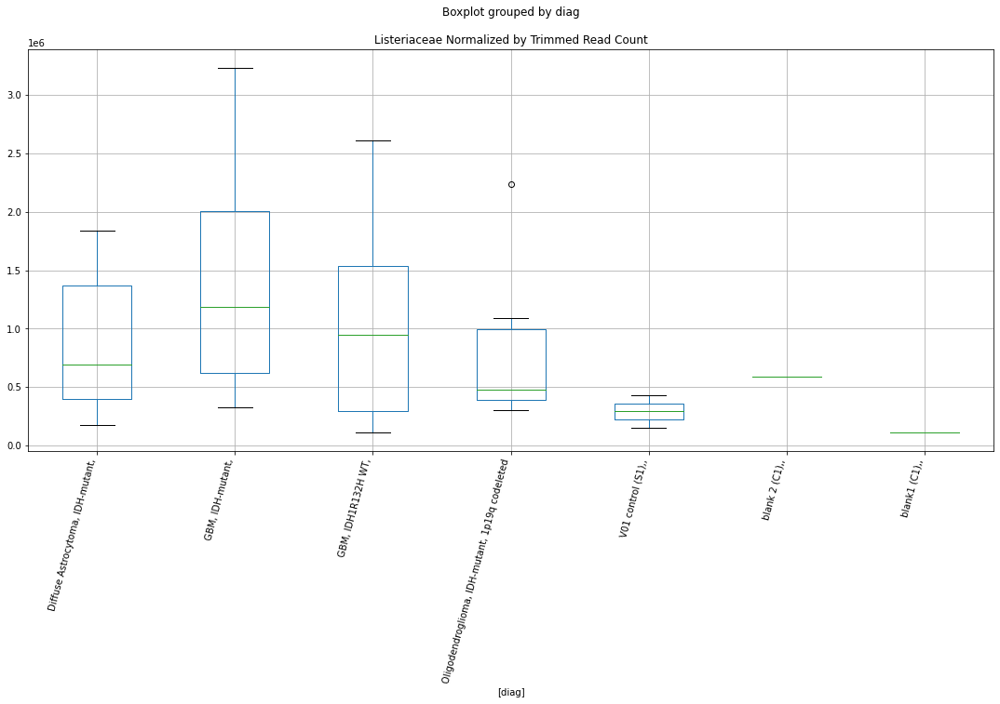

Listeriaceae Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.0452904069446127
	p = 0.055727746803179816
Listeriaceae Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.0452904069446127
	p = 0.055727746803179816


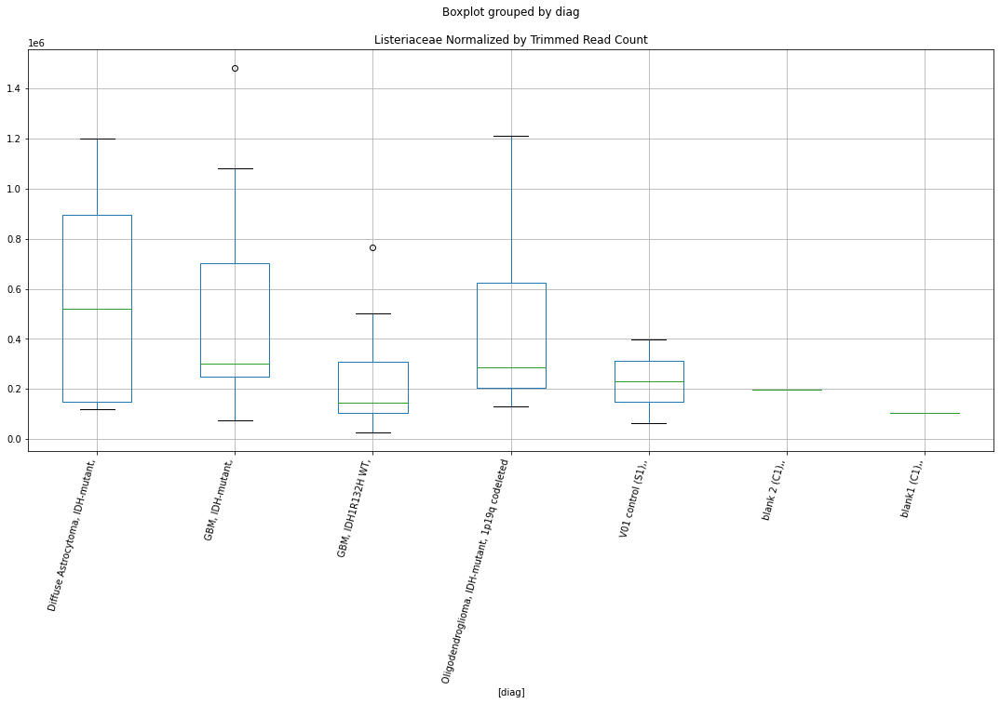

Listeriaceae Lexogen cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.76563210139094
	p = 0.09441468800859364
Listeriaceae Lexogen cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = 1.76563210139094
	p = 0.09441468800859364


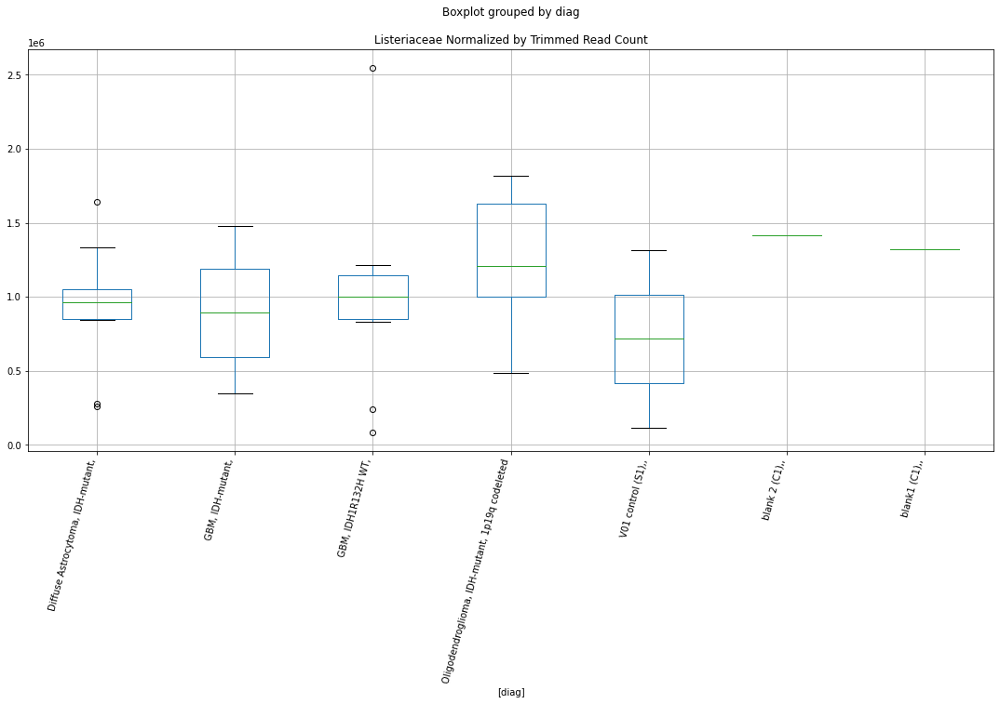

Clostridiaceae D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8210545494378227
	p = 0.08526354124879965
Clostridiaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8210545494378227
	p = 0.08526354124879965


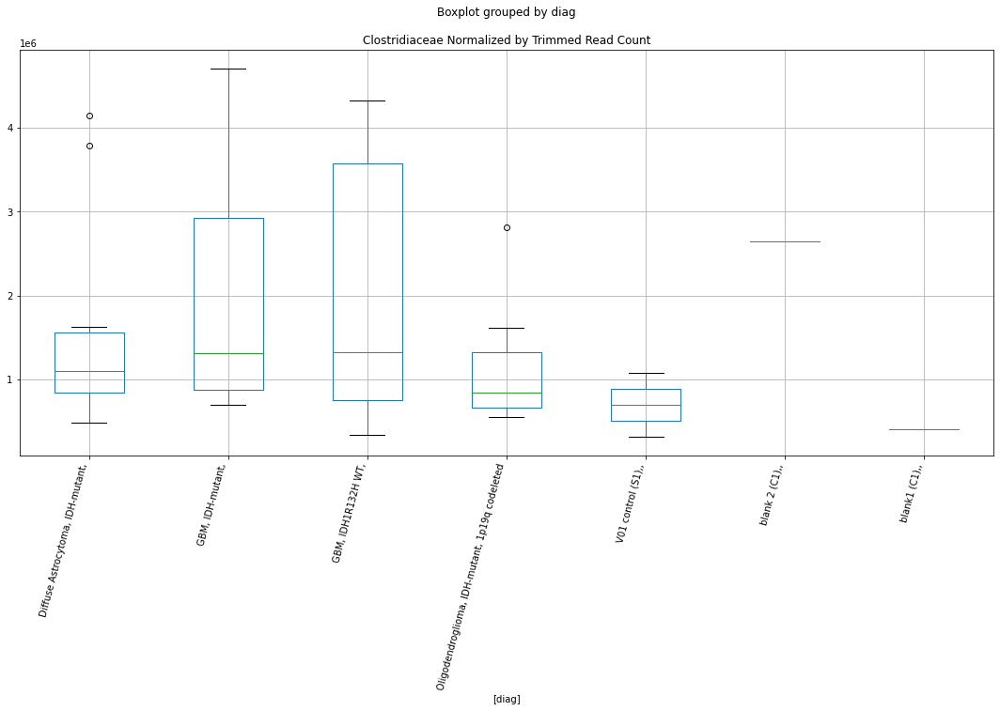

Clostridiaceae D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8216024496512426
	p = 0.0851770926840242
Clostridiaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8216024496512426
	p = 0.0851770926840242


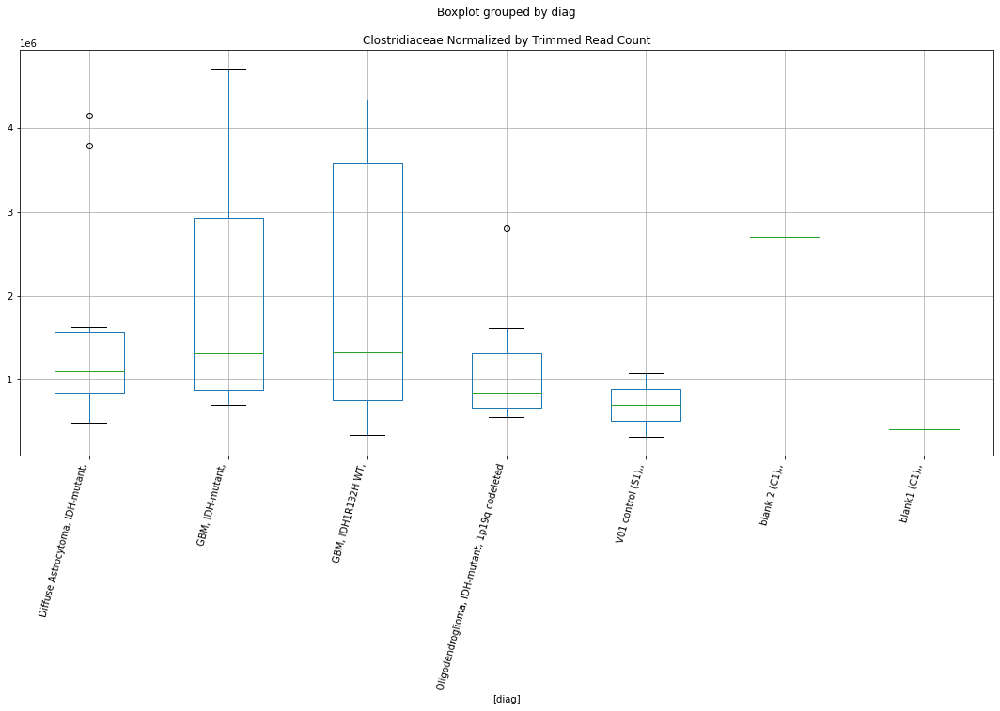

Clostridiaceae D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8213347388827283
	p = 0.08521932290748707
Clostridiaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8213347388827283
	p = 0.08521932290748707


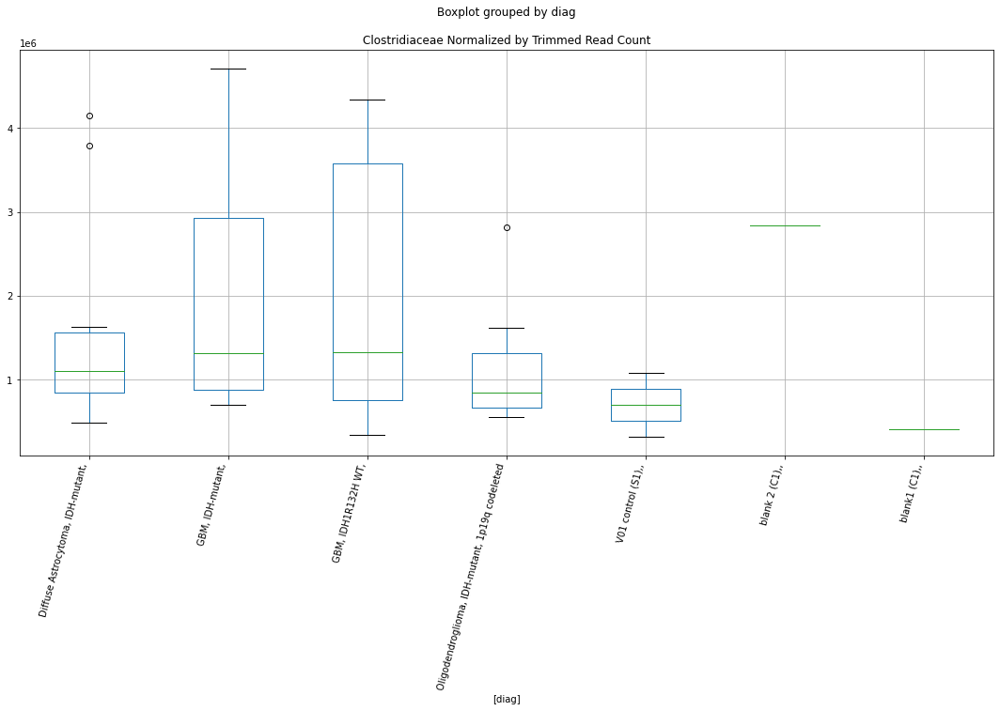

Daphniidae Lexogen bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.2457945651914164
	p = 0.037510609534245225
Daphniidae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 3.279164158424166
	p = 0.004168616869145588
Daphniidae Lexogen bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.2457945651914164
	p = 0.037510609534245225
Daphniidae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -3.279164158424166
	p = 0.004168616869145588


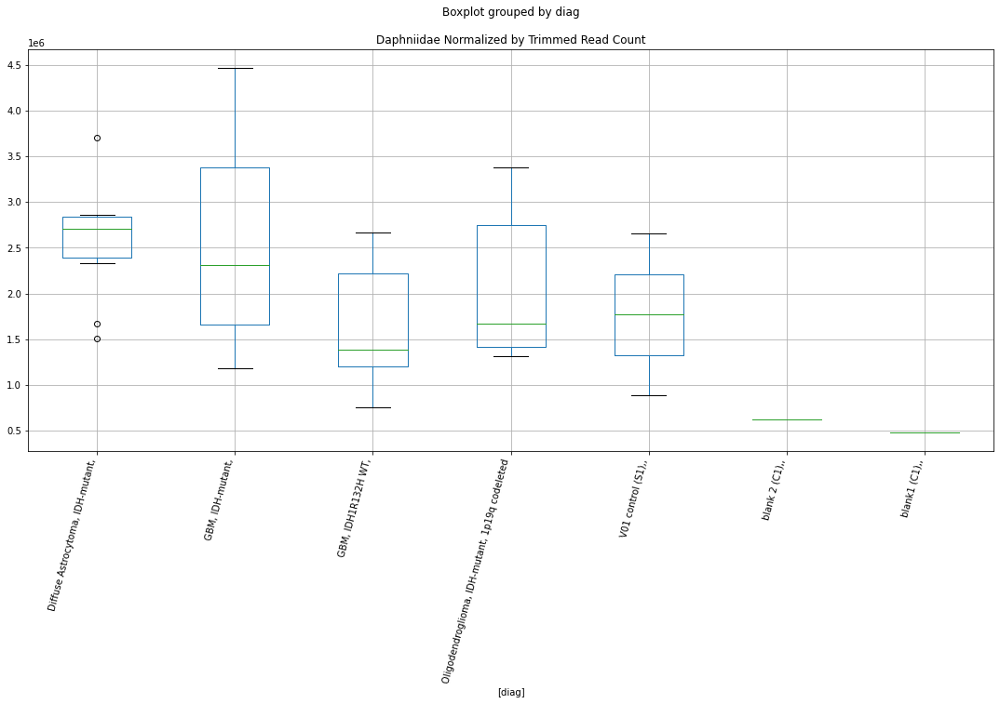

Daphniidae Lexogen bbduk2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.5845856671608147
	p = 0.01869501088019831
Daphniidae Lexogen bbduk2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 3.5384438648623284
	p = 0.002347460146419865
Daphniidae Lexogen bbduk2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.5845856671608147
	p = 0.01869501088019831
Daphniidae Lexogen bbduk2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -3.5384438648623284
	p = 0.002347460146419865


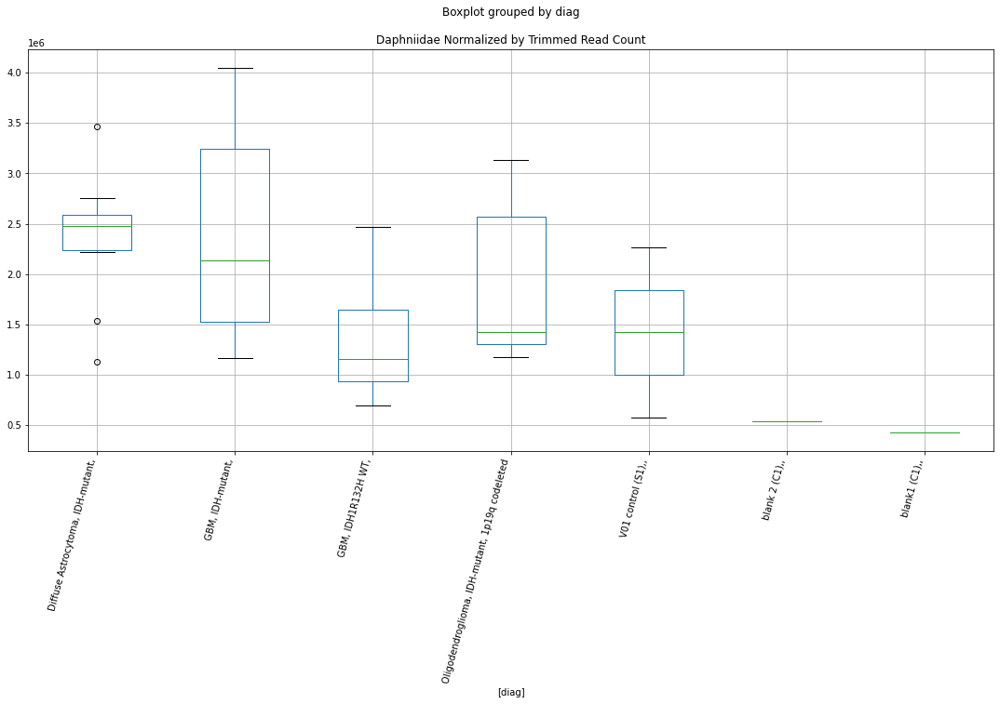

Daphniidae Lexogen bbduk3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.5132332302219678
	p = 0.021702284542644966
Daphniidae Lexogen bbduk3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 3.5541028049964822
	p = 0.0022671704566585306
Daphniidae Lexogen bbduk3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.5132332302219678
	p = 0.021702284542644966
Daphniidae Lexogen bbduk3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -3.5541028049964822
	p = 0.0022671704566585306


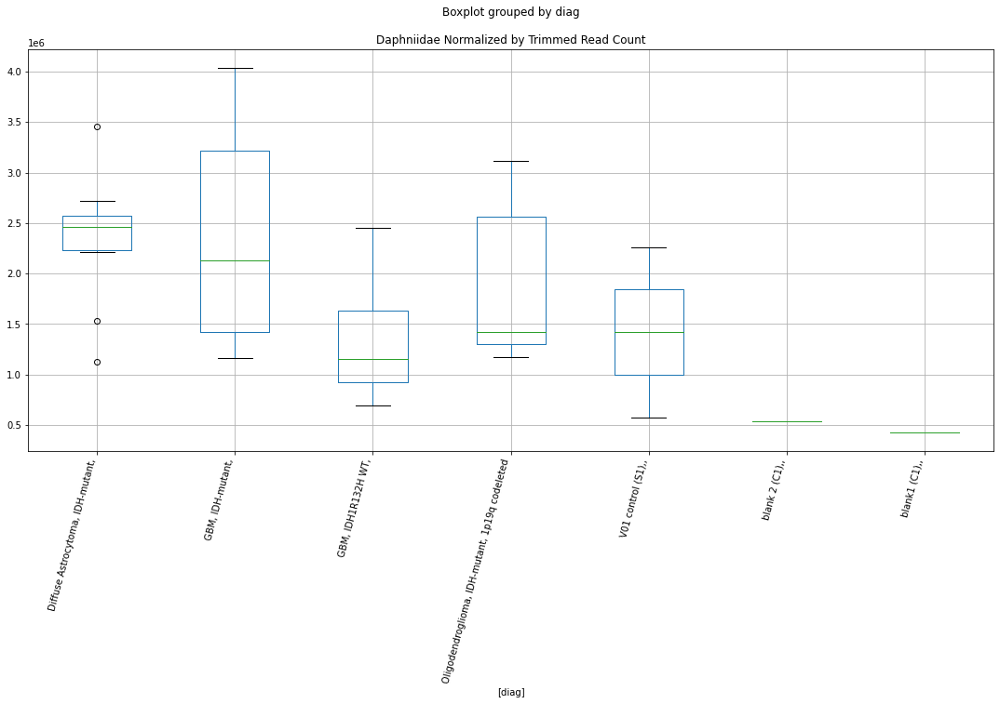

Daphniidae Lexogen cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.817575040184708
	p = 0.01139892188616124
Daphniidae Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 3.484093836967654
	p = 0.0026486214106498187
Daphniidae Lexogen cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.817575040184708
	p = 0.01139892188616124
Daphniidae Lexogen cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -3.484093836967654
	p = 0.0026486214106498187


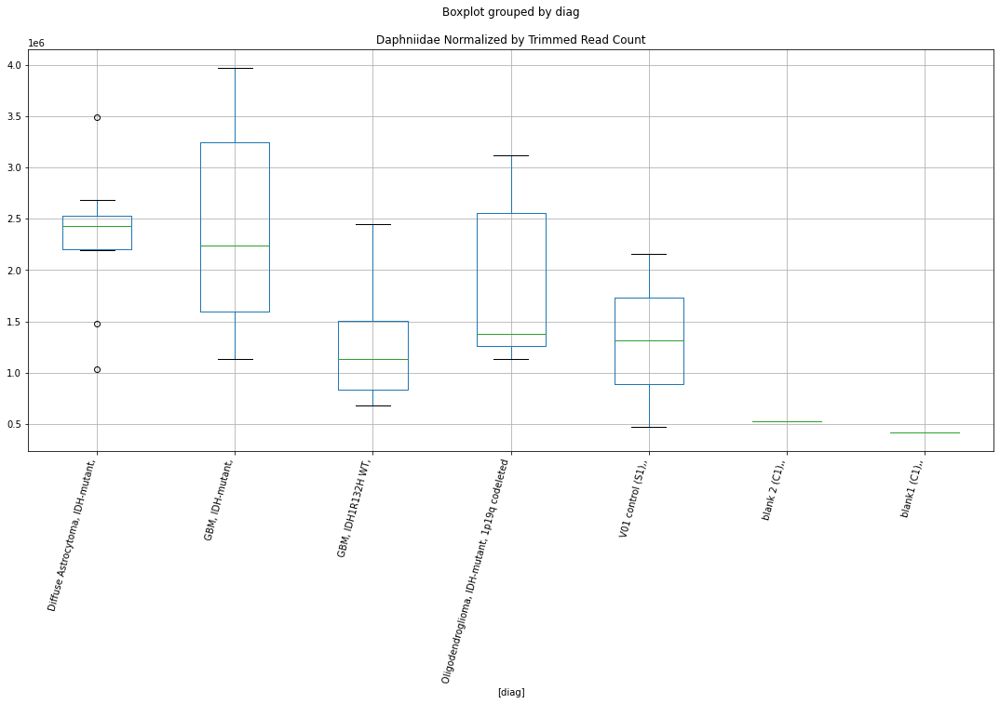

Daphniidae Lexogen cutadapt2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.8350628809727634
	p = 0.010978772559667078
Daphniidae Lexogen cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 3.4813533561567414
	p = 0.002664780722986676
Daphniidae Lexogen cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = 1.7707048759142405
	p = 0.09354292101141146
Daphniidae Lexogen cutadapt2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.8350628809727634
	p = 0.010978772559667078
Daphniidae Lexogen cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -3.4813533561567414
	p = 0.002664780722986676
Daphniidae Lexogen cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.7707048759142405
	p = 0.09354292101141146


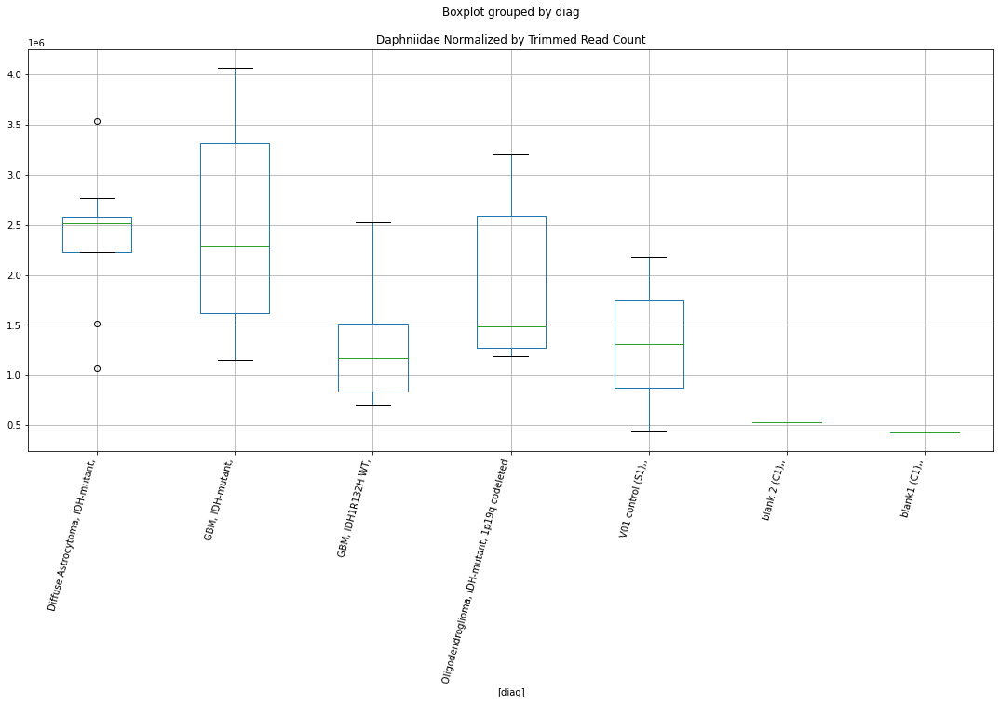

Daphniidae Lexogen cutadapt3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.8407143140308646
	p = 0.010846211614071
Daphniidae Lexogen cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 3.4712034864095784
	p = 0.0027254838587896985
Daphniidae Lexogen cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = 1.7453806777195895
	p = 0.09796564912569627
Daphniidae Lexogen cutadapt3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = -2.8407143140308646
	p = 0.010846211614071
Daphniidae Lexogen cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -3.4712034864095784
	p = 0.0027254838587896985
Daphniidae Lexogen cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = -1.7453806777195895
	p = 0.09796564912569627


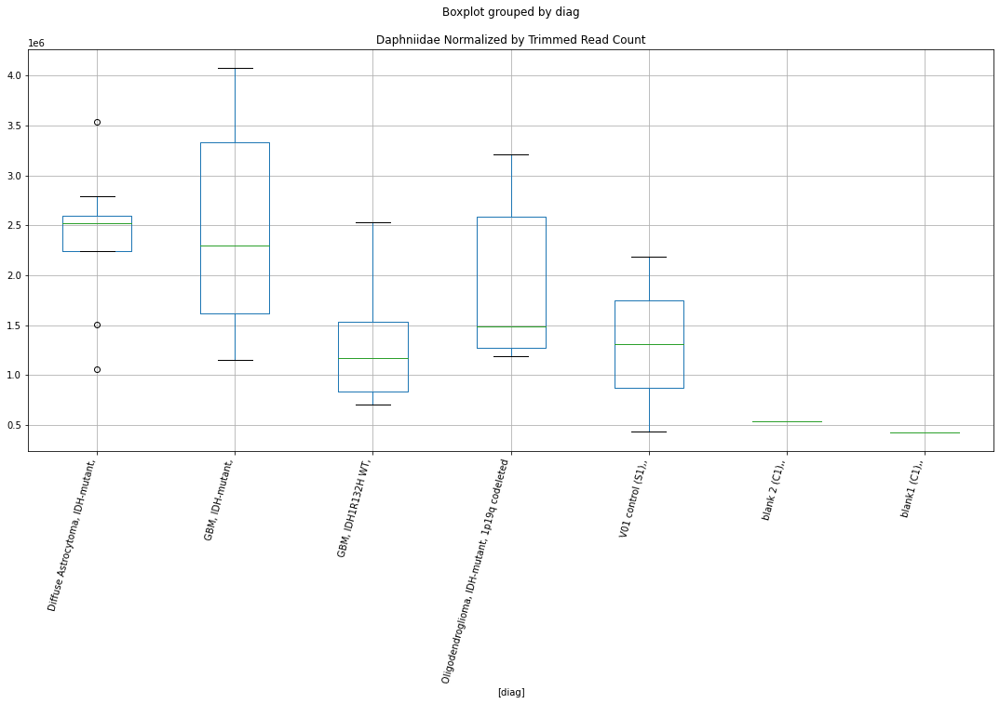

Poaceae D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.7707237158885423
	p = 0.09353969641604074
Poaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.7707237158885423
	p = 0.09353969641604074


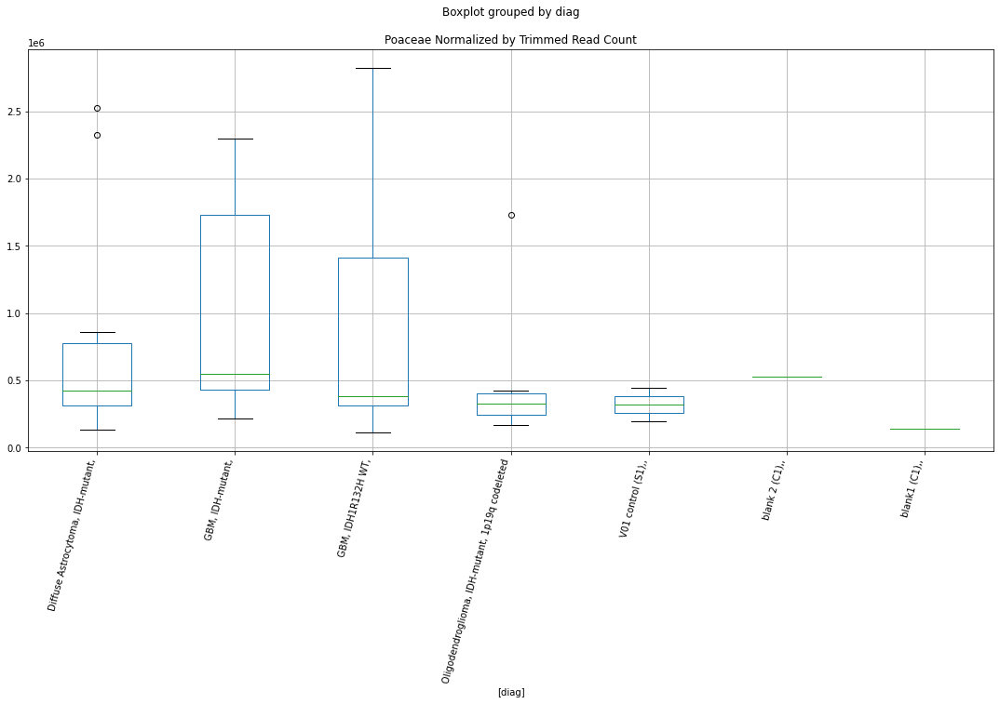

Poaceae D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.7703260150420552
	p = 0.09360778626830639
Poaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.7703260150420552
	p = 0.09360778626830639


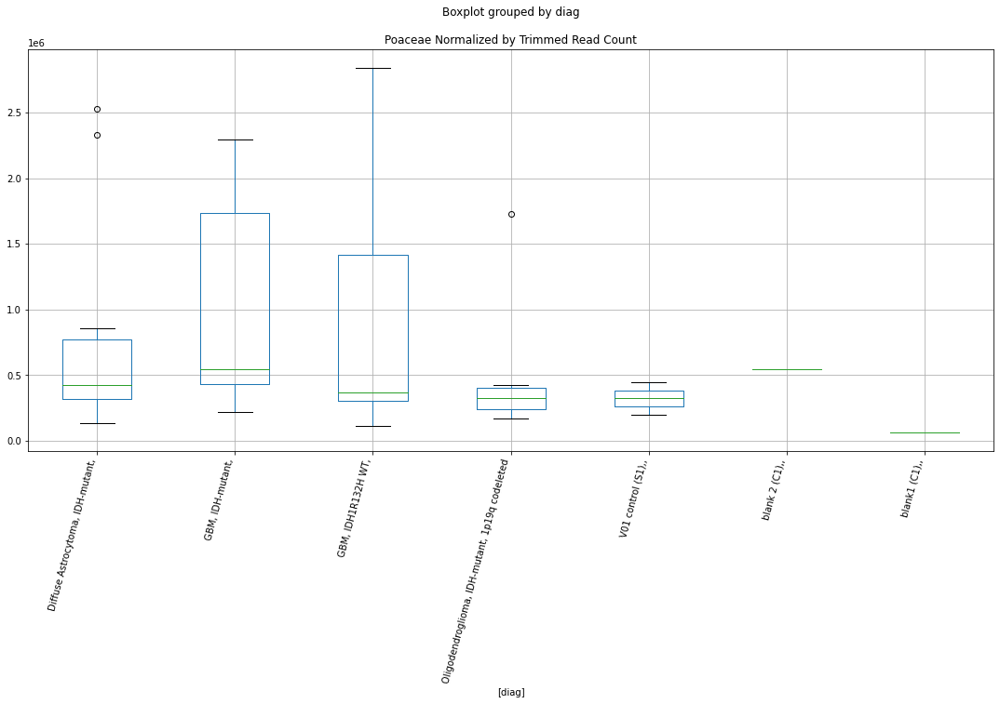

Poaceae D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.7709003277157254
	p = 0.09350947274983129
Poaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.7709003277157254
	p = 0.09350947274983129


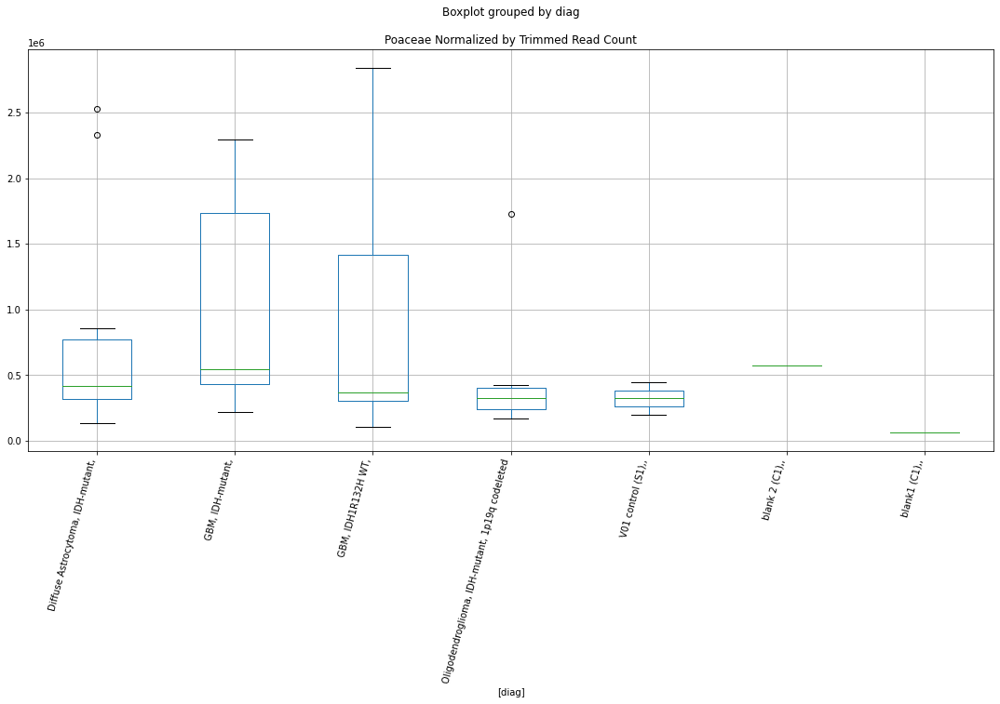

Rhodospirillaceae D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 1.8321783263112126
	p = 0.08352341260175233
Rhodospirillaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -1.8321783263112126
	p = 0.08352341260175233


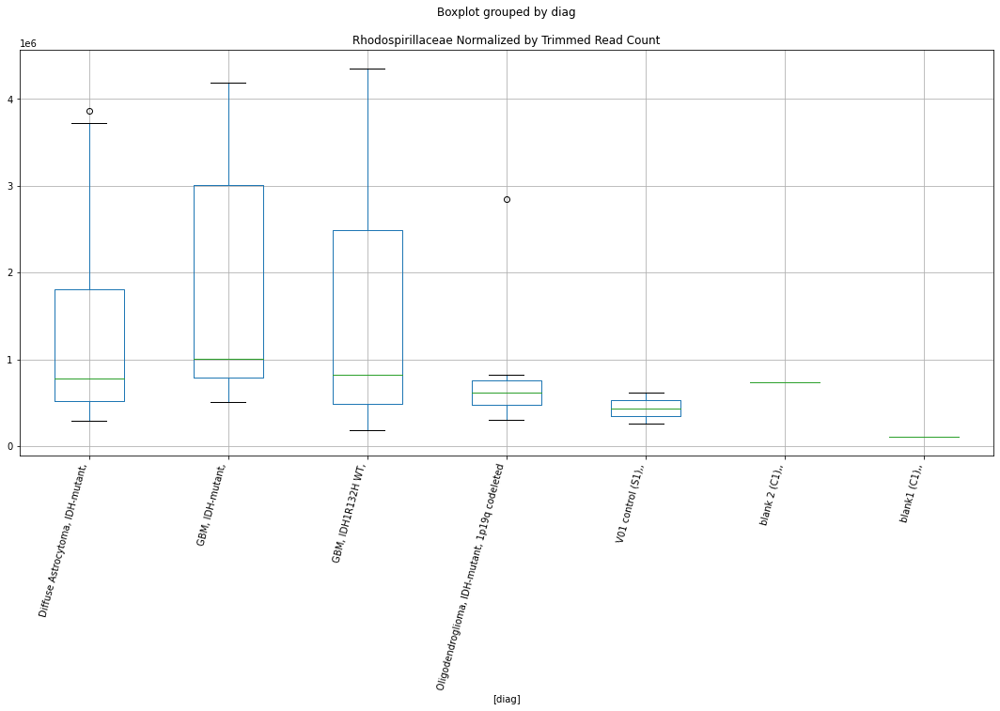

Rhodospirillaceae D-plex cutadapt1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0133711110046257
	p = 0.05927571454756084
Rhodospirillaceae D-plex cutadapt1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0133711110046257
	p = 0.05927571454756084


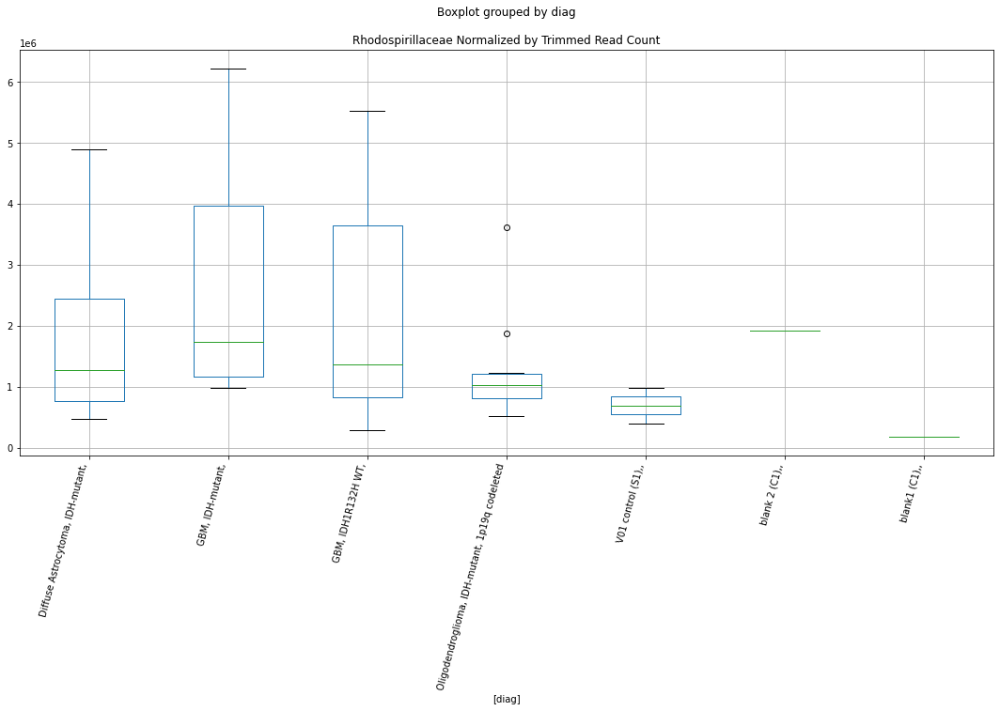

Rhodospirillaceae D-plex cutadapt2 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.0136140645887664
	p = 0.05924795803692345
Rhodospirillaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.0136140645887664
	p = 0.05924795803692345


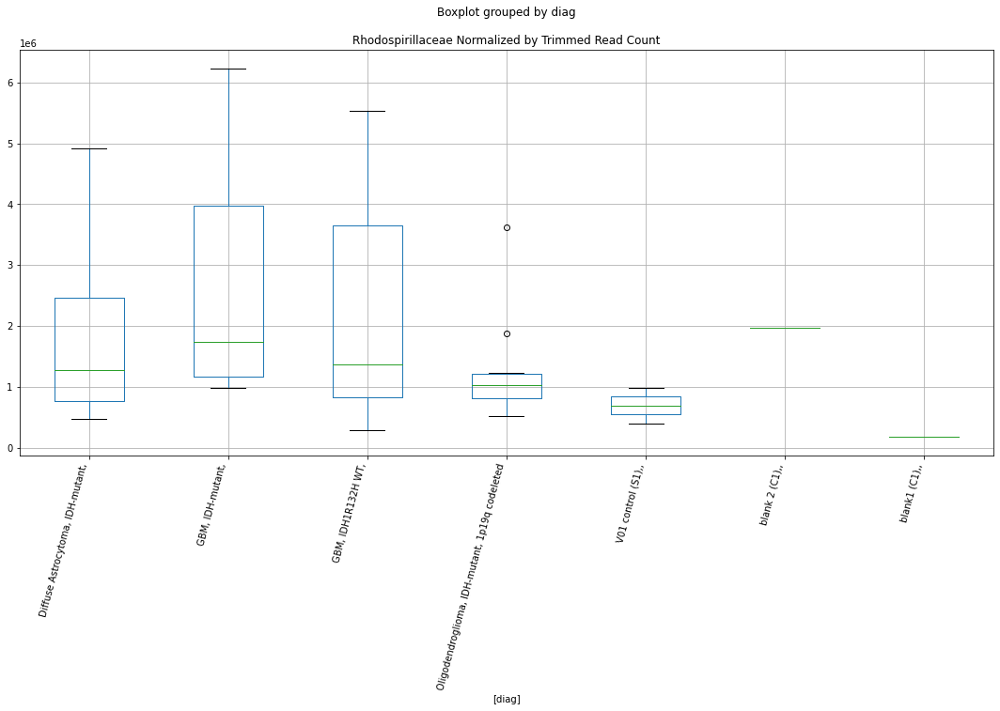

Rhodospirillaceae D-plex cutadapt3 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.013868494434646
	p = 0.059218902944995024
Rhodospirillaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -2.013868494434646
	p = 0.059218902944995024


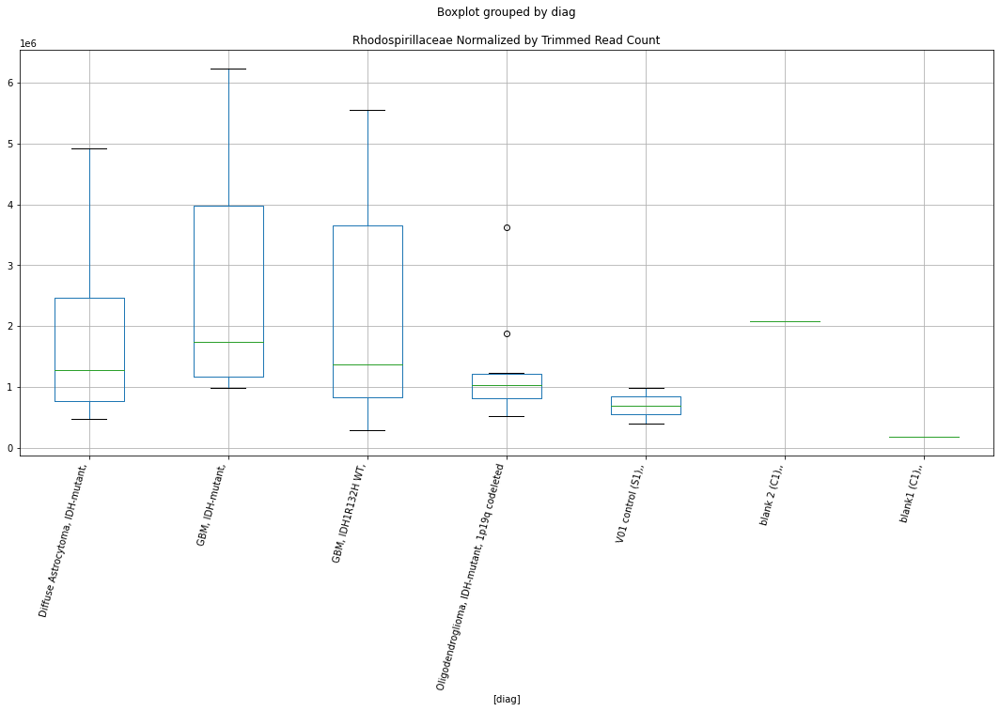

Microviridae D-plex bbduk1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.9810112368147814
	p = 0.06307886513271033
Microviridae D-plex bbduk1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 1.9810112368147814
	p = 0.06307886513271033


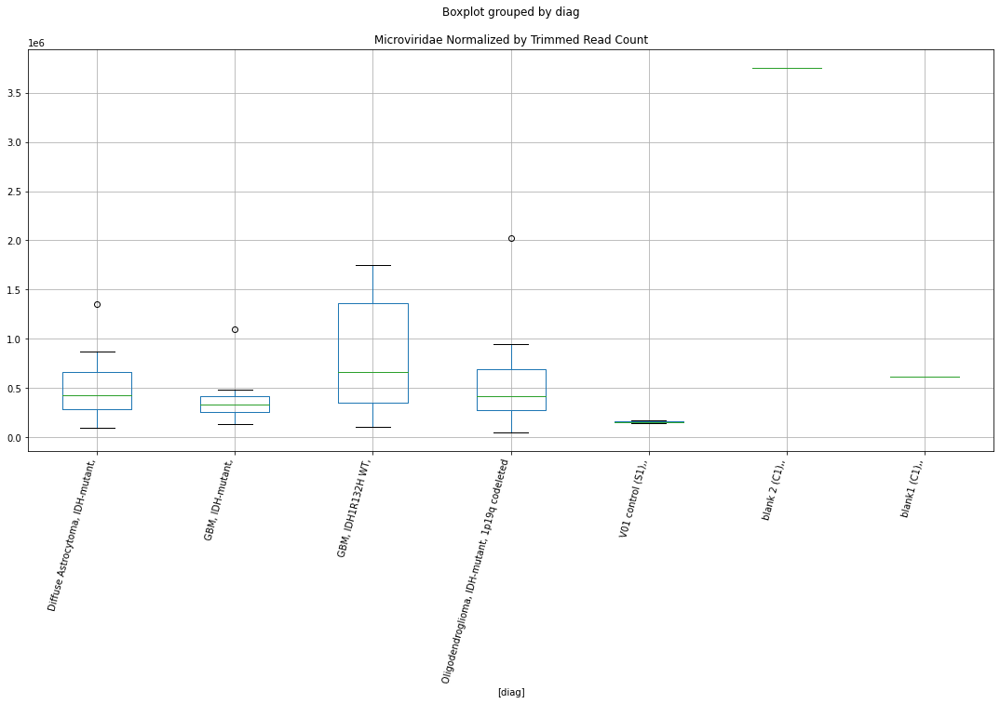

Microviridae D-plex cutadapt1 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.0190279479746938
	p = 0.058632469421531684
Microviridae D-plex cutadapt1 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 2.0190279479746938
	p = 0.058632469421531684


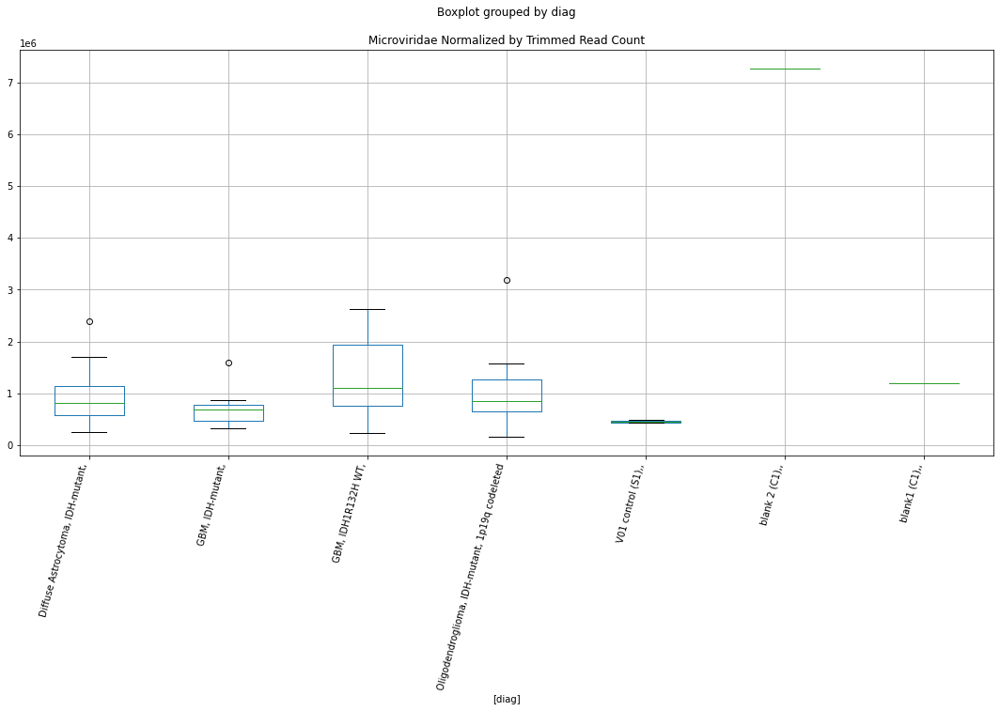

Microviridae D-plex cutadapt2 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.0192432936525786
	p = 0.05860810687013091
Microviridae D-plex cutadapt2 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 2.0192432936525786
	p = 0.05860810687013091


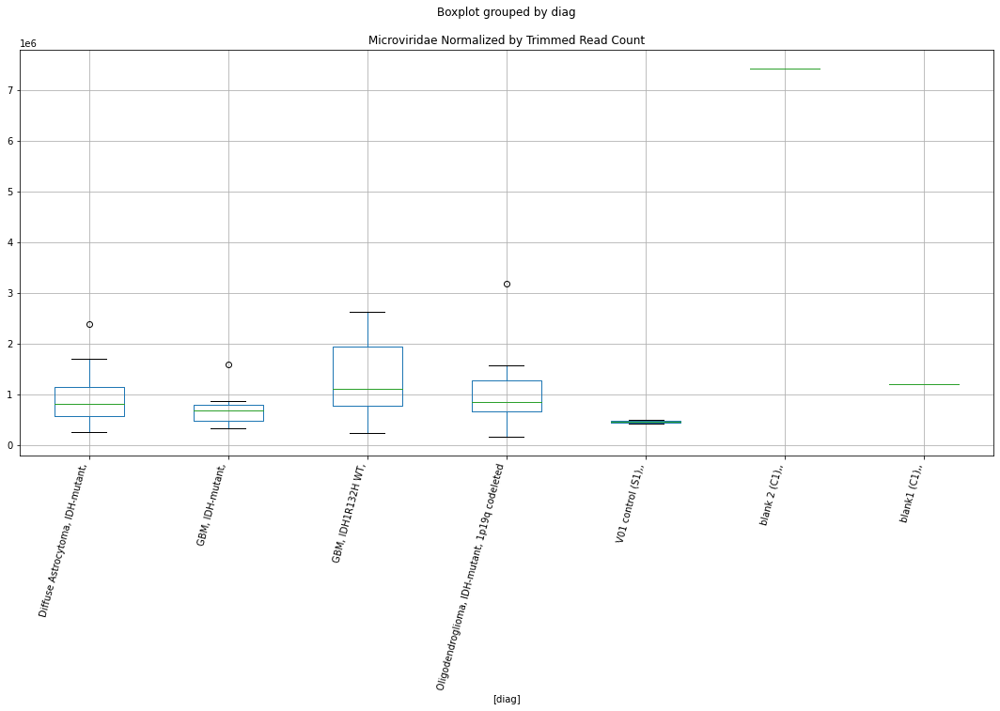

Microviridae D-plex cutadapt3 : GBM, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.019734045883348
	p = 0.05855262099440692
Microviridae D-plex cutadapt3 : GBM, IDH1R132H WT, - GBM, IDH-mutant,
	t = 2.019734045883348
	p = 0.05855262099440692


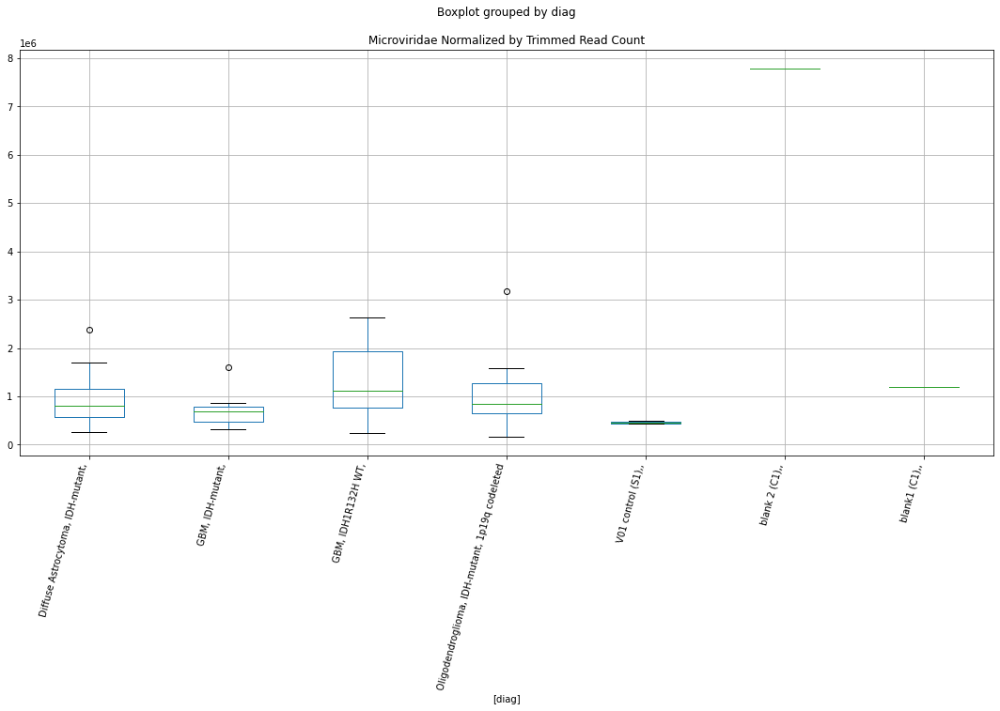

Shewanellaceae D-plex bbduk1 : GBM, IDH-mutant, - Diffuse Astrocytoma, IDH-mutant,
	t = 3.3317855394013938
	p = 0.0037113945382222335
Shewanellaceae D-plex bbduk1 : GBM, IDH-mutant, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 3.398708467222365
	p = 0.003200650957951375
Shewanellaceae D-plex bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH-mutant,
	t = -3.3317855394013938
	p = 0.0037113945382222335
Shewanellaceae D-plex bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.8816502326480509
	p = 0.07615706520871551
Shewanellaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH-mutant,
	t = -3.398708467222365
	p = 0.003200650957951375
Shewanellaceae D-plex bbduk1 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -1.9457913591663953
	p = 0.06746536819188545
Shewanellaceae D-plex bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.8816502326480509
	p = 0.07615706520871551
Shewanellaceae D-ple

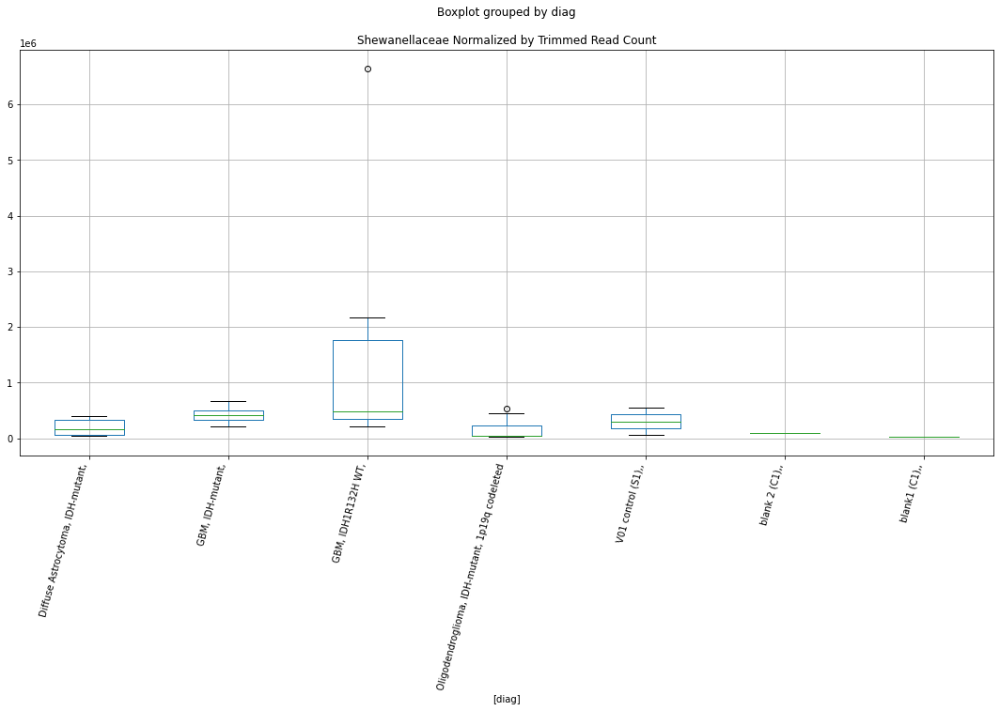

Shewanellaceae D-plex cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -1.885501448123444
	p = 0.07560846054270402
Shewanellaceae D-plex cutadapt2 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.2470638046005864
	p = 0.03741515283331402
Shewanellaceae D-plex cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 1.885501448123444
	p = 0.07560846054270402
Shewanellaceae D-plex cutadapt2 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.2470638046005864
	p = 0.03741515283331402


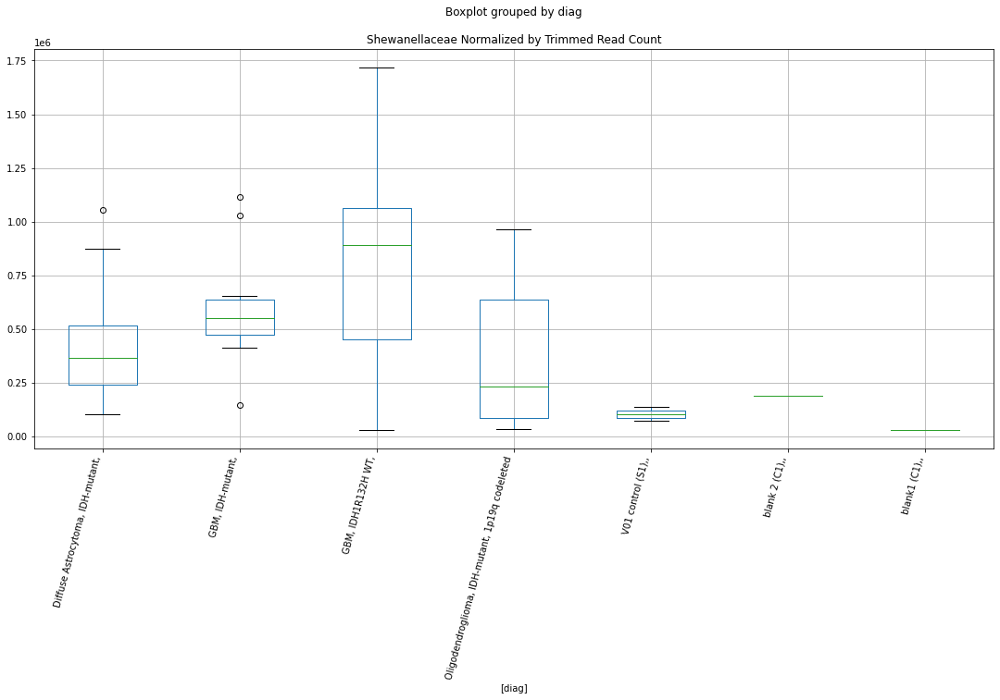

Shewanellaceae D-plex cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = -2.0714380151352065
	p = 0.05296548211950317
Shewanellaceae D-plex cutadapt3 : Oligodendroglioma, IDH-mutant, 1p19q codeleted - GBM, IDH1R132H WT,
	t = -2.450846101068991
	p = 0.024700248685958243
Shewanellaceae D-plex cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = 2.0714380151352065
	p = 0.05296548211950317
Shewanellaceae D-plex cutadapt3 : GBM, IDH1R132H WT, - Oligodendroglioma, IDH-mutant, 1p19q codeleted
	t = 2.450846101068991
	p = 0.024700248685958243


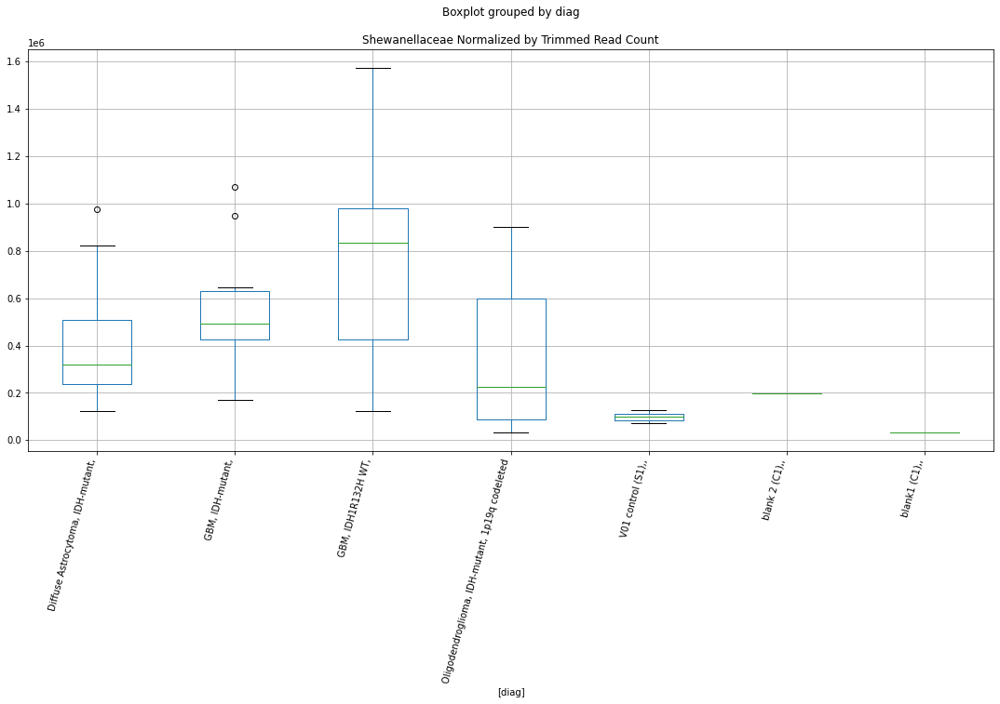

Shewanellaceae Lexogen bbduk1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.155333216366259
	p = 0.04492075846686191
Shewanellaceae Lexogen bbduk1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.155333216366259
	p = 0.04492075846686191


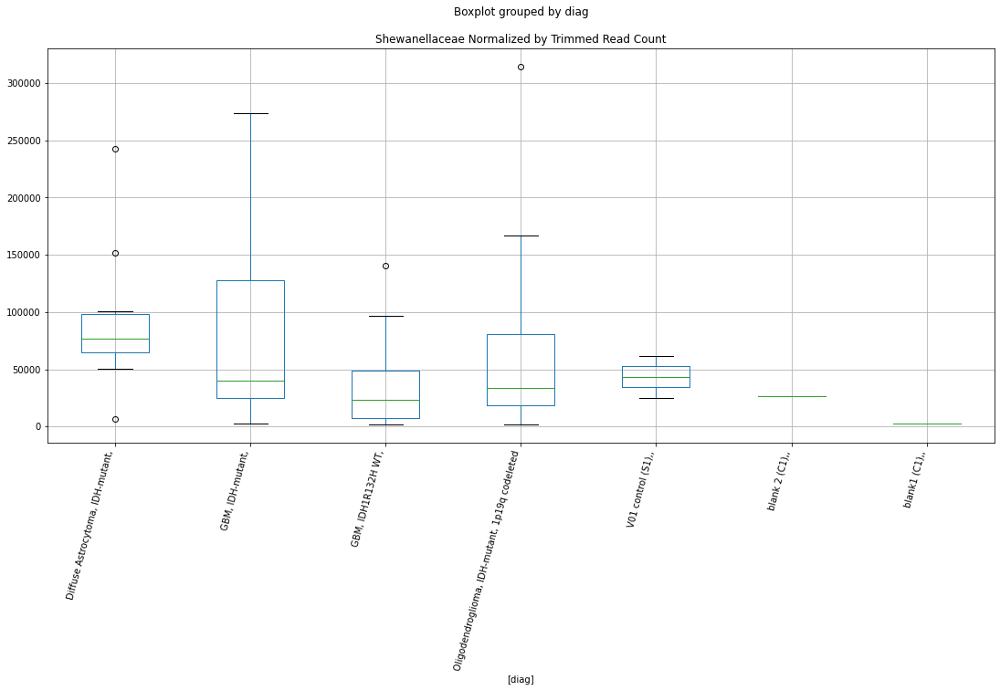

Shewanellaceae Lexogen cutadapt1 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.1101578262766036
	p = 0.04910258505592579
Shewanellaceae Lexogen cutadapt1 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.1101578262766036
	p = 0.04910258505592579


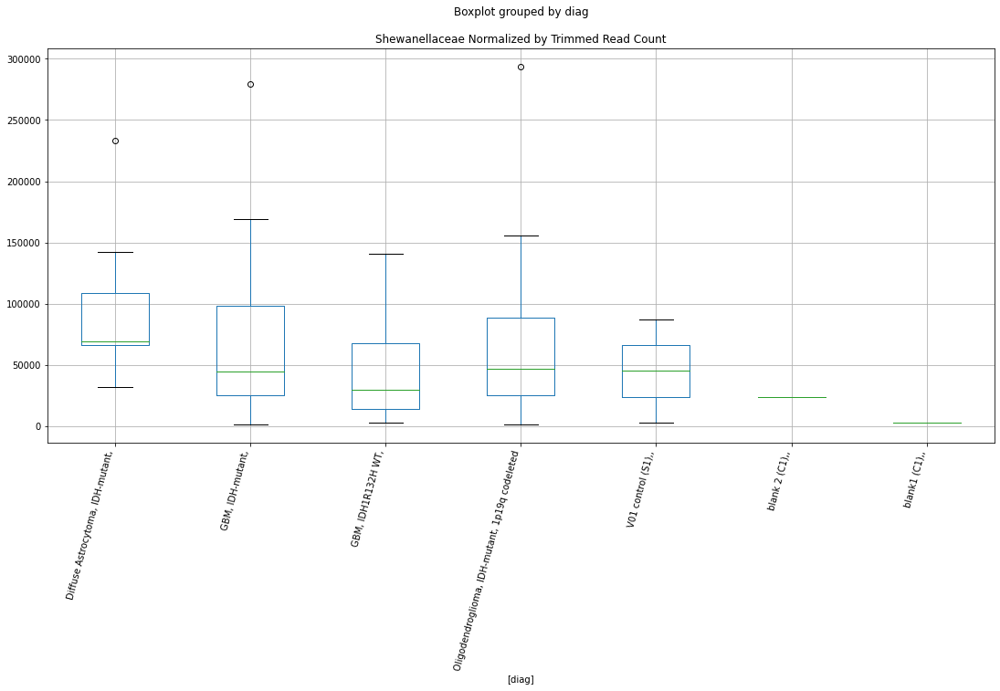

Shewanellaceae Lexogen cutadapt2 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.0067067910013794
	p = 0.060041663386901194
Shewanellaceae Lexogen cutadapt2 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.0067067910013794
	p = 0.060041663386901194


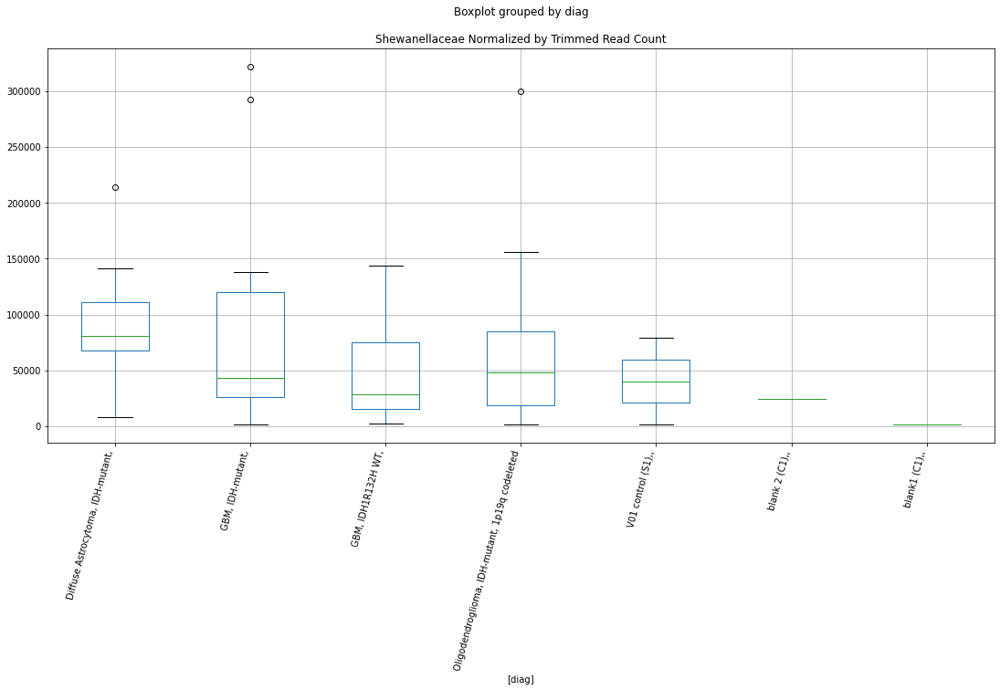

Shewanellaceae Lexogen cutadapt3 : Diffuse Astrocytoma, IDH-mutant, - GBM, IDH1R132H WT,
	t = 2.0808231246640867
	p = 0.05200466921567413
Shewanellaceae Lexogen cutadapt3 : GBM, IDH1R132H WT, - Diffuse Astrocytoma, IDH-mutant,
	t = -2.0808231246640867
	p = 0.05200466921567413


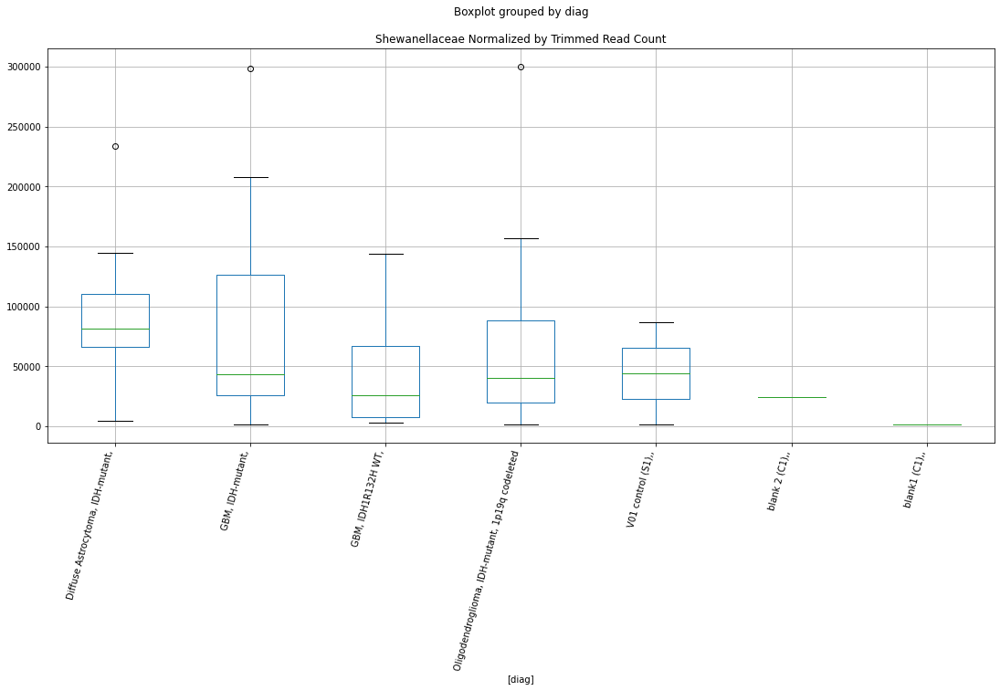

In [63]:
selected=['subject','sample','Lab kit','Trimmer','diag']
for col in families:
    for labkit in "D-plex","Lexogen":
        for trimmer in "bbduk1","bbduk2","bbduk3","cutadapt1","cutadapt2","cutadapt3":
            ps=[]
            for diag in diags:
                others=diags.copy()
                others.remove(diag)
                for other in others:
                    t, p = stats.ttest_ind(
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==diag))][col],
                        dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer) & 
                            (dfn["diag"]==other))][col])
                    if p < 0.10:
                        print(col+" "+labkit+" "+trimmer+" : "+diag+" - "+other)
                        print("\tt = " + str(t))
                        print("\tp = " + str(p))
                    ps=np.append(ps,p)
            if(any(p < 0.10 for p in ps)):
                selected=np.append(selected,col)
                dfn[((dfn["Lab kit"]==labkit) & (dfn["Trimmer"]==trimmer))].boxplot(column=col,by=['diag'])
                plt.title(col + " Normalized by Trimmed Read Count")
                plt.xticks(rotation=75,ha='right')
                plt.show()
selected=np.unique(selected)


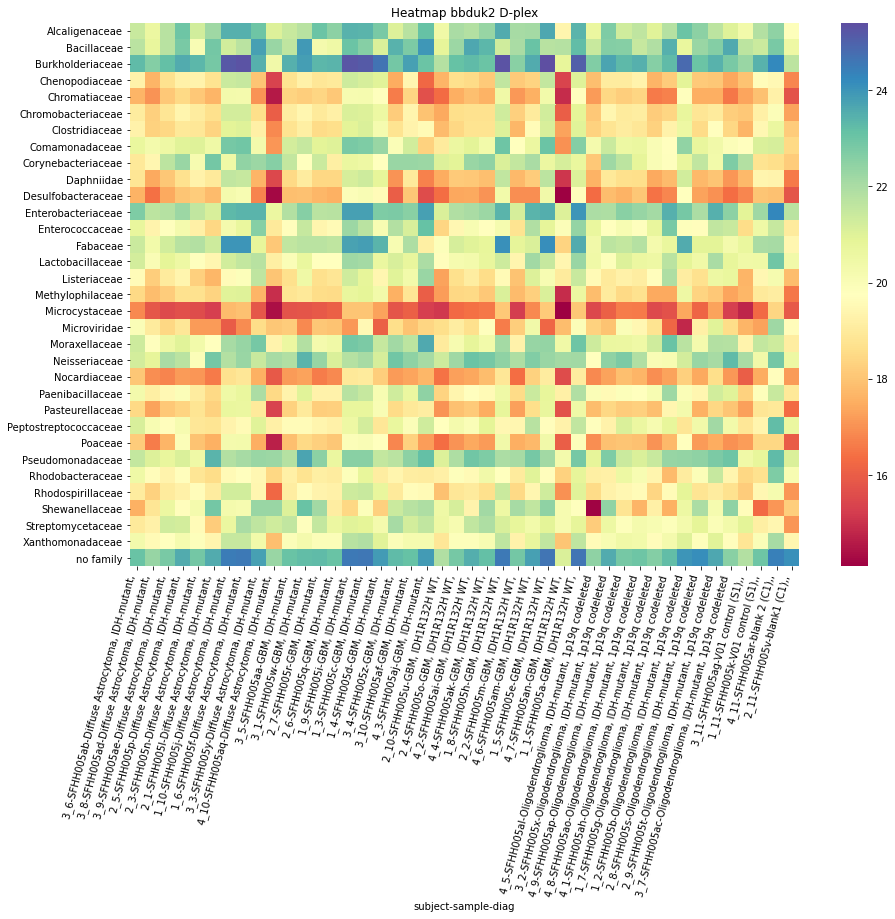

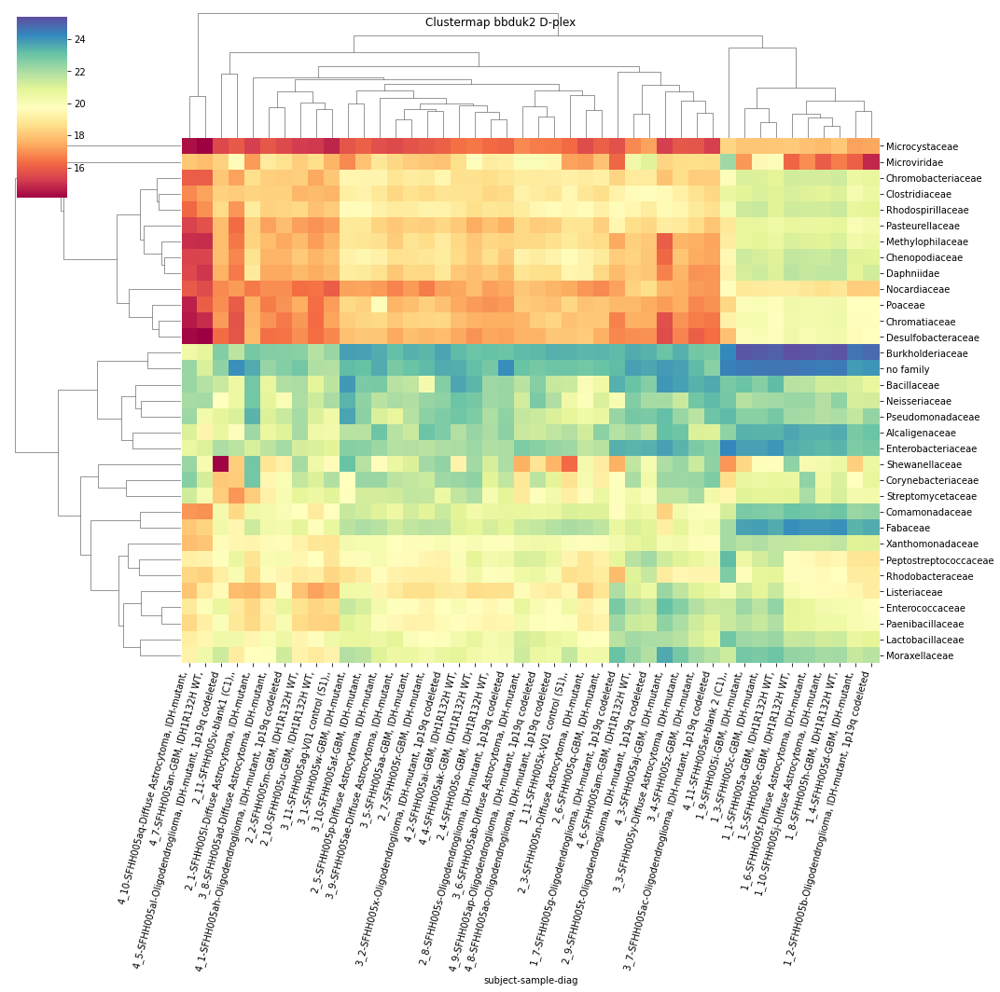

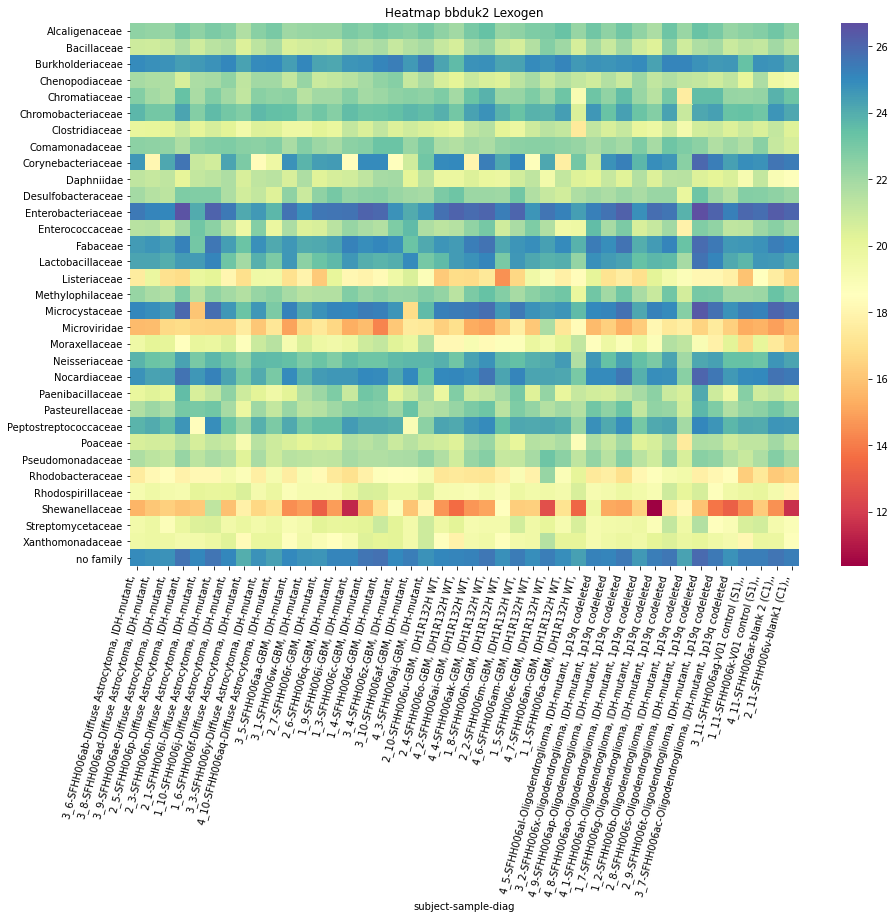

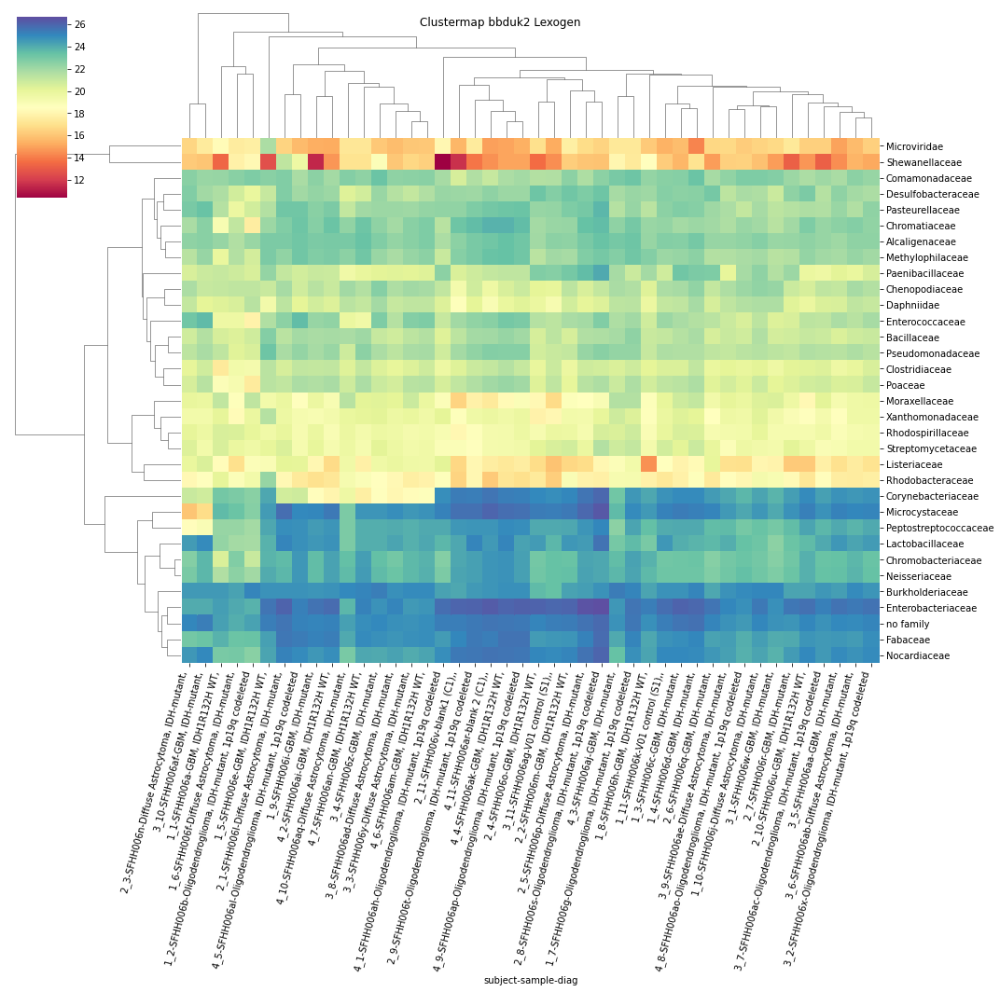

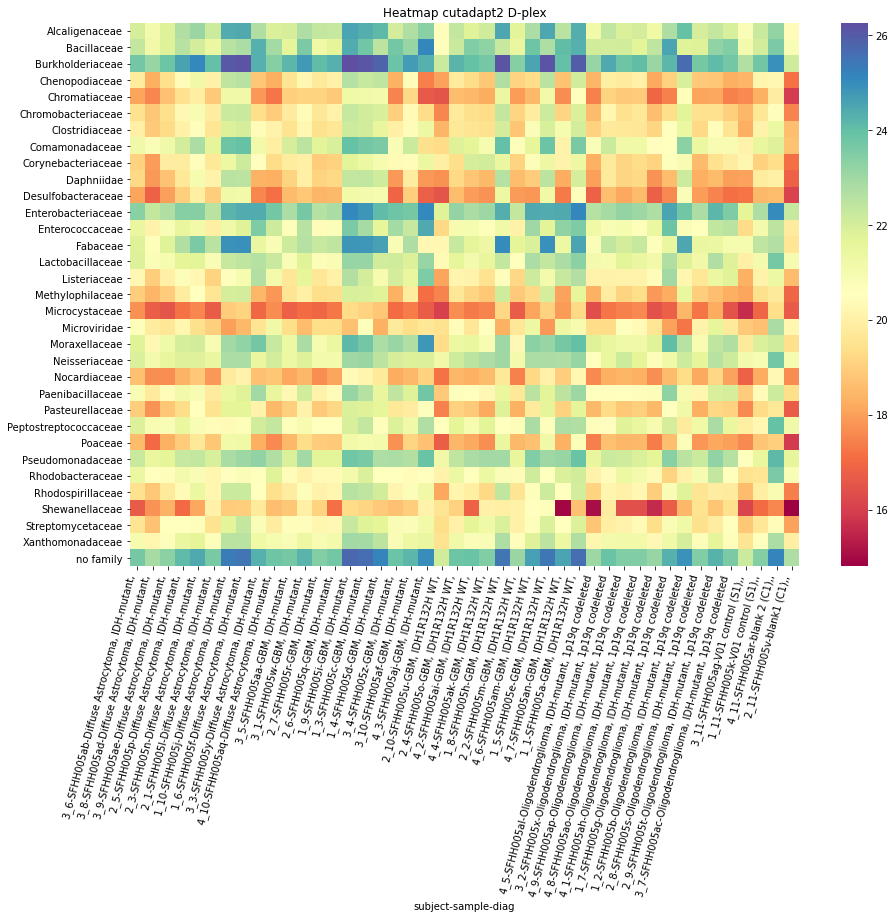

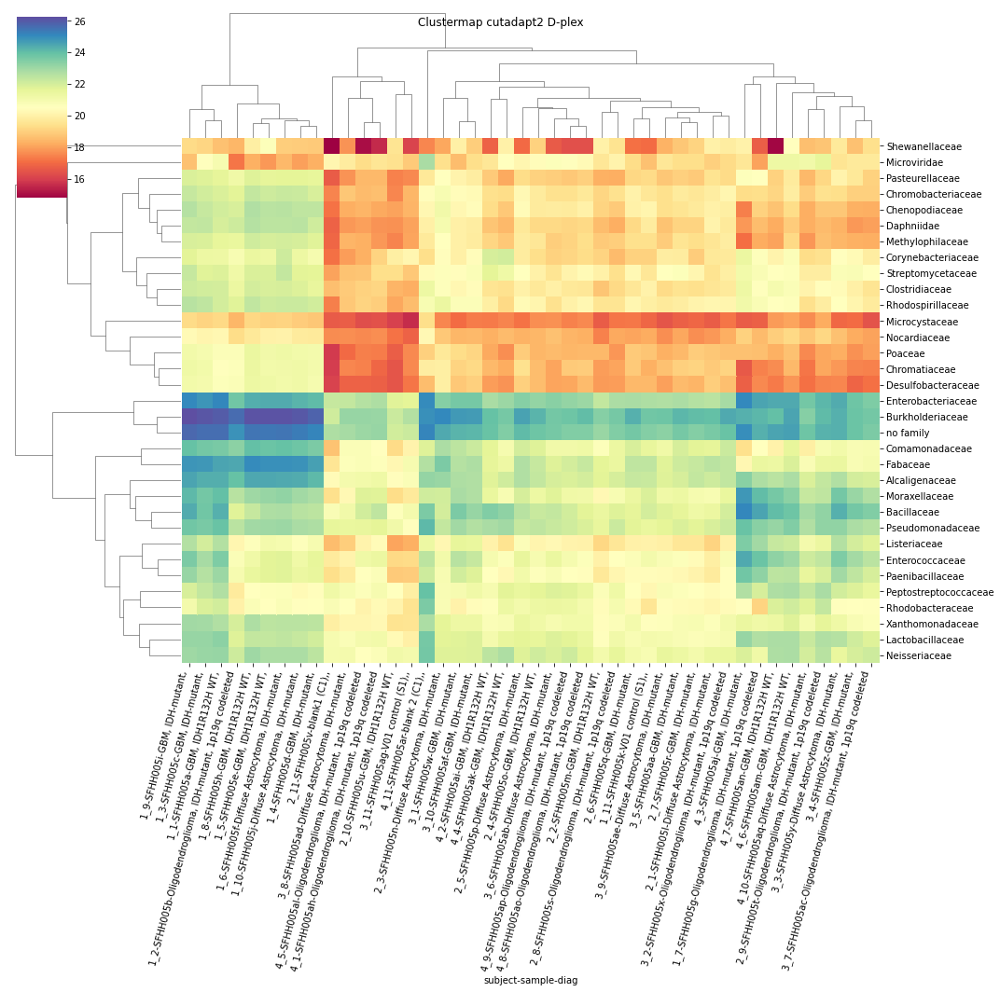

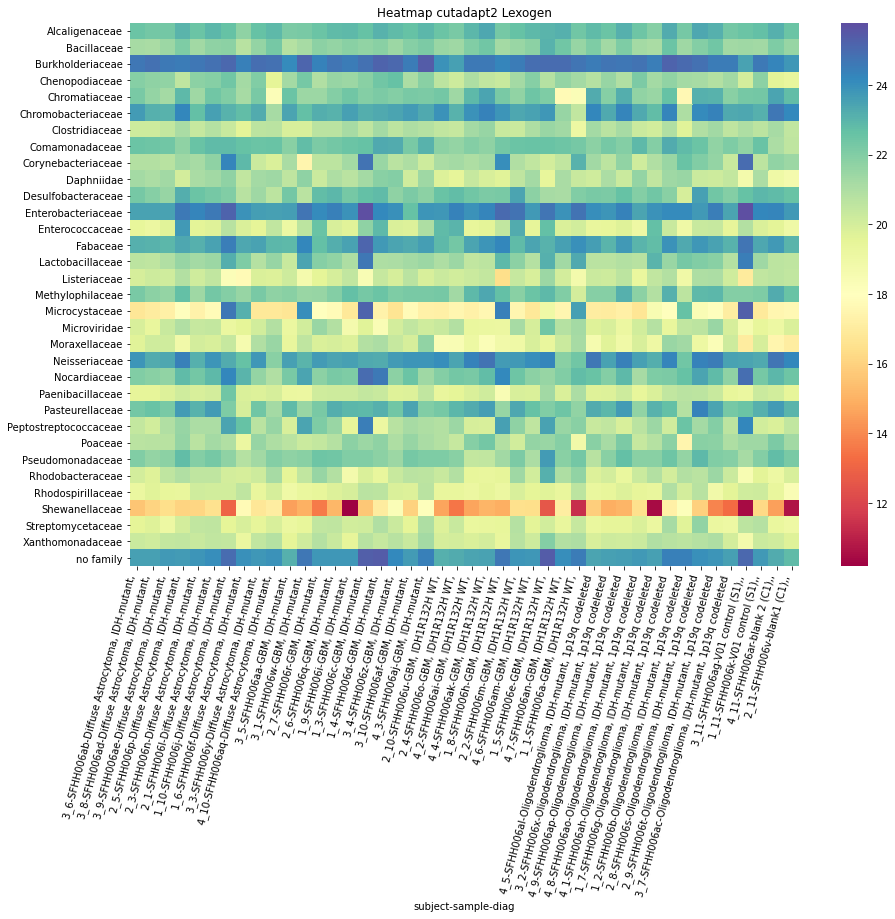

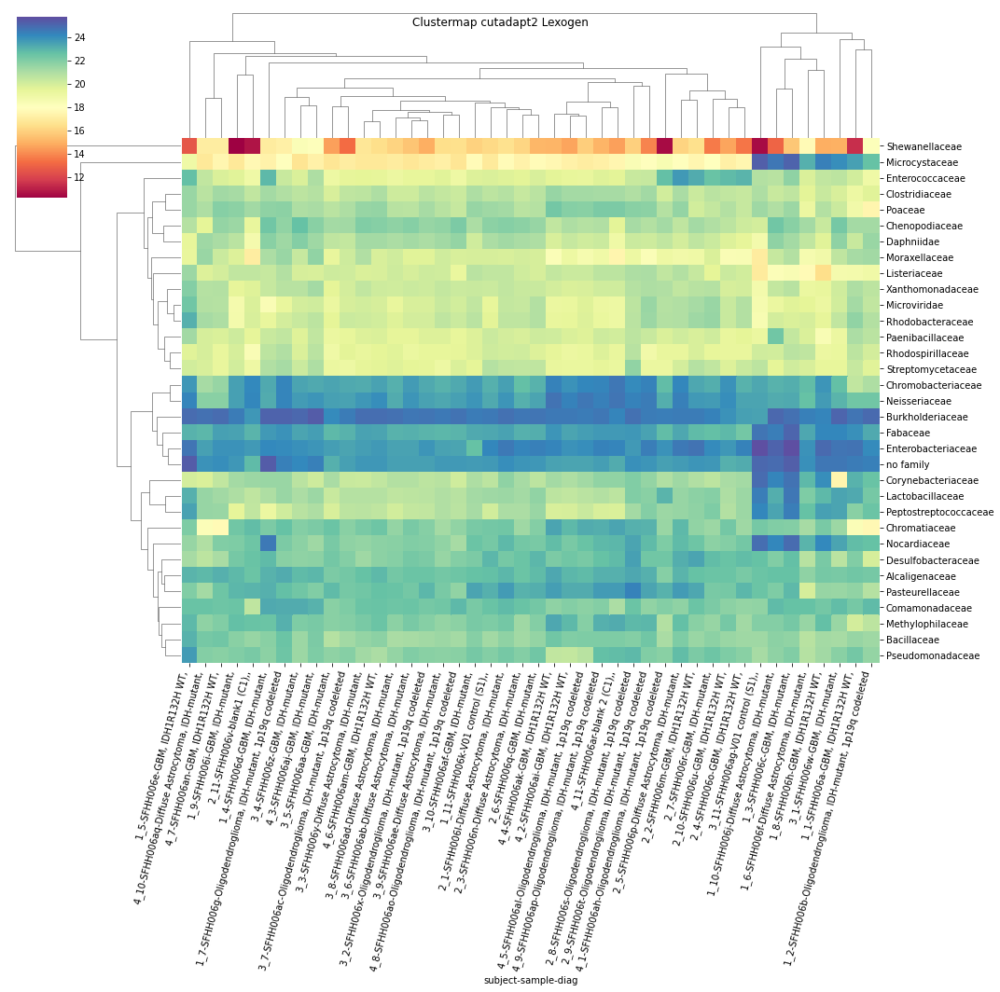

In [64]:
#for trimmer in dfn['Trimmer'].unique():
for trimmer in 'bbduk2','cutadapt2':
    for labkit in dfn['Lab kit'].unique():
        tmp=dfn[selected]
        tmp=tmp[(tmp['Trimmer']==trimmer) & (tmp['Lab kit']==labkit)]
        tmp=tmp.drop('Trimmer',axis='columns')
        tmp=tmp.drop('Lab kit',axis='columns')
        tmp.set_index(['subject','sample','diag'],inplace=True)
        tmp=tmp.transform(lambda x: np.log2(x))
        tmp=tmp.fillna(0).sort_values(['diag']).T
        plt.subplots(figsize=(15,10))
        sns.heatmap(tmp,cmap="Spectral")
        plt.xticks(rotation=75,ha='right')
        plt.title("Heatmap "+trimmer+" "+labkit)
        plt.show()
        g=sns.clustermap(tmp,mask=False,figsize=(15,15),cmap="Spectral")
        g.fig.suptitle("Clustermap "+trimmer+" "+labkit)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')
        plt.show()

In [65]:
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [66]:
pd.set_option('display.max_columns', default_max_columns)

In [67]:
pd.set_option('display.max_rows',default_max_rows)

In [68]:
pd.set_option('display.precision', default_precision)